# Library yang Dibutuhkan

In [ ]:
!pip install xarray rasterio geopandas pykrige matplotlib netCDF4
!pip install scikit-gstat
!pip install -U scikit-learn
!pip install rioxarray
!pip install geemap
!pip install gdal
!pip install pykrige
!pip install cartopy


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 25.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 979.6/979.6 kB 28.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.3/9.3 MB 42.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 33.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 708.6/708.6 kB 14.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.2/62.2 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 40.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.7/11.7 MB 57.8 MB/s eta 0:00:00


In [ ]:
import xarray as xr
import rioxarray
import numpy as np
import pandas as pd
import os
import rasterio
import geopandas as gpd
import matplotlib.pyplot as plt
import geemap
import geemap.foliumap as eefolium
import warnings # Import the warnings module
warnings.filterwarnings('ignore')
import ee
import seaborn as sns

from pykrige.ok import OrdinaryKriging
from skgstat import Variogram
from google.colab import drive
from sklearn.preprocessing import MinMaxScaler
from osgeo import gdal # gdal is imported here.
from rasterio.transform import from_origin
from pykrige.ok import OrdinaryKriging
from scipy.interpolate import Rbf
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from shapely.geometry import Point


drive.mount('/content/drive')

print("Setup completed")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Setup completed


In [ ]:
!pip install geemap
!pip install pycrs
!pip install optuna
!pip install lightgbm
!pip install rioxarray
!pip install xarray rasterio geopandas pykrige matplotlib
!pip install scikit-gstat
!pip install -U scikit-learn
!pip install gdal
!pip install cartopy

  Preparing metadata (setup.py) ... done
  Created wheel for pycrs: filename=PyCRS-1.0.2-py3-none-any.whl size=32686 sha256=edb996ff569e320e458b207b28e0a8ad97fe76a3738b929dab08e99af8160303
  Stored in directory: /root/.cache/pip/wheels/5f/ad/a3/183ed754d7698fc15a2eb153705e05d05a0d97f3331293ce48
Successfully built pycrs
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 386.6/386.6 kB 10.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 242.5/242.5 kB 18.4 MB/s eta 0:00:00


In [ ]:
# Import packages
import ee
import geemap
import geemap.foliumap as eefolium
import xarray as xr
import numpy as np
import pandas as pd
import seaborn as sns
import geopandas as gpd
import matplotlib.pyplot as plt
import rasterio
import lightgbm as lgb
import optuna
import os
import rioxarray as rxr
from IPython.display import display, Image
import matplotlib.dates as mdates
from pykrige.ok import OrdinaryKriging
from shapely.geometry import Point
from rasterio.features import rasterize
from rasterio.transform import from_origin
from rasterio.plot import show
from scipy.ndimage import zoom
from rasterio import features
from scipy.interpolate import griddata
from rasterio.enums import Resampling
from rasterio.warp import calculate_default_transform, reproject
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from skimage.transform import resize
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from lightgbm import LGBMRegressor
from sklearn.model_selection import cross_validate, KFold
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score ,mean_absolute_percentage_error
import warnings # Import the warnings module
warnings.filterwarnings('ignore')
from skgstat import Variogram
from osgeo import gdal
from shapely.geometry import Point

# EVI (done)

In [ ]:
# Melakukan autentikasi dan mendefinisikan Google Cloud Project yang akan digunakan
ee.Authenticate()
ee.Initialize(project='ee-sidangapril2024')

AOI = ee.FeatureCollection("projects/ee-sidangapril2024/assets/JABODETABEK")
#AOI= ee.FeatureCollection("projects/ee-sidangapril2024/assets/DKI_JAKARTA")
Map.addLayer(AOI, {}, "AOI")
Map.centerObject(AOI, 8)


Map = geemap.Map()
Map

Map(center=[0, 0], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDataGUI(childr…

In [ ]:
# -----------
# PENGUNDUHAN
#------------


# 1. Parameter & Konfigurasi
# -------------------------------

# Dataset MODIS EVI (MOD13A2 - 16-harian, resolusi 1 km)
EVI_collection = ee.ImageCollection("MODIS/061/MOD13A2")

# Tahun dan bulan target
years = list(range(2022, 2025))  # 2022–2024
months = list(range(1, 13))

# 2. Buat EVI Rata-rata Bulanan
# -------------------------------
EVI_monthly_images = []

for y in years:
    for m in months:
        # Filter koleksi untuk tahun dan bulan
        filtered = EVI_collection \
            .filter(ee.Filter.calendarRange(y, y, 'year')) \
            .filter(ee.Filter.calendarRange(m, m, 'month'))

        # Hitung rata-rata dan konversi EVI (skala asli: 0.0001)
        monthly_evi = filtered.select('EVI') \
            .mean() \
            .multiply(0.0001) \
            .rename('EVI') \
            .clip(AOI) \
            .set('year', y) \
            .set('month', m) \
            .set('system:time_start', ee.Date.fromYMD(y, m, 1)) \
            .set('label', f"EVI_{y:04d}_{m:02d}")

        EVI_monthly_images.append(monthly_evi)
        print(f"Processed: {monthly_evi.get('label').getInfo()}")


# Tampilkan salah satu bulan (misalnya Januari 2023)
sample_image = next(img for img in EVI_monthly_images if img.get('label').getInfo() == "EVI_2023_01")

Map = geemap.Map(center=[-6.2, 106.85], zoom=9)  # Jakarta
Map.addLayer(sample_image, {
    'min': 0,
    'max': 1,
    'palette': ['ffffff', 'ccebc5', '7bccc4', '2b8cbe', '00441b']
}, 'EVI Jan 2023')
Map.addLayer(AOI, {}, 'AOI')
Map.add_colorbar(vis_params={
    'min': 0,
    'max': 1,
    'palette': ['ffffff', 'ccebc5', '7bccc4', '2b8cbe', '00441b']
}, label='EVI')

Map

Processed: EVI_2022_01
Processed: EVI_2022_02
Processed: EVI_2022_03
Processed: EVI_2022_04
Processed: EVI_2022_05
Processed: EVI_2022_06
Processed: EVI_2022_07
Processed: EVI_2022_08
Processed: EVI_2022_09
Processed: EVI_2022_10
Processed: EVI_2022_11
Processed: EVI_2022_12
Processed: EVI_2023_01
Processed: EVI_2023_02
Processed: EVI_2023_03
Processed: EVI_2023_04
Processed: EVI_2023_05
Processed: EVI_2023_06
Processed: EVI_2023_07
Processed: EVI_2023_08
Processed: EVI_2023_09
Processed: EVI_2023_10
Processed: EVI_2023_11
Processed: EVI_2023_12
Processed: EVI_2024_01
Processed: EVI_2024_02
Processed: EVI_2024_03
Processed: EVI_2024_04
Processed: EVI_2024_05
Processed: EVI_2024_06
Processed: EVI_2024_07
Processed: EVI_2024_08
Processed: EVI_2024_09
Processed: EVI_2024_10
Processed: EVI_2024_11
Processed: EVI_2024_12


Map(center=[-6.2, 106.85], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDataGU…

In [ ]:
# -------------------------------
# PENYIMPANAN
# -------------------------------
for image in EVI_monthly_images:
    label = image.get('label').getInfo()
    task = ee.batch.Export.image.toDrive(
        image=image,
        description=label,
        folder='MODIS_EVI_Monthly',
        fileNamePrefix=label,
        scale=1000,
        region=AOI,
        crs='EPSG:32748',  # Sesuaikan dengan lokasi (misalnya UTM zona Indonesia)
        maxPixels=1e13
    )
    task.start()
    print(f"Tugas ekspor '{label}' telah dimulai.")

In [ ]:
# -------------------------------
# MELIHAT MISSING VALUE
# -------------------------------

def add_valid_ratio(image):

    band_name = 'EVI'  # Ganti dengan nama band yang sesuai

    # Mask menunjukkan piksel valid
    mask = image.mask().gt(0)

    # Hitung luas area valid (m²)
    valid_area_image = mask.multiply(ee.Image.pixelArea())
    area_stats = valid_area_image.reduceRegion(
        reducer=ee.Reducer.sum(),
        geometry=AOI.geometry(),  # jika AOI berupa FeatureCollection
        scale=1000,
        maxPixels=1e13
    )

    # Luas valid & total AOI
    valid_area = ee.Number(area_stats.get(band_name))
    total_area = AOI.geometry().area()

    # Rasio valid dan missing
    valid_ratio = valid_area.divide(total_area)
    missing_ratio = ee.Number(1.0).subtract(valid_ratio)

    # Tambahkan ke metadata image
    image = image.set('valid_ratio', valid_ratio)
    image = image.set('missing_ratio', missing_ratio.multiply(100))  # dalam persen
    return image

EVI_with_ratios = ee.ImageCollection(EVI_monthly_images).map(add_valid_ratio)

def image_to_feature(image):
    return ee.Feature(None, {
        'label': image.get('label'),
        'valid_ratio': image.get('valid_ratio'),
        'missing_ratio_percent': image.get('missing_ratio'),
    })

# Ubah ke FeatureCollection
missing_ratio_fc = EVI_with_ratios.map(image_to_feature)

# Tampilkan hasil di konsol
print(missing_ratio_fc.aggregate_array('label').getInfo())
print(missing_ratio_fc.aggregate_array('missing_ratio_percent').getInfo())


['EVI_2022_01', 'EVI_2022_02', 'EVI_2022_03', 'EVI_2022_04', 'EVI_2022_05', 'EVI_2022_06', 'EVI_2022_07', 'EVI_2022_08', 'EVI_2022_09', 'EVI_2022_10', 'EVI_2022_11', 'EVI_2022_12', 'EVI_2023_01', 'EVI_2023_02', 'EVI_2023_03', 'EVI_2023_04', 'EVI_2023_05', 'EVI_2023_06', 'EVI_2023_07', 'EVI_2023_08', 'EVI_2023_09', 'EVI_2023_10', 'EVI_2023_11', 'EVI_2023_12', 'EVI_2024_01', 'EVI_2024_02', 'EVI_2024_03', 'EVI_2024_04', 'EVI_2024_05', 'EVI_2024_06', 'EVI_2024_07', 'EVI_2024_08', 'EVI_2024_09', 'EVI_2024_10', 'EVI_2024_11', 'EVI_2024_12']
[2.7916601216823156, 2.725908484916606, 2.792173818147625, 2.755007919569563, 2.79546655086621, 2.741706192285631, 2.650897383341322, 2.7925707383291254, 2.6996040220972572, 3.1077915933217404, 2.8197372946210497, 2.818423072931575, 2.7920573101420487, 2.8124540843122214, 2.8397933800210384, 2.7551737248790897, 2.7192615989252045, 2.6965856511674935, 2.730340703914025, 2.7733612893362736, 2.737557802245094, 2.991356066652373, 2.8241074947991995, 2.7540991

In [ ]:
from scipy.ndimage import median_filter


In [ ]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import glob
import os

# Path input dan output
input_folder = "/content/drive/MyDrive/path/to/your/tifs"
output_path = "/content/drive/MyDrive/path/to/output/stacked.tif"

# Ambil semua file .tif dan urutkan
tif_files = sorted(glob.glob(os.path.join(input_folder, "*.tif")))

# Stack array
arrays = []
meta = None
for i, file in enumerate(tif_files):
    with rasterio.open(file) as src:
        if meta is None:
            meta = src.meta.copy()
        arrays.append(src.read(1))  # hanya ambil band pertama

# Stack ke array 3D (bands, height, width)
stacked_array = np.stack(arrays, axis=0)

# Update metadata untuk multi-band
meta.update({
    "count": len(arrays)
})

# Simpan ke file output
with rasterio.open(output_path, "w", **meta) as dst:
    dst.write(stacked_array)

print(f"✅ File berhasil di-stack dan disimpan ke: {output_path}")

# --- Informasi Data ---
print("📊 Informasi Raster Stacked:")
print(f"Jumlah Band (misal jumlah bulan): {stacked_array.shape[0]}")
print(f"Tinggi x Lebar per band: {stacked_array.shape[1]} x {stacked_array.shape[2]}")
print(f"Resolusi spasial: {meta['transform'][0]} x {abs(meta['transform'][4])}")
print(f"CRS: {meta['crs']}")

# --- Visualisasi Band Pertama, Kedua, Ketiga ---
num_to_show = min(3, stacked_array.shape[0])  # maksimal 3 band ditampilkan
fig, axs = plt.subplots(1, num_to_show, figsize=(15, 5))

for i in range(num_to_show):
    im = axs[i].imshow(stacked_array[i], cmap="viridis")
    axs[i].set_title(f"Band {i+1}")
    plt.colorbar(im, ax=axs[i], fraction=0.046)

plt.suptitle("🖼️ Visualisasi Beberapa Band dari Raster Stacked", fontsize=16)
plt.tight_layout()
plt.show()


In [ ]:
# -------------------------------
# INTERPOLATE MISSING VALUE
# -------------------------------


# Load EVI data (e.g., from MOD11A1)
file_path = '/content/drive/MyDrive/PENGOLAHAN/DATA/LSTEVI-MODIS_22&24/EVIf'

# Check if the file exists
if not os.path.exists(file_path):
    raise FileNotFoundError(f"File not found: {file_path}")

ds = gdal.Open(file_path)
# Check if gdal.Open was successful
if ds is None:
    raise IOError(f"Unable to open file with GDAL: {file_path}")

evi = ds.ReadAsArray().astype(float)
evi[evi == 0] = np.nan


# Get coordinates
x = np.arange(evi.shape[1], dtype=float)
y = np.arange(evi.shape[0], dtype=float)

xv, yv = np.meshgrid(x, y)

# Flatten
x_flat = xv.flatten()
y_flat = yv.flatten()
z_flat = evi.flatten()

# Filter out NaNs
valid = ~np.isnan(z_flat)
x_valid = x_flat[valid]
y_valid = y_flat[valid]
z_valid = z_flat[valid]

# Fit Kriging model
ok = OrdinaryKriging(
    x_valid, y_valid, z_valid,
    variogram_model='gaussian',
    nlags=6,
    weight=True,
    verbose=False,
    enable_plotting=True  # <= Ini penting agar bisa plot variogram!
)

# Interpolate full grid
z_interp, ss = ok.execute('grid', x, y)
z_interp_clamped = np.clip(z_interp, 0, 1)

# Replace NaNs in original with kriged result
evi_filled = np.where(np.isnan(evi), z_interp_clamped, evi)
evi_filled_smooth = median_filter(evi_filled, size=3)


# Visualisasi
fig, ax = plt.subplots(1, 2, figsize=(14, 6))

im1 = ax[0].imshow(evi, cmap='YlGn', vmin=0, vmax=1)
ax[0].set_title('Sebelum Kriging (EVI Banyak NA)')
plt.colorbar(im1, ax=ax[0], label='EVI')

im2 = ax[1].imshow(evi_filled, cmap='YlGn', vmin=0, vmax=1)
ax[1].set_title('Sesudah Kriging (NA Terisi)')
plt.colorbar(im2, ax=ax[1], label='EVI')

plt.tight_layout()
plt.show()

In [ ]:
# -----------------------------------
# INTERPOLATE MISSING VALUE (36 tif)
# ----------------------------------

import os
from glob import glob
import numpy as np
import matplotlib.pyplot as plt
from osgeo import gdal
from pykrige.ok import OrdinaryKriging
from scipy.ndimage import median_filter
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Folder ===
input_folder = '/content/drive/MyDrive/PENGOLAHAN/DATA/LSTEVI-MODIS_22&24/EVI'
output_folder = '/content/drive/MyDrive/PENGOLAHAN/DATA/LSTEVI-MODIS_22&24/EVI/NAN'
os.makedirs(output_folder, exist_ok=True)

# === Ambil semua file .tif ===
file_list = sorted(glob(os.path.join(input_folder, '*.tif')))


# Simpan hasil evaluasi
eval_results = []

# === Loop tiap file ===
for file_path in file_list:
    filename = os.path.basename(file_path)
    print(f"🔄 Memproses: {filename}")

    ds = gdal.Open(file_path)
    if ds is None:
        print(f"❌ Gagal membuka: {file_path}")
        continue

    evi = ds.ReadAsArray().astype(float)
    evi[evi == 0] = np.nan

    x = np.arange(evi.shape[1], dtype=float)
    y = np.arange(evi.shape[0], dtype=float)
    xv, yv = np.meshgrid(x, y)

    x_flat = xv.flatten()
    y_flat = yv.flatten()
    z_flat = evi.flatten()

    valid_mask = ~np.isnan(z_flat)
    if valid_mask.sum() < 10:
        print(f"⚠️ Terlalu banyak missing value: {filename}")
        continue

    x_valid = x_flat[valid_mask]
    y_valid = y_flat[valid_mask]
    z_valid = z_flat[valid_mask]

    # Kriging
    ok = OrdinaryKriging(
        x_valid, y_valid, z_valid,
        variogram_model='gaussian',
        nlags=6,
        verbose=False,
        enable_plotting=False
    )

    z_interp, _ = ok.execute('grid', x, y)
    z_interp_clamped = np.clip(z_interp, 0, 1)

    # Interpolated result
    evi_filled = np.where(np.isnan(evi), z_interp_clamped, evi)
    evi_filled_smooth = median_filter(evi_filled, size=3)

    # Evaluasi hanya di lokasi yang awalnya NaN
    missing_mask = np.isnan(evi)
    interpolated_values = z_interp_clamped[missing_mask]
    filled_values = evi_filled_smooth[missing_mask]

    # Sampling beberapa titik valid ground truth dari sekitar
    sample_mask = ~np.isnan(evi)
    sampled_real = evi[sample_mask]
    sampled_filled = evi_filled_smooth[sample_mask]

    # Evaluasi statistik
    mae = mean_absolute_error(sampled_real, sampled_filled)
    rmse = np.sqrt(mean_squared_error(sampled_real, sampled_filled))
    r2 = r2_score(sampled_real, sampled_filled)
    std_orig = np.nanstd(evi)
    std_interp = np.nanstd(evi_filled_smooth)

    eval_results.append({
        "filename": filename,
        "RMSE": rmse,
        "MAE": mae,
        "R2": r2,
        "Std_Original": std_orig,
        "Std_Filled": std_interp
    })

    # Simpan hasil raster
    driver = gdal.GetDriverByName('GTiff')
    out_path = os.path.join(output_folder, f"kriged_{filename}")
    out_ds = driver.Create(out_path, ds.RasterXSize, ds.RasterYSize, 1, gdal.GDT_Float32)
    out_ds.SetGeoTransform(ds.GetGeoTransform())
    out_ds.SetProjection(ds.GetProjection())
    out_band = out_ds.GetRasterBand(1)
    out_band.WriteArray(evi_filled_smooth)
    out_band.SetNoDataValue(np.nan)
    out_band.FlushCache()

    print(f"✅ Selesai: {filename} → {out_path}")
    print(f"    📊 RMSE={rmse:.4f}, MAE={mae:.4f}, R²={r2:.4f}, Std_Original={std_orig:.4f}, Std_Filled={std_interp:.4f}")

# Simpan hasil evaluasi ke CSV
import pandas as pd
eval_df = pd.DataFrame(eval_results)
eval_csv_path = os.path.join(output_folder, 'evaluasi_interpolasi.csv')
eval_df.to_csv(eval_csv_path, index=False)
print(f"\n📁 Hasil evaluasi disimpan: {eval_csv_path}")



🔄 Memproses: EVI_2022_01.tif
✅ Selesai: EVI_2022_01.tif → /content/drive/MyDrive/PENGOLAHAN/DATA/LSTEVI-MODIS_22&24/EVI/NAN/kriged_EVI_2022_01.tif
    📊 RMSE=0.0494, MAE=0.0339, R²=0.8600, Std_Original=0.1319, Std_Filled=0.1304
🔄 Memproses: EVI_2022_02.tif
✅ Selesai: EVI_2022_02.tif → /content/drive/MyDrive/PENGOLAHAN/DATA/LSTEVI-MODIS_22&24/EVI/NAN/kriged_EVI_2022_02.tif
    📊 RMSE=0.0548, MAE=0.0351, R²=0.8686, Std_Original=0.1510, Std_Filled=0.1404
🔄 Memproses: EVI_2022_03.tif
✅ Selesai: EVI_2022_03.tif → /content/drive/MyDrive/PENGOLAHAN/DATA/LSTEVI-MODIS_22&24/EVI/NAN/kriged_EVI_2022_03.tif
    📊 RMSE=0.0505, MAE=0.0330, R²=0.8967, Std_Original=0.1571, Std_Filled=0.1545
🔄 Memproses: EVI_2022_04.tif
✅ Selesai: EVI_2022_04.tif → /content/drive/MyDrive/PENGOLAHAN/DATA/LSTEVI-MODIS_22&24/EVI/NAN/kriged_EVI_2022_04.tif
    📊 RMSE=0.0432, MAE=0.0286, R²=0.9029, Std_Original=0.1387, Std_Filled=0.1351
🔄 Memproses: EVI_2022_05.tif
✅ Selesai: EVI_2022_05.tif → /content/drive/MyDrive/PENGOLA

In [ ]:
# ------------------------------------
# INTERPOLATE MISSING VALUE (2024-12)
# ------------------------------------

import os
from glob import glob
import numpy as np
import matplotlib.pyplot as plt
from osgeo import gdal
from pykrige.ok import OrdinaryKriging
from scipy.ndimage import median_filter
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Folder ===
input_folder = '/content/drive/MyDrive/PENGOLAHAN/DATA/LSTEVI-MODIS_22&24/EVI'
output_folder = '/content/drive/MyDrive/PENGOLAHAN/DATA/LSTEVI-MODIS_22&24'
os.makedirs(output_folder, exist_ok=True)

# === Ambil semua file .tif ===
file_list = sorted(glob(os.path.join(input_folder, '*.tif')))
# Filter hanya untuk file Desember 2024
file_list = [f for f in file_list if '2024_12' in os.path.basename(f)]



# Simpan hasil evaluasi
eval_results = []

# === Loop tiap file ===
for file_path in file_list:
    filename = os.path.basename(file_path)
    print(f"🔄 Memproses: {filename}")

    ds = gdal.Open(file_path)
    if ds is None:
        print(f"❌ Gagal membuka: {file_path}")
        continue

    evi = ds.ReadAsArray().astype(float)
    evi[evi == 0] = np.nan

    x = np.arange(evi.shape[1], dtype=float)
    y = np.arange(evi.shape[0], dtype=float)
    xv, yv = np.meshgrid(x, y)

    x_flat = xv.flatten()
    y_flat = yv.flatten()
    z_flat = evi.flatten()

    valid_mask = ~np.isnan(z_flat)
    if valid_mask.sum() < 10:
        print(f"⚠️ Terlalu banyak missing value: {filename}")
        continue

    x_valid = x_flat[valid_mask]
    y_valid = y_flat[valid_mask]
    z_valid = z_flat[valid_mask]

    # Kriging
    ok = OrdinaryKriging(
        x_valid, y_valid, z_valid,
        variogram_model='gaussian',
        nlags=6,
        verbose=False,
        enable_plotting=False
    )

    z_interp, _ = ok.execute('grid', x, y)
    z_interp_clamped = np.clip(z_interp, 0, 1)

    # Interpolated result
    evi_filled = np.where(np.isnan(evi), z_interp_clamped, evi)
    evi_filled_smooth = median_filter(evi_filled, size=3)

    # Evaluasi hanya di lokasi yang awalnya NaN
    missing_mask = np.isnan(evi)
    interpolated_values = z_interp_clamped[missing_mask]
    filled_values = evi_filled_smooth[missing_mask]

    # Sampling beberapa titik valid ground truth dari sekitar
    sample_mask = ~np.isnan(evi)
    sampled_real = evi[sample_mask]
    sampled_filled = evi_filled_smooth[sample_mask]

    # Evaluasi statistik
    mae = mean_absolute_error(sampled_real, sampled_filled)
    rmse = np.sqrt(mean_squared_error(sampled_real, sampled_filled))
    r2 = r2_score(sampled_real, sampled_filled)
    std_orig = np.nanstd(evi)
    std_interp = np.nanstd(evi_filled_smooth)

    eval_results.append({
        "filename": filename,
        "RMSE": rmse,
        "MAE": mae,
        "R2": r2,
        "Std_Original": std_orig,
        "Std_Filled": std_interp
    })

    # Simpan hasil raster
    driver = gdal.GetDriverByName('GTiff')
    out_path = os.path.join(output_folder, f"kriged_{filename}")
    out_ds = driver.Create(out_path, ds.RasterXSize, ds.RasterYSize, 1, gdal.GDT_Float32)
    out_ds.SetGeoTransform(ds.GetGeoTransform())
    out_ds.SetProjection(ds.GetProjection())
    out_band = out_ds.GetRasterBand(1)
    out_band.WriteArray(evi_filled_smooth)
    out_band.SetNoDataValue(np.nan)
    out_band.FlushCache()

    print(f"✅ Selesai: {filename} → {out_path}")
    print(f"    📊 RMSE={rmse:.4f}, MAE={mae:.4f}, R²={r2:.4f}, Std_Original={std_orig:.4f}, Std_Filled={std_interp:.4f}")

# Simpan hasil evaluasi ke CSV
import pandas as pd
eval_df = pd.DataFrame(eval_results)
eval_csv_path = os.path.join(output_folder, 'evaluasi_interpolasi.csv')
eval_df.to_csv(eval_csv_path, index=False)
print(f"\n📁 Hasil evaluasi disimpan: {eval_csv_path}")



🔄 Memproses: EVI_2024_12.tif
✅ Selesai: EVI_2024_12.tif → /content/drive/MyDrive/PENGOLAHAN/DATA/LSTEVI-MODIS_22&24/kriged_EVI_2024_12.tif
    📊 RMSE=0.0441, MAE=0.0275, R²=0.8609, Std_Original=0.1181, Std_Filled=0.1058

📁 Hasil evaluasi disimpan: /content/drive/MyDrive/PENGOLAHAN/DATA/LSTEVI-MODIS_22&24/evaluasi_interpolasi.csv


In [ ]:
from skimage.transform import resize

In [ ]:
#-----------------------------
# STACK FILE INTERPOLATED NAN
#-----------------------------
import rasterio
from rasterio.merge import merge
import numpy as np
import os
from glob import glob

# === PATH FOLDER ===
input_folder = '/content/drive/MyDrive/PENGOLAHAN/DATA/LSTEVI-MODIS_22&24/EVI/NAN'
stacked_output_path = '/content/drive/MyDrive/PENGOLAHAN/DATA/LSTEVI-MODIS_22&24/EVI/NAN/Stack.tif'

# === Ambil semua file tif ===
raster_files = sorted(glob(os.path.join(input_folder, '*.tif')))

# === Stack manual jadi multiband ===
src_files_to_mosaic = [rasterio.open(fp) for fp in raster_files]
meta = src_files_to_mosaic[0].meta.copy()
meta.update(count=len(raster_files))  # update jumlah band

# Buat array kosong untuk stack
stacked_array = np.stack([src.read(1) for src in src_files_to_mosaic])

# Simpan jadi 1 file multiband
with rasterio.open(stacked_output_path, 'w', **meta) as dst:
    for idx in range(stacked_array.shape[0]):
        dst.write(stacked_array[idx], idx + 1)

print(f"✅ Stacked to: {stacked_output_path}")


✅ Stacked to: /content/drive/MyDrive/PENGOLAHAN/DATA/LSTEVI-MODIS_22&24/EVI/NAN/Stack.tif


=== Informasi File Stack ===
Jumlah Band   : 36
Ukuran (Width x Height): 33 x 34
CRS           : EPSG:32748
Transform     : | 1000.00, 0.00, 686000.00|
| 0.00,-1000.00, 9329000.00|
| 0.00, 0.00, 1.00|
TIPE DATA     : float32

Band 01 - min: 0.0459, max: 0.3363, mean: 0.1484
Band 02 - min: 0.0397, max: 0.2916, mean: 0.1473
Band 03 - min: 0.0344, max: 0.4309, mean: 0.1895
Band 04 - min: 0.0003, max: 0.3327, mean: 0.1795
Band 05 - min: 0.0457, max: 0.3738, mean: 0.1716
Band 06 - min: 0.0376, max: 0.3268, mean: 0.1609
Band 07 - min: 0.0701, max: 0.3546, mean: 0.1692
Band 08 - min: 0.0433, max: 0.3302, mean: 0.1511
Band 09 - min: 0.0395, max: 0.3066, mean: 0.1624
Band 10 - min: 0.0572, max: 0.4537, mean: 0.1775
Band 11 - min: 0.0421, max: 0.3880, mean: 0.1556
Band 12 - min: 0.0226, max: 0.1865, mean: 0.0758
Band 13 - min: 0.0340, max: 0.2130, mean: 0.1158
Band 14 - min: 0.0287, max: 0.1796, mean: 0.0757
Band 15 - min: 0.0553, max: 0.3629, mean: 0.1458
Band 16 - min: 0.0519, max: 0.3595, mea

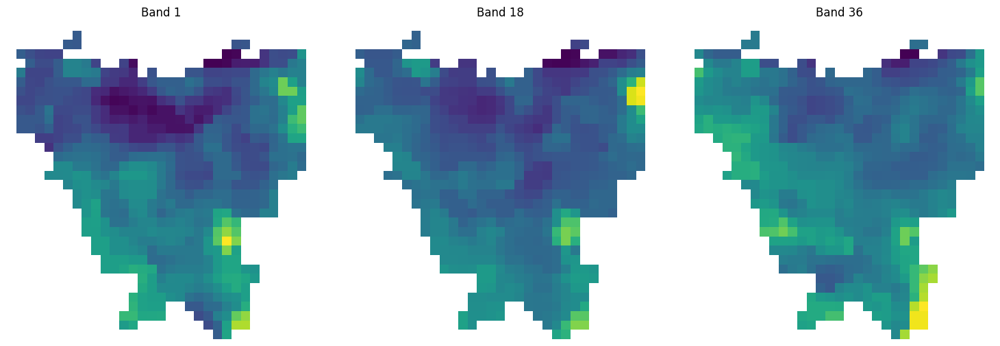

In [ ]:
#-------------------------
# MENGECEK ISI FILE
#-------------------------

import rasterio
import numpy as np
import matplotlib.pyplot as plt

# Path ke file raster stack (multiband)
stacked_file = '/content/drive/MyDrive/PENGOLAHAN/DATA/LSTEVI-MODIS_22&24/EVI/CLIP/Jakarta_EVI_Stack_22-24.tif'

# Buka file
with rasterio.open(stacked_file) as src:
    print("=== Informasi File Stack ===")
    print(f"Jumlah Band   : {src.count}")
    print(f"Ukuran (Width x Height): {src.width} x {src.height}")
    print(f"CRS           : {src.crs}")
    print(f"Transform     : {src.transform}")
    print(f"TIPE DATA     : {src.dtypes[0]}")
    print()

    # Cek statistik per band
    for i in range(1, src.count + 1):
        band = src.read(i)
        print(f"Band {i:02d} - min: {np.nanmin(band):.4f}, max: {np.nanmax(band):.4f}, mean: {np.nanmean(band):.4f}")

    # Visualisasi beberapa band (1, tengah, akhir)
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    bands_to_show = [1, src.count // 2, src.count]
    for i, b in enumerate(bands_to_show):
        image = src.read(b)
        axs[i].imshow(image, cmap='viridis')
        axs[i].set_title(f"Band {b}")
        axs[i].axis('off')
    plt.tight_layout()
    plt.show()


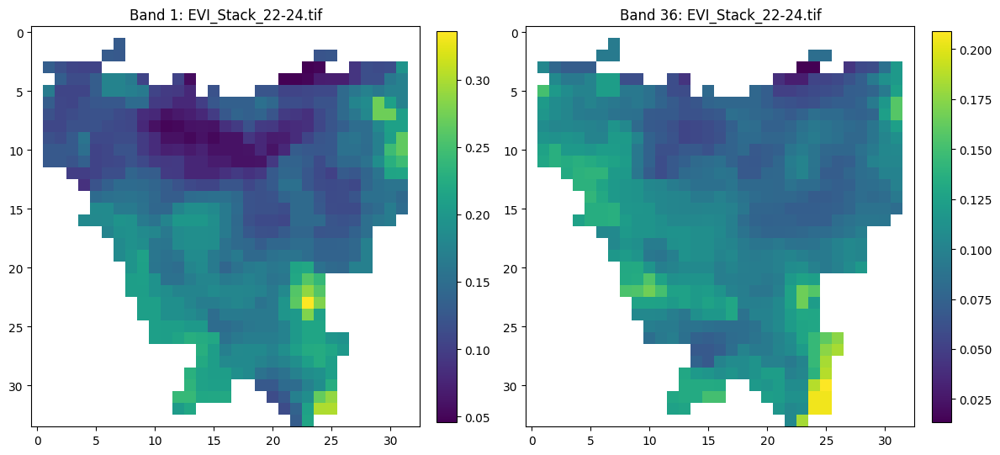

✅ Processed multiband: EVI_Stack_22-24.tif


In [ ]:
#-------------------------
# CLIP DOWNSCALED (MULTIBAND)
#-------------------------
import rasterio
from rasterio.mask import mask
import geopandas as gpd
import numpy as np
import os
from glob import glob
import matplotlib.pyplot as plt

# === 1. BACA SHAPEFILE BATAS ADMINISTRASI ===
shapefile_path = '/content/drive/MyDrive/PENGOLAHAN/DKI Jakarta/DKI Jakarta.shp'
gdf = gpd.read_file(shapefile_path)

# === 2. DAFTAR SEMUA FILE RASTER YANG MAU DIOLAH ===
input_folder = '/content/drive/MyDrive/PENGOLAHAN/DATA/LSTEVI-MODIS_22&24/EVI/Stack'  # folder berisi hasil resampling
output_folder = '/content/drive/MyDrive/PENGOLAHAN/DATA/LSTEVI-MODIS_22&24/EVI/CLIP'
os.makedirs(output_folder, exist_ok=True)
raster_files = sorted(glob(os.path.join(input_folder, '*.tif')))

# === 3. LOOP UNTUK SETIAP FILE RASTER ===
for raster_path in raster_files:
    with rasterio.open(raster_path) as src:
        raster_data = src.read()  # ⬅️ Ambil semua band (multiband)
        raster_meta = src.meta.copy()

        # Cek dan samakan CRS shapefile
        if gdf.crs != src.crs:
            gdf = gdf.to_crs(src.crs)

        # Gunakan nilai nodata asli
        nodata_value = src.nodata

        # Crop dan mask semua band
        out_image, out_transform = mask(
            src,
            gdf.geometry,
            crop=True,
            nodata=nodata_value
        )

        # Update metadata
        out_meta = raster_meta.copy()
        out_meta.update({
            "driver": "GTiff",
            "height": out_image.shape[1],
            "width": out_image.shape[2],
            "count": out_image.shape[0],  # ⬅️ Total band
            "transform": out_transform,
            "nodata": nodata_value
        })

        # Nama file output
        filename = os.path.basename(raster_path)
        output_path = os.path.join(output_folder, f"Jakarta_{filename}")

        # Simpan hasil raster clipped
        with rasterio.open(output_path, "w", **out_meta) as dest:
            dest.write(out_image)

        # === VISUALISASI: Band 1 & terakhir ===
        fig, ax = plt.subplots(1, 2, figsize=(12, 6))
        im1 = ax[0].imshow(out_image[0], cmap='viridis')
        ax[0].set_title(f"Band 1: {filename}")
        plt.colorbar(im1, ax=ax[0], fraction=0.046, pad=0.04)

        im2 = ax[1].imshow(out_image[-1], cmap='viridis')
        ax[1].set_title(f"Band {out_image.shape[0]}: {filename}")
        plt.colorbar(im2, ax=ax[1], fraction=0.046, pad=0.04)

        plt.tight_layout()
        plt.show()

    print(f"✅ Processed multiband: {filename}")


In [ ]:


# Load EVI data (e.g., from MOD11A1)
file_path = '/content/drive/MyDrive/MODIS_EVI_Monthly/EVI_2022_01.tif'

# Check if the file exists
if not os.path.exists(file_path):
    raise FileNotFoundError(f"File not found: {file_path}")

ds = gdal.Open(file_path)
# Check if gdal.Open was successful
if ds is None:
    raise IOError(f"Unable to open file with GDAL: {file_path}")

evi = ds.ReadAsArray().astype(float)
evi[evi == 0] = np.nan  # MODIS sometimes stores fill values as 0

evi_resized = resize(evi, (evi.shape[0]//2, evi.shape[1]//2), anti_aliasing=True)

print("Jumlah total piksel:", evi.size)
print("Jumlah data valid:", np.sum(~np.isnan(evi)))
print("Persentase NA:", np.sum(np.isnan(evi)) / evi.size * 100, "%")

# =========================================
# 1. Flatten data sebelum & sesudah kriging
# =========================================
original_flat = evi.flatten()         # Ganti 'evi' jika kamu pakai LST
filled_flat = evi_filled.flatten()

# ============================
# 2. Buat koordinat piksel
# ============================
x_coords = xv.flatten()
y_coords = yv.flatten()

# ============================
# 3. Buat DataFrame gabungan
# ============================
df_compare = pd.DataFrame({
    'x': x_coords,
    'y': y_coords,
    'value_before': original_flat,
    'value_after': filled_flat
})

# (Opsional) Tampilkan jumlah NaN sebelum dan sesudah
print("\nJumlah NaN sebelum kriging:", df_compare['value_before'].isna().sum())
print("Jumlah NaN sesudah kriging:", df_compare['value_after'].isna().sum())

Jumlah total piksel: 10260
Jumlah data valid: 8499
Persentase NA: 17.163742690058477 %

Jumlah NaN sebelum kriging: 1761
Jumlah NaN sesudah kriging: 0


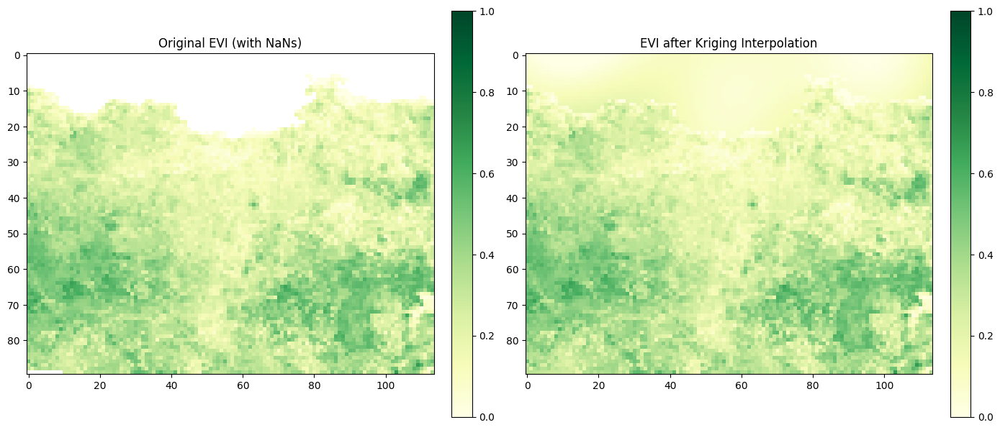

In [ ]:
# Set up figure and subplots
fig, ax = plt.subplots(1, 2, figsize=(14, 6))

# Plot original EVI with NaNs
im1 = ax[0].imshow(evi, cmap='YlGn', interpolation='none', vmin=0, vmax=1)  # Use 'YlGn' for EVI
ax[0].set_title("Original EVI (with NaNs)")
fig.colorbar(im1, ax=ax[0], fraction=0.046, pad=0.04)

# Plot kriging-filled EVI
im2 = ax[1].imshow(evi_filled, cmap='YlGn', interpolation='none', vmin=0, vmax=1)  # Use 'YlGn' for EVI
ax[1].set_title("EVI after Kriging Interpolation")
fig.colorbar(im2, ax=ax[1], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
from sklearn.metrics import mean_squared_error, r2_score

In [ ]:
# 1. Flatten data before & after kriging
original_flat = evi.flatten()
filled_flat = evi_filled.flatten()

# 2. Filter out NaNs for comparison
valid_indices = ~np.isnan(original_flat)  # Find indices where original data is not NaN
original_valid = original_flat[valid_indices]
filled_valid = filled_flat[valid_indices]  # Use the same indices for filled data

# 3. Calculate metrics
rmse = np.sqrt(mean_squared_error(original_valid, filled_valid))
mae = np.mean(np.abs(original_valid - filled_valid))
r2 = r2_score(original_valid, filled_valid)

# 4. Calculate standard deviations
std_original = np.std(original_valid)
std_filled = np.std(filled_valid)

# 5. Print the results
print("Evaluation Metrics:")
print(f"RMSE: {rmse:.4f}")
print(f"MAE: {mae:.4f}")
print(f"R²: {r2:.4f}")
print(f"Standard Deviation (Original): {std_original:.4f}")
print(f"Standard Deviation (Filled): {std_filled:.4f}")

Evaluation Metrics:
RMSE: 0.0000
MAE: 0.0000
R²: 1.0000
Standard Deviation (Original): 0.1319
Standard Deviation (Filled): 0.1319


In [ ]:
import os
import numpy as np
import rasterio
from rasterio.mask import mask
from glob import glob
import geopandas as gpd
import matplotlib.pyplot as plt

In [ ]:
#---------------------
# CLIP
#---------------------


# ===================== PATH INPUT =====================
# Ganti path berikut sesuai lokasi file kamu
input_folder = "/content/drive/MyDrive/MODIS_EVI_Monthly"                     # Folder citra LST bulanan
output_folder = "/content/drive/MyDrive/MODIS_EVI_Monthly/Interpolated"                    # Folder simpan hasil interpolasi
cropped_output_folder = "/content/drive/MyDrive/MODIS_EVI_Monthly/Cropped"      # Folder simpan hasil cropping
shapefile_path = "/content/drive/MyDrive/PENGOLAHAN/DKI Jakarta/DKI Jakarta.shp"        # Shapefile batas wilayah administratif
os.makedirs(output_folder, exist_ok=True)

# ===================== AMBIL DATA =====================
tif_files = sorted(glob(os.path.join(input_folder, "*.tif")))

def get_month_str(filepath):
    basename = os.path.splitext(os.path.basename(filepath))[0]
    return basename.split("_")[-2] + "_" + basename.split("_")[-1]

# ===================== FUNGSI INTERPOLASI =====================
def interpolate_average_fill_only(idx):
    target_file = tif_files[idx]
    with rasterio.open(target_file) as src:
        target_data = src.read(1).astype(np.float32)
        meta = src.meta.copy()
        nodata = src.nodata
        if nodata is not None:
            target_data[target_data == nodata] = np.nan

    selected_files = tif_files[idx-3:idx] + tif_files[idx+1:idx+4]
    arrays = []
    for f in selected_files:
        with rasterio.open(f) as src:
            arr = src.read(1).astype(np.float32)
            nd = src.nodata
            if nd is not None:
                arr[arr == nd] = np.nan
            arrays.append(arr)

    stacked = np.stack(arrays)
    interpolated_values = np.nanmean(stacked, axis=0)

    mask_missing = np.isnan(target_data)
    target_data[mask_missing] = interpolated_values[mask_missing]

    meta.update(dtype=rasterio.float32, nodata=np.nan)

    return target_data, meta

# ===================== FUNGSI MASKING =====================
def mask_raster_with_shape(raster_path, output_path, shapes, nodata_val=np.nan):
    with rasterio.open(raster_path) as src:
        out_image, out_transform = mask(src, shapes, crop=True, nodata=nodata_val)
        out_meta = src.meta.copy()
    out_meta.update({
        "height": out_image.shape[1],
        "width": out_image.shape[2],
        "transform": out_transform,
        "nodata": nodata_val
    })
    with rasterio.open(output_path, "w", **out_meta) as dest:
        dest.write(out_image)

# ===================== FUNGSI VISUALISASI =====================
def visualize_three_panels(original_path, interpolated_path, masked_path, month_str):
    with rasterio.open(original_path) as src_orig:
        original = src_orig.read(1).astype(np.float32)
        nodata = src_orig.nodata
        if nodata is not None:
            original[original == nodata] = np.nan

    with rasterio.open(interpolated_path) as src_interp:
        interpolated = src_interp.read(1).astype(np.float32)

    with rasterio.open(masked_path) as src_masked:
        masked = src_masked.read(1).astype(np.float32)

    vmin = np.nanmin(interpolated)
    vmax = np.nanmax(interpolated)

    fig, axs = plt.subplots(1, 3, figsize=(18, 6))

    im0 = axs[0].imshow(original, cmap='inferno', vmin=vmin, vmax=vmax)
    axs[0].set_title("Citra Asli (Missing)")
    plt.colorbar(im0, ax=axs[0])

    im1 = axs[1].imshow(interpolated, cmap='inferno', vmin=vmin, vmax=vmax)
    axs[1].set_title("Setelah Interpolasi")
    plt.colorbar(im1, ax=axs[1])

    im2 = axs[2].imshow(masked, cmap='inferno', vmin=vmin, vmax=vmax)
    axs[2].set_title("Setelah Masking")
    plt.colorbar(im2, ax=axs[2])

    plt.suptitle(f"Perbandingan Proses Bulan {month_str}")
    plt.tight_layout()
    plt.show()
    plt.close()

# ===================== LOAD SHAPEFILE =====================
gdf = gpd.read_file(shapefile_path)
geometry = gdf.geometry.values

# ===================== FOLDER TAMBAHAN =====================
cropped_output_folder = os.path.join(output_folder, "cropped")
visual_output_folder = os.path.join(output_folder, "visualization")
os.makedirs(cropped_output_folder, exist_ok=True)
os.makedirs(visual_output_folder, exist_ok=True)

# ===================== LOOP INTERPOLASI + MASKING + VISUAL =====================
for idx in range(3, len(tif_files) - 3):
    month = get_month_str(tif_files[idx])
    print(f"Processing bulan {month}...")

    # Interpolasi
    filled_array, meta = interpolate_average_fill_only(idx)
    interpolated_temp_path = os.path.join(output_folder, f"LST_INTERPOLATED_{month}.tif")
    with rasterio.open(interpolated_temp_path, "w", **meta) as dst:
        dst.write(filled_array, 1)

    # Masking
    final_output_path = os.path.join(cropped_output_folder, f"LST_JAKARTA_{month}.tif")
    mask_raster_with_shape(interpolated_temp_path, final_output_path, geometry)

    # Visualisasi
    visualize_three_panels(
        tif_files[idx],
        interpolated_temp_path,
        final_output_path,
        month
    )


print("✅ Selesai: Semua bulan berhasil diproses.")

NameError: name 'glob' is not defined

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Baca grid polygon
grid = gpd.read_file("/content/drive/MyDrive/PENGOLAHAN/Grid Jakarta/Grid Jakarta.shp")

# 2. Hitung centroid untuk setiap polygon
grid_centroid = grid.copy()
grid_centroid["geometry"] = grid_centroid.centroid

# 3. Tambahkan ID unik kalau belum ada
if "grid_id" not in grid_centroid.columns:
    grid_centroid["grid_id"] = ["G_{:04d}".format(i) for i in range(len(grid_centroid))]

# 4. Tampilkan hasil centroid
fig, ax = plt.subplots(figsize=(10, 10))
grid.boundary.plot(ax=ax, color="black", linewidth=0.5, label="Grid Boundary")  # Outline grid lama
grid_centroid.plot(ax=ax, color="red", markersize=10, label="Centroid Points")  # Titik centroid baru
plt.legend()
plt.title("Centroid dari Grid 1x1 km di DKI Jakarta")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

# 5. (Optional) Simpan centroid ke shapefile baru
grid_centroid.to_file("grid_dki_centroid.shp")


In [ ]:
#-------------------------
# CLIP DOWNSCALED
#-------------------------
import rasterio
from rasterio.mask import mask
import geopandas as gpd
import numpy as np
import os
from glob import glob
import matplotlib.pyplot as plt

# === 1. BACA SHAPEFILE BATAS ADMINISTRASI ===
shapefile_path = '/content/drive/MyDrive/PENGOLAHAN/DKI Jakarta/DKI Jakarta.shp'
gdf = gpd.read_file(shapefile_path)

# === 2. DAFTAR SEMUA FILE RASTER YANG MAU DIOLAH ===
input_folder = '/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/T2M_EXPORT/DOWNSCALED'  # folder berisi hasil resampling
output_folder = '/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/T2M_EXPORT/CLIP'
os.makedirs(output_folder, exist_ok=True)
raster_files = sorted(glob(os.path.join(input_folder, '*.tif')))

# === 3. LOOP UNTUK SETIAP FILE RASTER ===
for raster_path in raster_files:
    with rasterio.open(raster_path) as src:
        raster_data = src.read(1)
        raster_meta = src.meta.copy()

        # Cek dan samakan CRS shapefile
        if gdf.crs != src.crs:
            gdf = gdf.to_crs(src.crs)

        # Gunakan nilai nodata asli
        nodata_value = src.nodata

        # Crop dan mask dengan nodata asli
        out_image, out_transform = mask(
            src,
            gdf.geometry,
            crop=True,
            nodata=nodata_value  # GUNAKAN nodata asli
        )

        # Update metadata
        out_meta = raster_meta.copy()
        out_meta.update({
            "driver": "GTiff",
            "height": out_image.shape[1],
            "width": out_image.shape[2],
            "transform": out_transform,
            "nodata": nodata_value
        })

        # Nama file output
        filename = os.path.basename(raster_path)
        output_path = os.path.join(output_folder, f"Jakarta_{filename}")

        # Simpan hasil raster clipped
        with rasterio.open(output_path, "w", **out_meta) as dest:
            dest.write(out_image)

        # === VISUALISASI SEBELUM DAN SESUDAH CLIPPING ===
        fig, ax = plt.subplots(1, 2, figsize=(12, 6))
        im1 = ax[0].imshow(raster_data, cmap='viridis')
        ax[0].set_title(f"Asli: {filename}")
        plt.colorbar(im1, ax=ax[0], fraction=0.046, pad=0.04)

        im2 = ax[1].imshow(out_image[0], cmap='viridis')
        ax[1].set_title(f"Clipped: {filename}")
        plt.colorbar(im2, ax=ax[1], fraction=0.046, pad=0.04)

        plt.tight_layout()
        plt.show()

    print(f"Processed and visualized: {filename}")


# GEE Version T2M

In [ ]:
# Melakukan autentikasi dan mendefinisikan Google Cloud Project yang akan digunakan
ee.Authenticate()
ee.Initialize(project='ee-sidangapril2024')
Map = geemap.Map()
Map
AOI = ee.FeatureCollection("projects/ee-sidangapril2024/assets/JABODETABEK")
#AOI= ee.FeatureCollection("projects/ee-sidangapril2024/assets/DKI_JAKARTA")
Map.addLayer(AOI, {}, "AOI")
Map.centerObject(AOI, 8)

In [ ]:
# Rentang waktu
start_date = ee.Date('2022-01-01')
end_date = ee.Date('2024-12-31')

In [ ]:
#-------------------
# PENGUNDUHAN
#-------------------

import ee
import geemap

# Inisialisasi Earth Engine
ee.Authenticate()
ee.Initialize(project='ee-sidangapril2024')

# Definisikan Area of Interest (AOI)
AOI = ee.FeatureCollection("projects/ee-sidangapril2024/assets/JABODETABEK")

# Koleksi ERA5-Land hourly
era5_collection = ee.ImageCollection('ECMWF/ERA5_LAND/HOURLY')

# Rentang waktu: Januari 2022 - Desember 2024 (sesuaikan jika perlu)
start_date = ee.Date('2022-01-01')
end_date = ee.Date('2024-12-31')

# Buat list bulan
months = ee.List.sequence(0, end_date.difference(start_date, 'month'))

# Fungsi untuk menghitung rata-rata bulanan
def calculate_monthly_mean(month_offset):
    start = start_date.advance(month_offset, 'month')
    end = start.advance(1, 'month')
    year_month = start.format('YYYY-MM')
    filtered_collection = era5_collection.filterDate(start, end)
    mean_temp_celsius = filtered_collection.select('temperature_2m') \
        .mean() \
        .subtract(273.15) \
        .clip(AOI) \
        .rename([year_month]) \
        .set('system:time_start', start.millis())
    return mean_temp_celsius

# Hitung rata-rata bulanan untuk setiap bulan
monthly_means = months.map(calculate_monthly_mean)
multi_band_image = ee.ImageCollection(monthly_means).toBands()

# Gabungkan menjadi ImageCollection
monthly_collection = ee.ImageCollection(monthly_means)

# Visualisasi (contoh untuk bulan pertama)
first_month_mean = monthly_collection.first()
vis_params = {
    'min': 20,
    'max': 35,
    'palette': ['blue', 'green', 'yellow', 'red']
}

Map = geemap.Map()
Map.centerObject(AOI, 8)
Map.addLayer(first_month_mean, vis_params, 'Mean Temperature (°C)')
Map.addLayer(AOI, {}, 'AOI')
Map

Map(center=[-6.375912206265441, 106.80576119247223], controls=(WidgetControl(options=['position', 'transparent…

In [ ]:
#-------------------
# PENYIMPANAN
#-------------------

# Export ke Google Drive
task = ee.batch.Export.image.toDrive(
    image=multi_band_image,
    description='monthly_mean_t2m',
        folder='/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/T2M',
    fileNamePrefix='ERA5_T2M_Monthly_2022_2024',
    region=AOI.geometry(),
    scale=11132,  # skala asli ERA5-Land
    crs='EPSG:32748',
    maxPixels=1e13
)
task.start()

✅ Informasi Umum
- CRS: EPSG:32748
- Resolusi (meter): (11132.0, 11132.0)
- Ukuran raster: 10 x 10
- Jumlah band: 36
- Bounds: BoundingBox(left=645656.0, bottom=9239560.0, right=756976.0, top=9350880.0)

📦 Statistik per band:
 Band 1: min=19.66, max=26.92, mean=24.92
 Band 2: min=19.60, max=26.96, mean=24.82
 Band 3: min=19.95, max=27.38, mean=25.26
 Band 4: min=19.84, max=27.53, mean=25.29
 Band 5: min=20.26, max=27.63, mean=25.52
 Band 6: min=19.22, max=26.81, mean=24.58
 Band 7: min=19.84, max=27.13, mean=25.02
 Band 8: min=19.89, max=27.25, mean=25.19
 Band 9: min=19.83, max=27.25, mean=25.17
 Band 10: min=19.60, max=27.00, mean=24.92
 Band 11: min=19.80, max=27.15, mean=25.02
 Band 12: min=19.58, max=26.93, mean=24.85
 Band 13: min=19.50, max=26.86, mean=24.79
 Band 14: min=19.14, max=26.42, mean=24.30
 Band 15: min=19.69, max=26.91, mean=24.85
 Band 16: min=20.20, max=27.70, mean=25.52
 Band 17: min=20.45, max=28.02, mean=25.79
 Band 18: min=20.29, max=27.68, mean=25.64
 Band 19:

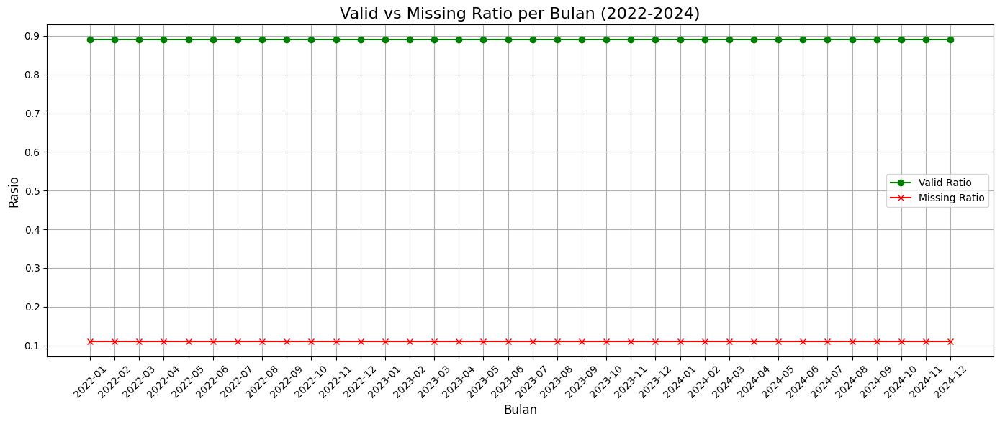

In [ ]:
#-------------------
# MELIHAT INFORMASI
#-------------------

import rasterio
from rasterio.plot import show
import os
import numpy as np
import ee # Import ee here

# Buka file multiband
file_path = '/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/T2M_EXPORT/ERA5_T2M_Monthly_2022_2024.tif'
with rasterio.open(file_path) as src:
    print("✅ Informasi Umum")
    print(f"- CRS: {src.crs}")
    print(f"- Resolusi (meter): {src.res}")
    print(f"- Ukuran raster: {src.width} x {src.height}")
    print(f"- Jumlah band: {src.count}")
    print(f"- Bounds: {src.bounds}")

    print("\n📦 Statistik per band:")
    for i in range(1, src.count + 1):
        band = src.read(i)
        band_name = f"Band {i}"  # Atau bisa pakai nama dari metadata jika tersedia
        print(f" {band_name}: min={np.nanmin(band):.2f}, max={np.nanmax(band):.2f}, mean={np.nanmean(band):.2f}")

    print("\n📝 Metadata tambahan (jika ada):")
    print(src.tags())

#-------------------
# INFORMASI MISSING
#-------------------

# Step 1: Tambahkan label (YYYY-MM) dan valid_ratio ke setiap image

def add_valid_ratio(image):
    band_name = 't2m'  # Ganti dengan nama band yang sesuai

    # Mask menunjukkan piksel valid
    mask = image.mask().gt(0)

    # Hitung luas area valid (m²)
    valid_area_image = mask.multiply(ee.Image.pixelArea())
    area_stats = valid_area_image.reduceRegion(
        reducer=ee.Reducer.sum(),
        geometry=AOI.geometry(),  # jika AOI berupa FeatureCollection
        scale=11132,
        maxPixels=1e13
    )

    # Luas valid & total AOI
    valid_area = ee.Number(area_stats.get(band_name))
    total_area = AOI.geometry().area()

    # Rasio valid dan missing
    valid_ratio = valid_area.divide(total_area)
    missing_ratio = ee.Number(1.0).subtract(valid_ratio)

    # Tambahkan ke metadata image
    image = image.set('valid_ratio', valid_ratio)
    image = image.set('missing_ratio', missing_ratio)  # missing ratio as a number (0-1)
    image = image.set('missing_ratio_percent', missing_ratio.multiply(100))  # missing ratio as percentage
    return image


def calculate_monthly_mean_with_ratio(month_offset):
    start = start_date.advance(month_offset, 'month')
    end = start.advance(1, 'month')
    label = start.format('YYYY-MM')

    filtered = era5_collection.filterDate(start, end)
    monthly_mean = filtered.select('v_component_of_wind_10m') \
        .mean() \
        .clip(AOI) \
        .rename('t2m') \
        .set('label', label)

    # Tambahkan valid_ratio dan missing_ratio
    return add_valid_ratio(monthly_mean)

# Step 2: Buat koleksi dengan rasio valid
monthly_collection = ee.ImageCollection(months.map(calculate_monthly_mean_with_ratio))

# Step 3: Konversi ke FeatureCollection untuk ringkasan
def image_to_feature(image):
    return ee.Feature(None, {
        'label': image.get('label'),
        'valid_ratio': image.get('valid_ratio'),
        'missing_ratio_percent': image.get('missing_ratio'),
    })

missing_ratio_fc = monthly_collection.map(image_to_feature)

# Step 4: Cetak hasil
print(missing_ratio_fc.aggregate_array('label').getInfo())
print(missing_ratio_fc.aggregate_array('missing_ratio_percent').getInfo())


#-------------------
# PLOT MISSING
#-------------------

import matplotlib.pyplot as plt

# Data bulan dan missing ratio (dari hasil kamu)
months = ['2022-01', '2022-02', '2022-03', '2022-04', '2022-05', '2022-06',
          '2022-07', '2022-08', '2022-09', '2022-10', '2022-11', '2022-12',
          '2023-01', '2023-02', '2023-03', '2023-04', '2023-05', '2023-06',
          '2023-07', '2023-08', '2023-09', '2023-10', '2023-11', '2023-12',
          '2024-01', '2024-02', '2024-03', '2024-04', '2024-05', '2024-06',
          '2024-07', '2024-08', '2024-09', '2024-10', '2024-11', '2024-12']

missing_ratio = [0.11010779941985649] * 36  # Sama semua
valid_ratio = [1 - r for r in missing_ratio]

# Membuat plot
plt.figure(figsize=(14, 6))
plt.plot(months, valid_ratio, marker='o', label='Valid Ratio', color='green')
plt.plot(months, missing_ratio, marker='x', label='Missing Ratio', color='red')

plt.title('Valid vs Missing Ratio per Bulan (2022-2024)', fontsize=16)
plt.xlabel('Bulan', fontsize=12)
plt.ylabel('Rasio', fontsize=12)
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import rasterio
from rasterio.plot import show
from pykrige.ok import OrdinaryKriging
from tqdm import tqdm


🔄 Memproses band ke-1...


Band 1: 100%|██████████| 36/36 [00:00<00:00, 73.81it/s]


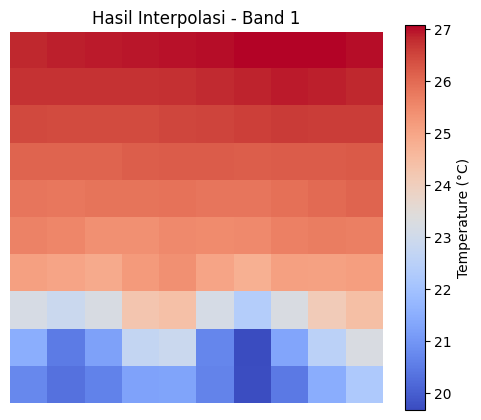

📊 Statistik Band 1 setelah interpolasi:
- Min: 19.66
- Max: 27.08
- Mean: 24.89
- Std Dev: 2.11
----------------------------------------
🔄 Memproses band ke-2...


Band 2: 100%|██████████| 36/36 [00:02<00:00, 14.31it/s]


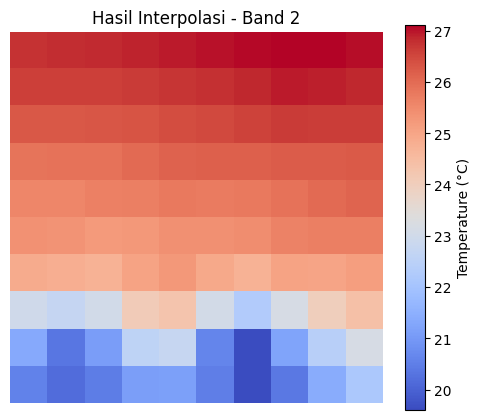

📊 Statistik Band 2 setelah interpolasi:
- Min: 19.60
- Max: 27.11
- Mean: 24.81
- Std Dev: 2.14
----------------------------------------
🔄 Memproses band ke-3...


Band 3: 100%|██████████| 36/36 [00:00<00:00, 167.96it/s]


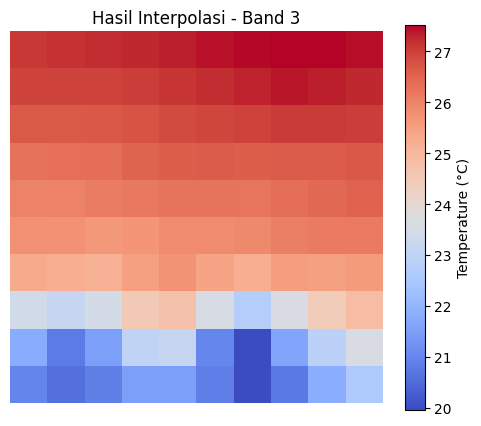

📊 Statistik Band 3 setelah interpolasi:
- Min: 19.95
- Max: 27.52
- Mean: 25.23
- Std Dev: 2.14
----------------------------------------
🔄 Memproses band ke-4...


Band 4: 100%|██████████| 36/36 [00:00<00:00, 531.93it/s]


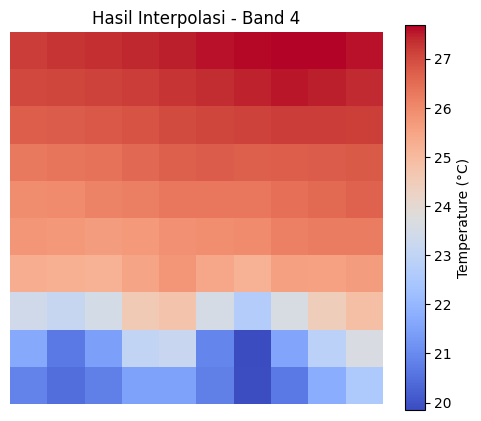

📊 Statistik Band 4 setelah interpolasi:
- Min: 19.84
- Max: 27.67
- Mean: 25.28
- Std Dev: 2.21
----------------------------------------
🔄 Memproses band ke-5...


Band 5: 100%|██████████| 36/36 [00:00<00:00, 511.96it/s]


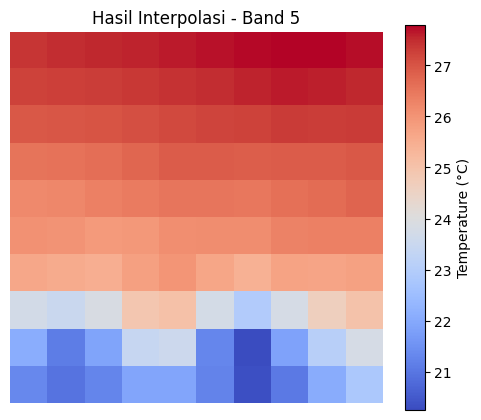

📊 Statistik Band 5 setelah interpolasi:
- Min: 20.26
- Max: 27.79
- Mean: 25.51
- Std Dev: 2.12
----------------------------------------
🔄 Memproses band ke-6...


Band 6: 100%|██████████| 36/36 [00:00<00:00, 299.09it/s]


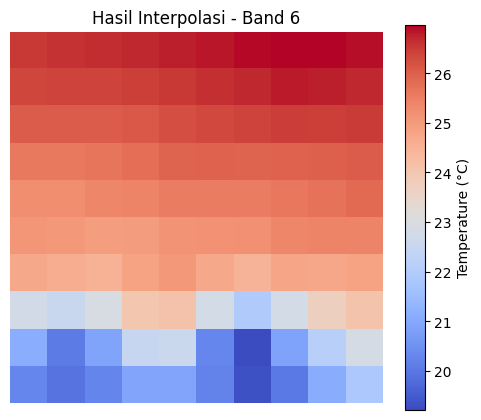

📊 Statistik Band 6 setelah interpolasi:
- Min: 19.22
- Max: 26.97
- Mean: 24.58
- Std Dev: 2.16
----------------------------------------
🔄 Memproses band ke-7...


Band 7: 100%|██████████| 36/36 [00:00<00:00, 524.38it/s]


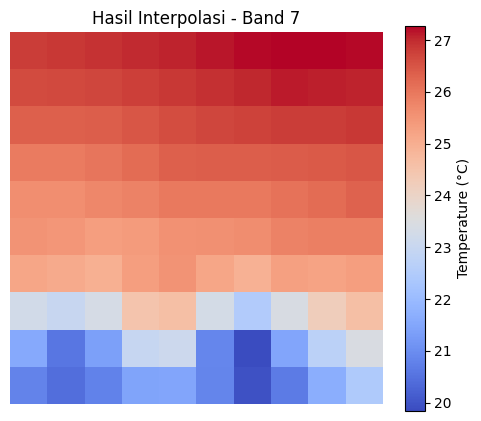

📊 Statistik Band 7 setelah interpolasi:
- Min: 19.84
- Max: 27.28
- Mean: 25.00
- Std Dev: 2.08
----------------------------------------
🔄 Memproses band ke-8...


Band 8: 100%|██████████| 36/36 [00:00<00:00, 557.63it/s]


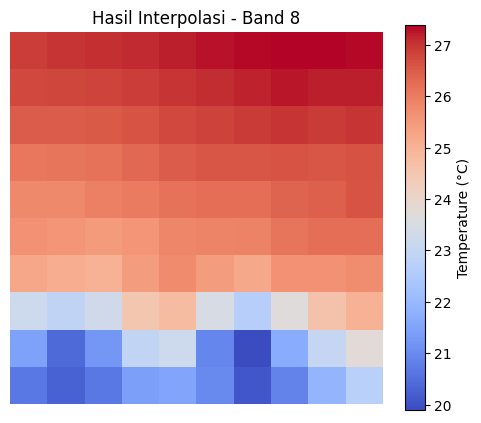

📊 Statistik Band 8 setelah interpolasi:
- Min: 19.89
- Max: 27.38
- Mean: 25.16
- Std Dev: 2.13
----------------------------------------
🔄 Memproses band ke-9...


Band 9: 100%|██████████| 36/36 [00:00<00:00, 314.19it/s]


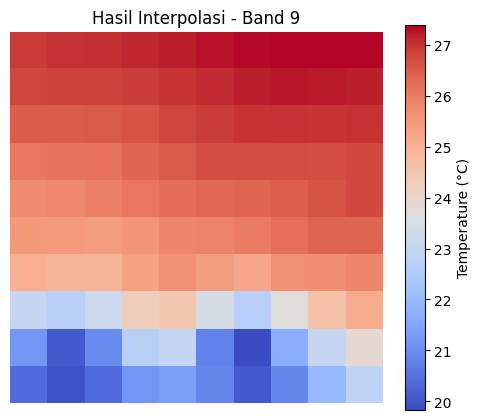

📊 Statistik Band 9 setelah interpolasi:
- Min: 19.83
- Max: 27.39
- Mean: 25.14
- Std Dev: 2.21
----------------------------------------
🔄 Memproses band ke-10...


Band 10: 100%|██████████| 36/36 [00:00<00:00, 446.64it/s]


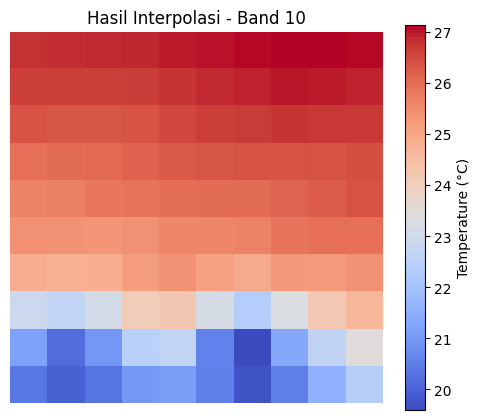

📊 Statistik Band 10 setelah interpolasi:
- Min: 19.60
- Max: 27.14
- Mean: 24.89
- Std Dev: 2.18
----------------------------------------
🔄 Memproses band ke-11...


Band 11: 100%|██████████| 36/36 [00:00<00:00, 525.53it/s]


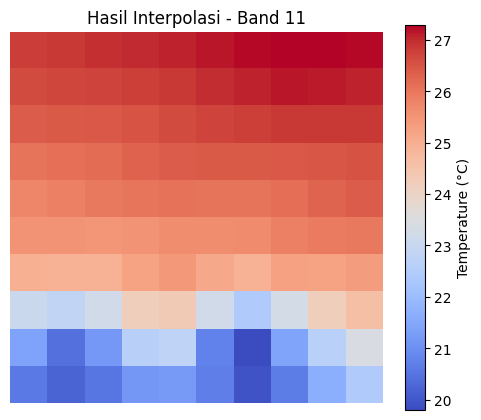

📊 Statistik Band 11 setelah interpolasi:
- Min: 19.80
- Max: 27.29
- Mean: 25.00
- Std Dev: 2.16
----------------------------------------
🔄 Memproses band ke-12...


Band 12: 100%|██████████| 36/36 [00:00<00:00, 404.27it/s]


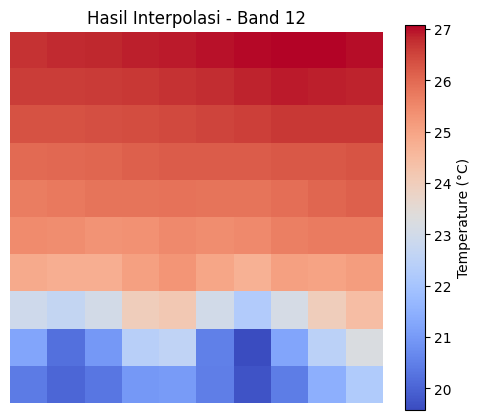

📊 Statistik Band 12 setelah interpolasi:
- Min: 19.58
- Max: 27.08
- Mean: 24.82
- Std Dev: 2.17
----------------------------------------
🔄 Memproses band ke-13...


Band 13: 100%|██████████| 36/36 [00:00<00:00, 464.01it/s]


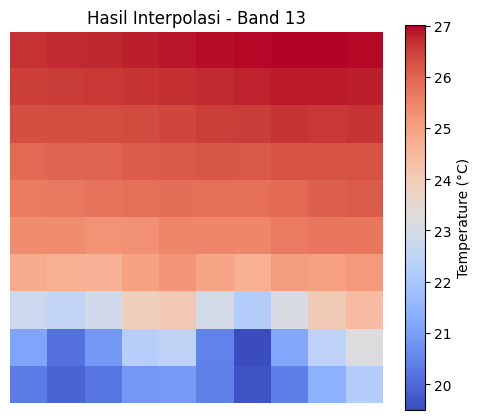

📊 Statistik Band 13 setelah interpolasi:
- Min: 19.50
- Max: 27.01
- Mean: 24.76
- Std Dev: 2.19
----------------------------------------
🔄 Memproses band ke-14...


Band 14: 100%|██████████| 36/36 [00:00<00:00, 270.33it/s]


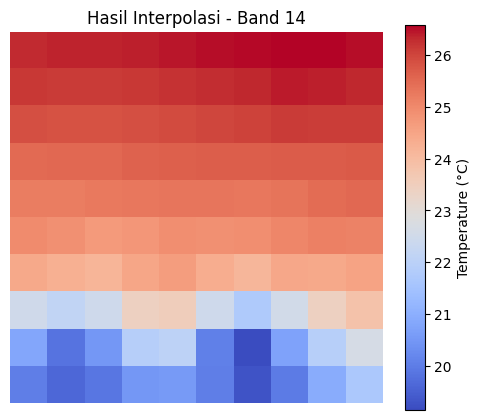

📊 Statistik Band 14 setelah interpolasi:
- Min: 19.14
- Max: 26.58
- Mean: 24.29
- Std Dev: 2.15
----------------------------------------
🔄 Memproses band ke-15...


Band 15: 100%|██████████| 36/36 [00:00<00:00, 310.37it/s]


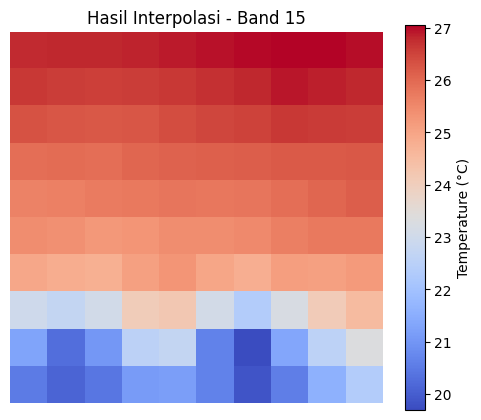

📊 Statistik Band 15 setelah interpolasi:
- Min: 19.69
- Max: 27.05
- Mean: 24.82
- Std Dev: 2.11
----------------------------------------
🔄 Memproses band ke-16...


Band 16: 100%|██████████| 36/36 [00:00<00:00, 478.39it/s]


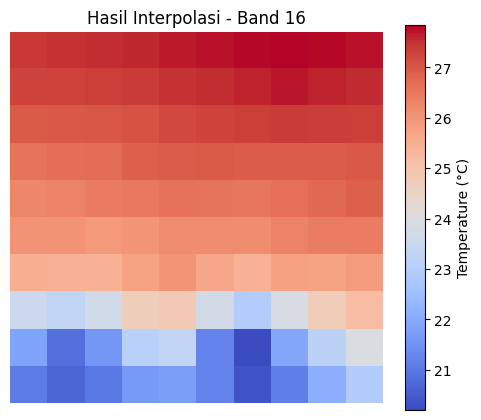

📊 Statistik Band 16 setelah interpolasi:
- Min: 20.20
- Max: 27.84
- Mean: 25.51
- Std Dev: 2.19
----------------------------------------
🔄 Memproses band ke-17...


Band 17: 100%|██████████| 36/36 [00:00<00:00, 314.67it/s]


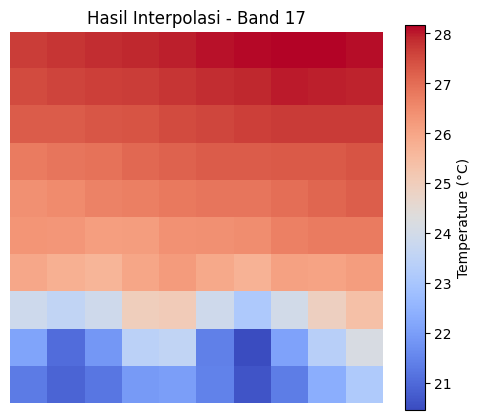

📊 Statistik Band 17 setelah interpolasi:
- Min: 20.45
- Max: 28.17
- Mean: 25.78
- Std Dev: 2.22
----------------------------------------
🔄 Memproses band ke-18...


Band 18: 100%|██████████| 36/36 [00:00<00:00, 384.94it/s]


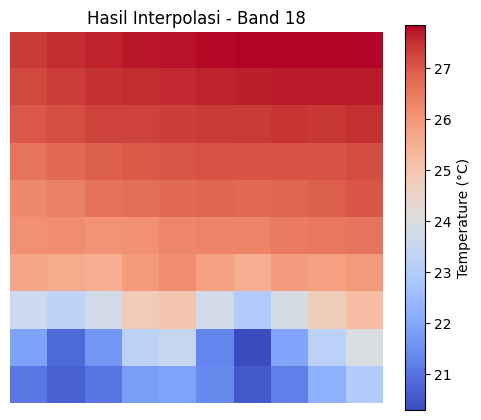

📊 Statistik Band 18 setelah interpolasi:
- Min: 20.29
- Max: 27.85
- Mean: 25.61
- Std Dev: 2.20
----------------------------------------
🔄 Memproses band ke-19...


Band 19: 100%|██████████| 36/36 [00:00<00:00, 501.02it/s]


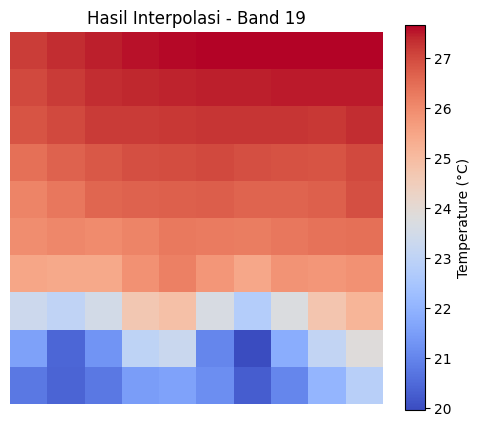

📊 Statistik Band 19 setelah interpolasi:
- Min: 19.95
- Max: 27.65
- Mean: 25.45
- Std Dev: 2.24
----------------------------------------
🔄 Memproses band ke-20...


Band 20: 100%|██████████| 36/36 [00:00<00:00, 151.99it/s]


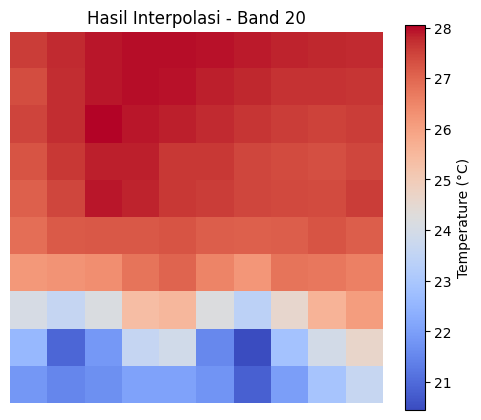

📊 Statistik Band 20 setelah interpolasi:
- Min: 20.45
- Max: 28.05
- Mean: 26.14
- Std Dev: 2.19
----------------------------------------
🔄 Memproses band ke-21...


Band 21: 100%|██████████| 36/36 [00:00<00:00, 439.62it/s]


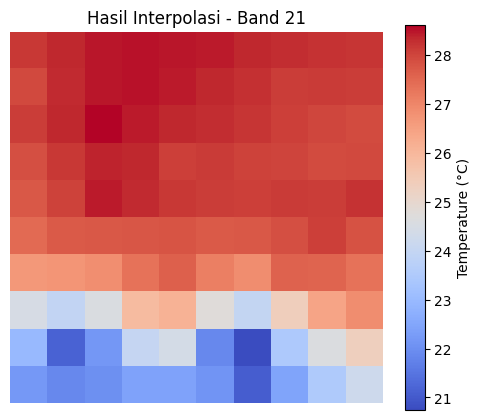

📊 Statistik Band 21 setelah interpolasi:
- Min: 20.74
- Max: 28.61
- Mean: 26.68
- Std Dev: 2.25
----------------------------------------
🔄 Memproses band ke-22...


Band 22: 100%|██████████| 36/36 [00:00<00:00, 461.07it/s]


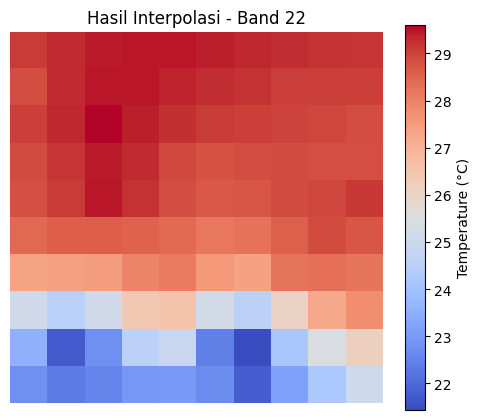

📊 Statistik Band 22 setelah interpolasi:
- Min: 21.44
- Max: 29.60
- Mean: 27.46
- Std Dev: 2.36
----------------------------------------
🔄 Memproses band ke-23...


Band 23: 100%|██████████| 36/36 [00:00<00:00, 193.51it/s]


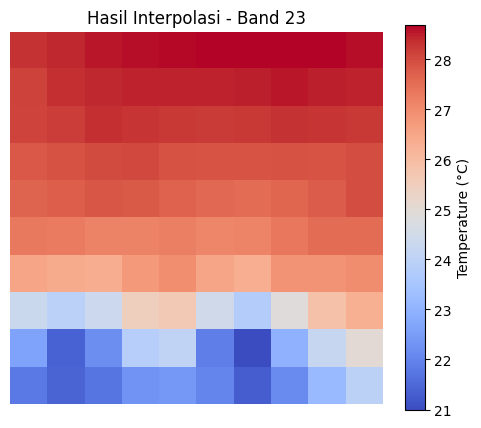

📊 Statistik Band 23 setelah interpolasi:
- Min: 20.98
- Max: 28.68
- Mean: 26.49
- Std Dev: 2.28
----------------------------------------
🔄 Memproses band ke-24...


Band 24: 100%|██████████| 36/36 [00:00<00:00, 274.00it/s]


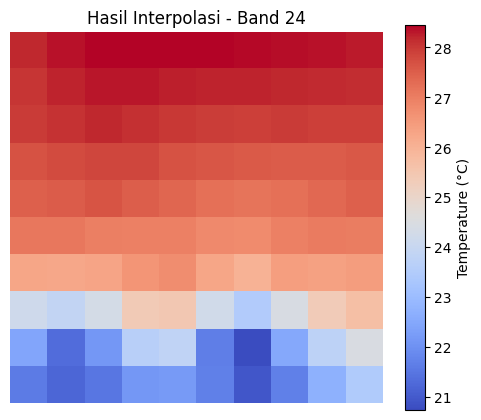

📊 Statistik Band 24 setelah interpolasi:
- Min: 20.73
- Max: 28.45
- Mean: 26.22
- Std Dev: 2.28
----------------------------------------
🔄 Memproses band ke-25...


Band 25: 100%|██████████| 36/36 [00:00<00:00, 362.52it/s]


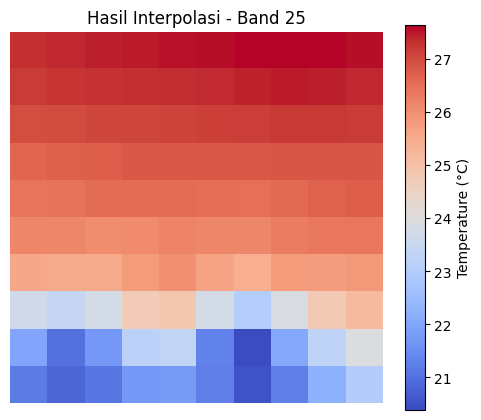

📊 Statistik Band 25 setelah interpolasi:
- Min: 20.39
- Max: 27.64
- Mean: 25.50
- Std Dev: 2.11
----------------------------------------
🔄 Memproses band ke-26...


Band 26: 100%|██████████| 36/36 [00:00<00:00, 233.69it/s]


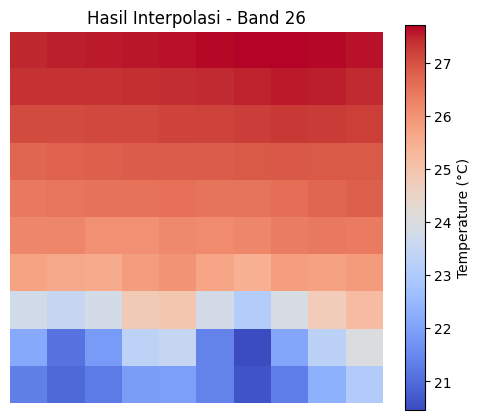

📊 Statistik Band 26 setelah interpolasi:
- Min: 20.46
- Max: 27.71
- Mean: 25.56
- Std Dev: 2.09
----------------------------------------
🔄 Memproses band ke-27...


Band 27: 100%|██████████| 36/36 [00:00<00:00, 350.25it/s]


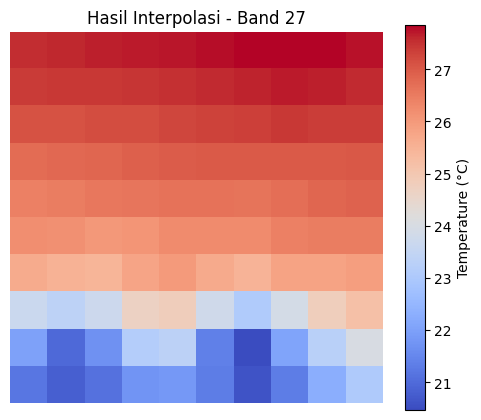

📊 Statistik Band 27 setelah interpolasi:
- Min: 20.47
- Max: 27.85
- Mean: 25.59
- Std Dev: 2.16
----------------------------------------
🔄 Memproses band ke-28...


Band 28: 100%|██████████| 36/36 [00:00<00:00, 131.91it/s]


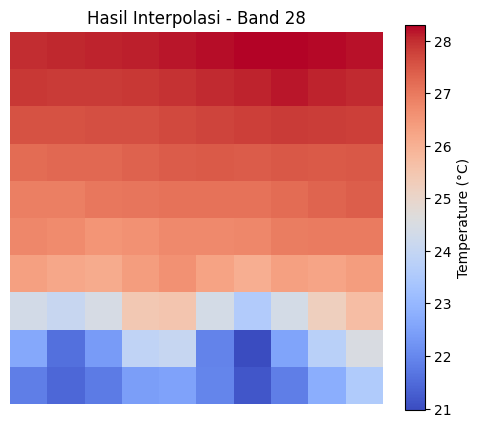

📊 Statistik Band 28 setelah interpolasi:
- Min: 20.97
- Max: 28.29
- Mean: 26.10
- Std Dev: 2.10
----------------------------------------
🔄 Memproses band ke-29...


Band 29: 100%|██████████| 36/36 [00:00<00:00, 84.55it/s]


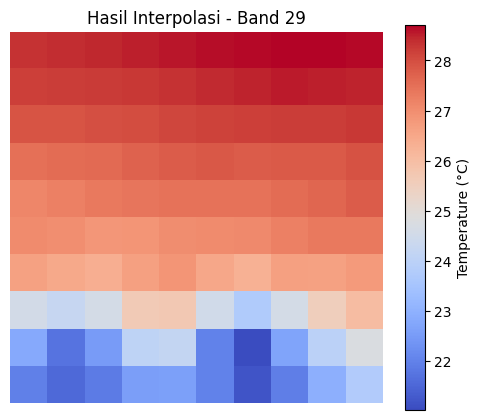

📊 Statistik Band 29 setelah interpolasi:
- Min: 21.02
- Max: 28.71
- Mean: 26.40
- Std Dev: 2.20
----------------------------------------
🔄 Memproses band ke-30...


Band 30: 100%|██████████| 36/36 [00:00<00:00, 58.79it/s]


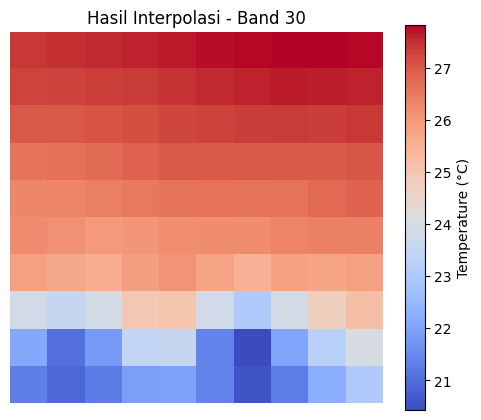

📊 Statistik Band 30 setelah interpolasi:
- Min: 20.43
- Max: 27.82
- Mean: 25.58
- Std Dev: 2.11
----------------------------------------
🔄 Memproses band ke-31...


Band 31: 100%|██████████| 36/36 [00:00<00:00, 196.09it/s]


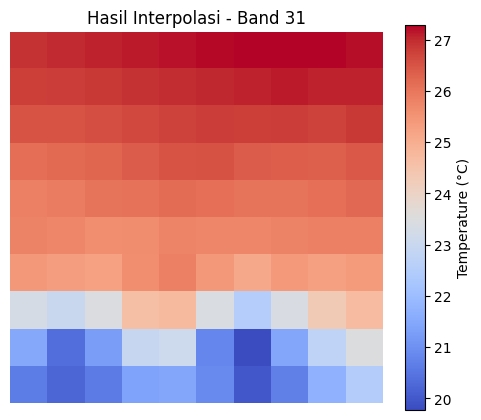

📊 Statistik Band 31 setelah interpolasi:
- Min: 19.77
- Max: 27.29
- Mean: 25.09
- Std Dev: 2.14
----------------------------------------
🔄 Memproses band ke-32...


Band 32: 100%|██████████| 36/36 [00:00<00:00, 55.14it/s]


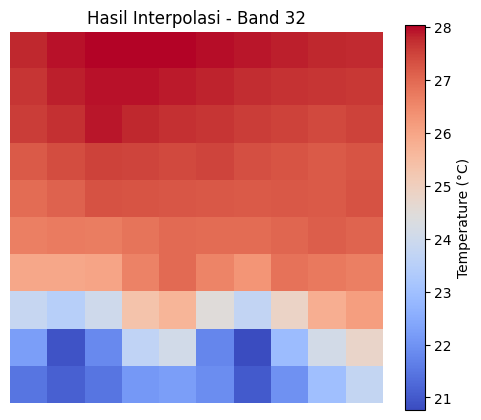

📊 Statistik Band 32 setelah interpolasi:
- Min: 20.76
- Max: 28.04
- Mean: 26.07
- Std Dev: 2.14
----------------------------------------
🔄 Memproses band ke-33...


Band 33: 100%|██████████| 36/36 [00:00<00:00, 66.67it/s]


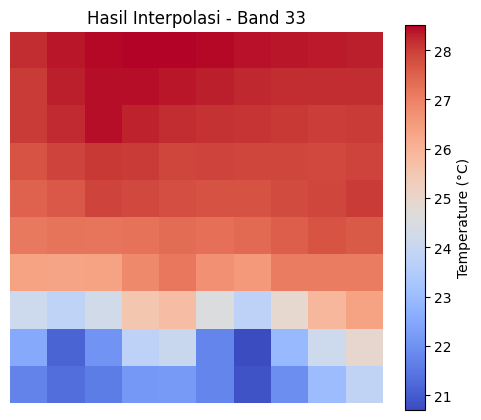

📊 Statistik Band 33 setelah interpolasi:
- Min: 20.70
- Max: 28.51
- Mean: 26.44
- Std Dev: 2.31
----------------------------------------
🔄 Memproses band ke-34...


Band 34: 100%|██████████| 36/36 [00:00<00:00, 61.50it/s]


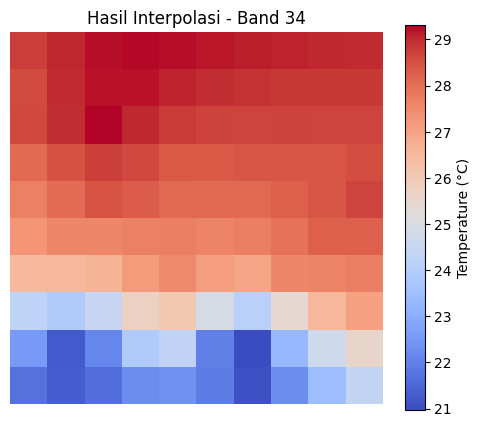

📊 Statistik Band 34 setelah interpolasi:
- Min: 20.96
- Max: 29.30
- Mean: 26.89
- Std Dev: 2.48
----------------------------------------
🔄 Memproses band ke-35...


Band 35: 100%|██████████| 36/36 [00:00<00:00, 362.39it/s]


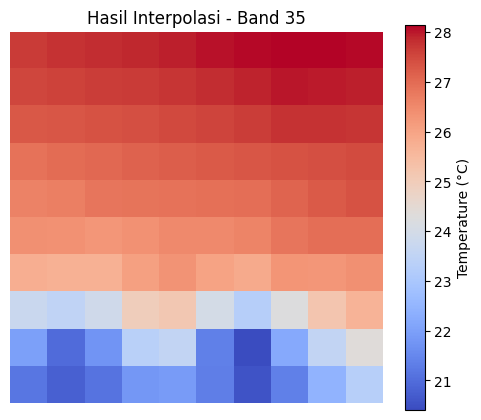

📊 Statistik Band 35 setelah interpolasi:
- Min: 20.40
- Max: 28.14
- Mean: 25.83
- Std Dev: 2.24
----------------------------------------
🔄 Memproses band ke-36...


Band 36: 100%|██████████| 36/36 [00:00<00:00, 292.14it/s]


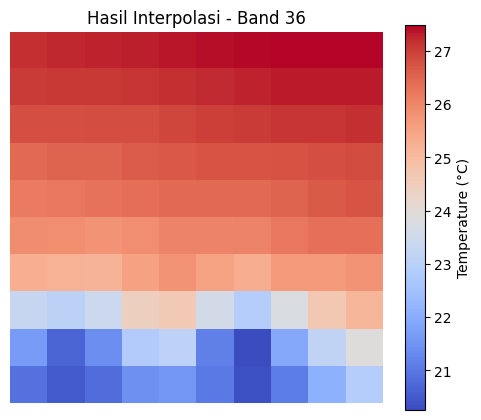

📊 Statistik Band 36 setelah interpolasi:
- Min: 20.26
- Max: 27.48
- Mean: 25.33
- Std Dev: 2.14
----------------------------------------
✅ Semua band berhasil diinterpolasi dan disimpan ke /content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/T2M_EXPORT/ERA5_T2M_Monthly_2022_2024_NaN_Interpolated.tif


In [ ]:
# # ----------------------------------
# INTERPOLATE MISSING VALUE 36 BULAN
# -----------------------------------

with rasterio.open(file_path) as src:
    profile = src.profile
    transform = src.transform
    all_data = []

    for i in range(1, src.count + 1):  # Loop through 36 bands
        print(f"🔄 Memproses band ke-{i}...")
        data = src.read(i)
        rows, cols = np.where(~np.isnan(data))
        z = data[rows, cols]

        if len(z) == 0:
            print(f"⚠️ Band {i} tidak memiliki data valid. Lewat.")
            all_data.append(data)
            continue

        x_coords, y_coords = rasterio.transform.xy(transform, rows, cols)

        ok = OrdinaryKriging(
            x_coords, y_coords, z,
            variogram_model='linear',
            verbose=False,
            enable_plotting=False
        )

        nan_rows, nan_cols = np.where(np.isnan(data))
        x_nan, y_nan = rasterio.transform.xy(transform, nan_rows, nan_cols)

        z_nan = []
        for x, y in tqdm(zip(x_nan, y_nan), total=len(x_nan), desc=f'Band {i}'):
            z_, _ = ok.execute('points', x, y)
            z_nan.append(z_[0])

        z_nan = np.array(z_nan)
        data[nan_rows, nan_cols] = z_nan


        # Tampilkan visualisasi hasil interpolasi
        plt.figure(figsize=(6, 5))
        plt.imshow(data, cmap='coolwarm')
        plt.colorbar(label='Temperature (°C)')
        plt.title(f'Hasil Interpolasi - Band {i}')
        plt.axis('off')
        plt.show()

        # Statistik dasar
        print(f"📊 Statistik Band {i} setelah interpolasi:")
        print(f"- Min: {np.nanmin(data):.2f}")
        print(f"- Max: {np.nanmax(data):.2f}")
        print(f"- Mean: {np.nanmean(data):.2f}")
        print(f"- Std Dev: {np.nanstd(data):.2f}")
        print("-" * 40)

        all_data.append(data) # Fixed indentation

# Simpan semua band
output_path = file_path.replace('.tif', '_NaN_Interpolated.tif')
profile.update(count=36)

with rasterio.open(output_path, 'w', **profile) as dst:
    for i, band_data in enumerate(all_data, start=1):
        dst.write(band_data, i)

print(f"✅ Semua band berhasil diinterpolasi dan disimpan ke {output_path}")

In [ ]:
# -------------------------------
# MEMASTIKAN TIDAK ADA NaN
# -------------------------------

import numpy as np
import rasterio

# Buka raster hasil kriging
with rasterio.open('/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/T2M_EXPORT/NAN/ERA5_T2M_Monthly_2022_2024_NaN_Interpolated.tif') as src:
    data = src.read(1)

# Cek apakah masih ada NaN
ada_nan = np.isnan(data).any()

if ada_nan:
    print("Masih ada nilai NaN di dalam raster.")
else:
    print("Tidak ada nilai NaN, semua data sudah terisi.")

import rasterio

# Path ke file TIFF
tif_path = '/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/T2M_EXPORT/NAN/ERA5_T2M_Monthly_2022_2024_NaN_Interpolated.tif'

# Buka file TIFF
with rasterio.open(tif_path) as src:
    # Dapatkan lebar dan tinggi dalam piksel
    width = src.width
    height = src.height

    print(f"Lebar raster: {width} piksel")
    print(f"Tinggi raster: {height} piksel")

Tidak ada nilai NaN, semua data sudah terisi.
Lebar raster: 10 piksel
Tinggi raster: 10 piksel


✅ ERA5_T2M_Monthly_2022_2024_NaN_Interpolated.tif berhasil di-resample ke 1000m


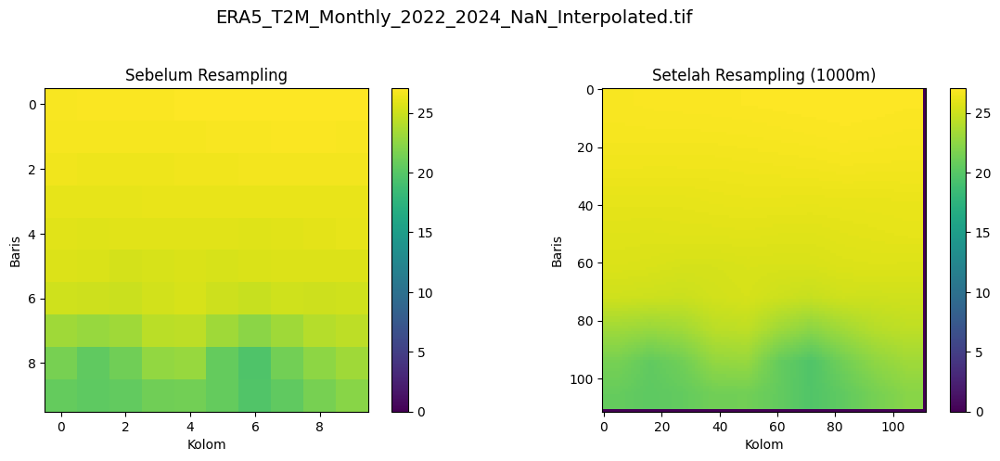

📊 Statistik Evaluasi: ERA5_T2M_Monthly_2022_2024_NaN_Interpolated.tif
- RMSE : 0.0414
- MSE  : 0.0017
- MAE  : 0.0253
- R²   : 0.9996

📁 Statistik evaluasi disimpan ke: /content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/T2M_EXPORT/DOWNSCALED/resampling_evaluation.csv


In [ ]:
#-------------------
# Downscaling
#-------------------

import rasterio
from rasterio.enums import Resampling
from rasterio.warp import calculate_default_transform, reproject
import matplotlib.pyplot as plt
import numpy as np
import os
from glob import glob
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from skimage.transform import resize
import pandas as pd

# Visualisasi sebelum dan sesudah resampling
def visualize_comparison(before_array, after_array, title):
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))
    cmap = 'viridis'

    vmin = min(np.nanmin(before_array), np.nanmin(after_array))
    vmax = max(np.nanmax(before_array), np.nanmax(after_array))

    im1 = axs[0].imshow(before_array, cmap=cmap, vmin=vmin, vmax=vmax)
    axs[0].set_title("Sebelum Resampling")
    axs[0].set_xlabel("Kolom")
    axs[0].set_ylabel("Baris")
    plt.colorbar(im1, ax=axs[0], orientation="vertical", fraction=0.05)

    im2 = axs[1].imshow(after_array, cmap=cmap, vmin=vmin, vmax=vmax)
    axs[1].set_title("Setelah Resampling (1000m)")
    axs[1].set_xlabel("Kolom")
    axs[1].set_ylabel("Baris")
    plt.colorbar(im2, ax=axs[1], orientation="vertical", fraction=0.05)

    plt.suptitle(title, fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Evaluasi statistik (resize array untuk perbandingan)
def evaluate_stats(before, after, filename):
    after_resized = resize(after, before.shape, order=1, preserve_range=True, anti_aliasing=False)

    mask = ~np.isnan(before) & ~np.isnan(after_resized)
    if np.count_nonzero(mask) == 0:
        print(f"⚠️ {filename} tidak dapat dievaluasi (semua NaN).")
        return None

    y_true = before[mask]
    y_pred = after_resized[mask]

    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)  # ⬅️ Perbaikan di sini
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)

    print(f"📊 Statistik Evaluasi: {filename}")
    print(f"- RMSE : {rmse:.4f}")
    print(f"- MSE  : {mse:.4f}")
    print(f"- MAE  : {mae:.4f}")
    print(f"- R²   : {r2:.4f}")
    print()

    return {
        "Filename": filename,
        "RMSE": rmse,
        "MSE": mse,
        "MAE": mae,
        "R2": r2
    }

# Fungsi resampling raster ke resolusi 1000m
def resample_raster_to_1km(input_path, output_path, visualize=True):
    with rasterio.open(input_path) as src:
        src_array = src.read(1)
        src_transform = src.transform
        src_crs = src.crs
        src_bounds = src.bounds

        dst_transform, width, height = calculate_default_transform(
            src_crs, src_crs, src.width, src.height, *src_bounds, resolution=1000
        )

        kwargs = src.meta.copy()
        kwargs.update({
            'crs': src_crs,
            'transform': dst_transform,
            'width': width,
            'height': height
        })

        with rasterio.open(output_path, 'w', **kwargs) as dst:
            dst_array = np.empty((height, width), dtype=src.dtypes[0])
            reproject(
                source=src_array,
                destination=dst_array,
                src_transform=src_transform,
                src_crs=src_crs,
                dst_transform=dst_transform,
                dst_crs=src_crs,
                resampling=Resampling.bilinear
            )
            dst.write(dst_array, 1)

    print(f"✅ {os.path.basename(input_path)} berhasil di-resample ke 1000m")

    if visualize:
        visualize_comparison(src_array, dst_array, os.path.basename(input_path))

    return src_array, dst_array

# === Batch Processing ===
input_folder = "/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/T2M_EXPORT/NAN"  # Ganti dengan folder raster input kamu
output_folder = "/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/T2M_EXPORT/DOWNSCALED"  # Folder hasil
os.makedirs(output_folder, exist_ok=True)

raster_files = glob(os.path.join(input_folder, "*.tif"))
results = []

for raster_file in raster_files:
    filename = os.path.basename(raster_file)
    output_path = os.path.join(output_folder, f"{os.path.splitext(filename)[0]}_resampled.tif")

    before, after = resample_raster_to_1km(raster_file, output_path, visualize=True)
    stats = evaluate_stats(before, after, filename)
    if stats:
        results.append(stats)

# Simpan hasil evaluasi ke CSV
df = pd.DataFrame(results)
csv_path = os.path.join(output_folder, "resampling_evaluation.csv")
df.to_csv(csv_path, index=False)
print(f"📁 Statistik evaluasi disimpan ke: {csv_path}")


✅ ERA5_T2M_Monthly_2022_2024_NaN_Interpolated.tif - Resampled dengan NoData: nan


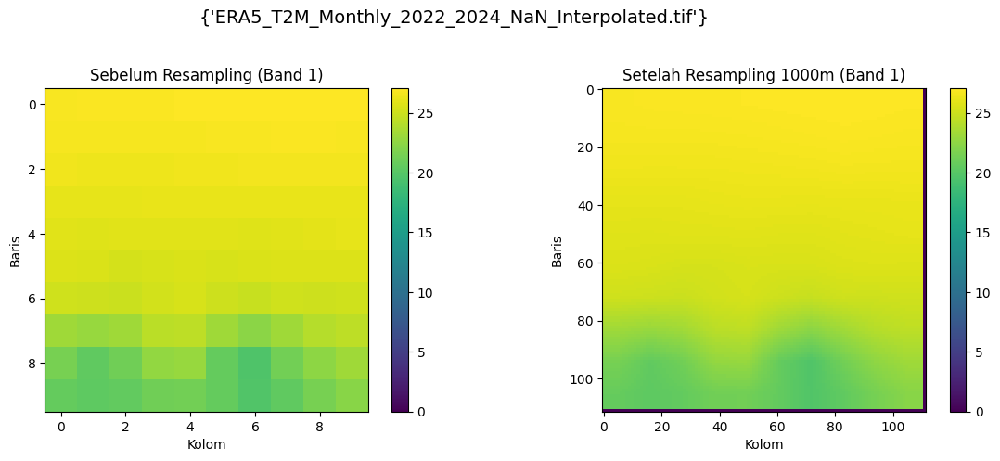

📊 Hasil evaluasi 36 band disimpan di: /content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/T2M_EXPORT/DOWNSCALED/eval_all_bands.csv


In [ ]:
#-------------------
# Downscaling Multi-Band (36 Band)
#-------------------

import rasterio
from rasterio.enums import Resampling
from rasterio.warp import calculate_default_transform, reproject
import matplotlib.pyplot as plt
import numpy as np
import os
from glob import glob
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from skimage.transform import resize
import pandas as pd

# Visualisasi sebelum dan sesudah resampling untuk band pertama
def visualize_comparison(before_array, after_array, title):
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))
    cmap = 'viridis'

    # Ambil band pertama untuk visualisasi
    before_band = np.ma.masked_invalid(before_array[0])
    after_band = np.ma.masked_invalid(after_array[0])

    vmin = min(np.nanmin(before_band), np.nanmin(after_band))
    vmax = max(np.nanmax(before_band), np.nanmax(after_band))

    im1 = axs[0].imshow(before_band, cmap=cmap, vmin=vmin, vmax=vmax)
    axs[0].set_title("Sebelum Resampling (Band 1)")
    axs[0].set_xlabel("Kolom")
    axs[0].set_ylabel("Baris")
    plt.colorbar(im1, ax=axs[0], orientation="vertical", fraction=0.05)

    im2 = axs[1].imshow(after_band, cmap=cmap, vmin=vmin, vmax=vmax)
    axs[1].set_title("Setelah Resampling 1000m (Band 1)")
    axs[1].set_xlabel("Kolom")
    axs[1].set_ylabel("Baris")
    plt.colorbar(im2, ax=axs[1], orientation="vertical", fraction=0.05)

    plt.suptitle(title, fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Evaluasi statistik untuk semua band
def evaluate_stats_all_bands(before, after, filename):
    results = []
    for band_idx in range(before.shape[0]):
        before_band = before[band_idx]
        after_band = after[band_idx]

        # Resize untuk matching shape
        after_resized = resize(after_band, before_band.shape,
                             order=1, preserve_range=True,
                             anti_aliasing=False)

        mask = ~np.isnan(before_band) & ~np.isnan(after_resized)

        if np.count_nonzero(mask) == 0:
            print(f"⚠️ {filename} Band {band_idx+1} tidak dapat dievaluasi")
            continue

        y_true = before_band[mask]
        y_pred = after_resized[mask]

        mse = mean_squared_error(y_true, y_pred)
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(y_true, y_pred)
        r2 = r2_score(y_true, y_pred)

        results.append({
            "Filename": filename,
            "Band": band_idx+1,
            "RMSE": rmse,
            "MSE": mse,
            "MAE": mae,
            "R2": r2
        })

    return results

# Fungsi resampling untuk semua band
def resample_raster_to_1km_all_bands(input_path, output_path, visualize=True):
    with rasterio.open(input_path) as src:
        # Baca semua band
        src_nodata = src.nodata if src.nodata is not None else np.nan
        src_array = src.read()  # Shape: (bands, rows, cols)
        src_array = np.where(src_array == src_nodata, np.nan, src_array)

        # Hitung transformasi output
        dst_transform, width, height = calculate_default_transform(
            src_crs, src_crs,
            src.width, src.height,
            *src_bounds,
            resolution=1000
        )

        # Siapkan array output
        dst_array = np.full((src.count, height, width), np.nan, dtype=src.dtypes[0])

        # Update metadata
        kwargs = src.meta.copy()
        kwargs.update({
            'driver': 'GTiff',
            'count': src.count,
            'crs': src_crs,
            'transform': dst_transform,
            'width': width,
            'height': height,
            'nodata': src_nodata
        })

        # Proses resampling per band
        with rasterio.open(output_path, 'w', **kwargs) as dst:
            dst_array = np.empty((src.count, height, width), dtype=src.dtypes[0])

            for band in range(src.count):
                reproject(
                    source=src_array[band],
                    destination=dst_array[band],
                    src_transform=src_transform,
                    src_crs=src_crs,
                    dst_transform=dst_transform,
                    dst_crs=src_crs,
                    resampling=Resampling.bilinear
                )
                dst.write(dst_array[band], band+1)

    print(f"✅ {os.path.basename(input_path)} - Resampled dengan NoData: {src_nodata}")

    if visualize:
        visualize_comparison(src_array, dst_array,
                           {os.path.basename(input_path)})

    return src_array, dst_array

# Batch Processing untuk semua file
input_folder = "/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/T2M_EXPORT/NAN"
output_folder = "/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/T2M_EXPORT/DOWNSCALED"
os.makedirs(output_folder, exist_ok=True)

raster_files = glob(os.path.join(input_folder, "*.tif"))
all_results = []

for raster_file in raster_files:
    filename = os.path.basename(raster_file)
    output_path = os.path.join(output_folder, f"{os.path.splitext(filename)[0]}_1km.tif")

    # Proses resampling
    before, after = resample_raster_to_1km_all_bands(raster_file, output_path)

    # Evaluasi
    stats = evaluate_stats_all_bands(before, after, filename)
    all_results.extend(stats)

# Simpan hasil evaluasi
df = pd.DataFrame(all_results)
csv_path = os.path.join(output_folder, "eval_all_bands.csv")
df.to_csv(csv_path, index=False)
print(f"📊 Hasil evaluasi 36 band disimpan di: {csv_path}")



📊 Evaluasi:
RMSE       : 0.0000
MAE        : 0.0000
R² Score   : 1.0000
Std Dev    : 2.1104


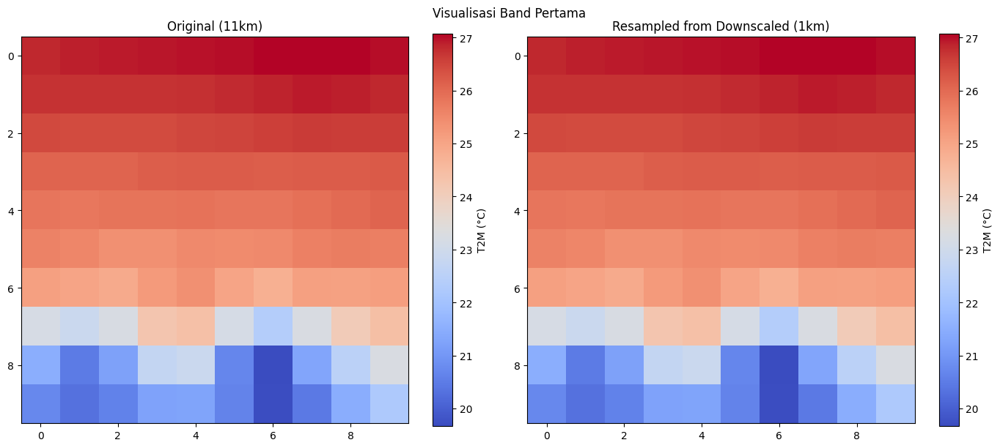

In [ ]:
# -------------
# STEP 2: Resample hasil ke ukuran asli (untuk evaluasi)
# -------------

# Upsampling to original size
src_shape = src_data.shape
upsampled = np.empty((downscaled_ds.count, src_shape[0], src_shape[1]), dtype=src_data.dtype)  # Changed to downscaled_ds.count to match the number of bands

with rasterio.open(dst_path) as downscaled_ds:  # Open downscaled dataset
    for i in range(1, downscaled_ds.count + 1):
        rasterio.warp.reproject(
            source=rasterio.band(downscaled_ds, i),
            destination=upsampled[i - 1],
            src_transform=new_transform,
            src_crs=src_crs,
            dst_transform=src_transform,  # Use original transform
            dst_crs=src_crs,
            resampling=Resampling.nearest
        )

# -------------
# STEP 3: Evaluasi Statistik
# -------------

# Asumsikan band pertama untuk evaluasi
original = src_data.flatten()
predicted = upsampled[0].flatten()

# Mask NaN
mask = ~np.isnan(original) & ~np.isnan(predicted)
original_valid = original[mask]
predicted_valid = predicted[mask]

rmse = np.sqrt(mean_squared_error(original_valid, predicted_valid))
mae = mean_absolute_error(original_valid, predicted_valid)
r2 = r2_score(original_valid, predicted_valid)
std_dev = np.std(predicted_valid)

print("\n📊 Evaluasi:")
print(f"RMSE       : {rmse:.4f}")
print(f"MAE        : {mae:.4f}")
print(f"R² Score   : {r2:.4f}")
print(f"Std Dev    : {std_dev:.4f}")

# -------------
# STEP 4: Visualisasi Band Pertama
# -------------

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.imshow(src_data, cmap='coolwarm')
plt.title('Original (11km)')
plt.colorbar(label='T2M (°C)')

plt.subplot(1, 2, 2)
plt.imshow(upsampled[0], cmap='coolwarm')
plt.title('Resampled from Downscaled (1km)')
plt.colorbar(label='T2M (°C)')

plt.suptitle('Visualisasi Band Pertama')
plt.tight_layout()
plt.show()

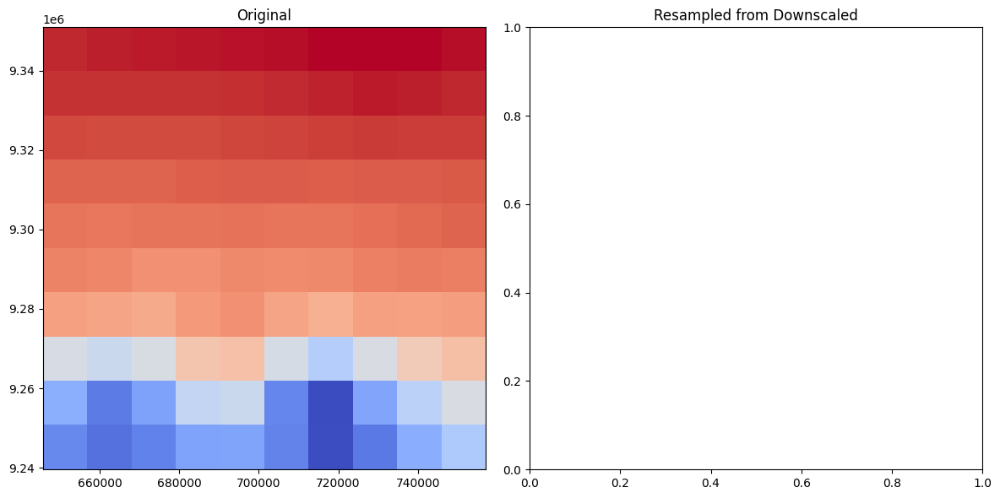

NaN values in upsampled data: False


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming the following variables are available:
# src_data: original data
# upsampled[0]: resampled data

# Define the extent of the image for both datasets
extent = [src_transform[2], src_transform[2] + src_data.shape[1] * src_transform[0],
          src_transform[5] + src_data.shape[0] * src_transform[4], src_transform[5]]

# Display both images for visual comparison
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Plot the original data
axes[0].imshow(src_data, cmap='coolwarm', extent=extent)
axes[0].set_title('Original')

# Plot the resampled data
axes[0].imshow(upsampled[0], cmap='coolwarm', extent=extent)
axes[1].set_title('Resampled from Downscaled')

plt.tight_layout()
plt.show()

# Check for NaN values in upsampled data
print("NaN values in upsampled data:", np.isnan(upsampled).any())

In [ ]:
#-----------------------------------
# CEK EPSG, DIMENSI RASTER, RESOLUSI
#-----------------------------------

# 1. DATA ORIGINAL-----------------------------------------------------------------------------------
import rasterio

with rasterio.open('/content/drive/MyDrive/T2M_EXPORT/ERA5_T2M_Monthly_2022_2024.tif') as src:
    crs = src.crs  # Mendapatkan sistem koordinat (CRS)
    print(crs)

# Path ke file TIFF
tif_path = '/content/drive/MyDrive/T2M_EXPORT/ERA5_T2M_Monthly_2022_2024.tif'  # Ganti dengan path file TIFF kamu
with rasterio.open(tif_path) as src:
    src_data = src.read(1)  # Baca band pertama
    src_shape = src_data.shape

    print("Dimensi Data Raster (src_shape):", src_shape)

# Buka file TIFF
with rasterio.open(tif_path) as src:
    # Dapatkan resolusi spasial (skala)
    resolution_x = src.res[0]  # Resolusi dalam arah x (horizontal)
    resolution_y = src.res[1]  # Resolusi dalam arah y (vertikal)

    print(f"Resolusi X (lebar piksel): {resolution_x}")
    print(f"Resolusi Y (tinggi piksel): {resolution_y}")

# 2. DATA DOWNSCALED----------------------------------------------------------------------------------
import rasterio
with rasterio.open('/content/drive/MyDrive/T2M_EXPORT/T2M_Reprojected_UTM.tif') as src:
    crs = src.crs  # Mendapatkan sistem koordinat (CRS)
    print(crs)

# Path ke file TIFF
tif_path = '/content/drive/MyDrive/T2M_EXPORT/ERA5_T2M_Downscaled_1000m.tif'  # Ganti dengan path file TIFF kamu
with rasterio.open(tif_path) as src:
    src_data = src.read(1)  # Baca band pertama
    src_shape = src_data.shape

    print("Dimensi Data Raster (src_shape):", src_shape)

# Buka file TIFF
with rasterio.open(tif_path) as src:
    # Dapatkan resolusi spasial (skala)
    resolution_x = src.res[0]  # Resolusi dalam arah x (horizontal)
    resolution_y = src.res[1]  # Resolusi dalam arah y (vertikal)

    print(f"Resolusi X (lebar piksel): {resolution_x}")
    print(f"Resolusi Y (tinggi piksel): {resolution_y}")



EPSG:32748
Dimensi Data Raster (src_shape): (10, 10)
Resolusi X (lebar piksel): 11132.0
Resolusi Y (tinggi piksel): 11132.0
EPSG:32748
Dimensi Data Raster (src_shape): (111, 111)
Resolusi X (lebar piksel): 1000.0
Resolusi Y (tinggi piksel): 1000.0


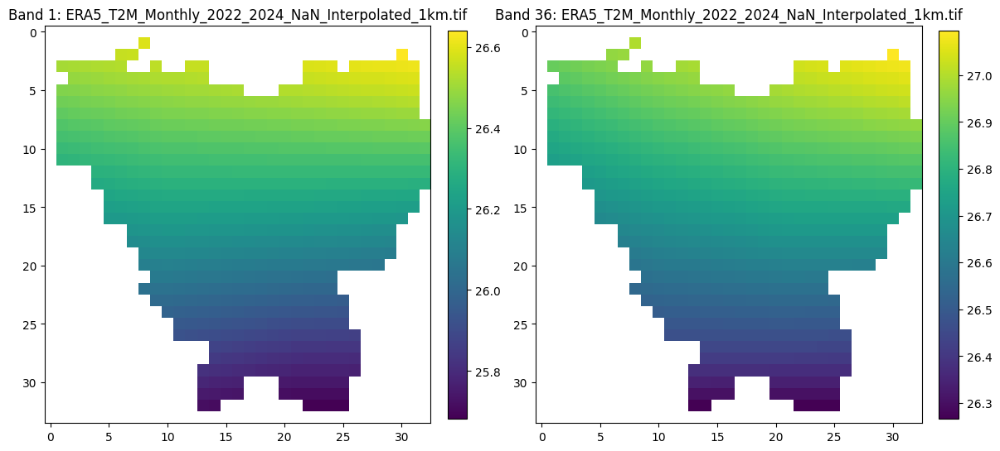

✅ Processed multiband: ERA5_T2M_Monthly_2022_2024_NaN_Interpolated_1km.tif


In [ ]:
#-------------------------
# CLIP DOWNSCALED (MULTIBAND)
#-------------------------
import rasterio
from rasterio.mask import mask
import geopandas as gpd
import numpy as np
import os
from glob import glob
import matplotlib.pyplot as plt

# === 1. BACA SHAPEFILE BATAS ADMINISTRASI ===
shapefile_path = '/content/drive/MyDrive/PENGOLAHAN/DKI Jakarta/DKI Jakarta.shp'
gdf = gpd.read_file(shapefile_path)

# === 2. DAFTAR SEMUA FILE RASTER YANG MAU DIOLAH ===
input_folder = '/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/T2M_EXPORT/DOWNSCALED'  # folder berisi hasil resampling
output_folder = '/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/T2M_EXPORT/CLIP'
os.makedirs(output_folder, exist_ok=True)
raster_files = sorted(glob(os.path.join(input_folder, '*.tif')))

# === 3. LOOP UNTUK SETIAP FILE RASTER ===
for raster_path in raster_files:
    with rasterio.open(raster_path) as src:
        raster_data = src.read()  # ⬅️ Ambil semua band (multiband)
        raster_meta = src.meta.copy()

        # Cek dan samakan CRS shapefile
        if gdf.crs != src.crs:
            gdf = gdf.to_crs(src.crs)

        # Gunakan nilai nodata asli
        nodata_value = src.nodata

        # Crop dan mask semua band
        out_image, out_transform = mask(
            src,
            gdf.geometry,
            crop=True,
            nodata=nodata_value
        )

        # Update metadata
        out_meta = raster_meta.copy()
        out_meta.update({
            "driver": "GTiff",
            "height": out_image.shape[1],
            "width": out_image.shape[2],
            "count": out_image.shape[0],  # ⬅️ Total band
            "transform": out_transform,
            "nodata": nodata_value
        })

        # Nama file output
        filename = os.path.basename(raster_path)
        output_path = os.path.join(output_folder, f"Jakarta_{filename}")

        # Simpan hasil raster clipped
        with rasterio.open(output_path, "w", **out_meta) as dest:
            dest.write(out_image)

        # === VISUALISASI: Band 1 & terakhir ===
        fig, ax = plt.subplots(1, 2, figsize=(12, 6))
        im1 = ax[0].imshow(out_image[0], cmap='viridis')
        ax[0].set_title(f"Band 1: {filename}")
        plt.colorbar(im1, ax=ax[0], fraction=0.046, pad=0.04)

        im2 = ax[1].imshow(out_image[-1], cmap='viridis')
        ax[1].set_title(f"Band {out_image.shape[0]}: {filename}")
        plt.colorbar(im2, ax=ax[1], fraction=0.046, pad=0.04)

        plt.tight_layout()
        plt.show()

    print(f"✅ Processed multiband: {filename}")


In [ ]:
#-------------------------
# CLIP DATA ASLI
#-------------------------
import rasterio
from rasterio.mask import mask
import geopandas as gpd
import numpy as np
import os
from glob import glob
import matplotlib.pyplot as plt

# === 1. BACA SHAPEFILE BATAS ADMINISTRASI ===
shapefile_path = '/content/drive/MyDrive/PENGOLAHAN/DKI Jakarta/DKI Jakarta.shp'
gdf = gpd.read_file(shapefile_path)

# === 2. DAFTAR SEMUA FILE RASTER YANG MAU DIOLAH ===
input_folder = '/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/T2M_EXPORT'  # folder berisi hasil resampling
output_folder = '/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/T2M_EXPORT/CLIP'
os.makedirs(output_folder, exist_ok=True)
raster_files = sorted(glob(os.path.join(input_folder, '*.tif')))

# === 3. LOOP UNTUK SETIAP FILE RASTER ===
for raster_path in raster_files:
    with rasterio.open(raster_path) as src:
        raster_data = src.read(1)
        raster_meta = src.meta.copy()

        # Cek dan samakan CRS shapefile
        if gdf.crs != src.crs:
            gdf = gdf.to_crs(src.crs)

        # Gunakan nilai nodata asli
        nodata_value = src.nodata

        # Crop dan mask dengan nodata asli
        out_image, out_transform = mask(
            src,
            gdf.geometry,
            crop=True,
            nodata=nodata_value  # GUNAKAN nodata asli
        )

        # Update metadata
        out_meta = raster_meta.copy()
        out_meta.update({
            "driver": "GTiff",
            "height": out_image.shape[1],
            "width": out_image.shape[2],
            "transform": out_transform,
            "nodata": nodata_value
        })

        # Nama file output
        filename = os.path.basename(raster_path)
        output_path = os.path.join(output_folder, f"Jakarta_{filename}")

        # Simpan hasil raster clipped
        with rasterio.open(output_path, "w", **out_meta) as dest:
            dest.write(out_image)

        # === VISUALISASI SEBELUM DAN SESUDAH CLIPPING ===
        fig, ax = plt.subplots(1, 2, figsize=(12, 6))
        im1 = ax[0].imshow(raster_data, cmap='viridis')
        ax[0].set_title(f"Asli: {filename}")
        plt.colorbar(im1, ax=ax[0], fraction=0.046, pad=0.04)

        im2 = ax[1].imshow(out_image[0], cmap='viridis')
        ax[1].set_title(f"Clipped: {filename}")
        plt.colorbar(im2, ax=ax[1], fraction=0.046, pad=0.04)

        plt.tight_layout()
        plt.show()

    print(f"Processed and visualized: {filename}")


In [ ]:
#-------------------------
# INFORMASI NAN PASCA CLIP
#-------------------------

import rasterio
import numpy as np
import pandas as pd

# 1. Buka file TIFF
tif_path = '/content/drive/MyDrive/T2M_EXPORT/T2M_1km_DownscaledCLIP/Jakarta_ERA5_T2M_Monthly_2022_2024_NaN_resampled.tif'
with rasterio.open(tif_path) as src:
    data = src.read()  # (bands, height, width)
    profile = src.profile

# 2. Siapkan list bulan (label)
start_year = 2022
start_month = 1
labels = []
for i in range(36):
    year = start_year + (start_month + i - 1) // 12
    month = (start_month + i - 1) % 12 + 1
    labels.append(f"{year:04d}-{month:02d}")

# 3. Hitung valid_ratio dan missing_ratio
valid_ratios = []
missing_ratios_percent = []

for i in range(data.shape[0]):  # untuk tiap band
    band = data[i, :, :]
    total_pixels = band.size
    valid_pixels = np.count_nonzero(~np.isnan(band))
    valid_ratio = valid_pixels / total_pixels
    missing_ratio = 1.0 - valid_ratio

    valid_ratios.append(valid_ratio)
    missing_ratios_percent.append(missing_ratio * 100)

# 4. Buat dataframe ringkasan
summary_df = pd.DataFrame({
    'label': labels,
    'valid_ratio': valid_ratios,
    'missing_ratio_percent': missing_ratios_percent
})

# 5. Tampilkan
print(summary_df)

# 6. (Opsional) Simpan ke CSV
summary_df.to_csv('/content/drive/MyDrive/T2M_EXPORT/T2M_1km_DownscaledCLIP/valid_missing_summaryclip.csv', index=False)


      label  valid_ratio  missing_ratio_percent
0   2022-01          1.0                    0.0
1   2022-02          1.0                    0.0
2   2022-03          1.0                    0.0
3   2022-04          1.0                    0.0
4   2022-05          1.0                    0.0
5   2022-06          1.0                    0.0
6   2022-07          1.0                    0.0
7   2022-08          1.0                    0.0
8   2022-09          1.0                    0.0
9   2022-10          1.0                    0.0
10  2022-11          1.0                    0.0
11  2022-12          1.0                    0.0
12  2023-01          1.0                    0.0
13  2023-02          1.0                    0.0
14  2023-03          1.0                    0.0
15  2023-04          1.0                    0.0
16  2023-05          1.0                    0.0
17  2023-06          1.0                    0.0
18  2023-07          1.0                    0.0
19  2023-08          1.0                

In [ ]:
import geopandas as gpd
import rioxarray
import pandas as pd

# 1. Load shapefile centroid
shapefile_path = '/content/drive/MyDrive/PENGOLAHAN/Grid Jakarta/grid_dki_centroid.shp'  # path ke shapefile kamu
centroids = gpd.read_file(shapefile_path)

# 2. Load stacked raster
stacked_raster = rioxarray.open_rasterio('/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/T2M_EXPORT/T2M_1km_DownscaledCLIP/Jakarta_ERA5_T2M_Monthly_2022_2024_NaN_resampled.tif')

# 3. Samakan CRS
if centroids.crs != stacked_raster.rio.crs:
    centroids = centroids.to_crs(stacked_raster.rio.crs)

# 4. Ekstraksi nilai NO2 untuk tiap Grid_ID
results = []

# List tanggal atau bulan sesuai jumlah band (36 band)
waktu_list = pd.date_range(start='2022-01-01', periods=stacked_raster.sizes['band'], freq='MS').strftime('%Y-%m').tolist()

for idx, row in centroids.iterrows():
    x, y = row.geometry.x, row.geometry.y
    sampled = stacked_raster.sel(x=x, y=y, method="nearest")
    values = sampled.values  # array berisi nilai semua band

    for i, value in enumerate(values):
        results.append({
            'Grid_ID': row['grid_id'],     # ganti dengan kolom ID di shapefile kamu
            'Lat': y,
            'Lon': x,
            'Waktu': waktu_list[i],
            't2m': value
        })

# 5. Buat DataFrame
df = pd.DataFrame(results)


import pandas as pd

# Set agar semua baris tampil
pd.set_option('display.max_rows', None)

# Print semua hasil
print(df)

      Grid_ID           Lat            Lon    Waktu        t2m
0      G_0000  9.317517e+06  687031.450220  2022-01  26.305479
1      G_0000  9.317517e+06  687031.450220  2022-02   0.000000
2      G_0000  9.317517e+06  687031.450220  2022-03   0.000000
3      G_0000  9.317517e+06  687031.450220  2022-04   0.000000
4      G_0000  9.317517e+06  687031.450220  2022-05   0.000000
5      G_0000  9.317517e+06  687031.450220  2022-06   0.000000
6      G_0000  9.317517e+06  687031.450220  2022-07   0.000000
7      G_0000  9.317517e+06  687031.450220  2022-08   0.000000
8      G_0000  9.317517e+06  687031.450220  2022-09   0.000000
9      G_0000  9.317517e+06  687031.450220  2022-10   0.000000
10     G_0000  9.317517e+06  687031.450220  2022-11   0.000000
11     G_0000  9.317517e+06  687031.450220  2022-12   0.000000
12     G_0000  9.317517e+06  687031.450220  2023-01   0.000000
13     G_0000  9.317517e+06  687031.450220  2023-02   0.000000
14     G_0000  9.317517e+06  687031.450220  2023-03   0

In [ ]:
# 6. Simpan ke CSV
df.to_excel('/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/T2M_EXPORT/T2M_1km_DownscaledCLIP/T2M_Values.xlsx', index=False)

print("Ekstraksi selesai dan file disimpan dengan header Grid_ID, Lat, Lon, Waktu, T2M.")

# GEE Version 10M V Wind

In [ ]:
# Melakukan autentikasi dan mendefinisikan Google Cloud Project yang akan digunakan
ee.Authenticate()
ee.Initialize(project='ee-sidangapril2024')
Map = geemap.Map()
Map
AOI = ee.FeatureCollection("projects/ee-sidangapril2024/assets/JABODETABEK")
#AOI= ee.FeatureCollection("projects/ee-sidangapril2024/assets/DKI_JAKARTA")
Map.addLayer(AOI, {}, "AOI")
Map.centerObject(AOI, 8)

# Rentang waktu
time_start = '2022-01-01'
time_end = '2024-12-31'

In [ ]:
#-------------------
# PENGUNDUHAN
#-------------------

import ee
import geemap

# Inisialisasi Earth Engine
ee.Authenticate()
ee.Initialize(project='ee-sidangapril2024')

# Definisikan Area of Interest (AOI)
AOI = ee.FeatureCollection("projects/ee-sidangapril2024/assets/JABODETABEK")

# Koleksi ERA5-Land hourly
era5_collection = ee.ImageCollection('ECMWF/ERA5_LAND/HOURLY')

# Rentang waktu: Januari 2022 - Desember 2024 (sesuaikan jika perlu)
start_date = ee.Date('2022-01-01')
end_date = ee.Date('2024-12-31')

# Buat list bulan
months = ee.List.sequence(0, end_date.difference(start_date, 'month'))

# Fungsi untuk menghitung rata-rata bulanan
def calculate_monthly_mean(month_offset):
    start = start_date.advance(month_offset, 'month')
    end = start.advance(1, 'month')
    year_month = start.format('YYYY-MM')
    filtered_collection = era5_collection.filterDate(start, end)
    v_component_wind = filtered_collection.select('v_component_of_wind_10m') \
        .mean() \
        .clip(AOI) \
        .rename([year_month]) \
        .set('system:time_start', start.millis())
    return v_component_wind

# Hitung rata-rata bulanan untuk setiap bulan
monthly_means = months.map(calculate_monthly_mean)
multi_band_image = ee.ImageCollection(monthly_means).toBands()

# Gabungkan menjadi ImageCollection
monthly_collection = ee.ImageCollection(monthly_means)

# Visualisasi (contoh untuk bulan pertama)
first_month_mean = monthly_collection.first()
vis_params = {
    'min': 20,
    'max': 35,
    'palette': ['blue', 'green', 'yellow', 'red']
}

Map = geemap.Map()
Map.centerObject(AOI, 8)
Map.addLayer(first_month_mean, vis_params, '10m v component of wind')
Map.addLayer(AOI, {}, 'AOI')
Map

Map(center=[-6.375912206265441, 106.80576119247223], controls=(WidgetControl(options=['position', 'transparent…

In [ ]:
#-------------------
# PENYIMPANAN
#-------------------

# Export ke Google Drive
task = ee.batch.Export.image.toDrive(
    image=multi_band_image,
    description='monthly_10m_v_wind',
        folder='10v_EXPORT',
    fileNamePrefix='ERA5_10v_Monthly_2022_2024',
    region=AOI.geometry(),
    scale=11132,  # skala asli ERA5-Land
    crs='EPSG:32748',
    maxPixels=1e13
)
task.start()

In [ ]:
#-------------------
# MELIHAT INFORMASI
#-------------------

import rasterio
from rasterio.plot import show
import os
import numpy as np

# Buka file multiband
file_path = '/content/drive/MyDrive/10v_EXPORT/ERA5_10v_Monthly_2022_2024.tif'
with rasterio.open(file_path) as src:
    print("✅ Informasi Umum")
    print(f"- CRS: {src.crs}")
    print(f"- Resolusi (meter): {src.res}")
    print(f"- Ukuran raster: {src.width} x {src.height}")
    print(f"- Jumlah band: {src.count}")
    print(f"- Bounds: {src.bounds}")

    print("\n📦 Statistik per band:")
    for i in range(1, src.count + 1):
        band = src.read(i)
        band_name = f"Band {i}"  # Atau bisa pakai nama dari metadata jika tersedia
        print(f" {band_name}: min={np.nanmin(band):.2f}, max={np.nanmax(band):.2f}, mean={np.nanmean(band):.2f}")

    print("\n📝 Metadata tambahan (jika ada):")
    print(src.tags())


✅ Informasi Umum
- CRS: EPSG:32748
- Resolusi (meter): (11132.0, 11132.0)
- Ukuran raster: 10 x 10
- Jumlah band: 36
- Bounds: BoundingBox(left=645656.0, bottom=9239560.0, right=756976.0, top=9350880.0)

📦 Statistik per band:
 Band 1: min=-0.75, max=0.32, mean=-0.07
 Band 2: min=-0.60, max=0.19, mean=-0.09
 Band 3: min=-0.10, max=0.72, mean=0.36
 Band 4: min=0.15, max=0.62, mean=0.35
 Band 5: min=-0.07, max=0.25, mean=0.14
 Band 6: min=0.10, max=0.45, mean=0.26
 Band 7: min=-0.17, max=0.36, mean=0.07
 Band 8: min=-0.17, max=0.20, mean=0.02
 Band 9: min=-0.11, max=0.30, mean=0.14
 Band 10: min=-0.10, max=0.65, mean=0.32
 Band 11: min=0.08, max=0.83, mean=0.40
 Band 12: min=-0.17, max=0.57, mean=0.22
 Band 13: min=-0.47, max=0.77, mean=0.28
 Band 14: min=-0.62, max=0.48, mean=0.05
 Band 15: min=-0.44, max=0.28, mean=0.02
 Band 16: min=0.18, max=0.66, mean=0.41
 Band 17: min=-0.05, max=0.26, mean=0.12
 Band 18: min=-0.17, max=0.17, mean=0.04
 Band 19: min=-0.37, max=0.28, mean=-0.05
 Band

Jumlah file ditemukan: 2


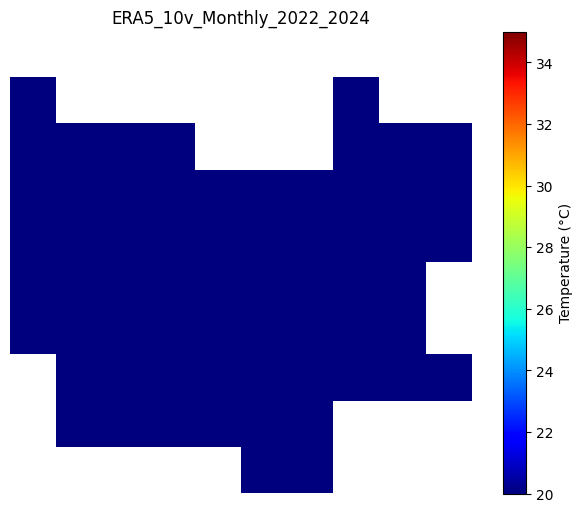

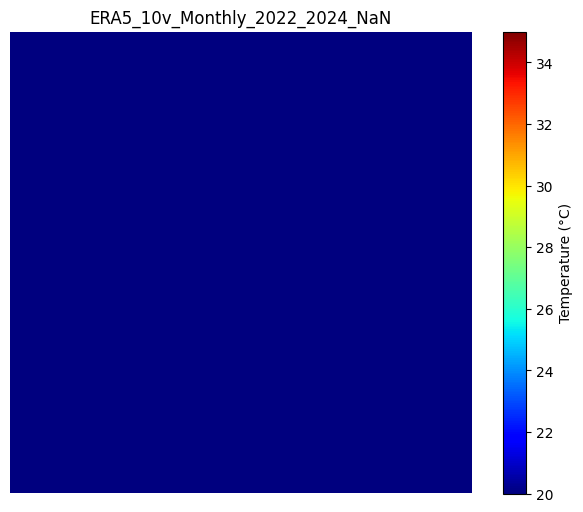

In [ ]:
#----------------------
# MELIHAT VISUALISASI
#----------------------

import os
import glob
import rasterio
import matplotlib.pyplot as plt

# Path folder hasil ekspor
folder_path = '/content/drive/MyDrive/10v_EXPORT'  # Ganti dengan folder lokal kamu

# Cari semua file .tif di folder
tif_files = sorted(glob.glob(os.path.join(folder_path, '*.tif')))

print(f"Jumlah file ditemukan: {len(tif_files)}")

# Loop dan tampilkan
for tif_file in tif_files:
    with rasterio.open(tif_file) as src:
        image = src.read(1)  # baca band 1
        profile = src.profile

    plt.figure(figsize=(8, 6))
    plt.imshow(image, cmap='jet', vmin=20, vmax=35)  # vmin & vmax bisa disesuaikan
    plt.colorbar(label='Temperature (°C)')
    plt.title(os.path.basename(tif_file).replace('.tif', ''))
    plt.axis('off')
    plt.show()

In [ ]:
#-------------------
# INFORMASI MISSING
#-------------------

# Step 1: Tambahkan label (YYYY-MM) dan valid_ratio ke setiap image

def add_valid_ratio(image):
    band_name = 'v10'  # Ganti dengan nama band yang sesuai

    # Mask menunjukkan piksel valid
    mask = image.mask().gt(0)

    # Hitung luas area valid (m²)
    valid_area_image = mask.multiply(ee.Image.pixelArea())
    area_stats = valid_area_image.reduceRegion(
        reducer=ee.Reducer.sum(),
        geometry=AOI.geometry(),  # jika AOI berupa FeatureCollection
        scale=1000,
        maxPixels=1e13
    )

    # Luas valid & total AOI
    valid_area = ee.Number(area_stats.get(band_name))
    total_area = AOI.geometry().area()

    # Rasio valid dan missing
    valid_ratio = valid_area.divide(total_area)
    missing_ratio = ee.Number(1.0).subtract(valid_ratio)

    # Tambahkan ke metadata image
    image = image.set('valid_ratio', valid_ratio)
    image = image.set('missing_ratio', missing_ratio)  # missing ratio as a number (0-1)
    image = image.set('missing_ratio_percent', missing_ratio.multiply(100))  # missing ratio as percentage
    return image


def calculate_monthly_mean_with_ratio(month_offset):
    start = start_date.advance(month_offset, 'month')
    end = start.advance(1, 'month')
    label = start.format('YYYY-MM')

    filtered = era5_collection.filterDate(start, end)
    monthly_mean = filtered.select('v_component_of_wind_10m') \
        .mean() \
        .clip(AOI) \
        .rename('v10') \
        .set('label', label)

    # Tambahkan valid_ratio dan missing_ratio
    return add_valid_ratio(monthly_mean)

# Step 2: Buat koleksi dengan rasio valid
monthly_collection = ee.ImageCollection(months.map(calculate_monthly_mean_with_ratio))

# Step 3: Konversi ke FeatureCollection untuk ringkasan
def image_to_feature(image):
    return ee.Feature(None, {
        'label': image.get('label'),
        'valid_ratio': image.get('valid_ratio'),
        'missing_ratio_percent': image.get('missing_ratio'),
    })

missing_ratio_fc = monthly_collection.map(image_to_feature)

# Step 4: Cetak hasil
print(missing_ratio_fc.aggregate_array('label').getInfo())
print(missing_ratio_fc.aggregate_array('missing_ratio_percent').getInfo())

['2022-01', '2022-02', '2022-03', '2022-04', '2022-05', '2022-06', '2022-07', '2022-08', '2022-09', '2022-10', '2022-11', '2022-12', '2023-01', '2023-02', '2023-03', '2023-04', '2023-05', '2023-06', '2023-07', '2023-08', '2023-09', '2023-10', '2023-11', '2023-12', '2024-01', '2024-02', '2024-03', '2024-04', '2024-05', '2024-06', '2024-07', '2024-08', '2024-09', '2024-10', '2024-11', '2024-12']
[0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.067957274915

🔄 Memproses band ke-1...


Band 1: 100%|██████████| 36/36 [00:00<00:00, 442.47it/s]


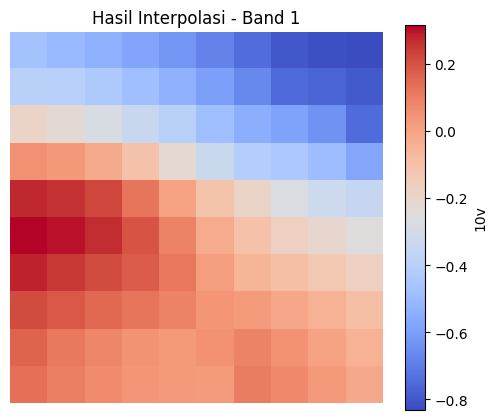

📊 Statistik Band 1 setelah interpolasi:
- Min: -0.83
- Max: 0.32
- Mean: -0.17
- Std Dev: 0.32
----------------------------------------
🔄 Memproses band ke-2...


Band 2: 100%|██████████| 36/36 [00:00<00:00, 131.15it/s]


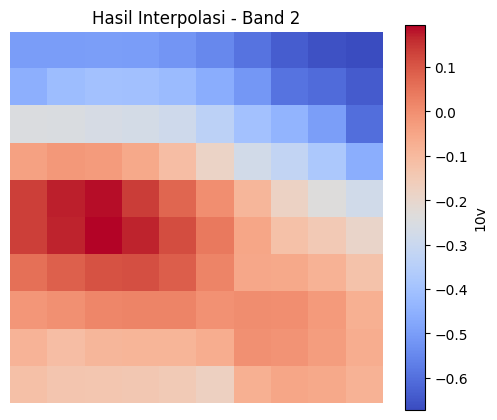

📊 Statistik Band 2 setelah interpolasi:
- Min: -0.67
- Max: 0.19
- Mean: -0.17
- Std Dev: 0.23
----------------------------------------
🔄 Memproses band ke-3...


Band 3: 100%|██████████| 36/36 [00:00<00:00, 182.47it/s]


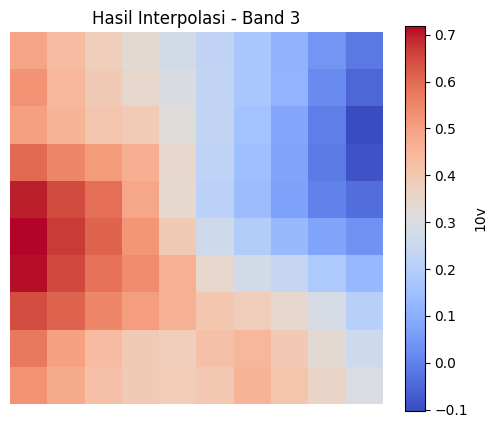

📊 Statistik Band 3 setelah interpolasi:
- Min: -0.10
- Max: 0.72
- Mean: 0.34
- Std Dev: 0.20
----------------------------------------
🔄 Memproses band ke-4...


Band 4: 100%|██████████| 36/36 [00:00<00:00, 262.74it/s]


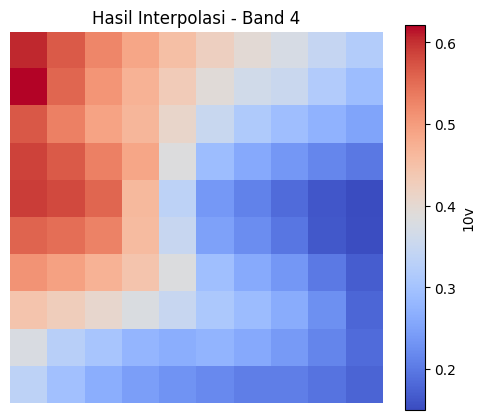

📊 Statistik Band 4 setelah interpolasi:
- Min: 0.15
- Max: 0.62
- Mean: 0.35
- Std Dev: 0.13
----------------------------------------
🔄 Memproses band ke-5...


Band 5: 100%|██████████| 36/36 [00:00<00:00, 115.34it/s]


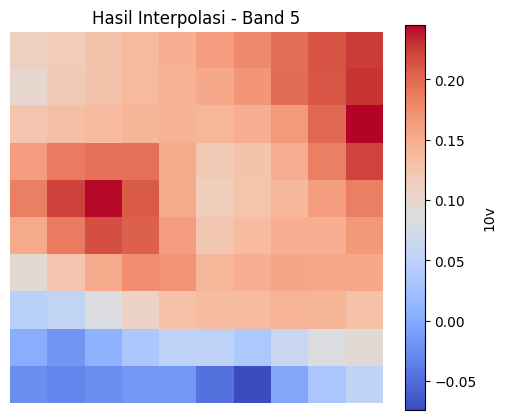

📊 Statistik Band 5 setelah interpolasi:
- Min: -0.07
- Max: 0.25
- Mean: 0.13
- Std Dev: 0.07
----------------------------------------
🔄 Memproses band ke-6...


Band 6: 100%|██████████| 36/36 [00:00<00:00, 591.36it/s]


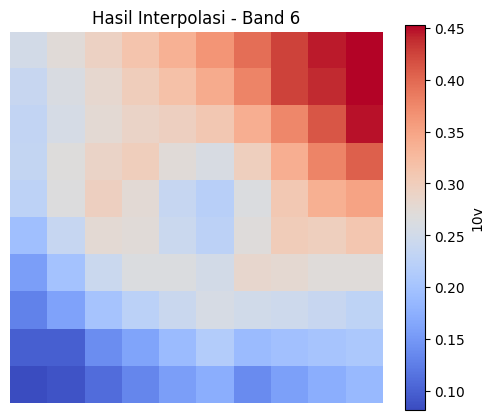

📊 Statistik Band 6 setelah interpolasi:
- Min: 0.08
- Max: 0.45
- Mean: 0.26
- Std Dev: 0.09
----------------------------------------
🔄 Memproses band ke-7...


Band 7: 100%|██████████| 36/36 [00:00<00:00, 269.80it/s]


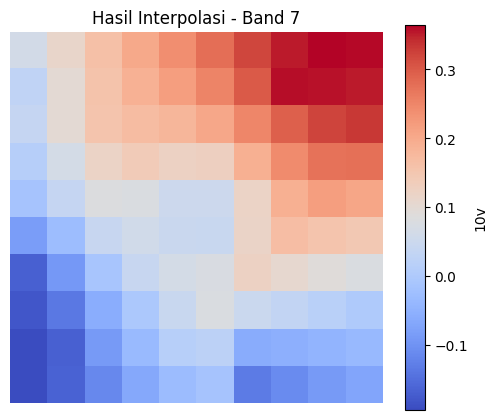

📊 Statistik Band 7 setelah interpolasi:
- Min: -0.19
- Max: 0.36
- Mean: 0.09
- Std Dev: 0.14
----------------------------------------
🔄 Memproses band ke-8...


Band 8: 100%|██████████| 36/36 [00:00<00:00, 266.17it/s]


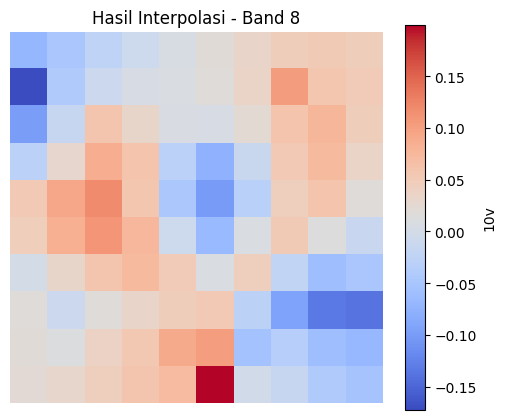

📊 Statistik Band 8 setelah interpolasi:
- Min: -0.17
- Max: 0.20
- Mean: 0.01
- Std Dev: 0.06
----------------------------------------
🔄 Memproses band ke-9...


Band 9: 100%|██████████| 36/36 [00:00<00:00, 336.64it/s]


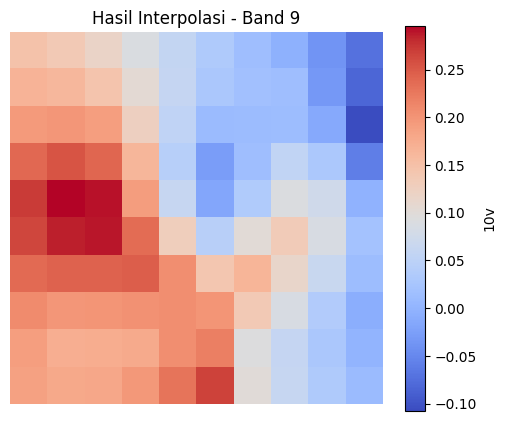

📊 Statistik Band 9 setelah interpolasi:
- Min: -0.11
- Max: 0.30
- Mean: 0.11
- Std Dev: 0.10
----------------------------------------
🔄 Memproses band ke-10...


Band 10: 100%|██████████| 36/36 [00:00<00:00, 370.61it/s]


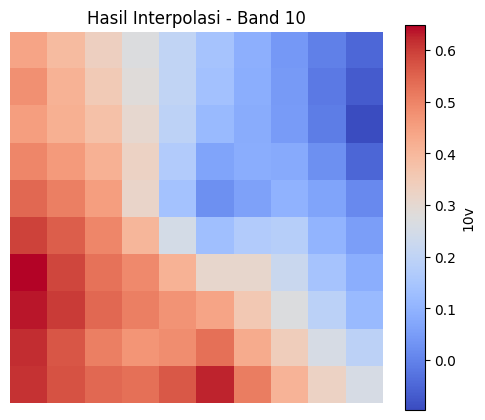

📊 Statistik Band 10 setelah interpolasi:
- Min: -0.10
- Max: 0.65
- Mean: 0.30
- Std Dev: 0.21
----------------------------------------
🔄 Memproses band ke-11...


Band 11: 100%|██████████| 36/36 [00:00<00:00, 446.36it/s]


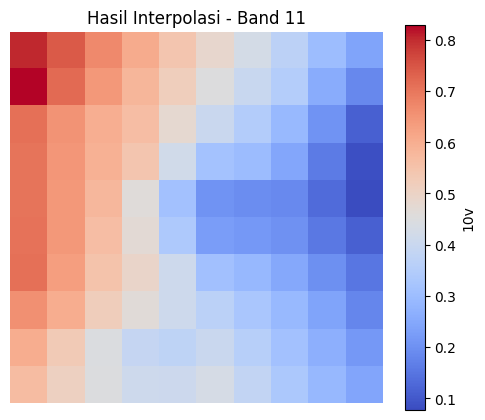

📊 Statistik Band 11 setelah interpolasi:
- Min: 0.08
- Max: 0.83
- Mean: 0.42
- Std Dev: 0.18
----------------------------------------
🔄 Memproses band ke-12...


Band 12: 100%|██████████| 36/36 [00:00<00:00, 204.71it/s]


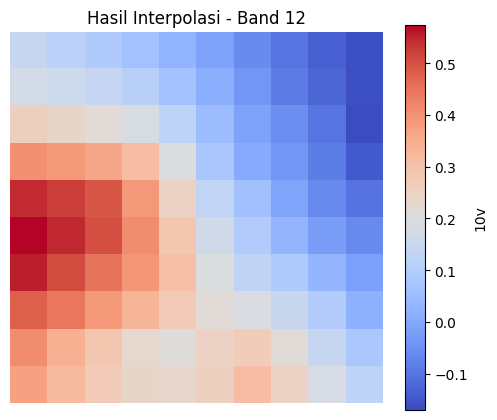

📊 Statistik Band 12 setelah interpolasi:
- Min: -0.17
- Max: 0.57
- Mean: 0.17
- Std Dev: 0.19
----------------------------------------
🔄 Memproses band ke-13...


Band 13: 100%|██████████| 36/36 [00:00<00:00, 170.05it/s]


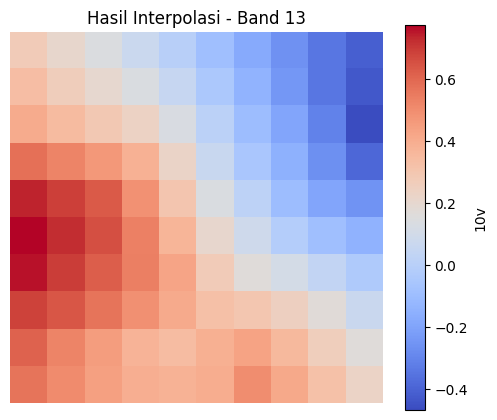

📊 Statistik Band 13 setelah interpolasi:
- Min: -0.47
- Max: 0.77
- Mean: 0.22
- Std Dev: 0.31
----------------------------------------
🔄 Memproses band ke-14...


Band 14: 100%|██████████| 36/36 [00:00<00:00, 152.47it/s]


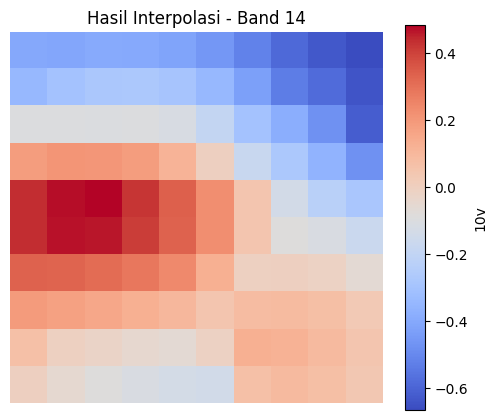

📊 Statistik Band 14 setelah interpolasi:
- Min: -0.67
- Max: 0.48
- Mean: -0.05
- Std Dev: 0.29
----------------------------------------
🔄 Memproses band ke-15...


Band 15: 100%|██████████| 36/36 [00:00<00:00, 354.00it/s]


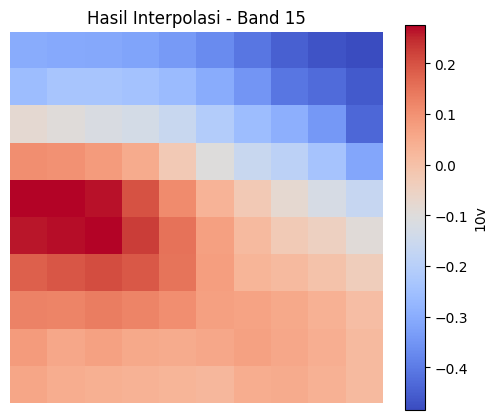

📊 Statistik Band 15 setelah interpolasi:
- Min: -0.48
- Max: 0.28
- Mean: -0.05
- Std Dev: 0.20
----------------------------------------
🔄 Memproses band ke-16...


Band 16: 100%|██████████| 36/36 [00:00<00:00, 279.50it/s]


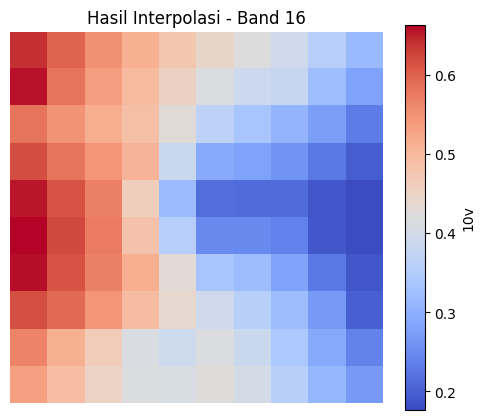

📊 Statistik Band 16 setelah interpolasi:
- Min: 0.18
- Max: 0.66
- Mean: 0.41
- Std Dev: 0.14
----------------------------------------
🔄 Memproses band ke-17...


Band 17: 100%|██████████| 36/36 [00:00<00:00, 493.73it/s]


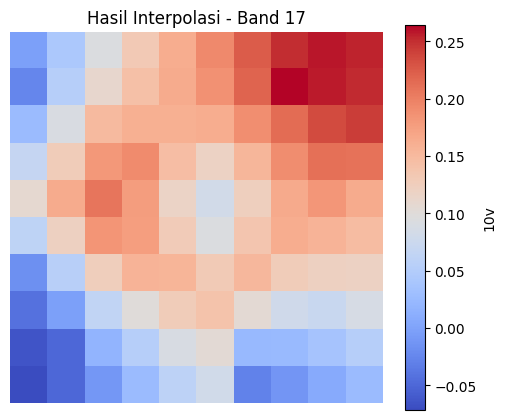

📊 Statistik Band 17 setelah interpolasi:
- Min: -0.07
- Max: 0.26
- Mean: 0.11
- Std Dev: 0.08
----------------------------------------
🔄 Memproses band ke-18...


Band 18: 100%|██████████| 36/36 [00:00<00:00, 100.88it/s]


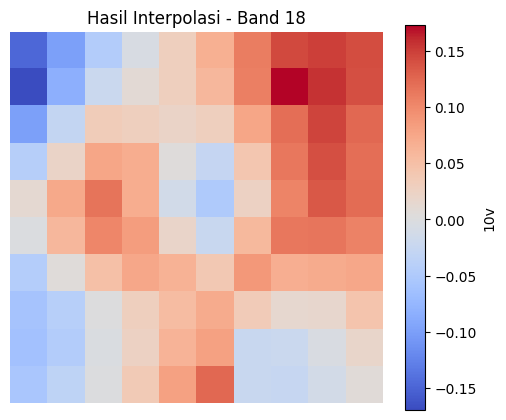

📊 Statistik Band 18 setelah interpolasi:
- Min: -0.17
- Max: 0.17
- Mean: 0.04
- Std Dev: 0.07
----------------------------------------
🔄 Memproses band ke-19...


Band 19: 100%|██████████| 36/36 [00:00<00:00, 282.63it/s]


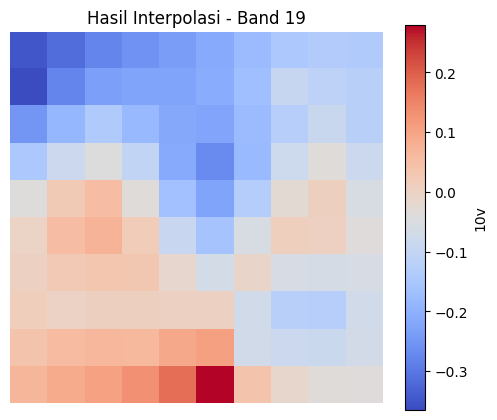

📊 Statistik Band 19 setelah interpolasi:
- Min: -0.37
- Max: 0.28
- Mean: -0.08
- Std Dev: 0.12
----------------------------------------
🔄 Memproses band ke-20...


Band 20: 100%|██████████| 36/36 [00:00<00:00, 116.77it/s]


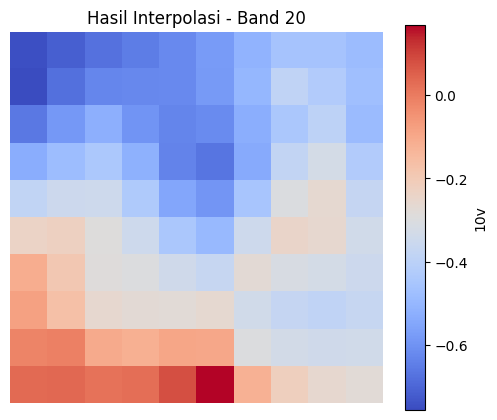

📊 Statistik Band 20 setelah interpolasi:
- Min: -0.76
- Max: 0.17
- Mean: -0.37
- Std Dev: 0.20
----------------------------------------
🔄 Memproses band ke-21...


Band 21: 100%|██████████| 36/36 [00:00<00:00, 447.43it/s]


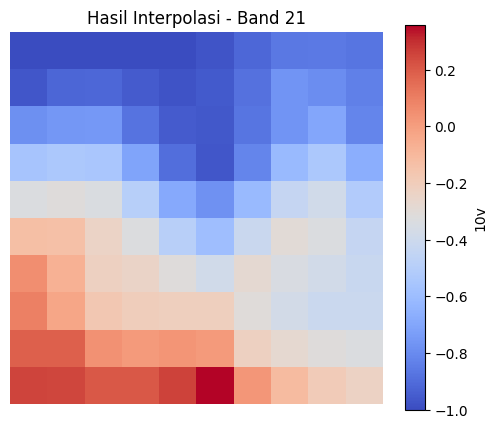

📊 Statistik Band 21 setelah interpolasi:
- Min: -1.00
- Max: 0.36
- Mean: -0.46
- Std Dev: 0.37
----------------------------------------
🔄 Memproses band ke-22...


Band 22: 100%|██████████| 36/36 [00:00<00:00, 126.77it/s]


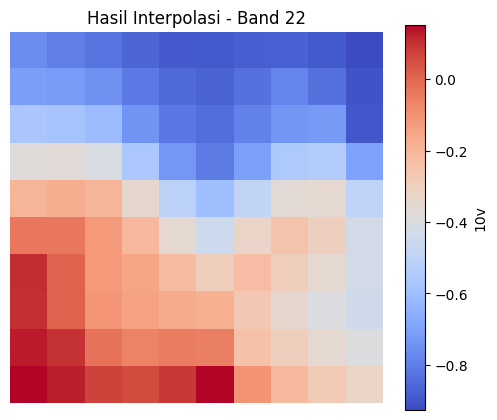

📊 Statistik Band 22 setelah interpolasi:
- Min: -0.93
- Max: 0.15
- Mean: -0.41
- Std Dev: 0.32
----------------------------------------
🔄 Memproses band ke-23...


Band 23: 100%|██████████| 36/36 [00:00<00:00, 64.09it/s]


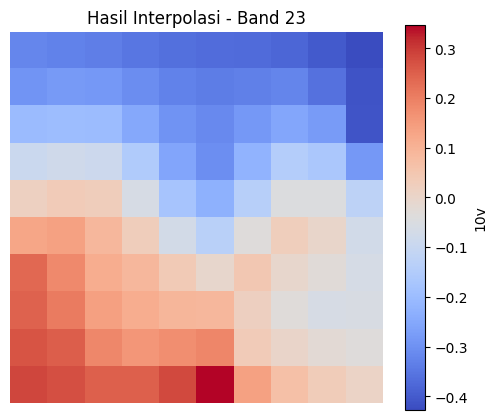

📊 Statistik Band 23 setelah interpolasi:
- Min: -0.43
- Max: 0.35
- Mean: -0.08
- Std Dev: 0.21
----------------------------------------
🔄 Memproses band ke-24...


Band 24: 100%|██████████| 36/36 [00:01<00:00, 29.82it/s]


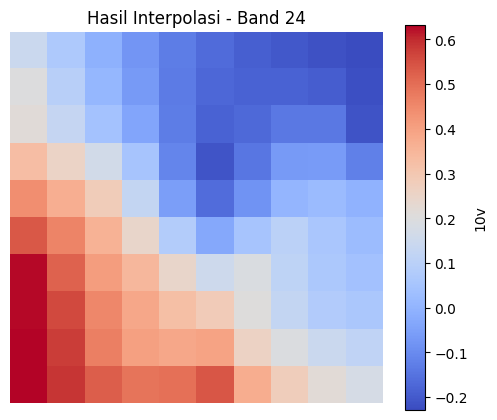

📊 Statistik Band 24 setelah interpolasi:
- Min: -0.23
- Max: 0.63
- Mean: 0.14
- Std Dev: 0.25
----------------------------------------
🔄 Memproses band ke-25...


Band 25: 100%|██████████| 36/36 [00:00<00:00, 89.33it/s]


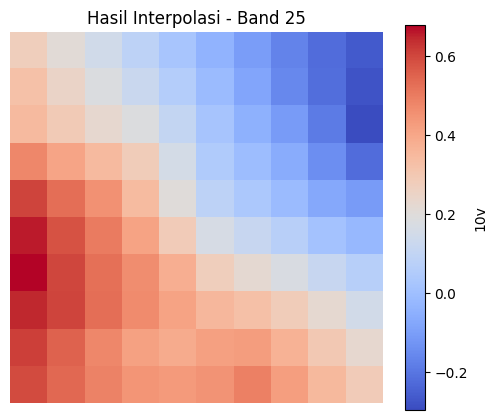

📊 Statistik Band 25 setelah interpolasi:
- Min: -0.30
- Max: 0.68
- Mean: 0.23
- Std Dev: 0.25
----------------------------------------
🔄 Memproses band ke-26...


Band 26: 100%|██████████| 36/36 [00:00<00:00, 52.34it/s]


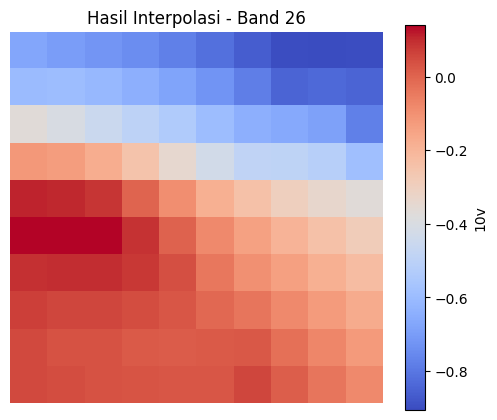

📊 Statistik Band 26 setelah interpolasi:
- Min: -0.91
- Max: 0.14
- Mean: -0.26
- Std Dev: 0.33
----------------------------------------
🔄 Memproses band ke-27...


Band 27: 100%|██████████| 36/36 [00:00<00:00, 144.42it/s]


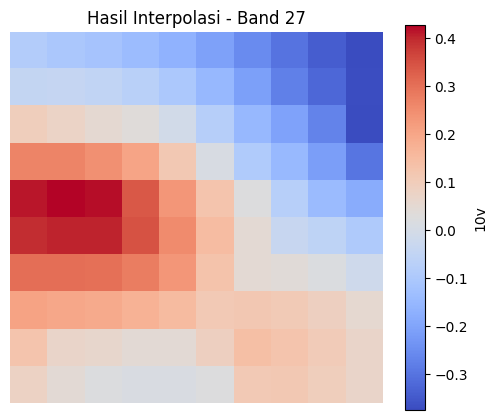

📊 Statistik Band 27 setelah interpolasi:
- Min: -0.38
- Max: 0.43
- Mean: 0.04
- Std Dev: 0.19
----------------------------------------
🔄 Memproses band ke-28...


Band 28: 100%|██████████| 36/36 [00:00<00:00, 360.33it/s]


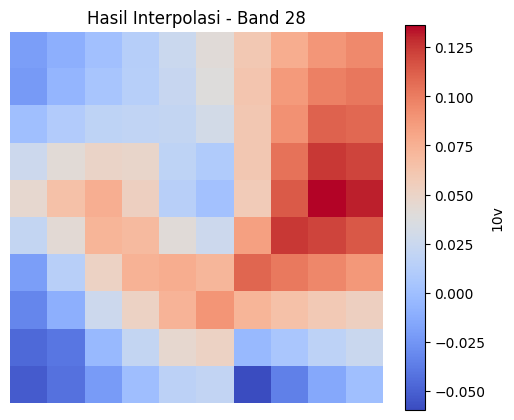

📊 Statistik Band 28 setelah interpolasi:
- Min: -0.06
- Max: 0.14
- Mean: 0.04
- Std Dev: 0.05
----------------------------------------
🔄 Memproses band ke-29...


Band 29: 100%|██████████| 36/36 [00:00<00:00, 368.40it/s]


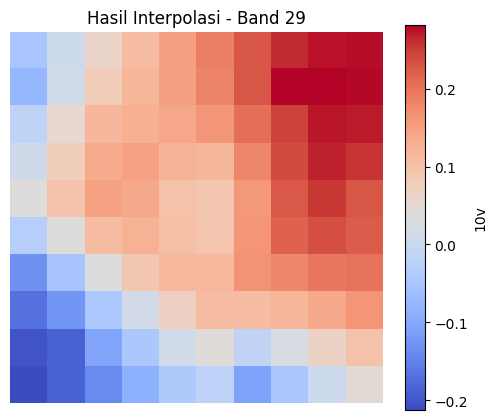

📊 Statistik Band 29 setelah interpolasi:
- Min: -0.21
- Max: 0.28
- Mean: 0.09
- Std Dev: 0.13
----------------------------------------
🔄 Memproses band ke-30...


Band 30: 100%|██████████| 36/36 [00:00<00:00, 485.25it/s]


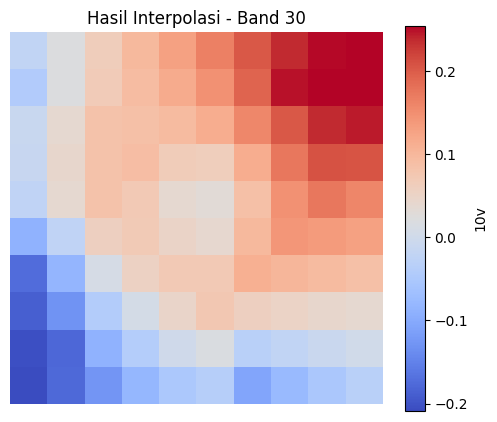

📊 Statistik Band 30 setelah interpolasi:
- Min: -0.21
- Max: 0.25
- Mean: 0.05
- Std Dev: 0.11
----------------------------------------
🔄 Memproses band ke-31...


Band 31: 100%|██████████| 36/36 [00:00<00:00, 432.36it/s]


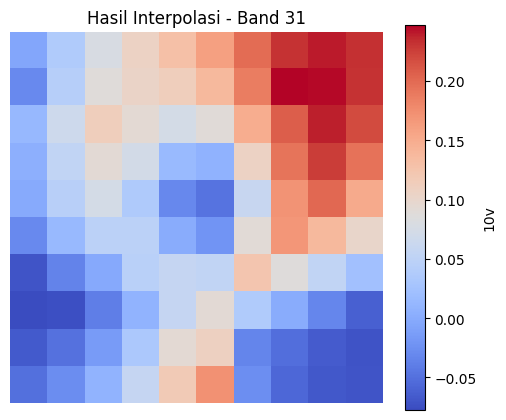

📊 Statistik Band 31 setelah interpolasi:
- Min: -0.08
- Max: 0.25
- Mean: 0.06
- Std Dev: 0.09
----------------------------------------
🔄 Memproses band ke-32...


Band 32: 100%|██████████| 36/36 [00:00<00:00, 395.73it/s]


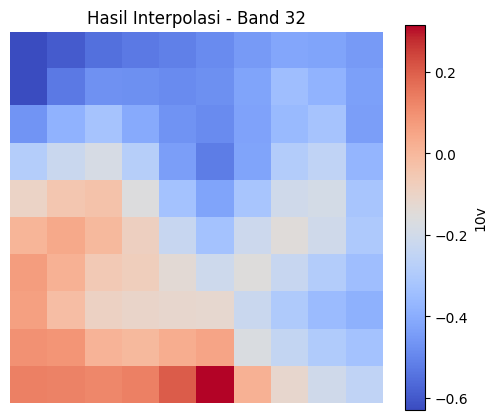

📊 Statistik Band 32 setelah interpolasi:
- Min: -0.63
- Max: 0.31
- Mean: -0.24
- Std Dev: 0.21
----------------------------------------
🔄 Memproses band ke-33...


Band 33: 100%|██████████| 36/36 [00:00<00:00, 257.85it/s]


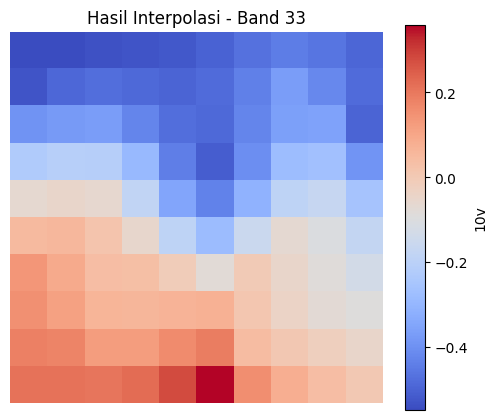

📊 Statistik Band 33 setelah interpolasi:
- Min: -0.55
- Max: 0.36
- Mean: -0.17
- Std Dev: 0.25
----------------------------------------
🔄 Memproses band ke-34...


Band 34: 100%|██████████| 36/36 [00:00<00:00, 128.52it/s]


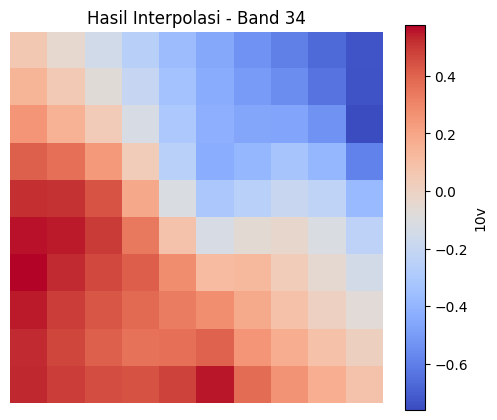

📊 Statistik Band 34 setelah interpolasi:
- Min: -0.76
- Max: 0.58
- Mean: 0.03
- Std Dev: 0.38
----------------------------------------
🔄 Memproses band ke-35...


Band 35: 100%|██████████| 36/36 [00:00<00:00, 150.64it/s]


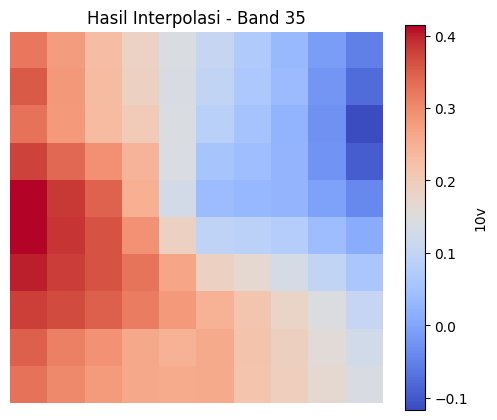

📊 Statistik Band 35 setelah interpolasi:
- Min: -0.12
- Max: 0.41
- Mean: 0.18
- Std Dev: 0.13
----------------------------------------
🔄 Memproses band ke-36...


Band 36: 100%|██████████| 36/36 [00:00<00:00, 229.56it/s]


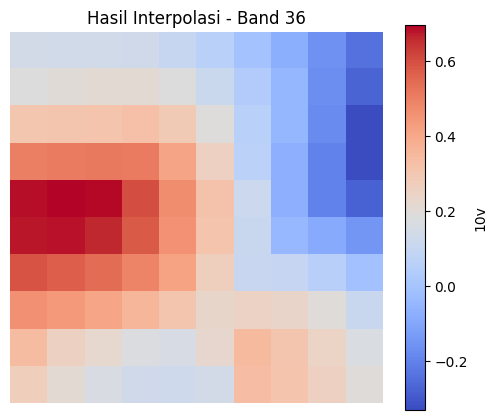

📊 Statistik Band 36 setelah interpolasi:
- Min: -0.33
- Max: 0.70
- Mean: 0.21
- Std Dev: 0.24
----------------------------------------
✅ Semua band berhasil diinterpolasi dan disimpan ke /content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/10v_EXPORT/ERA5_10v_Monthly_2022_2024_NaN_Interpolated.tif


In [ ]:
import numpy as np
import rasterio
from rasterio.plot import show
from pykrige.ok import OrdinaryKriging
from tqdm import tqdm


# # ----------------------------------
# INTERPOLATE MISSING VALUE 36 BULAN
# -----------------------------------

file_path = '/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/10v_EXPORT/ERA5_10v_Monthly_2022_2024.tif'
with rasterio.open(file_path) as src:
    profile = src.profile
    transform = src.transform
    all_data = []

    for i in range(1, src.count + 1):  # Loop through 36 bands
        print(f"🔄 Memproses band ke-{i}...")
        data = src.read(i)
        rows, cols = np.where(~np.isnan(data))
        z = data[rows, cols]

        if len(z) == 0:
            print(f"⚠️ Band {i} tidak memiliki data valid. Lewat.")
            all_data.append(data)
            continue

        x_coords, y_coords = rasterio.transform.xy(transform, rows, cols)

        ok = OrdinaryKriging(
            x_coords, y_coords, z,
            variogram_model='linear',
            verbose=False,
            enable_plotting=False
        )

        nan_rows, nan_cols = np.where(np.isnan(data))
        x_nan, y_nan = rasterio.transform.xy(transform, nan_rows, nan_cols)

        z_nan = []
        for x, y in tqdm(zip(x_nan, y_nan), total=len(x_nan), desc=f'Band {i}'):
            z_, _ = ok.execute('points', x, y)
            z_nan.append(z_[0])

        z_nan = np.array(z_nan)
        data[nan_rows, nan_cols] = z_nan


        # Tampilkan visualisasi hasil interpolasi
        plt.figure(figsize=(6, 5))
        plt.imshow(data, cmap='coolwarm')
        plt.colorbar(label='10v')
        plt.title(f'Hasil Interpolasi - Band {i}')
        plt.axis('off')
        plt.show()

        # Statistik dasar
        print(f"📊 Statistik Band {i} setelah interpolasi:")
        print(f"- Min: {np.nanmin(data):.2f}")
        print(f"- Max: {np.nanmax(data):.2f}")
        print(f"- Mean: {np.nanmean(data):.2f}")
        print(f"- Std Dev: {np.nanstd(data):.2f}")
        print("-" * 40)

        all_data.append(data) # Fixed indentation

# Simpan semua band
output_path = file_path.replace('.tif', '_NaN_Interpolated.tif')
profile.update(count=36)

with rasterio.open(output_path, 'w', **profile) as dst:
    for i, band_data in enumerate(all_data, start=1):
        dst.write(band_data, i)

print(f"✅ Semua band berhasil diinterpolasi dan disimpan ke {output_path}")


In [ ]:
# -------------------------------
# MEMASTIKAN TIDAK ADA NaN
# -------------------------------

import numpy as np
import rasterio

# Buka raster hasil kriging
with rasterio.open('/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/10v_EXPORT/ERA5_10v_Monthly_2022_2024_NaN_Interpolated.tif') as src:
    data = src.read(1)

# Cek apakah masih ada NaN
ada_nan = np.isnan(data).any()

if ada_nan:
    print("Masih ada nilai NaN di dalam raster.")
else:
    print("Tidak ada nilai NaN, semua data sudah terisi.")

import rasterio

# Path ke file TIFF
tif_path = '/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/10v_EXPORT/ERA5_10v_Monthly_2022_2024_NaN_Interpolated.tif'

# Buka file TIFF
with rasterio.open(tif_path) as src:
    # Dapatkan lebar dan tinggi dalam piksel
    width = src.width
    height = src.height

    print(f"Lebar raster: {width} piksel")
    print(f"Tinggi raster: {height} piksel")


Tidak ada nilai NaN, semua data sudah terisi.
Lebar raster: 10 piksel
Tinggi raster: 10 piksel


✅ ERA5_10v_Monthly_2022_2024_NaN_Interpolated.tif - Resampled dengan NoData: nan


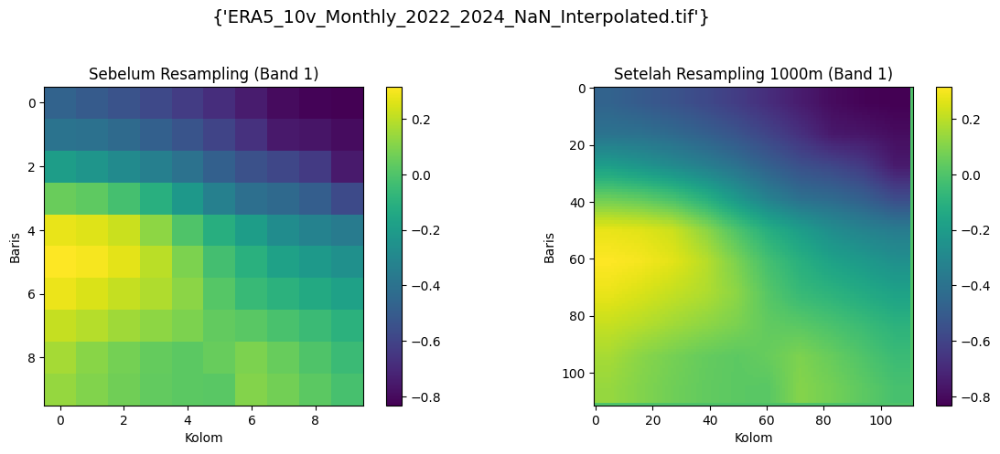

📊 Hasil evaluasi 36 band disimpan di: /content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/10v_EXPORT/DOWNSCALED/eval_all_bands.csv


In [ ]:
#-------------------
# Downscaling Multi-Band (36 Band)
#-------------------

import rasterio
from rasterio.enums import Resampling
from rasterio.warp import calculate_default_transform, reproject
import matplotlib.pyplot as plt
import numpy as np
import os
from glob import glob
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from skimage.transform import resize
import pandas as pd

# Visualisasi sebelum dan sesudah resampling untuk band pertama
def visualize_comparison(before_array, after_array, title):
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))
    cmap = 'viridis'

    # Ambil band pertama untuk visualisasi
    before_band = np.ma.masked_invalid(before_array[0])
    after_band = np.ma.masked_invalid(after_array[0])

    vmin = min(np.nanmin(before_band), np.nanmin(after_band))
    vmax = max(np.nanmax(before_band), np.nanmax(after_band))

    im1 = axs[0].imshow(before_band, cmap=cmap, vmin=vmin, vmax=vmax)
    axs[0].set_title("Sebelum Resampling (Band 1)")
    axs[0].set_xlabel("Kolom")
    axs[0].set_ylabel("Baris")
    plt.colorbar(im1, ax=axs[0], orientation="vertical", fraction=0.05)

    im2 = axs[1].imshow(after_band, cmap=cmap, vmin=vmin, vmax=vmax)
    axs[1].set_title("Setelah Resampling 1000m (Band 1)")
    axs[1].set_xlabel("Kolom")
    axs[1].set_ylabel("Baris")
    plt.colorbar(im2, ax=axs[1], orientation="vertical", fraction=0.05)

    plt.suptitle(title, fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Evaluasi statistik untuk semua band
def evaluate_stats_all_bands(before, after, filename):
    results = []
    for band_idx in range(before.shape[0]):
        before_band = before[band_idx]
        after_band = after[band_idx]

        # Resize untuk matching shape
        after_resized = resize(after_band, before_band.shape,
                             order=1, preserve_range=True,
                             anti_aliasing=False)

        mask = ~np.isnan(before_band) & ~np.isnan(after_resized)

        if np.count_nonzero(mask) == 0:
            print(f"⚠️ {filename} Band {band_idx+1} tidak dapat dievaluasi")
            continue

        y_true = before_band[mask]
        y_pred = after_resized[mask]

        mse = mean_squared_error(y_true, y_pred)
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(y_true, y_pred)
        r2 = r2_score(y_true, y_pred)

        results.append({
            "Filename": filename,
            "Band": band_idx+1,
            "RMSE": rmse,
            "MSE": mse,
            "MAE": mae,
            "R2": r2
        })

    return results

# Fungsi resampling untuk semua band
def resample_raster_to_1km_all_bands(input_path, output_path, visualize=True):
    with rasterio.open(input_path) as src:
        # Baca semua band
        src_nodata = src.nodata if src.nodata is not None else np.nan
        src_array = src.read()  # Shape: (bands, rows, cols)
        src_array = np.where(src_array == src_nodata, np.nan, src_array)
        src_transform = src.transform
        src_crs = src.crs
        src_bounds = src.bounds

        # Hitung transformasi output
        dst_transform, width, height = calculate_default_transform(
            src_crs, src_crs,
            src.width, src.height,
            *src_bounds,
            resolution=1000
        )

        # Siapkan array output
        dst_array = np.full((src.count, height, width), np.nan, dtype=src.dtypes[0])

        # Update metadata
        kwargs = src.meta.copy()
        kwargs.update({
            'driver': 'GTiff',
            'count': src.count,
            'crs': src_crs,
            'transform': dst_transform,
            'width': width,
            'height': height,
            'nodata': src_nodata
        })

        # Proses resampling per band
        with rasterio.open(output_path, 'w', **kwargs) as dst:
            dst_array = np.empty((src.count, height, width), dtype=src.dtypes[0])

            for band in range(src.count):
                reproject(
                    source=src_array[band],
                    destination=dst_array[band],
                    src_transform=src_transform,
                    src_crs=src_crs,
                    dst_transform=dst_transform,
                    dst_crs=src_crs,
                    resampling=Resampling.bilinear
                )
                dst.write(dst_array[band], band+1)

    print(f"✅ {os.path.basename(input_path)} - Resampled dengan NoData: {src_nodata}")

    if visualize:
        visualize_comparison(src_array, dst_array,
                           {os.path.basename(input_path)})

    return src_array, dst_array

# Batch Processing untuk semua file
input_folder = "/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/10v_EXPORT/NAN"
output_folder = "/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/10v_EXPORT/DOWNSCALED"
os.makedirs(output_folder, exist_ok=True)

raster_files = glob(os.path.join(input_folder, "*.tif"))
all_results = []

for raster_file in raster_files:
    filename = os.path.basename(raster_file)
    output_path = os.path.join(output_folder, f"{os.path.splitext(filename)[0]}_1km.tif")

    # Proses resampling
    before, after = resample_raster_to_1km_all_bands(raster_file, output_path)

    # Evaluasi
    stats = evaluate_stats_all_bands(before, after, filename)
    all_results.extend(stats)

# Simpan hasil evaluasi
df = pd.DataFrame(all_results)
csv_path = os.path.join(output_folder, "eval_all_bands.csv")
df.to_csv(csv_path, index=False)
print(f"📊 Hasil evaluasi 36 band disimpan di: {csv_path}")


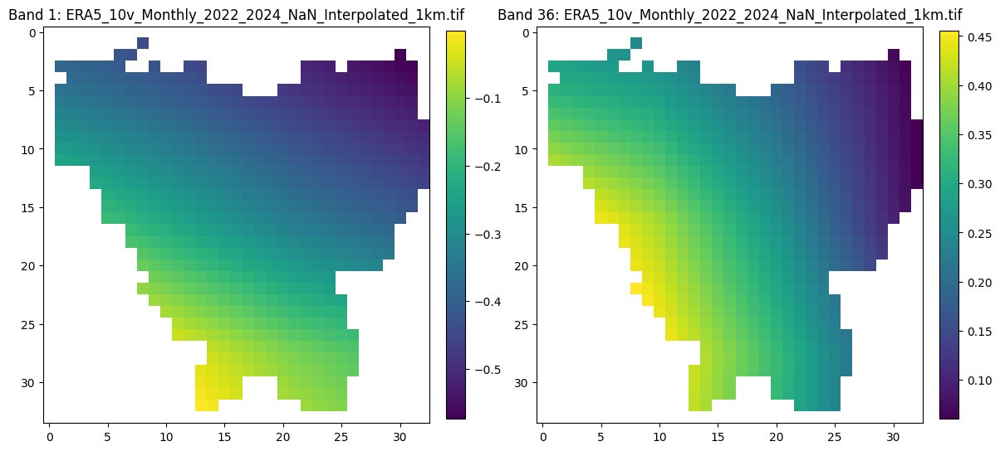

✅ Processed multiband: ERA5_10v_Monthly_2022_2024_NaN_Interpolated_1km.tif


In [ ]:
#-------------------------
# CLIP DOWNSCALED (MULTIBAND)
#-------------------------
import rasterio
from rasterio.mask import mask
import geopandas as gpd
import numpy as np
import os
from glob import glob
import matplotlib.pyplot as plt

# === 1. BACA SHAPEFILE BATAS ADMINISTRASI ===
shapefile_path = '/content/drive/MyDrive/PENGOLAHAN/DKI Jakarta/DKI Jakarta.shp'
gdf = gpd.read_file(shapefile_path)

# === 2. DAFTAR SEMUA FILE RASTER YANG MAU DIOLAH ===
input_folder = '/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/10v_EXPORT/DOWNSCALED'  # folder berisi hasil resampling
output_folder = '/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/10v_EXPORT/CLIP'
os.makedirs(output_folder, exist_ok=True)
raster_files = sorted(glob(os.path.join(input_folder, '*.tif')))

# === 3. LOOP UNTUK SETIAP FILE RASTER ===
for raster_path in raster_files:
    with rasterio.open(raster_path) as src:
        raster_data = src.read()  # ⬅️ Ambil semua band (multiband)
        raster_meta = src.meta.copy()

        # Cek dan samakan CRS shapefile
        if gdf.crs != src.crs:
            gdf = gdf.to_crs(src.crs)

        # Gunakan nilai nodata asli
        nodata_value = src.nodata

        # Crop dan mask semua band
        out_image, out_transform = mask(
            src,
            gdf.geometry,
            crop=True,
            nodata=nodata_value
        )

        # Update metadata
        out_meta = raster_meta.copy()
        out_meta.update({
            "driver": "GTiff",
            "height": out_image.shape[1],
            "width": out_image.shape[2],
            "count": out_image.shape[0],  # ⬅️ Total band
            "transform": out_transform,
            "nodata": nodata_value
        })

        # Nama file output
        filename = os.path.basename(raster_path)
        output_path = os.path.join(output_folder, f"Jakarta_{filename}")

        # Simpan hasil raster clipped
        with rasterio.open(output_path, "w", **out_meta) as dest:
            dest.write(out_image)

        # === VISUALISASI: Band 1 & terakhir ===
        fig, ax = plt.subplots(1, 2, figsize=(12, 6))
        im1 = ax[0].imshow(out_image[0], cmap='viridis')
        ax[0].set_title(f"Band 1: {filename}")
        plt.colorbar(im1, ax=ax[0], fraction=0.046, pad=0.04)

        im2 = ax[1].imshow(out_image[-1], cmap='viridis')
        ax[1].set_title(f"Band {out_image.shape[0]}: {filename}")
        plt.colorbar(im2, ax=ax[1], fraction=0.046, pad=0.04)

        plt.tight_layout()
        plt.show()

    print(f"✅ Processed multiband: {filename}")


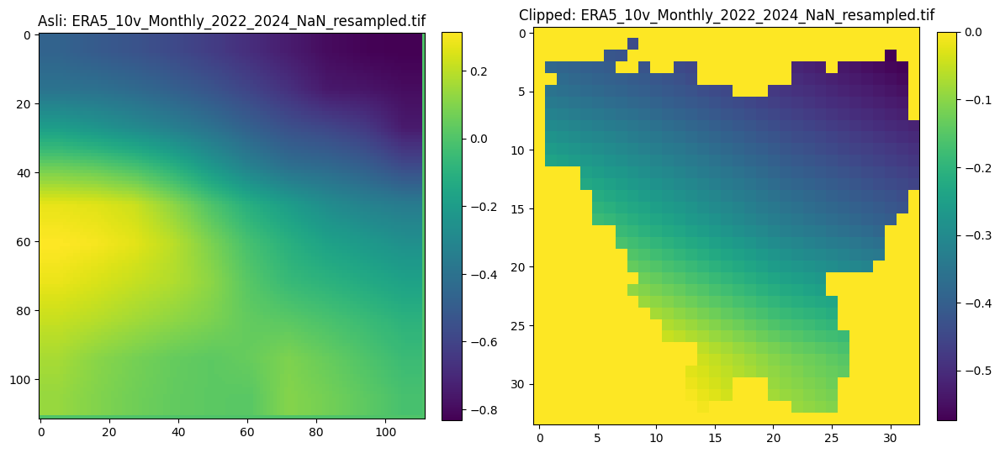

Processed and visualized: ERA5_10v_Monthly_2022_2024_NaN_resampled.tif


In [ ]:
import rasterio
from rasterio.mask import mask
import geopandas as gpd
import numpy as np
import os
from glob import glob
import matplotlib.pyplot as plt

# === 1. BACA SHAPEFILE BATAS ADMINISTRASI ===
shapefile_path = '/content/drive/MyDrive/PENGOLAHAN/DKI Jakarta/DKI Jakarta.shp'
gdf = gpd.read_file(shapefile_path)

# === 2. DAFTAR SEMUA FILE RASTER YANG MAU DIOLAH ===
input_folder = '/content/drive/MyDrive/10v_EXPORT/ERA5_10v_Monthly_2022_2024_1KM'
output_folder = '/content/drive/MyDrive/10v_EXPORT/ERA5_10v_Monthly_2022_2024_1KM_CLIP'
os.makedirs(output_folder, exist_ok=True)
raster_files = sorted(glob(os.path.join(input_folder, '*.tif')))

# === 3. LOOP UNTUK SETIAP FILE RASTER ===
for raster_path in raster_files:
    with rasterio.open(raster_path) as src:
        raster_data = src.read(1)
        raster_meta = src.meta.copy()

        # Cek dan samakan CRS shapefile
        if gdf.crs != src.crs:
            gdf = gdf.to_crs(src.crs)

        # Gunakan nilai nodata asli
        nodata_value = src.nodata

        # Crop dan mask dengan nodata asli
        out_image, out_transform = mask(
            src,
            gdf.geometry,
            crop=True,
            nodata=nodata_value  # GUNAKAN nodata asli
        )

        # Update metadata
        out_meta = raster_meta.copy()
        out_meta.update({
            "driver": "GTiff",
            "height": out_image.shape[1],
            "width": out_image.shape[2],
            "transform": out_transform,
            "nodata": nodata_value
        })

        # Nama file output
        filename = os.path.basename(raster_path)
        output_path = os.path.join(output_folder, f"Jakarta_{filename}")

        # Simpan hasil raster clipped
        with rasterio.open(output_path, "w", **out_meta) as dest:
            dest.write(out_image)

        # === VISUALISASI SEBELUM DAN SESUDAH CLIPPING ===
        fig, ax = plt.subplots(1, 2, figsize=(12, 6))
        im1 = ax[0].imshow(raster_data, cmap='viridis')
        ax[0].set_title(f"Asli: {filename}")
        plt.colorbar(im1, ax=ax[0], fraction=0.046, pad=0.04)

        im2 = ax[1].imshow(out_image[0], cmap='viridis')
        ax[1].set_title(f"Clipped: {filename}")
        plt.colorbar(im2, ax=ax[1], fraction=0.046, pad=0.04)

        plt.tight_layout()
        plt.show()

    print(f"Processed and visualized: {filename}")


In [ ]:
#-------------------------
# INFORMASI NAN PASCA CLIP
#-------------------------

import rasterio
import numpy as np
import pandas as pd

# 1. Buka file TIFF
tif_path = '/content/drive/MyDrive/10v_EXPORT/ERA5_10v_Monthly_2022_2024_1KM_CLIP/Jakarta_ERA5_10v_Monthly_2022_2024_NaN_resampled.tif'
with rasterio.open(tif_path) as src:
    data = src.read()  # (bands, height, width)
    profile = src.profile

# 2. Siapkan list bulan (label)
start_year = 2022
start_month = 1
labels = []
for i in range(36):
    year = start_year + (start_month + i - 1) // 12
    month = (start_month + i - 1) % 12 + 1
    labels.append(f"{year:04d}-{month:02d}")

# 3. Hitung valid_ratio dan missing_ratio
valid_ratios = []
missing_ratios_percent = []

for i in range(data.shape[0]):  # untuk tiap band
    band = data[i, :, :]
    total_pixels = band.size
    valid_pixels = np.count_nonzero(~np.isnan(band))
    valid_ratio = valid_pixels / total_pixels
    missing_ratio = 1.0 - valid_ratio

    valid_ratios.append(valid_ratio)
    missing_ratios_percent.append(missing_ratio * 100)

# 4. Buat dataframe ringkasan
summary_df = pd.DataFrame({
    'label': labels,
    'valid_ratio': valid_ratios,
    'missing_ratio_percent': missing_ratios_percent
})

# 5. Tampilkan
print(summary_df)

# 6. (Opsional) Simpan ke CSV
summary_df.to_csv('/content/drive/MyDrive/10v_EXPORT/ERA5_10v_Monthly_2022_2024_1KM_CLIP/valid_missing_summaryclip.csv', index=False)


      label  valid_ratio  missing_ratio_percent
0   2022-01          1.0                    0.0
1   2022-02          1.0                    0.0
2   2022-03          1.0                    0.0
3   2022-04          1.0                    0.0
4   2022-05          1.0                    0.0
5   2022-06          1.0                    0.0
6   2022-07          1.0                    0.0
7   2022-08          1.0                    0.0
8   2022-09          1.0                    0.0
9   2022-10          1.0                    0.0
10  2022-11          1.0                    0.0
11  2022-12          1.0                    0.0
12  2023-01          1.0                    0.0
13  2023-02          1.0                    0.0
14  2023-03          1.0                    0.0
15  2023-04          1.0                    0.0
16  2023-05          1.0                    0.0
17  2023-06          1.0                    0.0
18  2023-07          1.0                    0.0
19  2023-08          1.0                

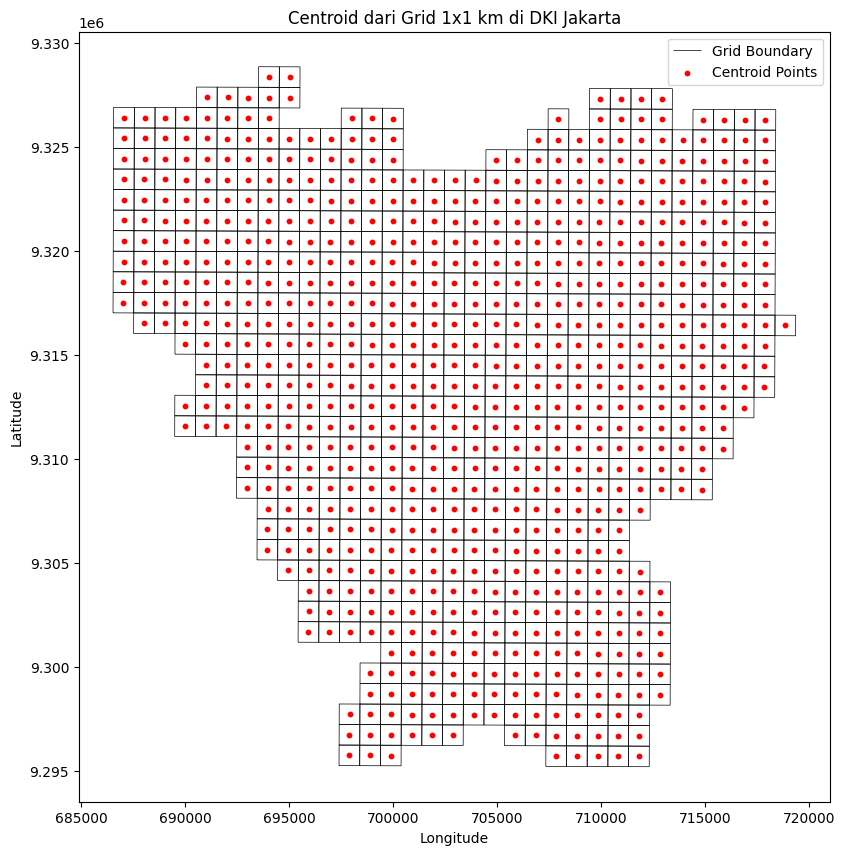

Hasil ekstraksi sudah diupload ke Google Sheets: Ekstraksi_10v


In [ ]:
#-------------------------
# EXTRACT VALUE
#-------------------------

import geopandas as gpd
import matplotlib.pyplot as plt

# Baca grid polygon
grid = gpd.read_file("/content/drive/MyDrive/PENGOLAHAN/Grid Jakarta/Grid Jakarta.shp")

# 2. Hitung centroid untuk setiap polygon
grid_centroid = grid.copy()
grid_centroid["geometry"] = grid_centroid.centroid

# 3. Tambahkan ID unik kalau belum ada
if "grid_id" not in grid_centroid.columns:
    grid_centroid["grid_id"] = ["G_{:04d}".format(i) for i in range(len(grid_centroid))]

# 4. Tampilkan hasil centroid
fig, ax = plt.subplots(figsize=(10, 10))
grid.boundary.plot(ax=ax, color="black", linewidth=0.5, label="Grid Boundary")  # Outline grid lama
grid_centroid.plot(ax=ax, color="red", markersize=10, label="Centroid Points")  # Titik centroid baru
plt.legend()
plt.title("Centroid dari Grid 1x1 km di DKI Jakarta")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

# 5. (Optional) Simpan centroid ke shapefile baru
grid_centroid.to_file("grid_dki_centroid.shp")


import geopandas as gpd
import rioxarray
import pandas as pd
import gspread_dataframe as gd
import gspread
from google.colab import auth
from google.auth import default

# --- AUTENTIKASI GOOGLE DRIVE / SHEETS ---
auth.authenticate_user()
creds, _ = default()
gc = gspread.authorize(creds)

# --- 1. SETTING PATH ---
input_raster = '/content/drive/MyDrive/10v_EXPORT/ERA5_10v_Monthly_2022_2024_1KM_CLIP/Jakarta_ERA5_10v_Monthly_2022_2024_NaN_resampled.tif'  # <- ganti path file raster stack
centroid_shapefile = '/content/grid_dki_centroid.shp'  # <- path shapefile centroid

# --- 2. BACA DATA ---
raster = rioxarray.open_rasterio(input_raster)
centroids = gpd.read_file(centroid_shapefile)

# --- 3. EKSTRAKSI PIXEL ---
extracted_data = []

# Cek dimensi raster
n_bands = raster.rio.count

# Loop untuk setiap centroid
for idx, row in centroids.iterrows():
    centroid = row.geometry.centroid
    x, y = centroid.x, centroid.y

    # Ekstrak semua band (karena 1 file stacked)
    values = raster.sel(x=x, y=y, method="nearest").values

    for band_idx in range(n_bands):
        extracted_data.append({
            'Grid_ID': row['grid_id'],  # Sesuaikan nama kolom ID
            'Band': band_idx + 1,        # Band dimulai dari 1
            'Value': values[band_idx]
        })

# Konversi ke DataFrame
df = pd.DataFrame(extracted_data)

# --- 4. UPLOAD KE GOOGLE SHEETS ---
# Nama file Google Sheets
sheet_name = 'Ekstraksi_10v'
sh = gc.create(sheet_name)

# Upload DataFrame
worksheet = sh.get_worksheet(0)
gd.set_with_dataframe(worksheet, df)

print(f"Hasil ekstraksi sudah diupload ke Google Sheets: {sheet_name}")




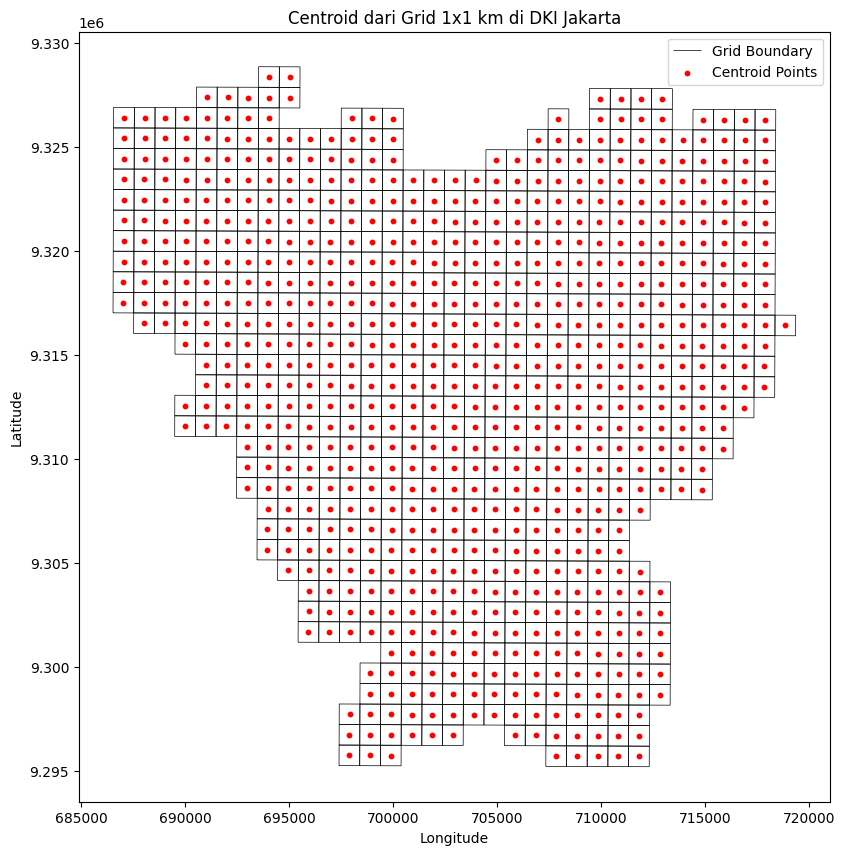

✅ Ekstraksi selesai! Hasil disimpan di /content/drive/MyDrive/10v_EXPORT/ERA5_10v_Monthly_2022_2024_1KM_CLIP/Jakarta_10v_value.tif.csv


In [ ]:
import geopandas as gpd
import rasterio
from rasterio.sample import sample_gen
import pandas as pd
import matplotlib.pyplot as plt

# 1. Baca grid polygon
grid = gpd.read_file("/content/drive/MyDrive/PENGOLAHAN/Grid Jakarta/Grid Jakarta.shp")

# 2. Hitung centroid untuk setiap polygon
grid_centroid = grid.copy()
grid_centroid["geometry"] = grid_centroid.centroid

# 3. Tambahkan ID unik kalau belum ada
if "grid_id" not in grid_centroid.columns:
    grid_centroid["grid_id"] = ["G_{:04d}".format(i) for i in range(len(grid_centroid))]

# 4. Visualisasi centroid
fig, ax = plt.subplots(figsize=(10, 10))
grid.boundary.plot(ax=ax, color="black", linewidth=0.5, label="Grid Boundary")
grid_centroid.plot(ax=ax, color="red", markersize=10, label="Centroid Points")
plt.legend()
plt.title("Centroid dari Grid 1x1 km di DKI Jakarta")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

# 5. Simpan centroid ke shapefile (opsional)
grid_centroid.to_file("/content/drive/MyDrive/PENGOLAHAN/Grid Jakarta/grid_dki_centroid.shp")

# -------------
# 6. Ekstraksi nilai raster dari V-component of Wind
# -------------

# Buka file raster
raster_path = '/content/drive/MyDrive/10v_EXPORT/ERA5_10v_Monthly_2022_2024_1KM_CLIP/Jakarta_ERA5_10v_Monthly_2022_2024_NaN_resampled.tif'  # Ganti dengan path raster kamu
raster = rasterio.open(raster_path)

# Pastikan CRS raster sama dengan grid
if raster.crs != grid_centroid.crs:
    grid_centroid = grid_centroid.to_crs(raster.crs)

# Ekstrak nilai di titik centroid
coords = [(geom.x, geom.y) for geom in grid_centroid.geometry]
values = list(raster.sample(coords))

# Karena values bisa multi-band, ambil band pertama
extracted_values = [val[0] if val.size > 0 else None for val in values]
# 7. Masukkan nilai ke DataFrame
result_df = pd.DataFrame({
    "grid_id": grid_centroid["grid_id"],
    "longitude": [point.x for point in grid_centroid.geometry],
    "latitude": [point.y for point in grid_centroid.geometry],
    "v_component_10m": extracted_values
})

# 8. Simpan ke CSV (bisa dibuka di Google Sheets)
output_csv = "/content/drive/MyDrive/10v_EXPORT/ERA5_10v_Monthly_2022_2024_1KM_CLIP/Jakarta_10v_value.tif.csv"
result_df.to_csv(output_csv, index=False)

print(f"✅ Ekstraksi selesai! Hasil disimpan di {output_csv}")


# GEE Version 10M U Wind

In [ ]:
# Melakukan autentikasi dan mendefinisikan Google Cloud Project yang akan digunakan
ee.Authenticate()
ee.Initialize(project='ee-sidangapril2024')
Map = geemap.Map()
Map
AOI = ee.FeatureCollection("projects/ee-sidangapril2024/assets/JABODETABEK")
#AOI= ee.FeatureCollection("projects/ee-sidangapril2024/assets/DKI_JAKARTA")
Map.addLayer(AOI, {}, "AOI")
Map.centerObject(AOI, 8)

# Rentang waktu
time_start = '2022-01-01'
time_end = '2024-12-31'

In [ ]:
#-------------------
# PENGUNDUHAN
#-------------------

import ee
import geemap

# Inisialisasi Earth Engine
ee.Authenticate()
ee.Initialize(project='ee-sidangapril2024')

# Definisikan Area of Interest (AOI)
AOI = ee.FeatureCollection("projects/ee-sidangapril2024/assets/JABODETABEK")

# Koleksi ERA5-Land hourly
era5_collection = ee.ImageCollection('ECMWF/ERA5_LAND/HOURLY')

# Rentang waktu: Januari 2022 - Desember 2024 (sesuaikan jika perlu)
start_date = ee.Date('2022-01-01')
end_date = ee.Date('2024-12-31')

# Buat list bulan
months = ee.List.sequence(0, end_date.difference(start_date, 'month'))

# Fungsi untuk menghitung rata-rata bulanan
def calculate_monthly_mean(month_offset):
    start = start_date.advance(month_offset, 'month')
    end = start.advance(1, 'month')
    year_month = start.format('YYYY-MM')
    filtered_collection = era5_collection.filterDate(start, end)
    u_component_wind = filtered_collection.select('u_component_of_wind_10m') \
        .mean() \
        .clip(AOI) \
        .rename([year_month]) \
        .set('system:time_start', start.millis())
    return u_component_wind

# Hitung rata-rata bulanan untuk setiap bulan
monthly_means = months.map(calculate_monthly_mean)
multi_band_image = ee.ImageCollection(monthly_means).toBands()

# Gabungkan menjadi ImageCollection
monthly_collection = ee.ImageCollection(monthly_means)

# Visualisasi (contoh untuk bulan pertama)
first_month_mean = monthly_collection.first()
vis_params = {
    'min': 20,
    'max': 35,
    'palette': ['blue', 'green', 'yellow', 'red']
}

Map = geemap.Map()
Map.centerObject(AOI, 8)
Map.addLayer(first_month_mean, vis_params, '10m u component of wind')
Map.addLayer(AOI, {}, 'AOI')
Map

Map(center=[-6.375912206265441, 106.80576119247223], controls=(WidgetControl(options=['position', 'transparent…

In [ ]:
#-------------------
# PENYIMPANAN
#-------------------

# Export ke Google Drive
task = ee.batch.Export.image.toDrive(
    image=multi_band_image,
    description='monthly_10m_u_wind',
        folder='10u_EXPORT',
    fileNamePrefix='ERA5_10u_Monthly_2022_2024',
    region=AOI.geometry(),
    scale=11132,  # skala asli ERA5-Land
    crs='EPSG:32748',
    maxPixels=1e13
)
task.start()

In [ ]:
#-------------------
# MELIHAT INFORMASI
#-------------------

import rasterio
from rasterio.plot import show
import os
import numpy as np

# Buka file multiband
file_path = '/content/drive/MyDrive/10u_EXPORT/ERA5_10u_Monthly_2022_2024.tif'
with rasterio.open(file_path) as src:
    print("✅ Informasi Umum")
    print(f"- CRS: {src.crs}")
    print(f"- Resolusi (meter): {src.res}")
    print(f"- Ukuran raster: {src.width} x {src.height}")
    print(f"- Jumlah band: {src.count}")
    print(f"- Bounds: {src.bounds}")

    print("\n📦 Statistik per band:")
    for i in range(1, src.count + 1):
        band = src.read(i)
        band_name = f"Band {i}"  # Atau bisa pakai nama dari metadata jika tersedia
        print(f" {band_name}: min={np.nanmin(band):.2f}, max={np.nanmax(band):.2f}, mean={np.nanmean(band):.2f}")

    print("\n📝 Metadata tambahan (jika ada):")
    print(src.tags())


✅ Informasi Umum
- CRS: EPSG:32748
- Resolusi (meter): (11132.0, 11132.0)
- Ukuran raster: 10 x 10
- Jumlah band: 36
- Bounds: BoundingBox(left=645656.0, bottom=9239560.0, right=756976.0, top=9350880.0)

📦 Statistik per band:
 Band 1: min=0.45, max=2.97, mean=1.24
 Band 2: min=0.26, max=2.16, mean=0.85
 Band 3: min=0.40, max=2.10, mean=1.01
 Band 4: min=0.08, max=0.95, mean=0.34
 Band 5: min=-0.75, max=0.08, mean=-0.13
 Band 6: min=-1.16, max=0.03, mean=-0.24
 Band 7: min=-2.21, max=-0.12, mean=-0.64
 Band 8: min=-1.60, max=0.08, mean=-0.31
 Band 9: min=-0.76, max=0.17, mean=-0.14
 Band 10: min=0.15, max=0.74, mean=0.36
 Band 11: min=0.28, max=1.53, mean=0.71
 Band 12: min=0.52, max=2.43, mean=1.18
 Band 13: min=0.66, max=3.45, mean=1.58
 Band 14: min=0.59, max=3.91, mean=1.63
 Band 15: min=0.17, max=1.80, mean=0.67
 Band 16: min=0.16, max=1.12, mean=0.47
 Band 17: min=-1.67, max=0.00, mean=-0.36
 Band 18: min=-1.71, max=0.03, mean=-0.38
 Band 19: min=-1.82, max=0.18, mean=-0.35
 Band 

Jumlah file ditemukan: 1


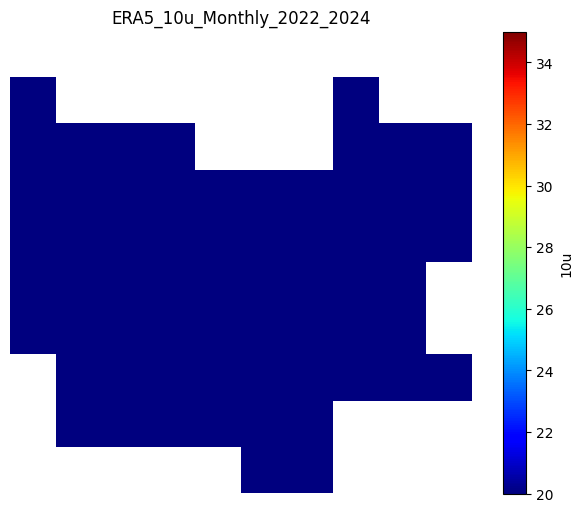

In [ ]:
#----------------------
# MELIHAT VISUALISASI
#----------------------

import os
import glob
import rasterio
import matplotlib.pyplot as plt

# Path folder hasil ekspor
folder_path = '/content/drive/MyDrive/10u_EXPORT'  # Ganti dengan folder lokal kamu

# Cari semua file .tif di folder
tif_files = sorted(glob.glob(os.path.join(folder_path, '*.tif')))

print(f"Jumlah file ditemukan: {len(tif_files)}")

# Loop dan tampilkan
for tif_file in tif_files:
    with rasterio.open(tif_file) as src:
        image = src.read(1)  # baca band 1
        profile = src.profile

    plt.figure(figsize=(8, 6))
    plt.imshow(image, cmap='jet', vmin=20, vmax=35)  # vmin & vmax bisa disesuaikan
    plt.colorbar(label='10u')
    plt.title(os.path.basename(tif_file).replace('.tif', ''))
    plt.axis('off')
    plt.show()

In [ ]:
#-------------------
# INFORMASI MISSING
#-------------------

# Step 1: Tambahkan label (YYYY-MM) dan valid_ratio ke setiap image

def add_valid_ratio(image):
    band_name = 'u10'  # Ganti dengan nama band yang sesuai

    # Mask menunjukkan piksel valid
    mask = image.mask().gt(0)

    # Hitung luas area valid (m²)
    valid_area_image = mask.multiply(ee.Image.pixelArea())
    area_stats = valid_area_image.reduceRegion(
        reducer=ee.Reducer.sum(),
        geometry=AOI.geometry(),  # jika AOI berupa FeatureCollection
        scale=1000,
        maxPixels=1e13
    )

    # Luas valid & total AOI
    valid_area = ee.Number(area_stats.get(band_name))
    total_area = AOI.geometry().area()

    # Rasio valid dan missing
    valid_ratio = valid_area.divide(total_area)
    missing_ratio = ee.Number(1.0).subtract(valid_ratio)

    # Tambahkan ke metadata image
    image = image.set('valid_ratio', valid_ratio)
    image = image.set('missing_ratio', missing_ratio)  # missing ratio as a number (0-1)
    image = image.set('missing_ratio_percent', missing_ratio.multiply(100))  # missing ratio as percentage
    return image


def calculate_monthly_mean_with_ratio(month_offset):
    start = start_date.advance(month_offset, 'month')
    end = start.advance(1, 'month')
    label = start.format('YYYY-MM')

    filtered = era5_collection.filterDate(start, end)
    monthly_mean = filtered.select('u_component_of_wind_10m') \
        .mean() \
        .clip(AOI) \
        .rename('u10') \
        .set('label', label)

    # Tambahkan valid_ratio dan missing_ratio
    return add_valid_ratio(monthly_mean)

# Step 2: Buat koleksi dengan rasio valid
monthly_collection = ee.ImageCollection(months.map(calculate_monthly_mean_with_ratio))

# Step 3: Konversi ke FeatureCollection untuk ringkasan
def image_to_feature(image):
    return ee.Feature(None, {
        'label': image.get('label'),
        'valid_ratio': image.get('valid_ratio'),
        'missing_ratio_percent': image.get('missing_ratio'),
    })

missing_ratio_fc = monthly_collection.map(image_to_feature)

# Step 4: Cetak hasil
print(missing_ratio_fc.aggregate_array('label').getInfo())
print(missing_ratio_fc.aggregate_array('missing_ratio_percent').getInfo())


['2022-01', '2022-02', '2022-03', '2022-04', '2022-05', '2022-06', '2022-07', '2022-08', '2022-09', '2022-10', '2022-11', '2022-12', '2023-01', '2023-02', '2023-03', '2023-04', '2023-05', '2023-06', '2023-07', '2023-08', '2023-09', '2023-10', '2023-11', '2023-12', '2024-01', '2024-02', '2024-03', '2024-04', '2024-05', '2024-06', '2024-07', '2024-08', '2024-09', '2024-10', '2024-11', '2024-12']
[0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.06795727491572623, 0.067957274915

🔄 Memproses band ke-1...


Band 1: 100%|██████████| 36/36 [00:00<00:00, 1007.32it/s]


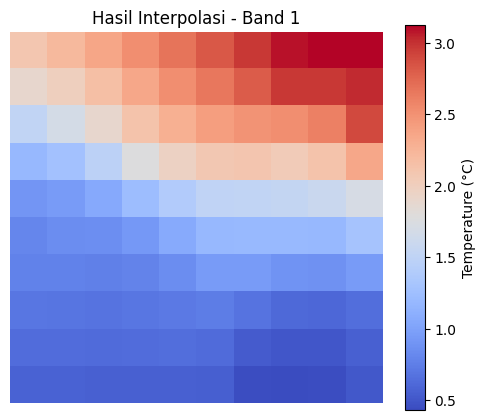

📊 Statistik Band 1 setelah interpolasi:
- Min: 0.43
- Max: 3.12
- Mean: 1.43
- Std Dev: 0.83
----------------------------------------
🔄 Memproses band ke-2...


Band 2: 100%|██████████| 36/36 [00:00<00:00, 782.86it/s]


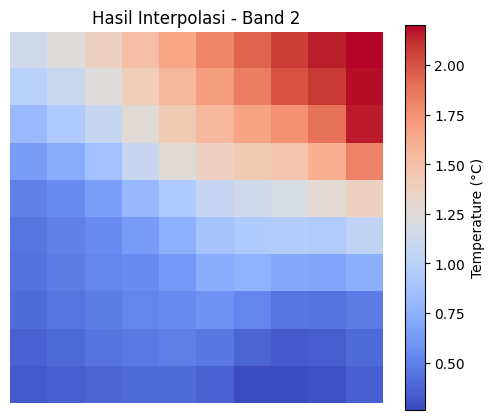

📊 Statistik Band 2 setelah interpolasi:
- Min: 0.26
- Max: 2.20
- Mean: 0.96
- Std Dev: 0.56
----------------------------------------
🔄 Memproses band ke-3...


Band 3: 100%|██████████| 36/36 [00:00<00:00, 876.21it/s]


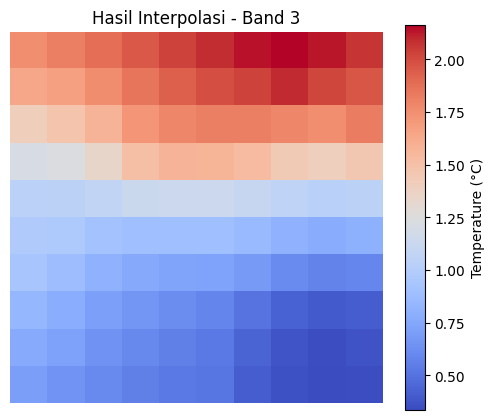

📊 Statistik Band 3 setelah interpolasi:
- Min: 0.34
- Max: 2.16
- Mean: 1.13
- Std Dev: 0.56
----------------------------------------
🔄 Memproses band ke-4...


Band 4: 100%|██████████| 36/36 [00:00<00:00, 689.60it/s]


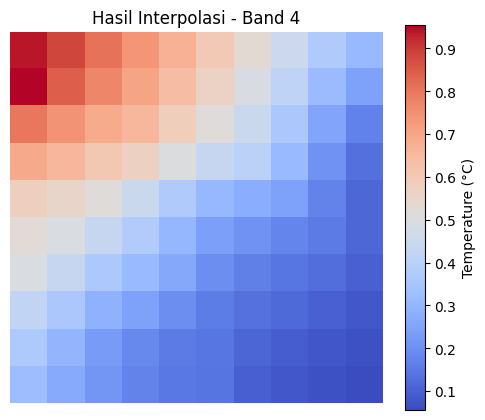

📊 Statistik Band 4 setelah interpolasi:
- Min: 0.06
- Max: 0.95
- Mean: 0.37
- Std Dev: 0.23
----------------------------------------
🔄 Memproses band ke-5...


Band 5: 100%|██████████| 36/36 [00:00<00:00, 425.15it/s]


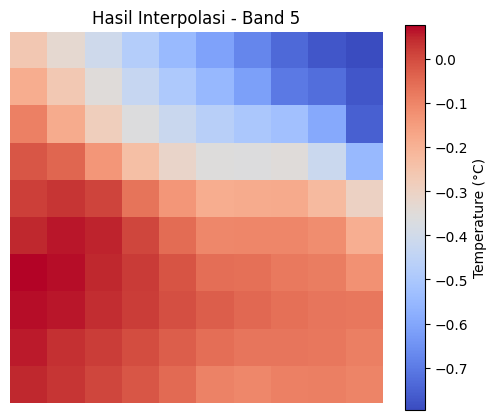

📊 Statistik Band 5 setelah interpolasi:
- Min: -0.80
- Max: 0.08
- Mean: -0.20
- Std Dev: 0.24
----------------------------------------
🔄 Memproses band ke-6...


Band 6: 100%|██████████| 36/36 [00:00<00:00, 843.00it/s]


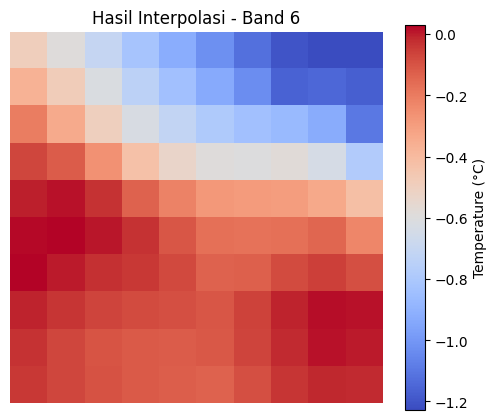

📊 Statistik Band 6 setelah interpolasi:
- Min: -1.23
- Max: 0.03
- Mean: -0.35
- Std Dev: 0.38
----------------------------------------
🔄 Memproses band ke-7...


Band 7: 100%|██████████| 36/36 [00:00<00:00, 772.38it/s]


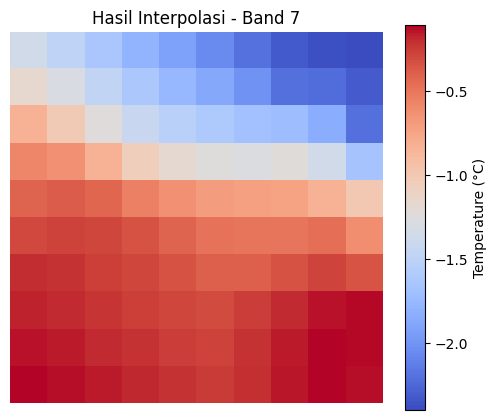

📊 Statistik Band 7 setelah interpolasi:
- Min: -2.40
- Max: -0.11
- Mean: -0.83
- Std Dev: 0.71
----------------------------------------
🔄 Memproses band ke-8...


Band 8: 100%|██████████| 36/36 [00:00<00:00, 777.01it/s]


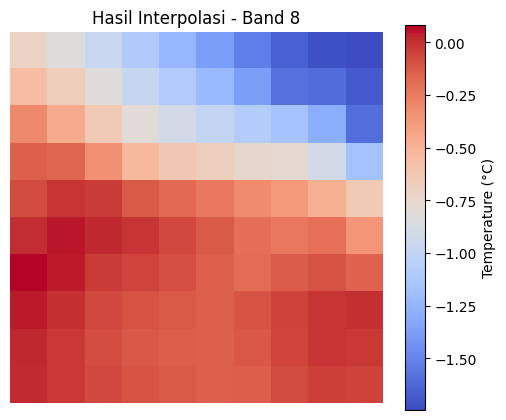

📊 Statistik Band 8 setelah interpolasi:
- Min: -1.74
- Max: 0.08
- Mean: -0.46
- Std Dev: 0.52
----------------------------------------
🔄 Memproses band ke-9...


Band 9: 100%|██████████| 36/36 [00:00<00:00, 791.81it/s]


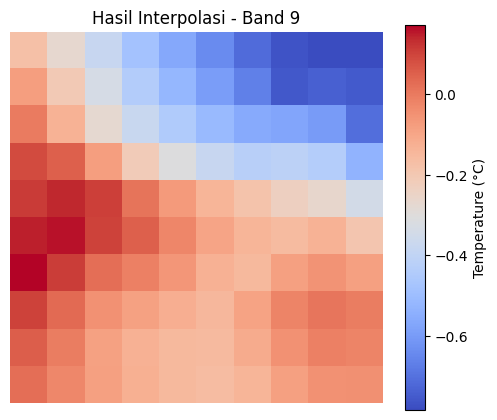

📊 Statistik Band 9 setelah interpolasi:
- Min: -0.78
- Max: 0.17
- Mean: -0.21
- Std Dev: 0.26
----------------------------------------
🔄 Memproses band ke-10...


Band 10: 100%|██████████| 36/36 [00:00<00:00, 743.55it/s]


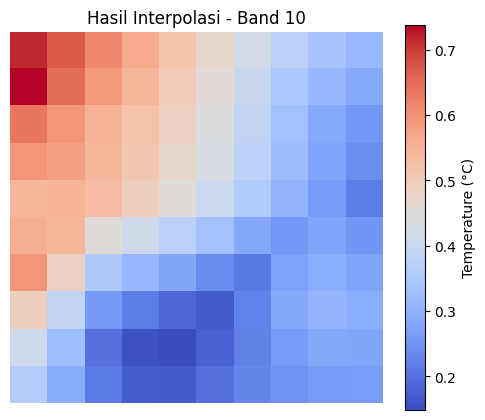

📊 Statistik Band 10 setelah interpolasi:
- Min: 0.15
- Max: 0.74
- Mean: 0.38
- Std Dev: 0.14
----------------------------------------
🔄 Memproses band ke-11...


Band 11: 100%|██████████| 36/36 [00:00<00:00, 627.94it/s]


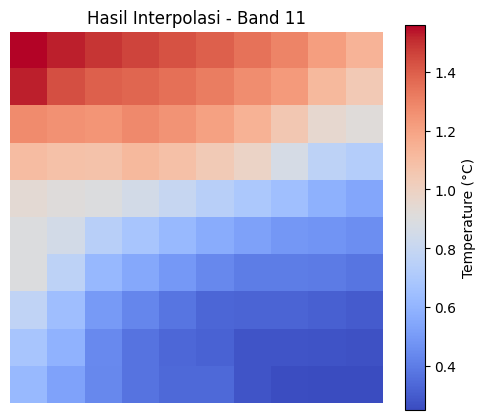

📊 Statistik Band 11 setelah interpolasi:
- Min: 0.25
- Max: 1.56
- Mean: 0.79
- Std Dev: 0.39
----------------------------------------
🔄 Memproses band ke-12...


Band 12: 100%|██████████| 36/36 [00:00<00:00, 702.37it/s]


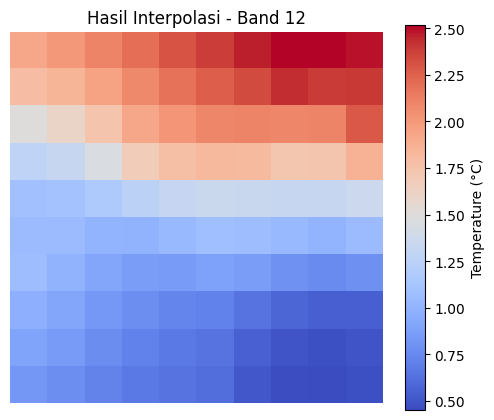

📊 Statistik Band 12 setelah interpolasi:
- Min: 0.45
- Max: 2.52
- Mean: 1.32
- Std Dev: 0.63
----------------------------------------
🔄 Memproses band ke-13...


Band 13: 100%|██████████| 36/36 [00:00<00:00, 549.00it/s]


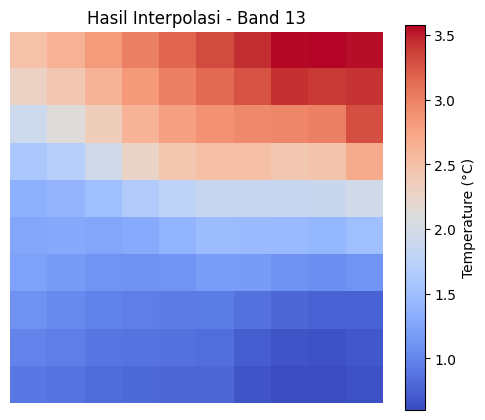

📊 Statistik Band 13 setelah interpolasi:
- Min: 0.60
- Max: 3.58
- Mean: 1.78
- Std Dev: 0.92
----------------------------------------
🔄 Memproses band ke-14...


Band 14: 100%|██████████| 36/36 [00:00<00:00, 652.73it/s]


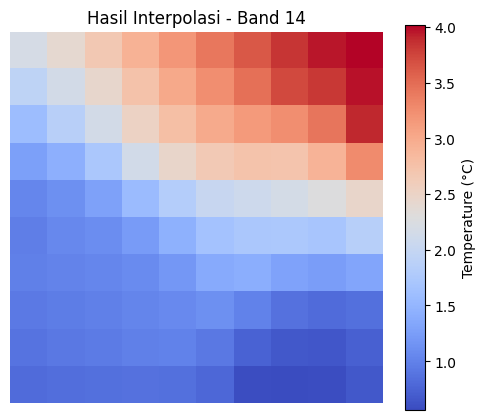

📊 Statistik Band 14 setelah interpolasi:
- Min: 0.56
- Max: 4.02
- Mean: 1.83
- Std Dev: 1.01
----------------------------------------
🔄 Memproses band ke-15...


Band 15: 100%|██████████| 36/36 [00:00<00:00, 518.03it/s]


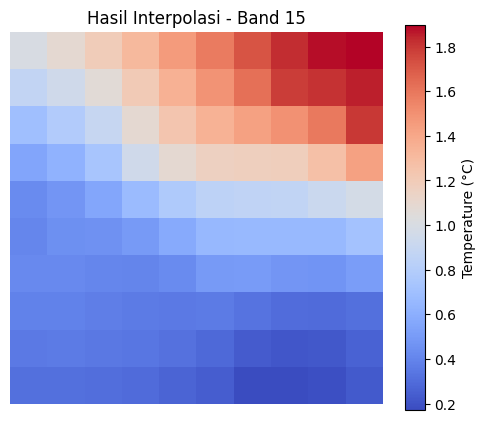

📊 Statistik Band 15 setelah interpolasi:
- Min: 0.17
- Max: 1.90
- Mean: 0.78
- Std Dev: 0.50
----------------------------------------
🔄 Memproses band ke-16...


Band 16: 100%|██████████| 36/36 [00:00<00:00, 523.09it/s]


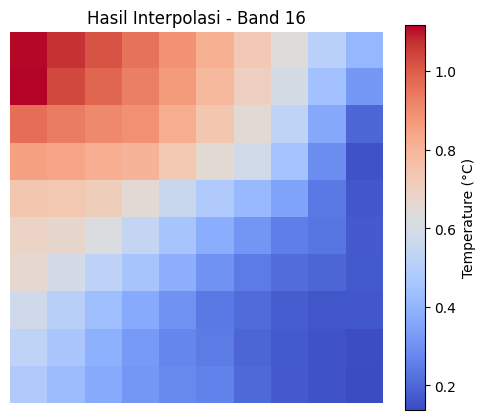

📊 Statistik Band 16 setelah interpolasi:
- Min: 0.14
- Max: 1.12
- Mean: 0.51
- Std Dev: 0.27
----------------------------------------
🔄 Memproses band ke-17...


Band 17: 100%|██████████| 36/36 [00:00<00:00, 641.52it/s]


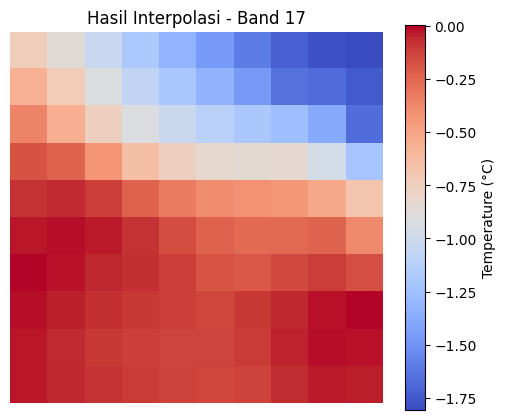

📊 Statistik Band 17 setelah interpolasi:
- Min: -1.81
- Max: 0.00
- Mean: -0.51
- Std Dev: 0.55
----------------------------------------
🔄 Memproses band ke-18...


Band 18: 100%|██████████| 36/36 [00:00<00:00, 477.75it/s]


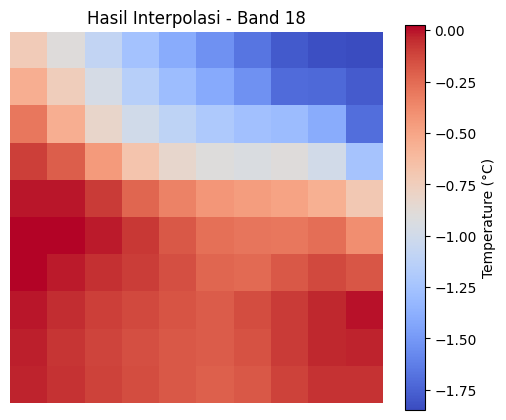

📊 Statistik Band 18 setelah interpolasi:
- Min: -1.85
- Max: 0.03
- Mean: -0.54
- Std Dev: 0.57
----------------------------------------
🔄 Memproses band ke-19...


Band 19: 100%|██████████| 36/36 [00:00<00:00, 520.82it/s]


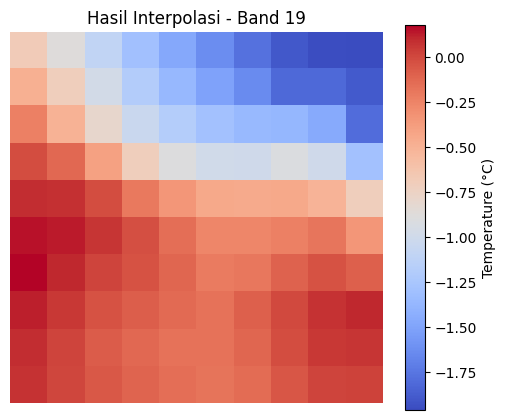

📊 Statistik Band 19 setelah interpolasi:
- Min: -1.96
- Max: 0.18
- Mean: -0.52
- Std Dev: 0.63
----------------------------------------
🔄 Memproses band ke-20...


Band 20: 100%|██████████| 36/36 [00:00<00:00, 582.58it/s]


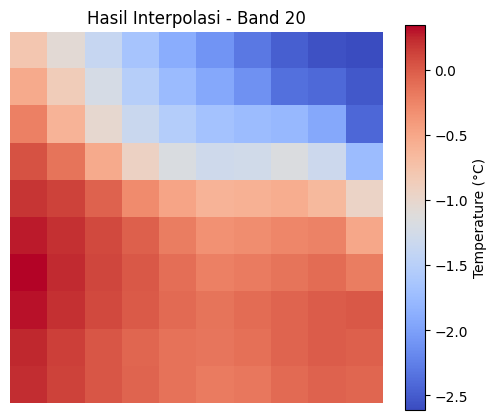

📊 Statistik Band 20 setelah interpolasi:
- Min: -2.61
- Max: 0.34
- Mean: -0.66
- Std Dev: 0.84
----------------------------------------
🔄 Memproses band ke-21...


Band 21: 100%|██████████| 36/36 [00:00<00:00, 51.56it/s]


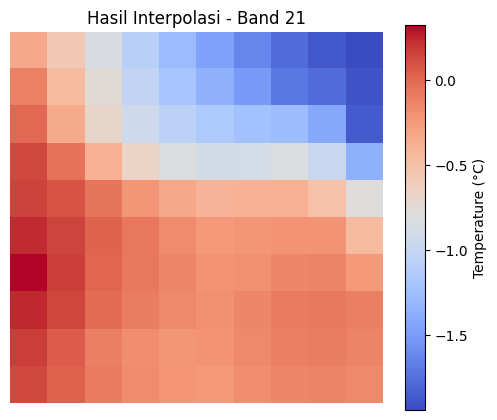

📊 Statistik Band 21 setelah interpolasi:
- Min: -1.94
- Max: 0.32
- Mean: -0.49
- Std Dev: 0.59
----------------------------------------
🔄 Memproses band ke-22...


Band 22: 100%|██████████| 36/36 [00:00<00:00, 398.30it/s]


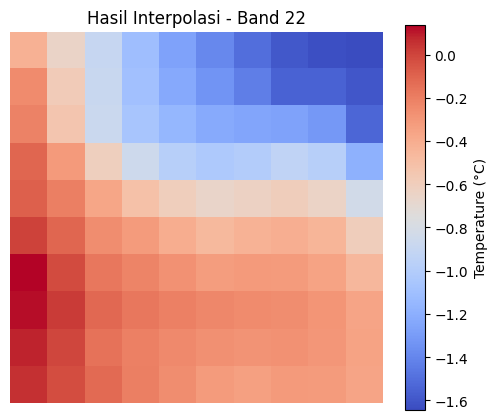

📊 Statistik Band 22 setelah interpolasi:
- Min: -1.64
- Max: 0.14
- Mean: -0.59
- Std Dev: 0.49
----------------------------------------
🔄 Memproses band ke-23...


Band 23: 100%|██████████| 36/36 [00:00<00:00, 244.48it/s]


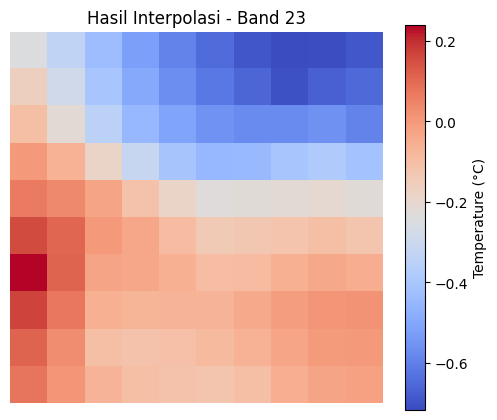

📊 Statistik Band 23 setelah interpolasi:
- Min: -0.72
- Max: 0.24
- Mean: -0.21
- Std Dev: 0.25
----------------------------------------
🔄 Memproses band ke-24...


Band 24: 100%|██████████| 36/36 [00:00<00:00, 328.90it/s]


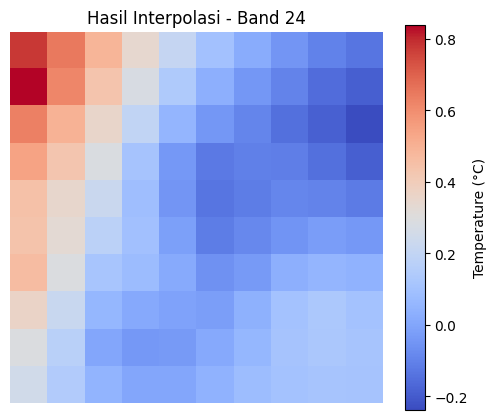

📊 Statistik Band 24 setelah interpolasi:
- Min: -0.24
- Max: 0.84
- Mean: 0.11
- Std Dev: 0.22
----------------------------------------
🔄 Memproses band ke-25...


Band 25: 100%|██████████| 36/36 [00:00<00:00, 253.47it/s]


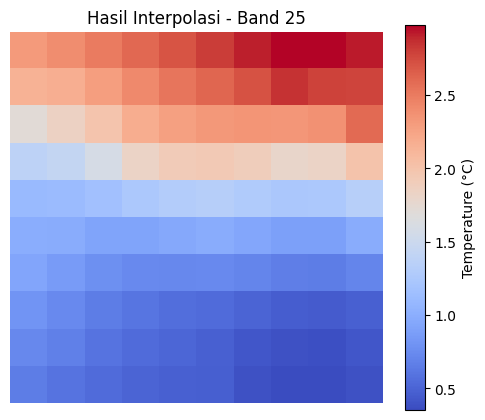

📊 Statistik Band 25 setelah interpolasi:
- Min: 0.35
- Max: 2.98
- Mean: 1.37
- Std Dev: 0.84
----------------------------------------
🔄 Memproses band ke-26...


Band 26: 100%|██████████| 36/36 [00:00<00:00, 42.59it/s]


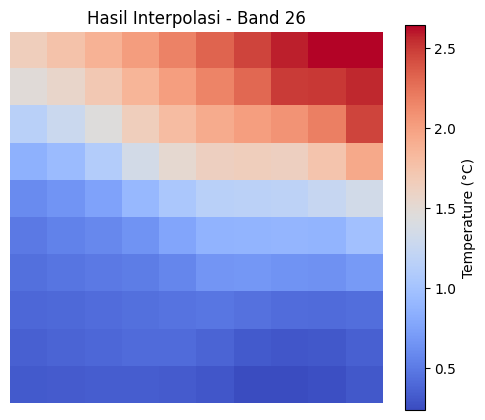

📊 Statistik Band 26 setelah interpolasi:
- Min: 0.24
- Max: 2.64
- Mean: 1.09
- Std Dev: 0.74
----------------------------------------
🔄 Memproses band ke-27...


Band 27: 100%|██████████| 36/36 [00:00<00:00, 51.72it/s]


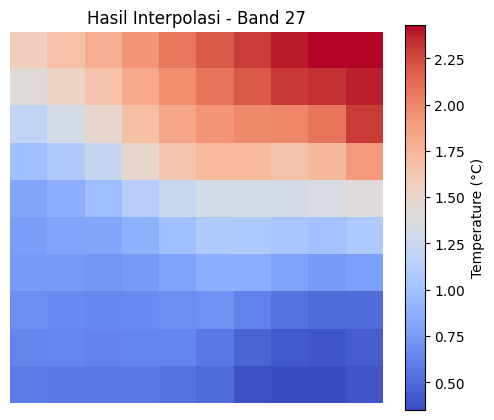

📊 Statistik Band 27 setelah interpolasi:
- Min: 0.35
- Max: 2.43
- Mean: 1.19
- Std Dev: 0.62
----------------------------------------
🔄 Memproses band ke-28...


Band 28: 100%|██████████| 36/36 [00:00<00:00, 155.82it/s]


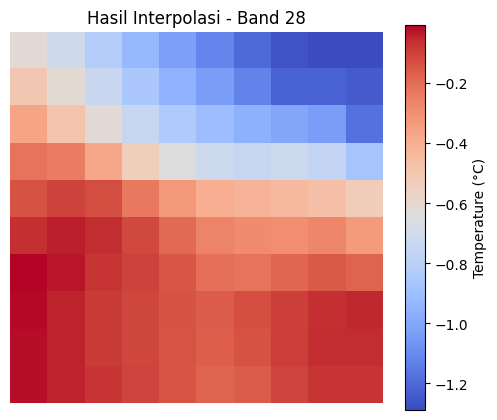

📊 Statistik Band 28 setelah interpolasi:
- Min: -1.29
- Max: -0.01
- Mean: -0.43
- Std Dev: 0.40
----------------------------------------
🔄 Memproses band ke-29...


Band 29: 100%|██████████| 36/36 [00:00<00:00, 77.69it/s]


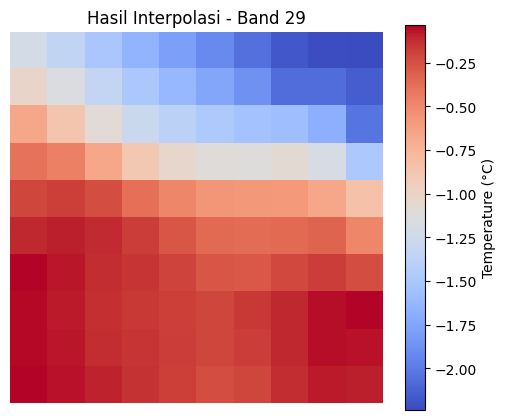

📊 Statistik Band 29 setelah interpolasi:
- Min: -2.24
- Max: -0.03
- Mean: -0.71
- Std Dev: 0.69
----------------------------------------
🔄 Memproses band ke-30...


Band 30: 100%|██████████| 36/36 [00:00<00:00, 407.58it/s]


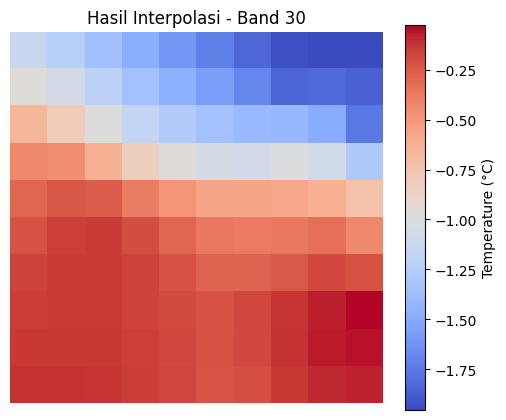

📊 Statistik Band 30 setelah interpolasi:
- Min: -1.95
- Max: -0.03
- Mean: -0.66
- Std Dev: 0.60
----------------------------------------
🔄 Memproses band ke-31...


Band 31: 100%|██████████| 36/36 [00:00<00:00, 404.77it/s]


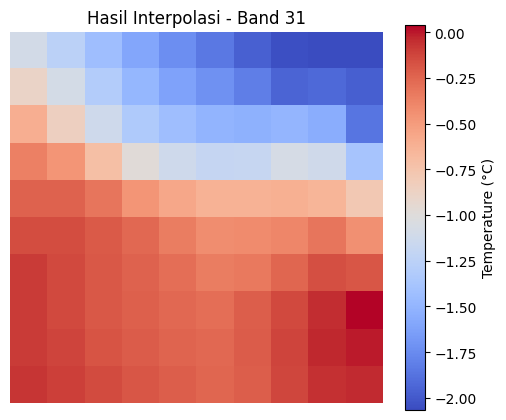

📊 Statistik Band 31 setelah interpolasi:
- Min: -2.07
- Max: 0.04
- Mean: -0.71
- Std Dev: 0.64
----------------------------------------
🔄 Memproses band ke-32...


Band 32: 100%|██████████| 36/36 [00:00<00:00, 397.07it/s]


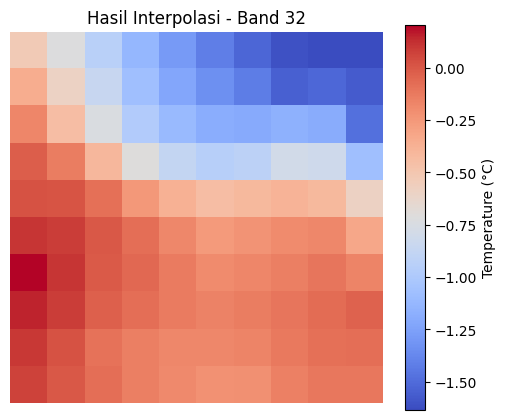

📊 Statistik Band 32 setelah interpolasi:
- Min: -1.63
- Max: 0.20
- Mean: -0.48
- Std Dev: 0.53
----------------------------------------
🔄 Memproses band ke-33...


Band 33: 100%|██████████| 36/36 [00:00<00:00, 423.99it/s]


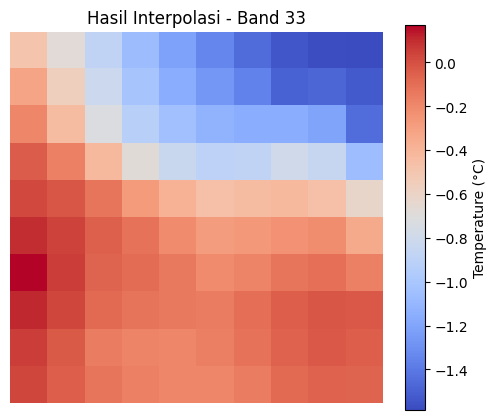

📊 Statistik Band 33 setelah interpolasi:
- Min: -1.58
- Max: 0.17
- Mean: -0.47
- Std Dev: 0.50
----------------------------------------
🔄 Memproses band ke-34...


Band 34: 100%|██████████| 36/36 [00:00<00:00, 417.07it/s]


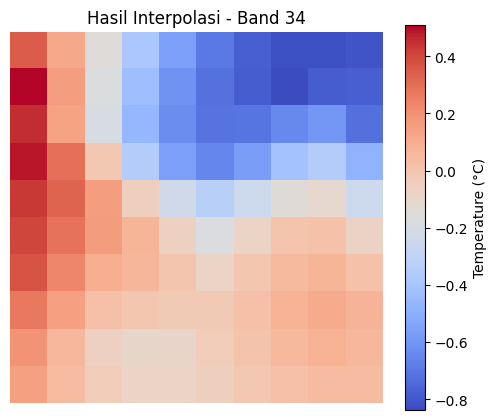

📊 Statistik Band 34 setelah interpolasi:
- Min: -0.84
- Max: 0.51
- Mean: -0.14
- Std Dev: 0.35
----------------------------------------
🔄 Memproses band ke-35...


Band 35: 100%|██████████| 36/36 [00:00<00:00, 393.60it/s]


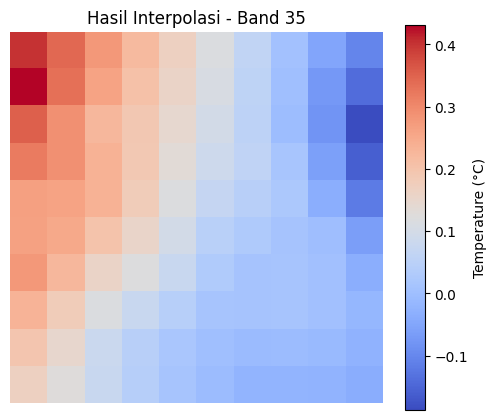

📊 Statistik Band 35 setelah interpolasi:
- Min: -0.19
- Max: 0.43
- Mean: 0.09
- Std Dev: 0.13
----------------------------------------
🔄 Memproses band ke-36...


Band 36: 100%|██████████| 36/36 [00:00<00:00, 367.60it/s]


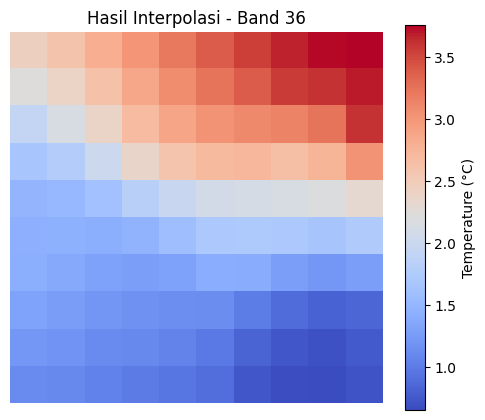

📊 Statistik Band 36 setelah interpolasi:
- Min: 0.65
- Max: 3.76
- Mean: 1.93
- Std Dev: 0.91
----------------------------------------
✅ Semua band berhasil diinterpolasi dan disimpan ke /content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/10u_EXPORT/ERA5_10u_Monthly_2022_2024_NaN_Interpolated.tif


In [ ]:
import numpy as np
import rasterio
from rasterio.plot import show
from pykrige.ok import OrdinaryKriging
from tqdm import tqdm

# ----------------------------------
# INTERPOLATE MISSING VALUE 36 BULAN
# -----------------------------------

file_path = '/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/10u_EXPORT/ERA5_10u_Monthly_2022_2024.tif'
with rasterio.open(file_path) as src:
    profile = src.profile
    transform = src.transform
    all_data = []

    for i in range(1, src.count + 1):  # Loop through 36 bands
        print(f"🔄 Memproses band ke-{i}...")
        data = src.read(i)
        rows, cols = np.where(~np.isnan(data))
        z = data[rows, cols]

        if len(z) == 0:
            print(f"⚠️ Band {i} tidak memiliki data valid. Lewat.")
            all_data.append(data)
            continue

        x_coords, y_coords = rasterio.transform.xy(transform, rows, cols)

        ok = OrdinaryKriging(
            x_coords, y_coords, z,
            variogram_model='linear',
            verbose=False,
            enable_plotting=False
        )

        nan_rows, nan_cols = np.where(np.isnan(data))
        x_nan, y_nan = rasterio.transform.xy(transform, nan_rows, nan_cols)

        z_nan = []
        for x, y in tqdm(zip(x_nan, y_nan), total=len(x_nan), desc=f'Band {i}'):
            z_, _ = ok.execute('points', x, y)
            z_nan.append(z_[0])

        z_nan = np.array(z_nan)
        data[nan_rows, nan_cols] = z_nan


        # Tampilkan visualisasi hasil interpolasi
        plt.figure(figsize=(6, 5))
        plt.imshow(data, cmap='coolwarm')
        plt.colorbar(label='Temperature (°C)')
        plt.title(f'Hasil Interpolasi - Band {i}')
        plt.axis('off')
        plt.show()

        # Statistik dasar
        print(f"📊 Statistik Band {i} setelah interpolasi:")
        print(f"- Min: {np.nanmin(data):.2f}")
        print(f"- Max: {np.nanmax(data):.2f}")
        print(f"- Mean: {np.nanmean(data):.2f}")
        print(f"- Std Dev: {np.nanstd(data):.2f}")
        print("-" * 40)

        all_data.append(data) # Fixed indentation

# Simpan semua band
output_path = file_path.replace('.tif', '_NaN_Interpolated.tif')
profile.update(count=36)

with rasterio.open(output_path, 'w', **profile) as dst:
    for i, band_data in enumerate(all_data, start=1):
        dst.write(band_data, i)

print(f"✅ Semua band berhasil diinterpolasi dan disimpan ke {output_path}")

In [ ]:
# -------------------------------
# MEMASTIKAN TIDAK ADA NaN
# -------------------------------

import numpy as np
import rasterio

# Buka raster hasil kriging
with rasterio.open('/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/10u_EXPORT/NAN/ERA5_10v_Monthly_2022_2024_NaN_Interpolated.tif') as src:
    data = src.read(1)

# Cek apakah masih ada NaN
ada_nan = np.isnan(data).any()

if ada_nan:
    print("Masih ada nilai NaN di dalam raster.")
else:
    print("Tidak ada nilai NaN, semua data sudah terisi.")

import rasterio

# Path ke file TIFF
tif_path = '/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/10u_EXPORT/NAN/ERA5_10v_Monthly_2022_2024_NaN_Interpolated.tif'

# Buka file TIFF
with rasterio.open(tif_path) as src:
    # Dapatkan lebar dan tinggi dalam piksel
    width = src.width
    height = src.height

    print(f"Lebar raster: {width} piksel")
    print(f"Tinggi raster: {height} piksel")


Tidak ada nilai NaN, semua data sudah terisi.
Lebar raster: 10 piksel
Tinggi raster: 10 piksel


✅ ERA5_10u_Monthly_2022_2024_NaN_Interpolated.tif - Resampled dengan NoData: nan


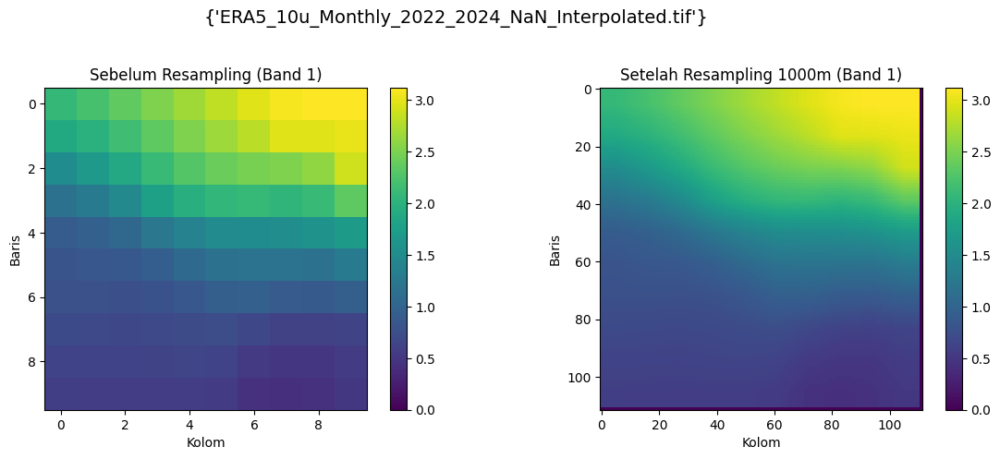

📊 Hasil evaluasi 36 band disimpan di: /content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/10u_EXPORT/DOWNSCALED/eval_all_bands.csv


In [ ]:
#-------------------
# Downscaling Multi-Band (36 Band)
#-------------------

import rasterio
from rasterio.enums import Resampling
from rasterio.warp import calculate_default_transform, reproject
import matplotlib.pyplot as plt
import numpy as np
import os
from glob import glob
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from skimage.transform import resize
import pandas as pd

# Visualisasi sebelum dan sesudah resampling untuk band pertama
def visualize_comparison(before_array, after_array, title):
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))
    cmap = 'viridis'

    # Ambil band pertama untuk visualisasi
    before_band = np.ma.masked_invalid(before_array[0])
    after_band = np.ma.masked_invalid(after_array[0])

    vmin = min(np.nanmin(before_band), np.nanmin(after_band))
    vmax = max(np.nanmax(before_band), np.nanmax(after_band))

    im1 = axs[0].imshow(before_band, cmap=cmap, vmin=vmin, vmax=vmax)
    axs[0].set_title("Sebelum Resampling (Band 1)")
    axs[0].set_xlabel("Kolom")
    axs[0].set_ylabel("Baris")
    plt.colorbar(im1, ax=axs[0], orientation="vertical", fraction=0.05)

    im2 = axs[1].imshow(after_band, cmap=cmap, vmin=vmin, vmax=vmax)
    axs[1].set_title("Setelah Resampling 1000m (Band 1)")
    axs[1].set_xlabel("Kolom")
    axs[1].set_ylabel("Baris")
    plt.colorbar(im2, ax=axs[1], orientation="vertical", fraction=0.05)

    plt.suptitle(title, fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Evaluasi statistik untuk semua band
def evaluate_stats_all_bands(before, after, filename):
    results = []
    for band_idx in range(before.shape[0]):
        before_band = before[band_idx]
        after_band = after[band_idx]

        # Resize untuk matching shape
        after_resized = resize(after_band, before_band.shape,
                             order=1, preserve_range=True,
                             anti_aliasing=False)

        mask = ~np.isnan(before_band) & ~np.isnan(after_resized)

        if np.count_nonzero(mask) == 0:
            print(f"⚠️ {filename} Band {band_idx+1} tidak dapat dievaluasi")
            continue

        y_true = before_band[mask]
        y_pred = after_resized[mask]

        mse = mean_squared_error(y_true, y_pred)
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(y_true, y_pred)
        r2 = r2_score(y_true, y_pred)

        results.append({
            "Filename": filename,
            "Band": band_idx+1,
            "RMSE": rmse,
            "MSE": mse,
            "MAE": mae,
            "R2": r2
        })

    return results

# Fungsi resampling untuk semua band
def resample_raster_to_1km_all_bands(input_path, output_path, visualize=True):
    with rasterio.open(input_path) as src:
        # Baca semua band
        src_nodata = src.nodata if src.nodata is not None else np.nan
        src_array = src.read()  # Shape: (bands, rows, cols)
        src_array = np.where(src_array == src_nodata, np.nan, src_array)
        src_transform = src.transform
        src_crs = src.crs
        src_bounds = src.bounds

        # Hitung transformasi output
        dst_transform, width, height = calculate_default_transform(
            src_crs, src_crs,
            src.width, src.height,
            *src_bounds,
            resolution=1000
        )

        # Siapkan array output
        dst_array = np.full((src.count, height, width), np.nan, dtype=src.dtypes[0])

        # Update metadata
        kwargs = src.meta.copy()
        kwargs.update({
            'driver': 'GTiff',
            'count': src.count,
            'crs': src_crs,
            'transform': dst_transform,
            'width': width,
            'height': height,
            'nodata': src_nodata
        })

        # Proses resampling per band
        with rasterio.open(output_path, 'w', **kwargs) as dst:
            dst_array = np.empty((src.count, height, width), dtype=src.dtypes[0])

            for band in range(src.count):
                reproject(
                    source=src_array[band],
                    destination=dst_array[band],
                    src_transform=src_transform,
                    src_crs=src_crs,
                    dst_transform=dst_transform,
                    dst_crs=src_crs,
                    resampling=Resampling.bilinear
                )
                dst.write(dst_array[band], band+1)

    print(f"✅ {os.path.basename(input_path)} - Resampled dengan NoData: {src_nodata}")

    if visualize:
        visualize_comparison(src_array, dst_array,
                           {os.path.basename(input_path)})

    return src_array, dst_array

# Batch Processing untuk semua file
input_folder = "/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/10u_EXPORT/NAN"
output_folder = "/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/10u_EXPORT/DOWNSCALED"
os.makedirs(output_folder, exist_ok=True)

raster_files = glob(os.path.join(input_folder, "*.tif"))
all_results = []

for raster_file in raster_files:
    filename = os.path.basename(raster_file)
    output_path = os.path.join(output_folder, f"{os.path.splitext(filename)[0]}_1km.tif")

    # Proses resampling
    before, after = resample_raster_to_1km_all_bands(raster_file, output_path)

    # Evaluasi
    stats = evaluate_stats_all_bands(before, after, filename)
    all_results.extend(stats)

# Simpan hasil evaluasi
df = pd.DataFrame(all_results)
csv_path = os.path.join(output_folder, "eval_all_bands.csv")
df.to_csv(csv_path, index=False)
print(f"📊 Hasil evaluasi 36 band disimpan di: {csv_path}")

In [ ]:
# Simpan hasil evaluasi
df = pd.DataFrame(all_results)
csv_path = os.path.join(output_folder, "eval_all_bands.csv")
df.to_csv(csv_path, index=False)
print(f"📊 Hasil evaluasi 36 band disimpan di: {csv_path}")

📊 Hasil evaluasi 36 band disimpan di: /content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/10u_EXPORT/DOWNSCALED/eval_all_bands.csv


Jumlah file ditemukan: 2


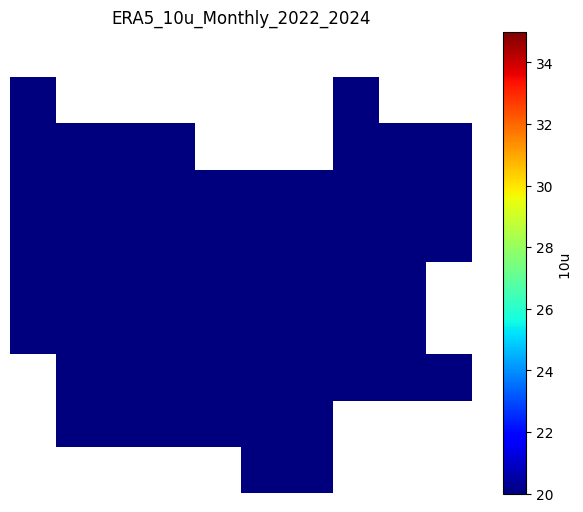

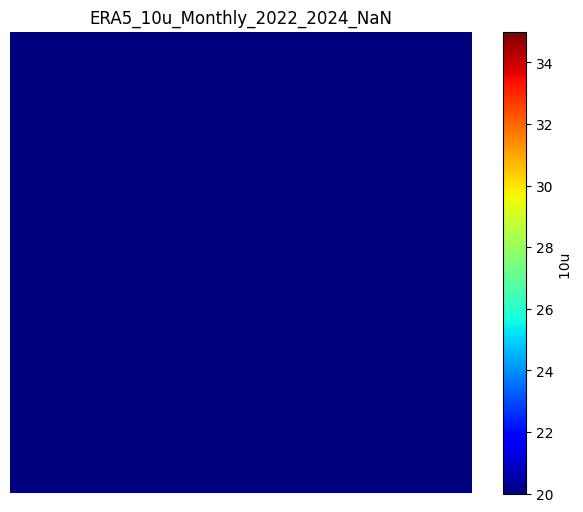

In [ ]:
#----------------------
# MELIHAT VISUALISASI
#----------------------

import os
import glob
import rasterio
import matplotlib.pyplot as plt

# Path folder hasil ekspor
folder_path = '/content/drive/MyDrive/10u_EXPORT'  # Ganti dengan folder lokal kamu

# Cari semua file .tif di folder
tif_files = sorted(glob.glob(os.path.join(folder_path, '*.tif')))

print(f"Jumlah file ditemukan: {len(tif_files)}")

# Loop dan tampilkan
for tif_file in tif_files:
    with rasterio.open(tif_file) as src:
        image = src.read(1)  # baca band 1
        profile = src.profile

    plt.figure(figsize=(8, 6))
    plt.imshow(image, cmap='jet', vmin=20, vmax=35)  # vmin & vmax bisa disesuaikan
    plt.colorbar(label='10u ')
    plt.title(os.path.basename(tif_file).replace('.tif', ''))
    plt.axis('off')
    plt.show()

In [ ]:
#-------------------------------
# INFORMASI NAN Pasca Downscale
#------------------------------

import rasterio
import numpy as np
import pandas as pd

# 1. Buka file TIFF
tif_path = '/content/drive/MyDrive/10u_EXPORT/ERA5_10u_Monthly_2022_2024_1KM/ERA5_10u_Monthly_2022_2024_NaN_resampled.tif'
with rasterio.open(tif_path) as src:
    data = src.read()  # (bands, height, width)
    profile = src.profile

# 2. Siapkan list bulan (label)
start_year = 2022
start_month = 1
labels = []
for i in range(36):
    year = start_year + (start_month + i - 1) // 12
    month = (start_month + i - 1) % 12 + 1
    labels.append(f"{year:04d}-{month:02d}")

# 3. Hitung valid_ratio dan missing_ratio
valid_ratios = []
missing_ratios_percent = []

for i in range(data.shape[0]):  # untuk tiap band
    band = data[i, :, :]
    total_pixels = band.size
    valid_pixels = np.count_nonzero(~np.isnan(band))
    valid_ratio = valid_pixels / total_pixels
    missing_ratio = 1.0 - valid_ratio

    valid_ratios.append(valid_ratio)
    missing_ratios_percent.append(missing_ratio * 100)

# 4. Buat dataframe ringkasan
summary_df = pd.DataFrame({
    'label': labels,
    'valid_ratio': valid_ratios,
    'missing_ratio_percent': missing_ratios_percent
})

# 5. Tampilkan
print(summary_df)

# 6. (Opsional) Simpan ke CSV
summary_df.to_csv('/content/drive/MyDrive/10u_EXPORT/valid_missing_summarydw.csv', index=False)



      label  valid_ratio  missing_ratio_percent
0   2022-01          1.0                    0.0
1   2022-02          1.0                    0.0
2   2022-03          1.0                    0.0
3   2022-04          1.0                    0.0
4   2022-05          1.0                    0.0
5   2022-06          1.0                    0.0
6   2022-07          1.0                    0.0
7   2022-08          1.0                    0.0
8   2022-09          1.0                    0.0
9   2022-10          1.0                    0.0
10  2022-11          1.0                    0.0
11  2022-12          1.0                    0.0
12  2023-01          1.0                    0.0
13  2023-02          1.0                    0.0
14  2023-03          1.0                    0.0
15  2023-04          1.0                    0.0
16  2023-05          1.0                    0.0
17  2023-06          1.0                    0.0
18  2023-07          1.0                    0.0
19  2023-08          1.0                

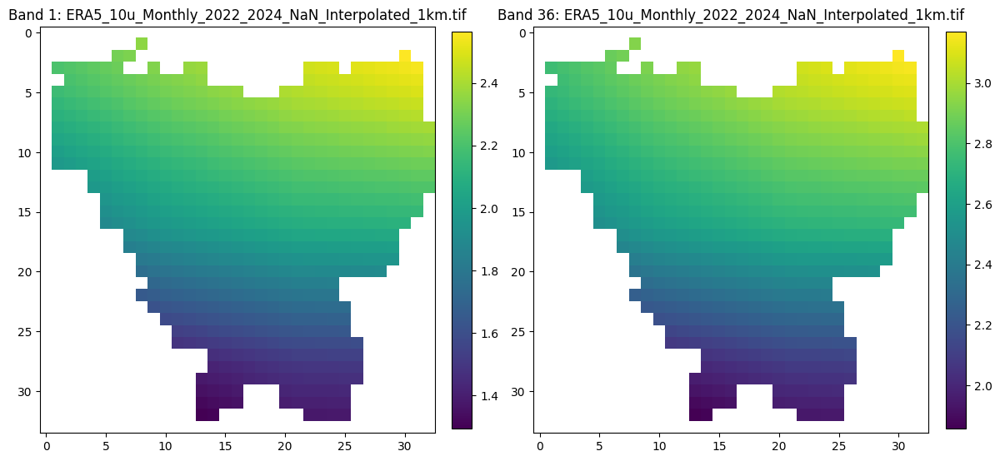

✅ Processed multiband: ERA5_10u_Monthly_2022_2024_NaN_Interpolated_1km.tif


In [ ]:
#-------------------------
# CLIP DOWNSCALED (MULTIBAND)
#-------------------------
import rasterio
from rasterio.mask import mask
import geopandas as gpd
import numpy as np
import os
from glob import glob
import matplotlib.pyplot as plt

# === 1. BACA SHAPEFILE BATAS ADMINISTRASI ===
shapefile_path = '/content/drive/MyDrive/PENGOLAHAN/DKI Jakarta/DKI Jakarta.shp'
gdf = gpd.read_file(shapefile_path)

# === 2. DAFTAR SEMUA FILE RASTER YANG MAU DIOLAH ===
input_folder = '/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/10u_EXPORT/DOWNSCALED'  # folder berisi hasil resampling
output_folder = '/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/10u_EXPORT/CLIP'
os.makedirs(output_folder, exist_ok=True)
raster_files = sorted(glob(os.path.join(input_folder, '*.tif')))

# === 3. LOOP UNTUK SETIAP FILE RASTER ===
for raster_path in raster_files:
    with rasterio.open(raster_path) as src:
        raster_data = src.read()  # ⬅️ Ambil semua band (multiband)
        raster_meta = src.meta.copy()

        # Cek dan samakan CRS shapefile
        if gdf.crs != src.crs:
            gdf = gdf.to_crs(src.crs)

        # Gunakan nilai nodata asli
        nodata_value = src.nodata

        # Crop dan mask semua band
        out_image, out_transform = mask(
            src,
            gdf.geometry,
            crop=True,
            nodata=nodata_value
        )

        # Update metadata
        out_meta = raster_meta.copy()
        out_meta.update({
            "driver": "GTiff",
            "height": out_image.shape[1],
            "width": out_image.shape[2],
            "count": out_image.shape[0],  # ⬅️ Total band
            "transform": out_transform,
            "nodata": nodata_value
        })

        # Nama file output
        filename = os.path.basename(raster_path)
        output_path = os.path.join(output_folder, f"Jakarta_{filename}")

        # Simpan hasil raster clipped
        with rasterio.open(output_path, "w", **out_meta) as dest:
            dest.write(out_image)

        # === VISUALISASI: Band 1 & terakhir ===
        fig, ax = plt.subplots(1, 2, figsize=(12, 6))
        im1 = ax[0].imshow(out_image[0], cmap='viridis')
        ax[0].set_title(f"Band 1: {filename}")
        plt.colorbar(im1, ax=ax[0], fraction=0.046, pad=0.04)

        im2 = ax[1].imshow(out_image[-1], cmap='viridis')
        ax[1].set_title(f"Band {out_image.shape[0]}: {filename}")
        plt.colorbar(im2, ax=ax[1], fraction=0.046, pad=0.04)

        plt.tight_layout()
        plt.show()

    print(f"✅ Processed multiband: {filename}")


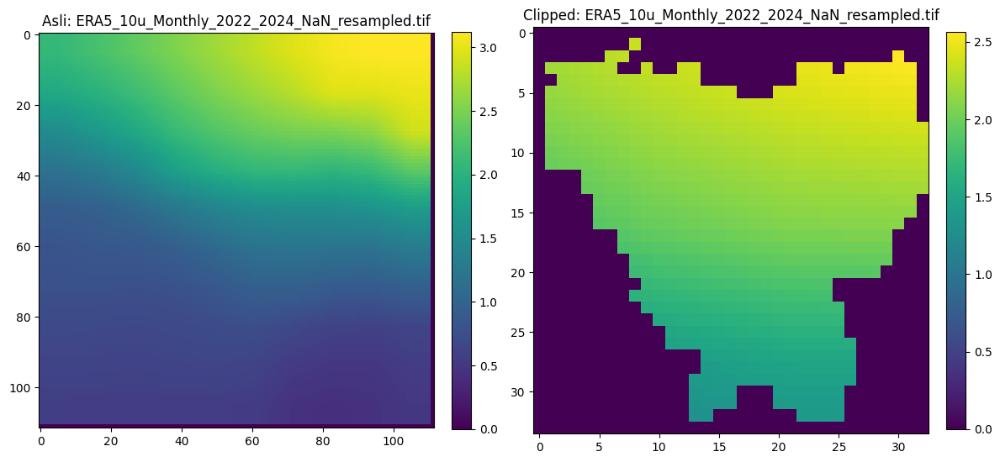

Processed and visualized: ERA5_10u_Monthly_2022_2024_NaN_resampled.tif


In [ ]:
import rasterio
from rasterio.mask import mask
import geopandas as gpd
import numpy as np
import os
from glob import glob
import matplotlib.pyplot as plt

# === 1. BACA SHAPEFILE BATAS ADMINISTRASI ===
shapefile_path = '/content/drive/MyDrive/PENGOLAHAN/DKI Jakarta/DKI Jakarta.shp'
gdf = gpd.read_file(shapefile_path)

# === 2. DAFTAR SEMUA FILE RASTER YANG MAU DIOLAH ===
input_folder = '/content/drive/MyDrive/10u_EXPORT/ERA5_10u_Monthly_2022_2024_1KM'  # folder berisi hasil resampling
output_folder = '/content/drive/MyDrive/10u_EXPORT/10u_monthly_clip'
os.makedirs(output_folder, exist_ok=True)
raster_files = sorted(glob(os.path.join(input_folder, '*.tif')))

# === 3. LOOP UNTUK SETIAP FILE RASTER ===
for raster_path in raster_files:
    with rasterio.open(raster_path) as src:
        raster_data = src.read(1)
        raster_meta = src.meta.copy()

        # Cek dan samakan CRS shapefile
        if gdf.crs != src.crs:
            gdf = gdf.to_crs(src.crs)

        # Gunakan nilai nodata asli
        nodata_value = src.nodata

        # Crop dan mask dengan nodata asli
        out_image, out_transform = mask(
            src,
            gdf.geometry,
            crop=True,
            nodata=nodata_value  # GUNAKAN nodata asli
        )

        # Update metadata
        out_meta = raster_meta.copy()
        out_meta.update({
            "driver": "GTiff",
            "height": out_image.shape[1],
            "width": out_image.shape[2],
            "transform": out_transform,
            "nodata": nodata_value
        })

        # Nama file output
        filename = os.path.basename(raster_path)
        output_path = os.path.join(output_folder, f"Jakarta_{filename}")

        # Simpan hasil raster clipped
        with rasterio.open(output_path, "w", **out_meta) as dest:
            dest.write(out_image)

        # === VISUALISASI SEBELUM DAN SESUDAH CLIPPING ===
        fig, ax = plt.subplots(1, 2, figsize=(12, 6))
        im1 = ax[0].imshow(raster_data, cmap='viridis')
        ax[0].set_title(f"Asli: {filename}")
        plt.colorbar(im1, ax=ax[0], fraction=0.046, pad=0.04)

        im2 = ax[1].imshow(out_image[0], cmap='viridis')
        ax[1].set_title(f"Clipped: {filename}")
        plt.colorbar(im2, ax=ax[1], fraction=0.046, pad=0.04)

        plt.tight_layout()
        plt.show()

    print(f"Processed and visualized: {filename}")


In [ ]:
#-------------------------
# INFORMASI NAN PASCA CLIP
#-------------------------

import rasterio
import numpy as np
import pandas as pd

# 1. Buka file TIFF
tif_path = '/content/drive/MyDrive/10u_EXPORT/10u_monthly_clip/Jakarta_ERA5_10u_Monthly_2022_2024_NaN_resampled.tif'
with rasterio.open(tif_path) as src:
    data = src.read()  # (bands, height, width)
    profile = src.profile

# 2. Siapkan list bulan (label)
start_year = 2022
start_month = 1
labels = []
for i in range(36):
    year = start_year + (start_month + i - 1) // 12
    month = (start_month + i - 1) % 12 + 1
    labels.append(f"{year:04d}-{month:02d}")

# 3. Hitung valid_ratio dan missing_ratio
valid_ratios = []
missing_ratios_percent = []

for i in range(data.shape[0]):  # untuk tiap band
    band = data[i, :, :]
    total_pixels = band.size
    valid_pixels = np.count_nonzero(~np.isnan(band))
    valid_ratio = valid_pixels / total_pixels
    missing_ratio = 1.0 - valid_ratio

    valid_ratios.append(valid_ratio)
    missing_ratios_percent.append(missing_ratio * 100)

# 4. Buat dataframe ringkasan
summary_df = pd.DataFrame({
    'label': labels,
    'valid_ratio': valid_ratios,
    'missing_ratio_percent': missing_ratios_percent
})

# 5. Tampilkan
print(summary_df)

# 6. (Opsional) Simpan ke CSV
summary_df.to_csv('/content/drive/MyDrive/10u_EXPORT/10u_monthly_clip/valid_missing_summaryclip.csv', index=False)




      label  valid_ratio  missing_ratio_percent
0   2022-01          1.0                    0.0
1   2022-02          1.0                    0.0
2   2022-03          1.0                    0.0
3   2022-04          1.0                    0.0
4   2022-05          1.0                    0.0
5   2022-06          1.0                    0.0
6   2022-07          1.0                    0.0
7   2022-08          1.0                    0.0
8   2022-09          1.0                    0.0
9   2022-10          1.0                    0.0
10  2022-11          1.0                    0.0
11  2022-12          1.0                    0.0
12  2023-01          1.0                    0.0
13  2023-02          1.0                    0.0
14  2023-03          1.0                    0.0
15  2023-04          1.0                    0.0
16  2023-05          1.0                    0.0
17  2023-06          1.0                    0.0
18  2023-07          1.0                    0.0
19  2023-08          1.0                

OSError: Cannot save file into a non-existent directory: '/content/drive/MyDrive/10u_EXPORT/10u_clip'

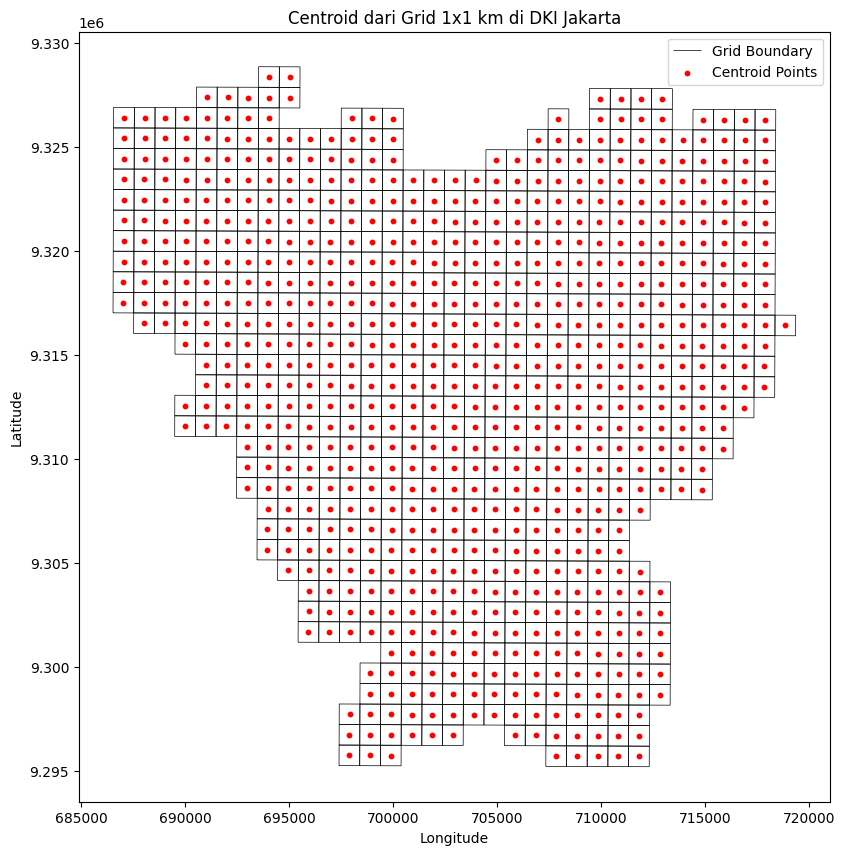

✅ Ekstraksi selesai! Hasil disimpan di /content/drive/MyDrive/10u_EXPORT/10u_monthly_clip/Jakarta_ERA5_U10_Monthly_2022_2024_Values.csv


In [ ]:
#-------------------------
# EKSTRAK NILAI
#-------------------------

import geopandas as gpd
import rasterio
from rasterio.sample import sample_gen
import pandas as pd
import matplotlib.pyplot as plt

# 1. Baca grid polygon
grid = gpd.read_file("/content/drive/MyDrive/PENGOLAHAN/Grid Jakarta/Grid Jakarta.shp")

# 2. Hitung centroid untuk setiap polygon
grid_centroid = grid.copy()
grid_centroid["geometry"] = grid_centroid.centroid

# 3. Tambahkan ID unik kalau belum ada
if "grid_id" not in grid_centroid.columns:
    grid_centroid["grid_id"] = ["G_{:04d}".format(i) for i in range(len(grid_centroid))]

# 4. Visualisasi centroid
fig, ax = plt.subplots(figsize=(10, 10))
grid.boundary.plot(ax=ax, color="black", linewidth=0.5, label="Grid Boundary")
grid_centroid.plot(ax=ax, color="red", markersize=10, label="Centroid Points")
plt.legend()
plt.title("Centroid dari Grid 1x1 km di DKI Jakarta")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

# 5. Simpan centroid ke shapefile (opsional)
grid_centroid.to_file("/content/drive/MyDrive/PENGOLAHAN/Grid Jakarta/grid_dki_centroid.shp")

# -------------
# 6. Ekstraksi nilai raster dari V-component of Wind
# -------------

# Buka file raster
raster_path = '/content/drive/MyDrive/10u_EXPORT/10u_monthly_clip/Jakarta_ERA5_10u_Monthly_2022_2024_NaN_resampledclip.tif'  # Ganti dengan path raster kamu
raster = rasterio.open(raster_path)

# Pastikan CRS raster sama dengan grid
if raster.crs != grid_centroid.crs:
    grid_centroid = grid_centroid.to_crs(raster.crs)

# Ekstrak nilai di titik centroid
coords = [(geom.x, geom.y) for geom in grid_centroid.geometry]
values = list(raster.sample(coords))

# Karena values bisa multi-band, ambil band pertama
extracted_values = [val[0] if val.size > 0 else None for val in values]
# 7. Masukkan nilai ke DataFrame
result_df = pd.DataFrame({
    "grid_id": grid_centroid["grid_id"],
    "longitude": [point.x for point in grid_centroid.geometry],
    "latitude": [point.y for point in grid_centroid.geometry],
    "u_component_10m": extracted_values
})

# 8. Simpan ke CSV (bisa dibuka di Google Sheets)
output_csv = "/content/drive/MyDrive/10u_EXPORT/10u_monthly_clip/Jakarta_ERA5_U10_Monthly_2022_2024_Values.csv"
result_df.to_csv(output_csv, index=False)

print(f"✅ Ekstraksi selesai! Hasil disimpan di {output_csv}")




# GEE Version Total Precipitation

In [ ]:
# Buat ImageCollection bulanan
multi_band_image = monthly_collection.toBands()


# -------------------
# PENYIMPANAN
# -------------------

# Export ke Google Drive
task = ee.batch.Export.image.toDrive(
    image=multi_band_image,
    description='monthly_tp',
    folder='TP_EXPORT',
    fileNamePrefix='ERA5_tp_Monthly_2022_2024',
    region=AOI.geometry(),
    scale=11132,
    crs='EPSG:32748',
    maxPixels=1e13
)
task.start()


✅ Informasi Umum
- CRS: EPSG:32748
- Resolusi (meter): (11132.0, 11132.0)
- Ukuran raster: 10 x 10
- Jumlah band: 36
- Bounds: BoundingBox(left=645656.0, bottom=9239560.0, right=756976.0, top=9350880.0)

📦 Statistik per band:
 Band 1: min=2.04, max=3.45, mean=2.87
 Band 2: min=2.00, max=4.65, mean=3.29
 Band 3: min=1.79, max=4.75, mean=3.40
 Band 4: min=2.03, max=5.18, mean=3.62
 Band 5: min=1.61, max=3.89, mean=2.45
 Band 6: min=1.78, max=4.93, mean=2.80
 Band 7: min=1.11, max=2.33, mean=1.67
 Band 8: min=0.79, max=2.53, mean=1.53
 Band 9: min=1.27, max=5.85, mean=2.75
 Band 10: min=2.79, max=7.50, mean=4.99
 Band 11: min=2.07, max=5.94, mean=3.84
 Band 12: min=2.73, max=6.34, mean=4.39
 Band 13: min=1.84, max=3.90, mean=2.92
 Band 14: min=3.33, max=5.66, mean=4.07
 Band 15: min=2.38, max=5.40, mean=3.86
 Band 16: min=1.14, max=2.81, mean=1.98
 Band 17: min=0.90, max=2.95, mean=1.88
 Band 18: min=0.78, max=2.07, mean=1.38
 Band 19: min=0.67, max=2.29, mean=1.38
 Band 20: min=0.09, max

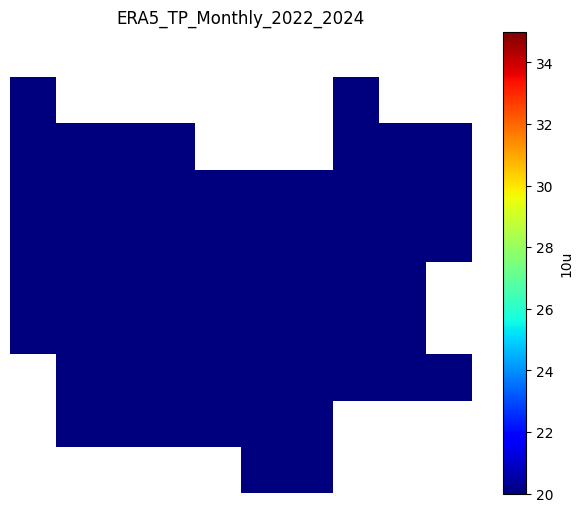

In [ ]:
#-------------------
# MELIHAT INFORMASI
#-------------------

import rasterio
from rasterio.plot import show
import os
import numpy as np

# Buka file multiband
file_path = '/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/TP_EXPORT/ERA5_TP_Monthly_2022_2024.tif'
with rasterio.open(file_path) as src:
    print("✅ Informasi Umum")
    print(f"- CRS: {src.crs}")
    print(f"- Resolusi (meter): {src.res}")
    print(f"- Ukuran raster: {src.width} x {src.height}")
    print(f"- Jumlah band: {src.count}")
    print(f"- Bounds: {src.bounds}")

    print("\n📦 Statistik per band:")
    for i in range(1, src.count + 1):
        band = src.read(i)
        band_name = f"Band {i}"  # Atau bisa pakai nama dari metadata jika tersedia
        print(f" {band_name}: min={np.nanmin(band):.2f}, max={np.nanmax(band):.2f}, mean={np.nanmean(band):.2f}")

    print("\n📝 Metadata tambahan (jika ada):")
    print(src.tags())


#----------------------
# MELIHAT VISUALISASI
#----------------------

import os
import glob
import rasterio
import matplotlib.pyplot as plt

# Path folder hasil ekspor
folder_path = '/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/TP_EXPORT'  # Ganti dengan folder lokal kamu

# Cari semua file .tif di folder
tif_files = sorted(glob.glob(os.path.join(folder_path, '*.tif')))

print(f"Jumlah file ditemukan: {len(tif_files)}")

# Loop dan tampilkan
for tif_file in tif_files:
    with rasterio.open(tif_file) as src:
        image = src.read(1)  # baca band 1
        profile = src.profile

    plt.figure(figsize=(8, 6))
    plt.imshow(image, cmap='jet', vmin=20, vmax=35)  # vmin & vmax bisa disesuaikan
    plt.colorbar(label='10u')
    plt.title(os.path.basename(tif_file).replace('.tif', ''))
    plt.axis('off')
    plt.show()



In [ ]:
#-------------------
# INFORMASI MISSING
#-------------------

# Step 1: Tambahkan label (YYYY-MM) dan valid_ratio ke setiap image

def add_valid_ratio(image):
    band_name = 'tp'  # Ganti dengan nama band yang sesuai

    # Mask menunjukkan piksel valid
    mask = image.mask().gt(0)

    # Hitung luas area valid (m²)
    valid_area_image = mask.multiply(ee.Image.pixelArea())
    area_stats = valid_area_image.reduceRegion(
        reducer=ee.Reducer.sum(),
        geometry=AOI.geometry(),  # jika AOI berupa FeatureCollection
        scale=11132,
        maxPixels=1e13
    )

    # Luas valid & total AOI
    valid_area = ee.Number(area_stats.get(band_name))
    total_area = AOI.geometry().area()

    # Rasio valid dan missing
    valid_ratio = valid_area.divide(total_area)
    missing_ratio = ee.Number(1.0).subtract(valid_ratio)

    # Tambahkan ke metadata image
    image = image.set('valid_ratio', valid_ratio)
    image = image.set('missing_ratio', missing_ratio)  # missing ratio as a number (0-1)
    image = image.set('missing_ratio_percent', missing_ratio.multiply(100))  # missing ratio as percentage
    return image


def calculate_monthly_mean_with_ratio(month_offset):
    start = start_date.advance(month_offset, 'month')
    end = start.advance(1, 'month')
    label = start.format('YYYY-MM')

    filtered = era5_collection.filterDate(start, end)
    monthly_mean = filtered.select('total_precipitation') \
        .mean() \
        .clip(AOI) \
        .rename('tp') \
        .set('label', label)

    # Tambahkan valid_ratio dan missing_ratio
    return add_valid_ratio(monthly_mean)

# Step 2: Buat koleksi dengan rasio valid
monthly_collection = ee.ImageCollection(months.map(calculate_monthly_mean_with_ratio))

# Step 3: Konversi ke FeatureCollection untuk ringkasan
def image_to_feature(image):
    return ee.Feature(None, {
        'label': image.get('label'),
        'valid_ratio': image.get('valid_ratio'),
        'missing_ratio_percent': image.get('missing_ratio'),
    })

missing_ratio_fc = monthly_collection.map(image_to_feature)

# Step 4: Cetak hasil
print(missing_ratio_fc.aggregate_array('label').getInfo())
print(missing_ratio_fc.aggregate_array('missing_ratio_percent').getInfo())


['2022-01', '2022-02', '2022-03', '2022-04', '2022-05', '2022-06', '2022-07', '2022-08', '2022-09', '2022-10', '2022-11', '2022-12', '2023-01', '2023-02', '2023-03', '2023-04', '2023-05', '2023-06', '2023-07', '2023-08', '2023-09', '2023-10', '2023-11', '2023-12', '2024-01', '2024-02', '2024-03', '2024-04', '2024-05', '2024-06', '2024-07', '2024-08', '2024-09', '2024-10', '2024-11', '2024-12']
[0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.110107799419

🔄 Memproses band ke-1...


Band 1: 100%|██████████| 36/36 [00:00<00:00, 591.40it/s]


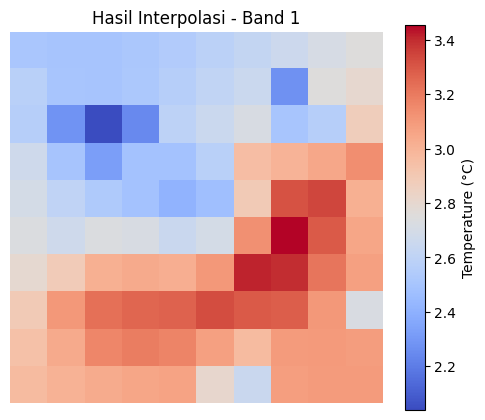

📊 Statistik Band 1 setelah interpolasi:
- Min: 2.04
- Max: 3.45
- Mean: 2.84
- Std Dev: 0.31
----------------------------------------
🔄 Memproses band ke-2...


Band 2: 100%|██████████| 36/36 [00:00<00:00, 444.39it/s]


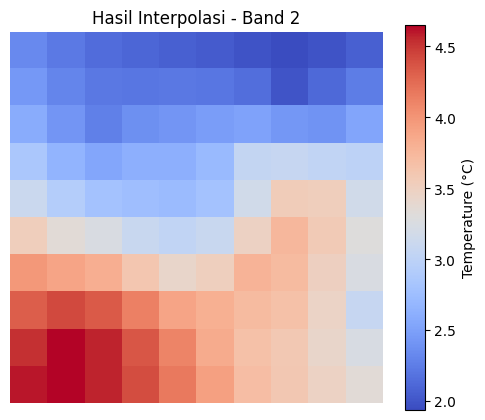

📊 Statistik Band 2 setelah interpolasi:
- Min: 1.94
- Max: 4.65
- Mean: 3.15
- Std Dev: 0.76
----------------------------------------
🔄 Memproses band ke-3...


Band 3: 100%|██████████| 36/36 [00:00<00:00, 164.92it/s]


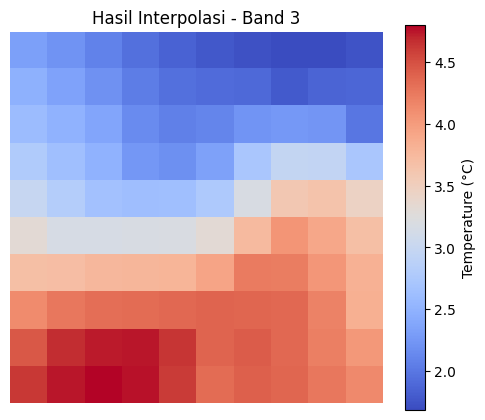

📊 Statistik Band 3 setelah interpolasi:
- Min: 1.68
- Max: 4.80
- Mean: 3.24
- Std Dev: 0.99
----------------------------------------
🔄 Memproses band ke-4...


Band 4: 100%|██████████| 36/36 [00:00<00:00, 732.42it/s]


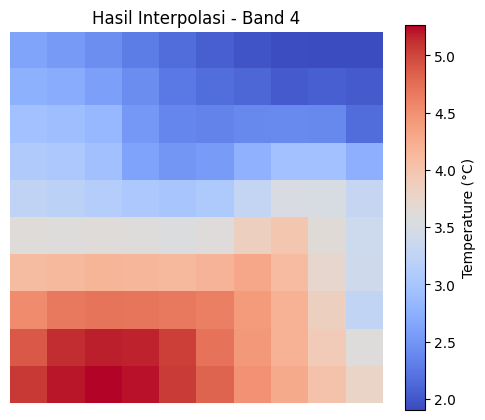

📊 Statistik Band 4 setelah interpolasi:
- Min: 1.90
- Max: 5.27
- Mean: 3.45
- Std Dev: 0.97
----------------------------------------
🔄 Memproses band ke-5...


Band 5: 100%|██████████| 36/36 [00:00<00:00, 604.83it/s]


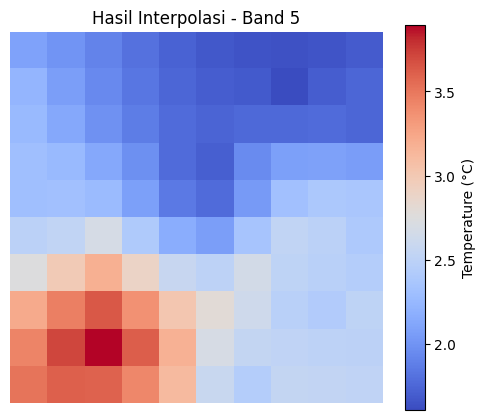

📊 Statistik Band 5 setelah interpolasi:
- Min: 1.61
- Max: 3.89
- Mean: 2.38
- Std Dev: 0.57
----------------------------------------
🔄 Memproses band ke-6...


Band 6: 100%|██████████| 36/36 [00:00<00:00, 231.14it/s]


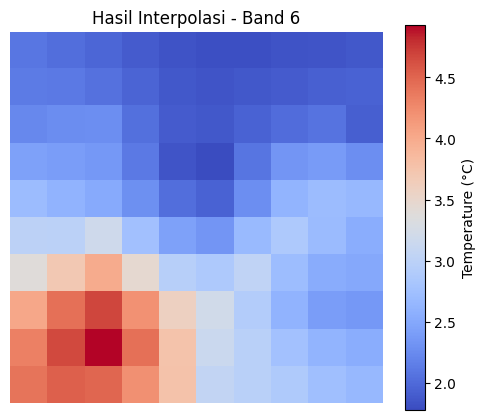

📊 Statistik Band 6 setelah interpolasi:
- Min: 1.78
- Max: 4.93
- Mean: 2.71
- Std Dev: 0.82
----------------------------------------
🔄 Memproses band ke-7...


Band 7: 100%|██████████| 36/36 [00:00<00:00, 168.34it/s]


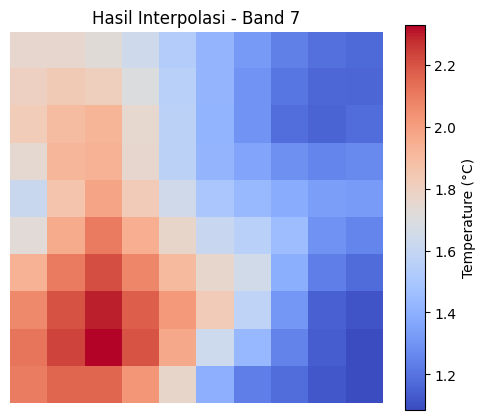

📊 Statistik Band 7 setelah interpolasi:
- Min: 1.08
- Max: 2.33
- Mean: 1.62
- Std Dev: 0.35
----------------------------------------
🔄 Memproses band ke-8...


Band 8: 100%|██████████| 36/36 [00:00<00:00, 522.17it/s]


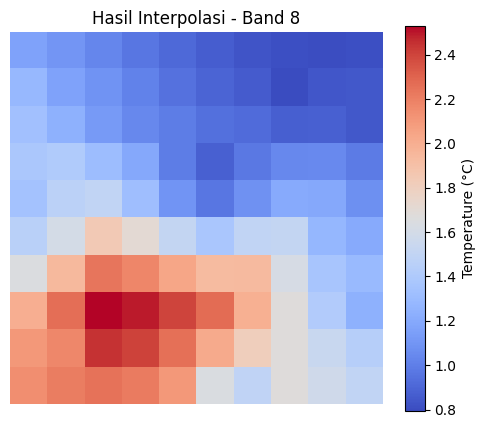

📊 Statistik Band 8 setelah interpolasi:
- Min: 0.79
- Max: 2.53
- Mean: 1.45
- Std Dev: 0.49
----------------------------------------
🔄 Memproses band ke-9...


Band 9: 100%|██████████| 36/36 [00:00<00:00, 526.21it/s]


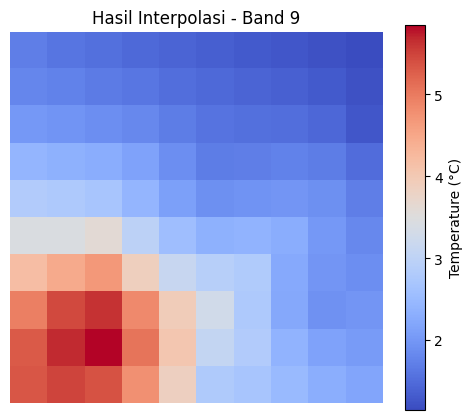

📊 Statistik Band 9 setelah interpolasi:
- Min: 1.15
- Max: 5.85
- Mean: 2.59
- Std Dev: 1.26
----------------------------------------
🔄 Memproses band ke-10...


Band 10: 100%|██████████| 36/36 [00:00<00:00, 568.61it/s]


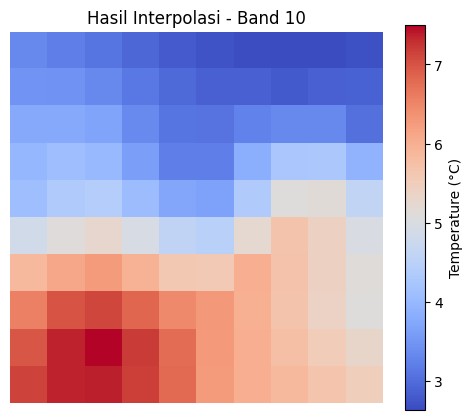

📊 Statistik Band 10 setelah interpolasi:
- Min: 2.63
- Max: 7.50
- Mean: 4.75
- Std Dev: 1.44
----------------------------------------
🔄 Memproses band ke-11...


Band 11: 100%|██████████| 36/36 [00:00<00:00, 224.91it/s]


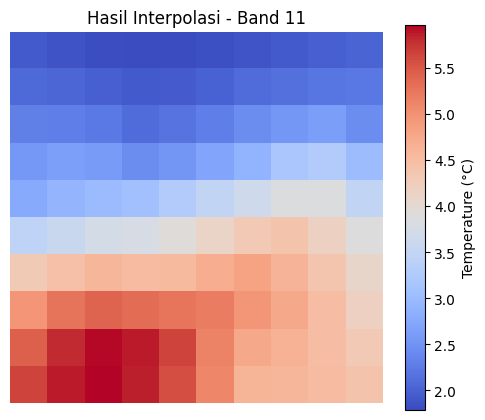

📊 Statistik Band 11 setelah interpolasi:
- Min: 1.79
- Max: 5.96
- Mean: 3.62
- Std Dev: 1.30
----------------------------------------
🔄 Memproses band ke-12...


Band 12: 100%|██████████| 36/36 [00:00<00:00, 548.28it/s]


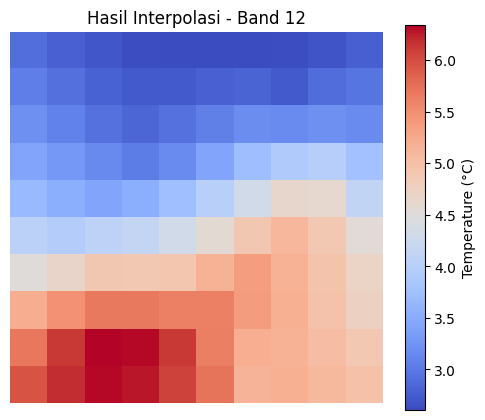

📊 Statistik Band 12 setelah interpolasi:
- Min: 2.61
- Max: 6.34
- Mean: 4.21
- Std Dev: 1.15
----------------------------------------
🔄 Memproses band ke-13...


Band 13: 100%|██████████| 36/36 [00:00<00:00, 438.84it/s]


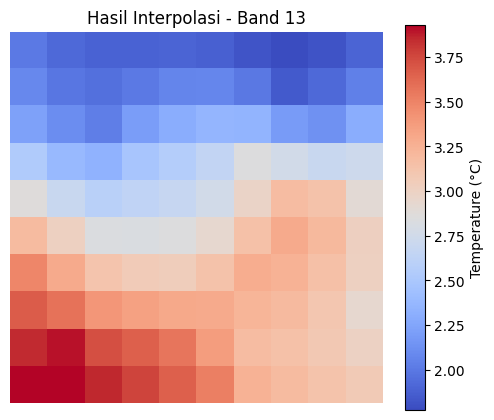

📊 Statistik Band 13 setelah interpolasi:
- Min: 1.77
- Max: 3.93
- Mean: 2.80
- Std Dev: 0.60
----------------------------------------
🔄 Memproses band ke-14...


Band 14: 100%|██████████| 36/36 [00:00<00:00, 158.30it/s]


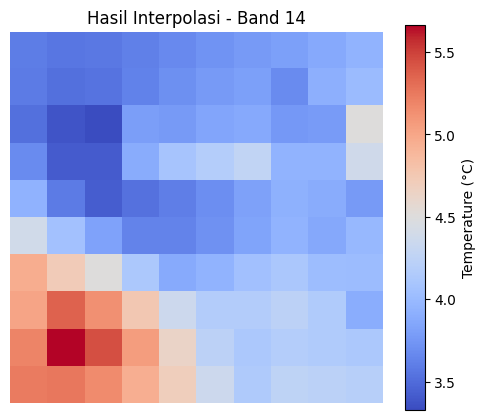

📊 Statistik Band 14 setelah interpolasi:
- Min: 3.33
- Max: 5.66
- Mean: 4.08
- Std Dev: 0.51
----------------------------------------
🔄 Memproses band ke-15...


Band 15: 100%|██████████| 36/36 [00:00<00:00, 549.21it/s]


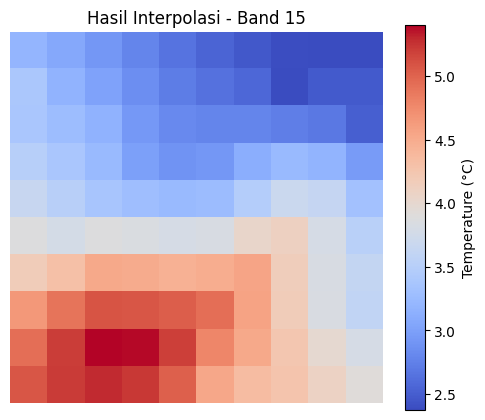

📊 Statistik Band 15 setelah interpolasi:
- Min: 2.37
- Max: 5.40
- Mean: 3.71
- Std Dev: 0.86
----------------------------------------
🔄 Memproses band ke-16...


Band 16: 100%|██████████| 36/36 [00:00<00:00, 64.12it/s]


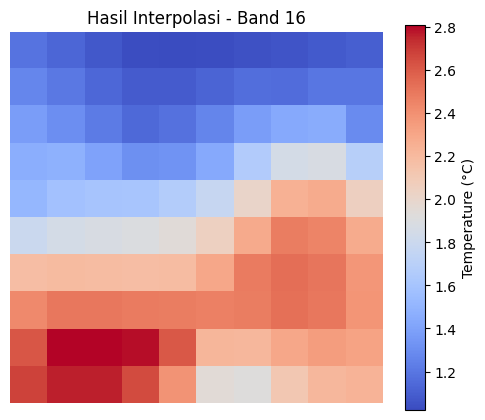

📊 Statistik Band 16 setelah interpolasi:
- Min: 1.02
- Max: 2.81
- Mean: 1.87
- Std Dev: 0.56
----------------------------------------
🔄 Memproses band ke-17...


Band 17: 100%|██████████| 36/36 [00:00<00:00, 526.20it/s]


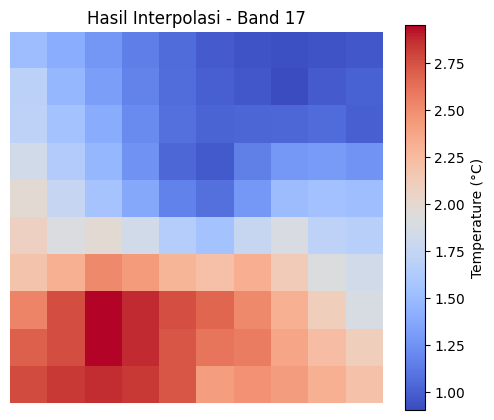

📊 Statistik Band 17 setelah interpolasi:
- Min: 0.90
- Max: 2.95
- Mean: 1.80
- Std Dev: 0.64
----------------------------------------
🔄 Memproses band ke-18...


Band 18: 100%|██████████| 36/36 [00:00<00:00, 429.69it/s]


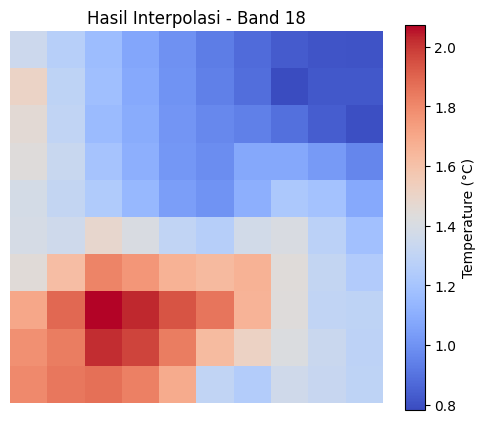

📊 Statistik Band 18 setelah interpolasi:
- Min: 0.78
- Max: 2.07
- Mean: 1.32
- Std Dev: 0.33
----------------------------------------
🔄 Memproses band ke-19...


Band 19: 100%|██████████| 36/36 [00:00<00:00, 200.59it/s]


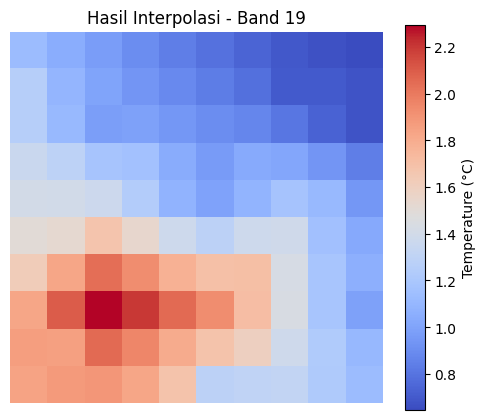

📊 Statistik Band 19 setelah interpolasi:
- Min: 0.65
- Max: 2.29
- Mean: 1.29
- Std Dev: 0.41
----------------------------------------
🔄 Memproses band ke-20...


Band 20: 100%|██████████| 36/36 [00:02<00:00, 16.41it/s]


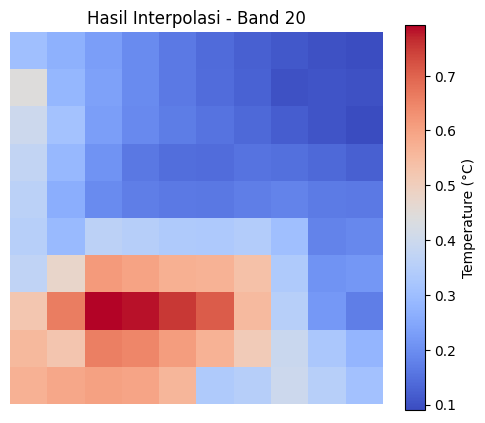

📊 Statistik Band 20 setelah interpolasi:
- Min: 0.09
- Max: 0.79
- Mean: 0.32
- Std Dev: 0.19
----------------------------------------
🔄 Memproses band ke-21...


Band 21: 100%|██████████| 36/36 [00:00<00:00, 83.34it/s]


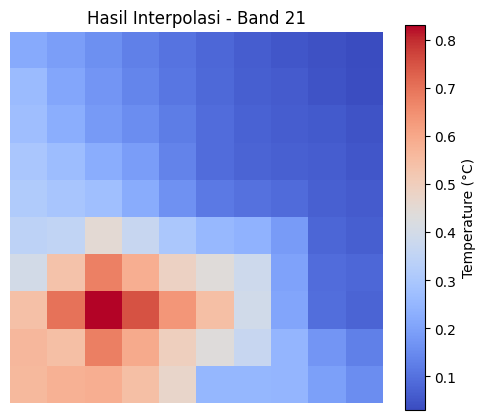

📊 Statistik Band 21 setelah interpolasi:
- Min: 0.03
- Max: 0.83
- Mean: 0.26
- Std Dev: 0.20
----------------------------------------
🔄 Memproses band ke-22...


Band 22: 100%|██████████| 36/36 [00:00<00:00, 50.18it/s]


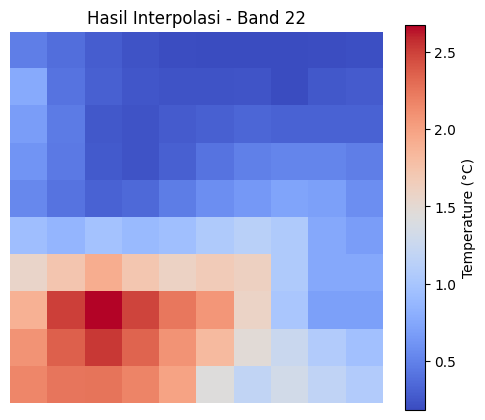

📊 Statistik Band 22 setelah interpolasi:
- Min: 0.18
- Max: 2.67
- Mean: 0.95
- Std Dev: 0.72
----------------------------------------
🔄 Memproses band ke-23...


Band 23: 100%|██████████| 36/36 [00:00<00:00, 128.30it/s]


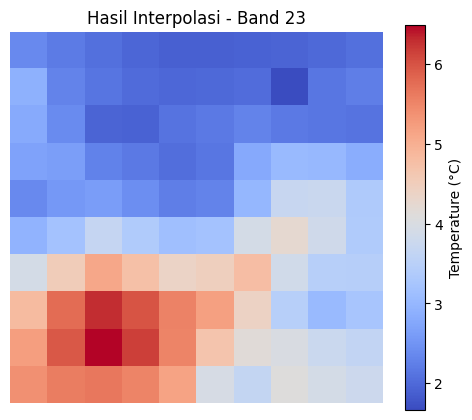

📊 Statistik Band 23 setelah interpolasi:
- Min: 1.66
- Max: 6.49
- Mean: 3.39
- Std Dev: 1.29
----------------------------------------
🔄 Memproses band ke-24...


Band 24: 100%|██████████| 36/36 [00:00<00:00, 447.26it/s]


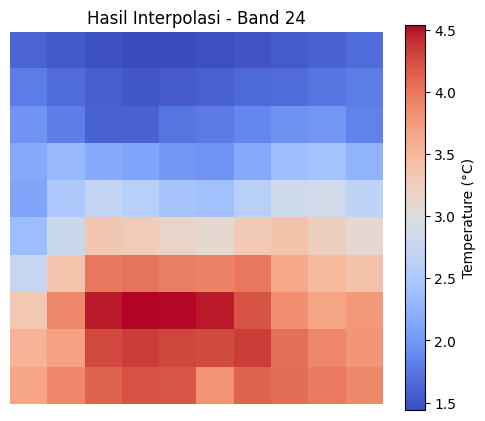

📊 Statistik Band 24 setelah interpolasi:
- Min: 1.44
- Max: 4.54
- Mean: 2.86
- Std Dev: 1.01
----------------------------------------
🔄 Memproses band ke-25...


Band 25: 100%|██████████| 36/36 [00:00<00:00, 519.76it/s]


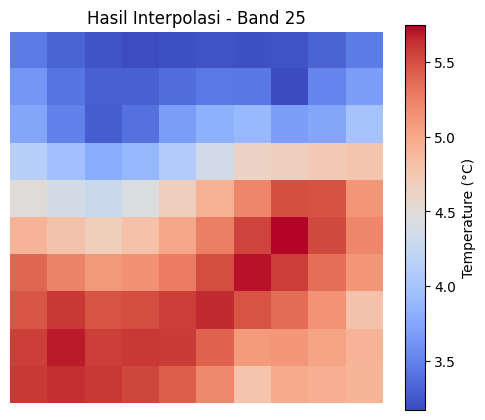

📊 Statistik Band 25 setelah interpolasi:
- Min: 3.17
- Max: 5.75
- Mean: 4.61
- Std Dev: 0.86
----------------------------------------
🔄 Memproses band ke-26...


Band 26: 100%|██████████| 36/36 [00:00<00:00, 412.36it/s]


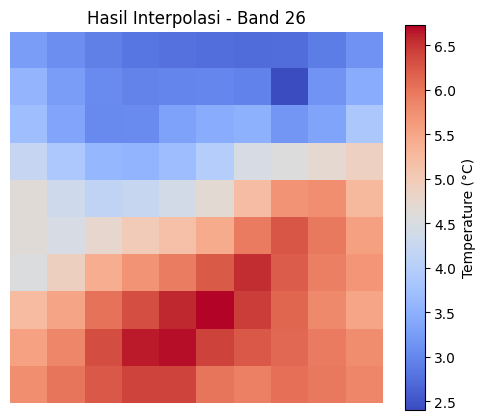

📊 Statistik Band 26 setelah interpolasi:
- Min: 2.40
- Max: 6.73
- Mean: 4.76
- Std Dev: 1.30
----------------------------------------
🔄 Memproses band ke-27...


Band 27: 100%|██████████| 36/36 [00:00<00:00, 481.80it/s]


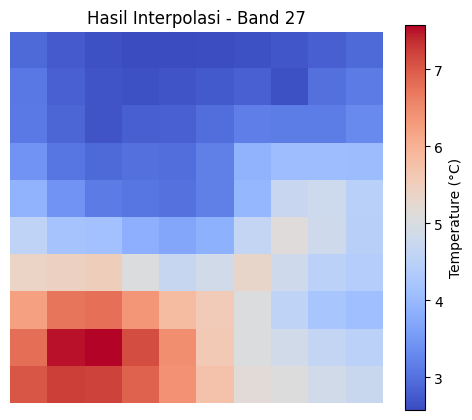

📊 Statistik Band 27 setelah interpolasi:
- Min: 2.58
- Max: 7.57
- Mean: 4.27
- Std Dev: 1.40
----------------------------------------
🔄 Memproses band ke-28...


Band 28: 100%|██████████| 36/36 [00:00<00:00, 105.12it/s]


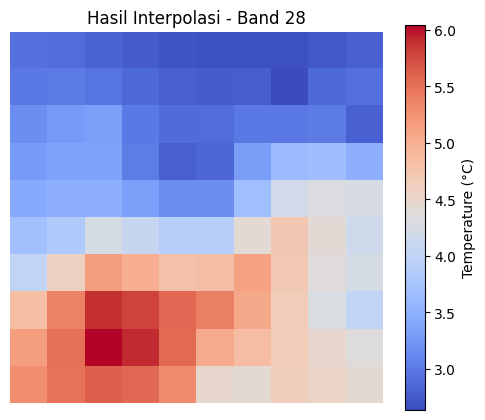

📊 Statistik Band 28 setelah interpolasi:
- Min: 2.63
- Max: 6.04
- Mean: 3.96
- Std Dev: 0.99
----------------------------------------
🔄 Memproses band ke-29...


Band 29: 100%|██████████| 36/36 [00:00<00:00, 135.89it/s]


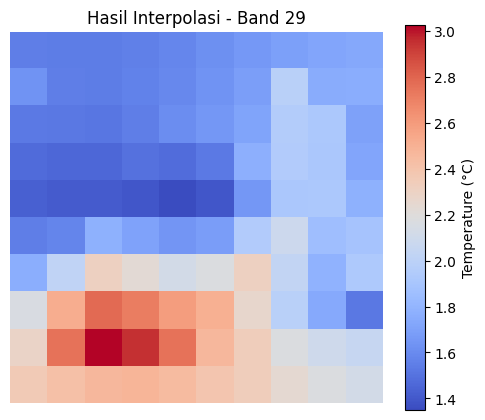

📊 Statistik Band 29 setelah interpolasi:
- Min: 1.35
- Max: 3.03
- Mean: 1.91
- Std Dev: 0.40
----------------------------------------
🔄 Memproses band ke-30...


Band 30: 100%|██████████| 36/36 [00:00<00:00, 225.74it/s]


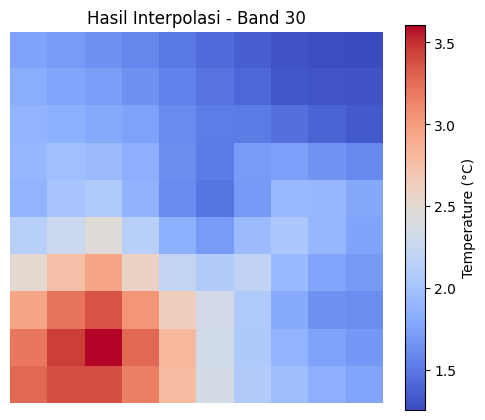

📊 Statistik Band 30 setelah interpolasi:
- Min: 1.25
- Max: 3.61
- Mean: 2.02
- Std Dev: 0.58
----------------------------------------
🔄 Memproses band ke-31...


Band 31: 100%|██████████| 36/36 [00:00<00:00, 362.85it/s]


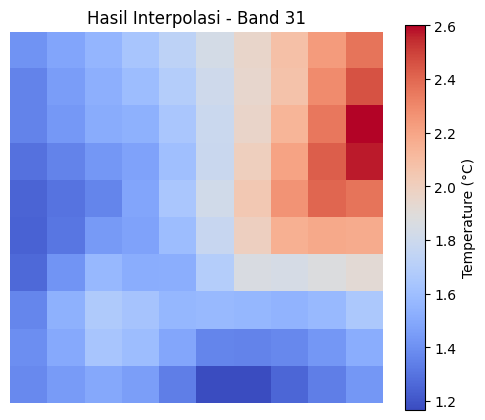

📊 Statistik Band 31 setelah interpolasi:
- Min: 1.17
- Max: 2.60
- Mean: 1.68
- Std Dev: 0.35
----------------------------------------
🔄 Memproses band ke-32...


Band 32: 100%|██████████| 36/36 [00:00<00:00, 454.99it/s]


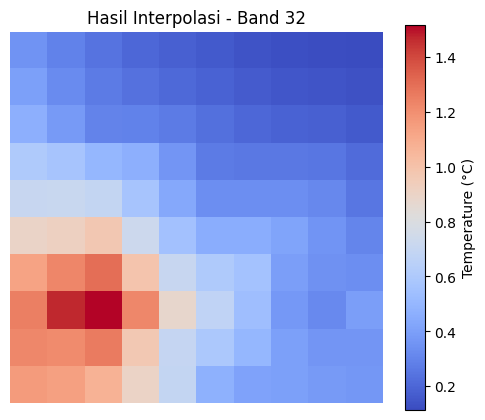

📊 Statistik Band 32 setelah interpolasi:
- Min: 0.11
- Max: 1.52
- Mean: 0.52
- Std Dev: 0.35
----------------------------------------
🔄 Memproses band ke-33...


Band 33: 100%|██████████| 36/36 [00:00<00:00, 412.86it/s]


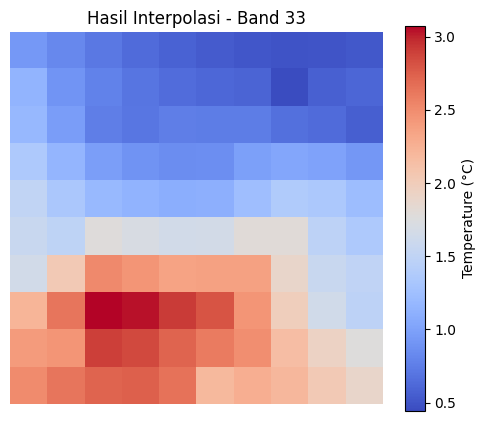

📊 Statistik Band 33 setelah interpolasi:
- Min: 0.44
- Max: 3.07
- Mean: 1.53
- Std Dev: 0.76
----------------------------------------
🔄 Memproses band ke-34...


Band 34: 100%|██████████| 36/36 [00:00<00:00, 469.89it/s]


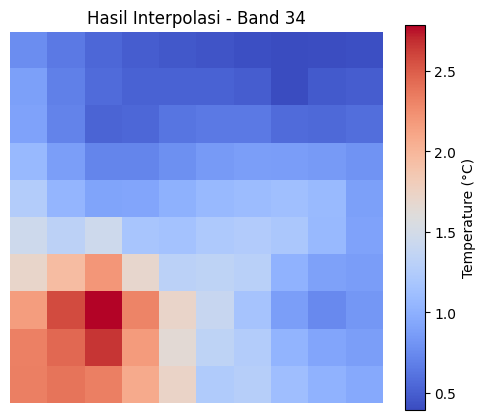

📊 Statistik Band 34 setelah interpolasi:
- Min: 0.39
- Max: 2.78
- Mean: 1.12
- Std Dev: 0.59
----------------------------------------
🔄 Memproses band ke-35...


Band 35: 100%|██████████| 36/36 [00:00<00:00, 243.32it/s]


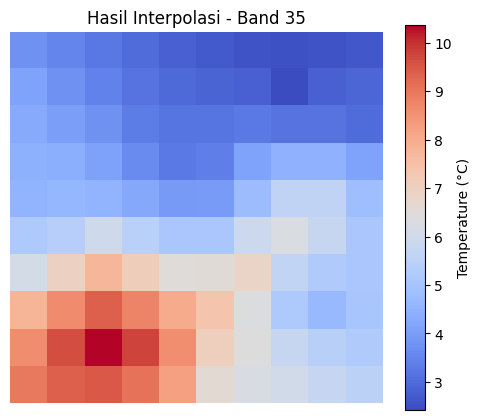

📊 Statistik Band 35 setelah interpolasi:
- Min: 2.42
- Max: 10.36
- Mean: 5.24
- Std Dev: 2.03
----------------------------------------
🔄 Memproses band ke-36...


Band 36: 100%|██████████| 36/36 [00:00<00:00, 489.61it/s]


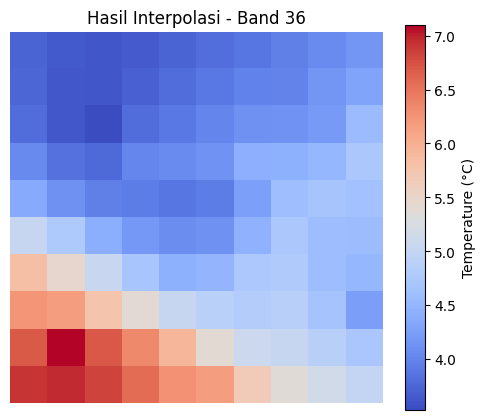

📊 Statistik Band 36 setelah interpolasi:
- Min: 3.53
- Max: 7.10
- Mean: 4.66
- Std Dev: 0.90
----------------------------------------
✅ Semua band berhasil diinterpolasi dan disimpan ke /content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/TP_EXPORT/ERA5_TP_Monthly_2022_2024_NaN_Interpolated.tif


In [ ]:
import numpy as np
import rasterio
from rasterio.plot import show
from pykrige.ok import OrdinaryKriging
from tqdm import tqdm

# ----------------------------------
# INTERPOLATE MISSING VALUE 36 BULAN
# -----------------------------------

file_path = '/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/TP_EXPORT/ERA5_TP_Monthly_2022_2024.tif'
with rasterio.open(file_path) as src:
    profile = src.profile
    transform = src.transform
    all_data = []

    for i in range(1, src.count + 1):  # Loop through 36 bands
        print(f"🔄 Memproses band ke-{i}...")
        data = src.read(i)
        rows, cols = np.where(~np.isnan(data))
        z = data[rows, cols]

        if len(z) == 0:
            print(f"⚠️ Band {i} tidak memiliki data valid. Lewat.")
            all_data.append(data)
            continue

        x_coords, y_coords = rasterio.transform.xy(transform, rows, cols)

        ok = OrdinaryKriging(
            x_coords, y_coords, z,
            variogram_model='linear',
            verbose=False,
            enable_plotting=False
        )

        nan_rows, nan_cols = np.where(np.isnan(data))
        x_nan, y_nan = rasterio.transform.xy(transform, nan_rows, nan_cols)

        z_nan = []
        for x, y in tqdm(zip(x_nan, y_nan), total=len(x_nan), desc=f'Band {i}'):
            z_, _ = ok.execute('points', x, y)
            z_nan.append(z_[0])

        z_nan = np.array(z_nan)
        data[nan_rows, nan_cols] = z_nan


        # Tampilkan visualisasi hasil interpolasi
        plt.figure(figsize=(6, 5))
        plt.imshow(data, cmap='coolwarm')
        plt.colorbar(label='Temperature (°C)')
        plt.title(f'Hasil Interpolasi - Band {i}')
        plt.axis('off')
        plt.show()

        # Statistik dasar
        print(f"📊 Statistik Band {i} setelah interpolasi:")
        print(f"- Min: {np.nanmin(data):.2f}")
        print(f"- Max: {np.nanmax(data):.2f}")
        print(f"- Mean: {np.nanmean(data):.2f}")
        print(f"- Std Dev: {np.nanstd(data):.2f}")
        print("-" * 40)

        all_data.append(data) # Fixed indentation

# Simpan semua band
output_path = file_path.replace('.tif', '_NaN_Interpolated.tif')
profile.update(count=36)

with rasterio.open(output_path, 'w', **profile) as dst:
    for i, band_data in enumerate(all_data, start=1):
        dst.write(band_data, i)

print(f"✅ Semua band berhasil diinterpolasi dan disimpan ke {output_path}")

In [ ]:
#-------------------------
# INFORMASI NAN Interpolate
#-------------------------

import rasterio
import numpy as np
import pandas as pd

# 1. Buka file TIFF
tif_path = '/content/drive/MyDrive/TP_EXPORT/ERA5_tp_Monthly_2022_2024_NaN.tif'
with rasterio.open(tif_path) as src:
    data = src.read()  # (bands, height, width)
    profile = src.profile

# 2. Siapkan list bulan (label)
start_year = 2022
start_month = 1
labels = []
for i in range(36):
    year = start_year + (start_month + i - 1) // 12
    month = (start_month + i - 1) % 12 + 1
    labels.append(f"{year:04d}-{month:02d}")

# 3. Hitung valid_ratio dan missing_ratio
valid_ratios = []
missing_ratios_percent = []

for i in range(data.shape[0]):  # untuk tiap band
    band = data[i, :, :]
    total_pixels = band.size
    valid_pixels = np.count_nonzero(~np.isnan(band))
    valid_ratio = valid_pixels / total_pixels
    missing_ratio = 1.0 - valid_ratio

    valid_ratios.append(valid_ratio)
    missing_ratios_percent.append(missing_ratio * 100)

# 4. Buat dataframe ringkasan
summary_df = pd.DataFrame({
    'label': labels,
    'valid_ratio': valid_ratios,
    'missing_ratio_percent': missing_ratios_percent
})

# 5. Tampilkan
print(summary_df)

# 6. (Opsional) Simpan ke CSV
summary_df.to_csv('/content/drive/MyDrive/TP_EXPORT/valid_missing_summary.csv', index=False)



      label  valid_ratio  missing_ratio_percent
0   2022-01          1.0                    0.0
1   2022-02          1.0                    0.0
2   2022-03          1.0                    0.0
3   2022-04          1.0                    0.0
4   2022-05          1.0                    0.0
5   2022-06          1.0                    0.0
6   2022-07          1.0                    0.0
7   2022-08          1.0                    0.0
8   2022-09          1.0                    0.0
9   2022-10          1.0                    0.0
10  2022-11          1.0                    0.0
11  2022-12          1.0                    0.0
12  2023-01          1.0                    0.0
13  2023-02          1.0                    0.0
14  2023-03          1.0                    0.0
15  2023-04          1.0                    0.0
16  2023-05          1.0                    0.0
17  2023-06          1.0                    0.0
18  2023-07          1.0                    0.0
19  2023-08          1.0                

✅ ERA5_TP_Monthly_2022_2024_NaN_Interpolated.tif - Resampled dengan NoData: nan


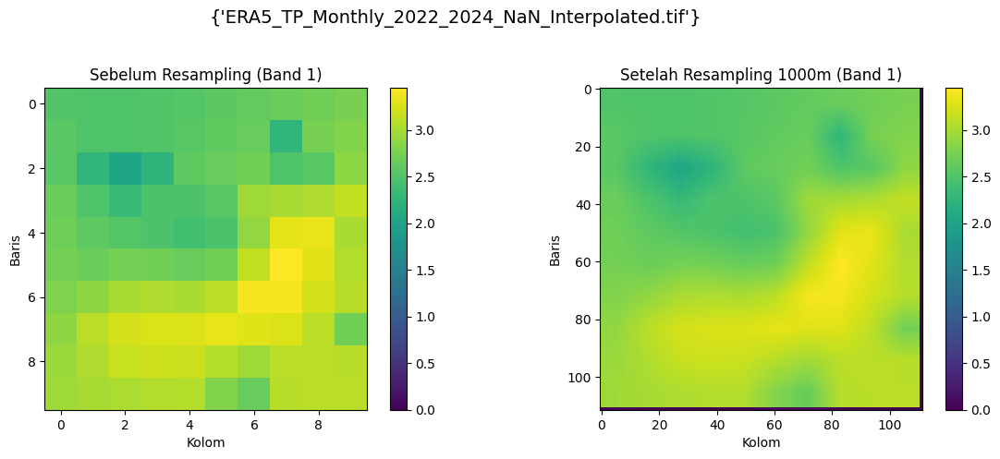

📊 Hasil evaluasi 36 band disimpan di: /content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/TP_EXPORT/DOWNSCALED/eval_all_bands.csv


In [ ]:
#-------------------
# Downscaling Multi-Band (36 Band)
#-------------------

import rasterio
from rasterio.enums import Resampling
from rasterio.warp import calculate_default_transform, reproject
import matplotlib.pyplot as plt
import numpy as np
import os
from glob import glob
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from skimage.transform import resize
import pandas as pd

# Visualisasi sebelum dan sesudah resampling untuk band pertama
def visualize_comparison(before_array, after_array, title):
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))
    cmap = 'viridis'

    # Ambil band pertama untuk visualisasi
    before_band = np.ma.masked_invalid(before_array[0])
    after_band = np.ma.masked_invalid(after_array[0])

    vmin = min(np.nanmin(before_band), np.nanmin(after_band))
    vmax = max(np.nanmax(before_band), np.nanmax(after_band))

    im1 = axs[0].imshow(before_band, cmap=cmap, vmin=vmin, vmax=vmax)
    axs[0].set_title("Sebelum Resampling (Band 1)")
    axs[0].set_xlabel("Kolom")
    axs[0].set_ylabel("Baris")
    plt.colorbar(im1, ax=axs[0], orientation="vertical", fraction=0.05)

    im2 = axs[1].imshow(after_band, cmap=cmap, vmin=vmin, vmax=vmax)
    axs[1].set_title("Setelah Resampling 1000m (Band 1)")
    axs[1].set_xlabel("Kolom")
    axs[1].set_ylabel("Baris")
    plt.colorbar(im2, ax=axs[1], orientation="vertical", fraction=0.05)

    plt.suptitle(title, fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Evaluasi statistik untuk semua band
def evaluate_stats_all_bands(before, after, filename):
    results = []
    for band_idx in range(before.shape[0]):
        before_band = before[band_idx]
        after_band = after[band_idx]

        # Resize untuk matching shape
        after_resized = resize(after_band, before_band.shape,
                             order=1, preserve_range=True,
                             anti_aliasing=False)

        mask = ~np.isnan(before_band) & ~np.isnan(after_resized)

        if np.count_nonzero(mask) == 0:
            print(f"⚠️ {filename} Band {band_idx+1} tidak dapat dievaluasi")
            continue

        y_true = before_band[mask]
        y_pred = after_resized[mask]

        mse = mean_squared_error(y_true, y_pred)
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(y_true, y_pred)
        r2 = r2_score(y_true, y_pred)

        results.append({
            "Filename": filename,
            "Band": band_idx+1,
            "RMSE": rmse,
            "MSE": mse,
            "MAE": mae,
            "R2": r2
        })

    return results

# Fungsi resampling untuk semua band
def resample_raster_to_1km_all_bands(input_path, output_path, visualize=True):
    with rasterio.open(input_path) as src:
        # Baca semua band
        src_nodata = src.nodata if src.nodata is not None else np.nan
        src_array = src.read()  # Shape: (bands, rows, cols)
        src_array = np.where(src_array == src_nodata, np.nan, src_array)
        src_transform = src.transform
        src_crs = src.crs
        src_bounds = src.bounds

        # Hitung transformasi output
        dst_transform, width, height = calculate_default_transform(
            src_crs, src_crs,
            src.width, src.height,
            *src_bounds,
            resolution=1000
        )

        # Siapkan array output
        dst_array = np.full((src.count, height, width), np.nan, dtype=src.dtypes[0])

        # Update metadata
        kwargs = src.meta.copy()
        kwargs.update({
            'driver': 'GTiff',
            'count': src.count,
            'crs': src_crs,
            'transform': dst_transform,
            'width': width,
            'height': height,
            'nodata': src_nodata
        })

        # Proses resampling per band
        with rasterio.open(output_path, 'w', **kwargs) as dst:
            dst_array = np.empty((src.count, height, width), dtype=src.dtypes[0])

            for band in range(src.count):
                reproject(
                    source=src_array[band],
                    destination=dst_array[band],
                    src_transform=src_transform,
                    src_crs=src_crs,
                    dst_transform=dst_transform,
                    dst_crs=src_crs,
                    resampling=Resampling.bilinear
                )
                dst.write(dst_array[band], band+1)

    print(f"✅ {os.path.basename(input_path)} - Resampled dengan NoData: {src_nodata}")

    if visualize:
        visualize_comparison(src_array, dst_array,
                           {os.path.basename(input_path)})

    return src_array, dst_array

# Batch Processing untuk semua file
input_folder = "/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/TP_EXPORT/NAN"
output_folder = "/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/TP_EXPORT/DOWNSCALED"
os.makedirs(output_folder, exist_ok=True)

raster_files = glob(os.path.join(input_folder, "*.tif"))
all_results = []

for raster_file in raster_files:
    filename = os.path.basename(raster_file)
    output_path = os.path.join(output_folder, f"{os.path.splitext(filename)[0]}_1km.tif")

    # Proses resampling
    before, after = resample_raster_to_1km_all_bands(raster_file, output_path)

    # Evaluasi
    stats = evaluate_stats_all_bands(before, after, filename)
    all_results.extend(stats)

# Simpan hasil evaluasi
df = pd.DataFrame(all_results)
csv_path = os.path.join(output_folder, "eval_all_bands.csv")
df.to_csv(csv_path, index=False)
print(f"📊 Hasil evaluasi 36 band disimpan di: {csv_path}")

In [ ]:
#-------------------------
# INFORMASI NAN 1KM
#-------------------------

import rasterio
import numpy as np
import pandas as pd

# 1. Buka file TIFF
tif_path = '/content/drive/MyDrive/TP_EXPORT/ERA5_tp_Monthly_2022_2024_1KM/ERA5_tp_Monthly_2022_2024_NaN_resampled.tif'
with rasterio.open(tif_path) as src:
    data = src.read()  # (bands, height, width)
    profile = src.profile

# 2. Siapkan list bulan (label)
start_year = 2022
start_month = 1
labels = []
for i in range(36):
    year = start_year + (start_month + i - 1) // 12
    month = (start_month + i - 1) % 12 + 1
    labels.append(f"{year:04d}-{month:02d}")

# 3. Hitung valid_ratio dan missing_ratio
valid_ratios = []
missing_ratios_percent = []

for i in range(data.shape[0]):  # untuk tiap band
    band = data[i, :, :]
    total_pixels = band.size
    valid_pixels = np.count_nonzero(~np.isnan(band))
    valid_ratio = valid_pixels / total_pixels
    missing_ratio = 1.0 - valid_ratio

    valid_ratios.append(valid_ratio)
    missing_ratios_percent.append(missing_ratio * 100)

# 4. Buat dataframe ringkasan
summary_df = pd.DataFrame({
    'label': labels,
    'valid_ratio': valid_ratios,
    'missing_ratio_percent': missing_ratios_percent
})

# 5. Tampilkan
print(summary_df)

      label  valid_ratio  missing_ratio_percent
0   2022-01          1.0                    0.0
1   2022-02          1.0                    0.0
2   2022-03          1.0                    0.0
3   2022-04          1.0                    0.0
4   2022-05          1.0                    0.0
5   2022-06          1.0                    0.0
6   2022-07          1.0                    0.0
7   2022-08          1.0                    0.0
8   2022-09          1.0                    0.0
9   2022-10          1.0                    0.0
10  2022-11          1.0                    0.0
11  2022-12          1.0                    0.0
12  2023-01          1.0                    0.0
13  2023-02          1.0                    0.0
14  2023-03          1.0                    0.0
15  2023-04          1.0                    0.0
16  2023-05          1.0                    0.0
17  2023-06          1.0                    0.0
18  2023-07          1.0                    0.0
19  2023-08          1.0                

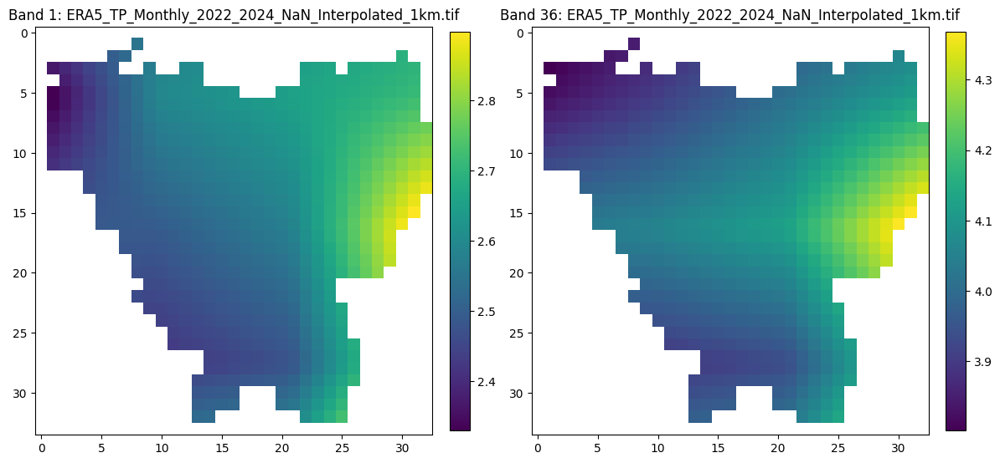

✅ Processed multiband: ERA5_TP_Monthly_2022_2024_NaN_Interpolated_1km.tif


In [ ]:
#-------------------------
# CLIP DOWNSCALED (MULTIBAND)
#-------------------------
import rasterio
from rasterio.mask import mask
import geopandas as gpd
import numpy as np
import os
from glob import glob
import matplotlib.pyplot as plt

# === 1. BACA SHAPEFILE BATAS ADMINISTRASI ===
shapefile_path = '/content/drive/MyDrive/PENGOLAHAN/DKI Jakarta/DKI Jakarta.shp'
gdf = gpd.read_file(shapefile_path)

# === 2. DAFTAR SEMUA FILE RASTER YANG MAU DIOLAH ===
input_folder = '/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/TP_EXPORT/DOWNSCALED'  # folder berisi hasil resampling
output_folder = '/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/TP_EXPORT/CLIP'
os.makedirs(output_folder, exist_ok=True)
raster_files = sorted(glob(os.path.join(input_folder, '*.tif')))

# === 3. LOOP UNTUK SETIAP FILE RASTER ===
for raster_path in raster_files:
    with rasterio.open(raster_path) as src:
        raster_data = src.read()  # ⬅️ Ambil semua band (multiband)
        raster_meta = src.meta.copy()

        # Cek dan samakan CRS shapefile
        if gdf.crs != src.crs:
            gdf = gdf.to_crs(src.crs)

        # Gunakan nilai nodata asli
        nodata_value = src.nodata

        # Crop dan mask semua band
        out_image, out_transform = mask(
            src,
            gdf.geometry,
            crop=True,
            nodata=nodata_value
        )

        # Update metadata
        out_meta = raster_meta.copy()
        out_meta.update({
            "driver": "GTiff",
            "height": out_image.shape[1],
            "width": out_image.shape[2],
            "count": out_image.shape[0],  # ⬅️ Total band
            "transform": out_transform,
            "nodata": nodata_value
        })

        # Nama file output
        filename = os.path.basename(raster_path)
        output_path = os.path.join(output_folder, f"Jakarta_{filename}")

        # Simpan hasil raster clipped
        with rasterio.open(output_path, "w", **out_meta) as dest:
            dest.write(out_image)

        # === VISUALISASI: Band 1 & terakhir ===
        fig, ax = plt.subplots(1, 2, figsize=(12, 6))
        im1 = ax[0].imshow(out_image[0], cmap='viridis')
        ax[0].set_title(f"Band 1: {filename}")
        plt.colorbar(im1, ax=ax[0], fraction=0.046, pad=0.04)

        im2 = ax[1].imshow(out_image[-1], cmap='viridis')
        ax[1].set_title(f"Band {out_image.shape[0]}: {filename}")
        plt.colorbar(im2, ax=ax[1], fraction=0.046, pad=0.04)

        plt.tight_layout()
        plt.show()

    print(f"✅ Processed multiband: {filename}")


In [ ]:
#-------------------------
# INFORMASI NAN CLIP
#-------------------------

import rasterio
import numpy as np
import pandas as pd

# 1. Buka file TIFF
tif_path = '/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/TP_EXPORT/CLIP/Jakarta_ERA5_tp_Monthly_2022_2024_NaN_Interpolated_1km.tif'
with rasterio.open(tif_path) as src:
    data = src.read()  # (bands, height, width)
    profile = src.profile

# 2. Siapkan list bulan (label)
start_year = 2022
start_month = 1
labels = []
for i in range(36):
    year = start_year + (start_month + i - 1) // 12
    month = (start_month + i - 1) % 12 + 1
    labels.append(f"{year:04d}-{month:02d}")

# 3. Hitung valid_ratio dan missing_ratio
valid_ratios = []
missing_ratios_percent = []

for i in range(data.shape[0]):  # untuk tiap band
    band = data[i, :, :]
    total_pixels = band.size
    valid_pixels = np.count_nonzero(~np.isnan(band))
    valid_ratio = valid_pixels / total_pixels
    missing_ratio = 1.0 - valid_ratio

    valid_ratios.append(valid_ratio)
    missing_ratios_percent.append(missing_ratio * 100)

# 4. Buat dataframe ringkasan
summary_df = pd.DataFrame({
    'label': labels,
    'valid_ratio': valid_ratios,
    'missing_ratio_percent': missing_ratios_percent
})

# 5. Tampilkan
print(summary_df)

      label  valid_ratio  missing_ratio_percent
0   2022-01     0.581105              41.889483
1   2022-02     0.581105              41.889483
2   2022-03     0.581105              41.889483
3   2022-04     0.581105              41.889483
4   2022-05     0.581105              41.889483
5   2022-06     0.581105              41.889483
6   2022-07     0.581105              41.889483
7   2022-08     0.581105              41.889483
8   2022-09     0.581105              41.889483
9   2022-10     0.581105              41.889483
10  2022-11     0.581105              41.889483
11  2022-12     0.581105              41.889483
12  2023-01     0.581105              41.889483
13  2023-02     0.581105              41.889483
14  2023-03     0.581105              41.889483
15  2023-04     0.581105              41.889483
16  2023-05     0.581105              41.889483
17  2023-06     0.581105              41.889483
18  2023-07     0.581105              41.889483
19  2023-08     0.581105              41

# GEE Version Total Evaporation

In [ ]:
#-------------------
# PENGUNDUHAN
#-------------------

import ee
import geemap

# Inisialisasi Earth Engine
ee.Authenticate()
ee.Initialize(project='ee-sidangapril2024')

# Definisikan Area of Interest (AOI)
AOI = ee.FeatureCollection("projects/ee-sidangapril2024/assets/JABODETABEK")

# Koleksi ERA5-Land hourly
era5_collection = ee.ImageCollection('ECMWF/ERA5_LAND/HOURLY')

# Rentang waktu: Januari 2022 - Desember 2024 (sesuaikan jika perlu)
start_date = ee.Date('2022-01-01')
end_date = ee.Date('2024-12-31')

# Buat list bulan
months = ee.List.sequence(0, end_date.difference(start_date, 'month'))

# Fungsi untuk menghitung rata-rata bulanan
def calculate_monthly_mean(month_offset):
    start = start_date.advance(month_offset, 'month')
    end = start.advance(1, 'month')
    year_month = start.format('YYYY-MM')
    filtered_collection = era5_collection.filterDate(start, end)
    total_evaporation = filtered_collection.select('total_evaporation') \
        .mean() \
        .clip(AOI) \
        .rename([year_month]) \
        .set('system:time_start', start.millis())
    return total_evaporation

# Hitung rata-rata bulanan untuk setiap bulan
monthly_means = months.map(calculate_monthly_mean)
multi_band_image = ee.ImageCollection(monthly_means).toBands()

# Gabungkan menjadi ImageCollection
monthly_collection = ee.ImageCollection(monthly_means)

# Visualisasi (contoh untuk bulan pertama)
first_month_mean = monthly_collection.first()
vis_params = {
    'min': 20,
    'max': 35,
    'palette': ['blue', 'green', 'yellow', 'red']
}

Map = geemap.Map()
Map.centerObject(AOI, 8)
Map.addLayer(first_month_mean, vis_params, 'total evaporation')
Map.addLayer(AOI, {}, 'AOI')
Map

Map(center=[-6.375912206265441, 106.80576119247223], controls=(WidgetControl(options=['position', 'transparent…

In [ ]:
#-------------------
# PENYIMPANAN
#-------------------

# Export ke Google Drive
task = ee.batch.Export.image.toDrive(
    image=multi_band_image,
    description='monthly_evaporation',
        folder='E_EXPORT',
    fileNamePrefix='ERA5_e_Monthly_2022_2024',
    region=AOI.geometry(),
    scale=11132,  # skala asli ERA5-Land
    crs='EPSG:32748',
    maxPixels=1e13
)
task.start()

✅ Informasi Umum
- CRS: EPSG:32748
- Resolusi (meter): (11132.0, 11132.0)
- Ukuran raster: 10 x 10
- Jumlah band: 36
- Bounds: BoundingBox(left=645656.0, bottom=9239560.0, right=756976.0, top=9350880.0)

📦 Statistik per band:
 Band 1: min=-0.00, max=-0.00, mean=-0.00
 Band 2: min=-0.00, max=-0.00, mean=-0.00
 Band 3: min=-0.00, max=-0.00, mean=-0.00
 Band 4: min=-0.00, max=-0.00, mean=-0.00
 Band 5: min=-0.00, max=-0.00, mean=-0.00
 Band 6: min=-0.00, max=-0.00, mean=-0.00
 Band 7: min=-0.00, max=-0.00, mean=-0.00
 Band 8: min=-0.00, max=-0.00, mean=-0.00
 Band 9: min=-0.00, max=-0.00, mean=-0.00
 Band 10: min=-0.00, max=-0.00, mean=-0.00
 Band 11: min=-0.00, max=-0.00, mean=-0.00
 Band 12: min=-0.00, max=-0.00, mean=-0.00
 Band 13: min=-0.00, max=-0.00, mean=-0.00
 Band 14: min=-0.00, max=-0.00, mean=-0.00
 Band 15: min=-0.00, max=-0.00, mean=-0.00
 Band 16: min=-0.00, max=-0.00, mean=-0.00
 Band 17: min=-0.00, max=-0.00, mean=-0.00
 Band 18: min=-0.00, max=-0.00, mean=-0.00
 Band 19:

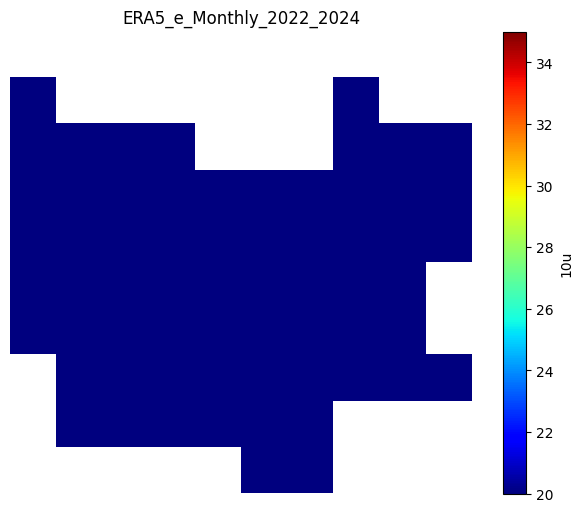

In [ ]:
#-------------------
# MELIHAT INFORMASI
#-------------------

import rasterio
from rasterio.plot import show
import os
import numpy as np

# Buka file multiband
file_path = '/content/drive/MyDrive/E_EXPORT/ERA5_e_Monthly_2022_2024.tif'
with rasterio.open(file_path) as src:
    print("✅ Informasi Umum")
    print(f"- CRS: {src.crs}")
    print(f"- Resolusi (meter): {src.res}")
    print(f"- Ukuran raster: {src.width} x {src.height}")
    print(f"- Jumlah band: {src.count}")
    print(f"- Bounds: {src.bounds}")

    print("\n📦 Statistik per band:")
    for i in range(1, src.count + 1):
        band = src.read(i)
        band_name = f"Band {i}"  # Atau bisa pakai nama dari metadata jika tersedia
        print(f" {band_name}: min={np.nanmin(band):.2f}, max={np.nanmax(band):.2f}, mean={np.nanmean(band):.2f}")

    print("\n📝 Metadata tambahan (jika ada):")
    print(src.tags())


#----------------------
# MELIHAT VISUALISASI
#----------------------

import os
import glob
import rasterio
import matplotlib.pyplot as plt

# Path folder hasil ekspor
folder_path = '/content/drive/MyDrive/E_EXPORT'  # Ganti dengan folder lokal kamu

# Cari semua file .tif di folder
tif_files = sorted(glob.glob(os.path.join(folder_path, '*.tif')))

print(f"Jumlah file ditemukan: {len(tif_files)}")

# Loop dan tampilkan
for tif_file in tif_files:
    with rasterio.open(tif_file) as src:
        image = src.read(1)  # baca band 1
        profile = src.profile

    plt.figure(figsize=(8, 6))
    plt.imshow(image, cmap='jet', vmin=20, vmax=35)  # vmin & vmax bisa disesuaikan
    plt.colorbar(label='10u')
    plt.title(os.path.basename(tif_file).replace('.tif', ''))
    plt.axis('off')
    plt.show()



In [ ]:
#-----------------------------------
# CEK EPSG, DIMENSI RASTER, RESOLUSI
#-----------------------------------

# 1. DATA ORIGINAL-----------------------------------------------------------------------------------
import rasterio

with rasterio.open('/content/drive/MyDrive/E_EXPORT/ERA5_e_Monthly_2022_2024.tif') as src:
    crs = src.crs  # Mendapatkan sistem koordinat (CRS)
    print(crs)

# Path ke file TIFF
tif_path = '/content/drive/MyDrive/E_EXPORT/ERA5_e_Monthly_2022_2024.tif'  # Ganti dengan path file TIFF kamu
with rasterio.open(tif_path) as src:
    src_data = src.read(1)  # Baca band pertama
    src_shape = src_data.shape

    print("Dimensi Data Raster (src_shape):", src_shape)

# Buka file TIFF
with rasterio.open(tif_path) as src:
    # Dapatkan resolusi spasial (skala)
    resolution_x = src.res[0]  # Resolusi dalam arah x (horizontal)
    resolution_y = src.res[1]  # Resolusi dalam arah y (vertikal)

    print(f"Resolusi X (lebar piksel): {resolution_x}")
    print(f"Resolusi Y (tinggi piksel): {resolution_y}")

# 2. DATA DOWNSCALED----------------------------------------------------------------------------------
import rasterio
with rasterio.open('/content/drive/MyDrive/T2M_EXPORT/T2M_Reprojected_UTM.tif') as src:
    crs = src.crs  # Mendapatkan sistem koordinat (CRS)
    print(crs)

# Path ke file TIFF
tif_path = '/content/drive/MyDrive/T2M_EXPORT/ERA5_T2M_Downscaled_1000m.tif'  # Ganti dengan path file TIFF kamu
with rasterio.open(tif_path) as src:
    src_data = src.read(1)  # Baca band pertama
    src_shape = src_data.shape

    print("Dimensi Data Raster (src_shape):", src_shape)

# Buka file TIFF
with rasterio.open(tif_path) as src:
    # Dapatkan resolusi spasial (skala)
    resolution_x = src.res[0]  # Resolusi dalam arah x (horizontal)
    resolution_y = src.res[1]  # Resolusi dalam arah y (vertikal)

    print(f"Resolusi X (lebar piksel): {resolution_x}")
    print(f"Resolusi Y (tinggi piksel): {resolution_y}")



EPSG:32748
Dimensi Data Raster (src_shape): (10, 10)
Resolusi X (lebar piksel): 11132.0
Resolusi Y (tinggi piksel): 11132.0
EPSG:32748
Dimensi Data Raster (src_shape): (111, 111)
Resolusi X (lebar piksel): 1000.0
Resolusi Y (tinggi piksel): 1000.0


Jumlah file ditemukan: 1


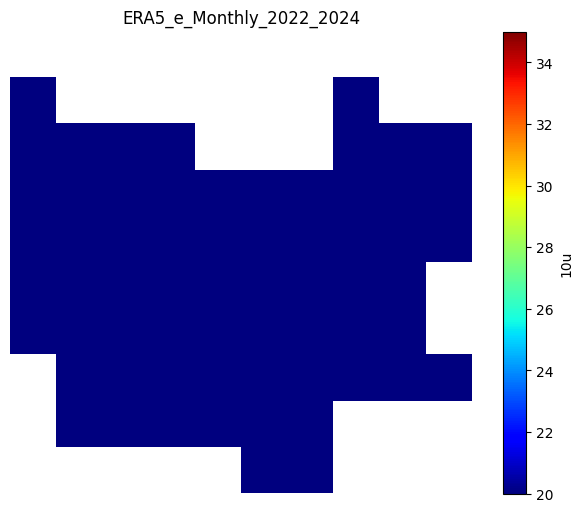

In [ ]:
#----------------------
# MELIHAT VISUALISASI
#----------------------

import os
import glob
import rasterio
import matplotlib.pyplot as plt

# Path folder hasil ekspor
folder_path = '/content/drive/MyDrive/E_EXPORT'  # Ganti dengan folder lokal kamu

# Cari semua file .tif di folder
tif_files = sorted(glob.glob(os.path.join(folder_path, '*.tif')))

print(f"Jumlah file ditemukan: {len(tif_files)}")

# Loop dan tampilkan
for tif_file in tif_files:
    with rasterio.open(tif_file) as src:
        image = src.read(1)  # baca band 1
        profile = src.profile

    plt.figure(figsize=(8, 6))
    plt.imshow(image, cmap='jet', vmin=20, vmax=35)  # vmin & vmax bisa disesuaikan
    plt.colorbar(label='10u')
    plt.title(os.path.basename(tif_file).replace('.tif', ''))
    plt.axis('off')
    plt.show()


In [ ]:
#-------------------
# INFORMASI MISSING
#-------------------

# Step 1: Tambahkan label (YYYY-MM) dan valid_ratio ke setiap image

def add_valid_ratio(image):
    band_name = 'e'  # Ganti dengan nama band yang sesuai, 'e' untuk total evaporation

    # Mask menunjukkan piksel valid
    mask = image.mask().gt(0)

    # Hitung luas area valid (m²)
    valid_area_image = mask.multiply(ee.Image.pixelArea())
    area_stats = valid_area_image.reduceRegion(
        reducer=ee.Reducer.sum(),
        geometry=AOI.geometry(),  # jika AOI berupa FeatureCollection
        scale=11132,  # Skala asli ERA5-Land (sekitar 11131 meter) #perubahan disini
        maxPixels=1e13
    )

    # Luas valid & total AOI
    valid_area = ee.Number(area_stats.get(band_name))
    total_area = AOI.geometry().area()

    # Rasio valid dan missing
    valid_ratio = valid_area.divide(total_area)
    missing_ratio = ee.Number(1.0).subtract(valid_ratio)

    # Tambahkan ke metadata image
    image = image.set('valid_ratio', valid_ratio)
    image = image.set('missing_ratio', missing_ratio)  # missing ratio as a number (0-1)
    image = image.set('missing_ratio_percent', missing_ratio.multiply(100))  # missing ratio as percentage
    return image


def calculate_monthly_mean_with_ratio(month_offset):
    start = start_date.advance(month_offset, 'month')
    end = start.advance(1, 'month')
    label = start.format('YYYY-MM')

    filtered = era5_collection.filterDate(start, end)
    monthly_mean = filtered.select('total_evaporation') \
        .mean() \
        .clip(AOI) \
        .rename('e') \
        .set('label', label)

    # Tambahkan valid_ratio dan missing_ratio
    return add_valid_ratio(monthly_mean)

# Step 2: Buat koleksi dengan rasio valid
monthly_collection = ee.ImageCollection(months.map(calculate_monthly_mean_with_ratio))

# Step 3: Konversi ke FeatureCollection untuk ringkasan
def image_to_feature(image):
    return ee.Feature(None, {
        'label': image.get('label'),
        'valid_ratio': image.get('valid_ratio'),
        'missing_ratio_percent': image.get('missing_ratio'),
    })

missing_ratio_fc = monthly_collection.map(image_to_feature)

# Step 4: Cetak hasil
print(missing_ratio_fc.aggregate_array('label').getInfo())
print(missing_ratio_fc.aggregate_array('missing_ratio_percent').getInfo())

['2022-01', '2022-02', '2022-03', '2022-04', '2022-05', '2022-06', '2022-07', '2022-08', '2022-09', '2022-10', '2022-11', '2022-12', '2023-01', '2023-02', '2023-03', '2023-04', '2023-05', '2023-06', '2023-07', '2023-08', '2023-09', '2023-10', '2023-11', '2023-12', '2024-01', '2024-02', '2024-03', '2024-04', '2024-05', '2024-06', '2024-07', '2024-08', '2024-09', '2024-10', '2024-11', '2024-12']
[0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.110107799419

🔄 Memproses band ke-1...


Band 1: 100%|██████████| 36/36 [00:00<00:00, 538.91it/s]


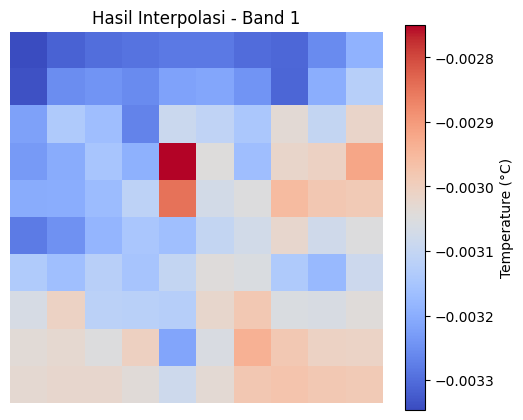

📊 Statistik Band 1 setelah interpolasi:
- Min: -0.00
- Max: -0.00
- Mean: -0.00
- Std Dev: 0.00
----------------------------------------
🔄 Memproses band ke-2...


Band 2: 100%|██████████| 36/36 [00:00<00:00, 772.10it/s]


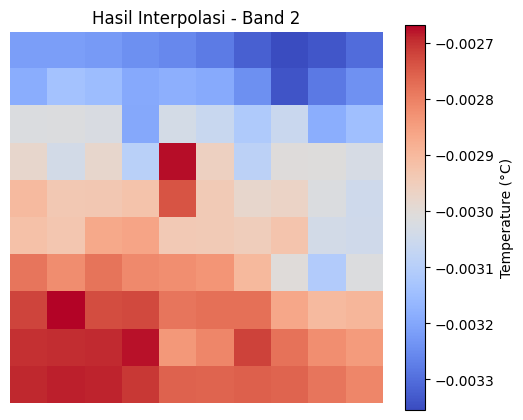

📊 Statistik Band 2 setelah interpolasi:
- Min: -0.00
- Max: -0.00
- Mean: -0.00
- Std Dev: 0.00
----------------------------------------
🔄 Memproses band ke-3...


Band 3: 100%|██████████| 36/36 [00:00<00:00, 694.17it/s]


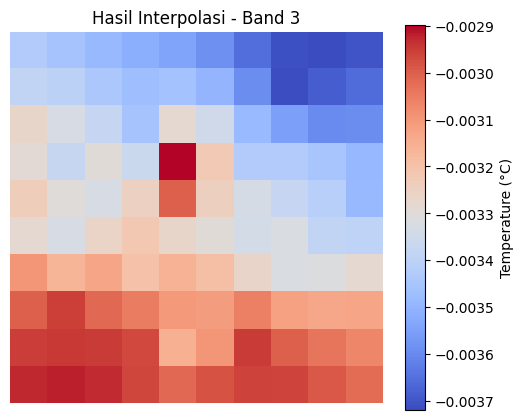

📊 Statistik Band 3 setelah interpolasi:
- Min: -0.00
- Max: -0.00
- Mean: -0.00
- Std Dev: 0.00
----------------------------------------
🔄 Memproses band ke-4...


Band 4: 100%|██████████| 36/36 [00:00<00:00, 433.06it/s]


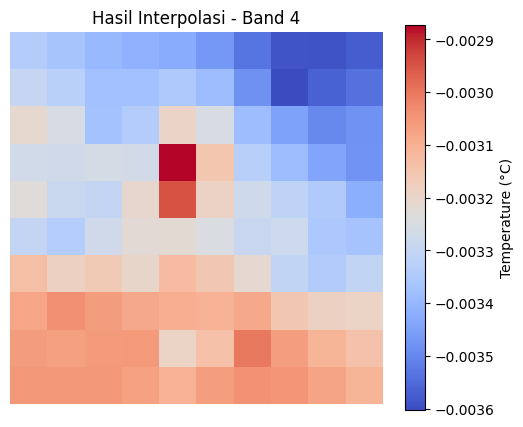

📊 Statistik Band 4 setelah interpolasi:
- Min: -0.00
- Max: -0.00
- Mean: -0.00
- Std Dev: 0.00
----------------------------------------
🔄 Memproses band ke-5...


Band 5: 100%|██████████| 36/36 [00:00<00:00, 741.40it/s]


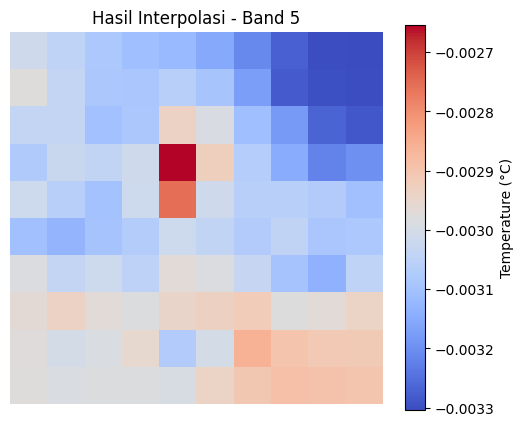

📊 Statistik Band 5 setelah interpolasi:
- Min: -0.00
- Max: -0.00
- Mean: -0.00
- Std Dev: 0.00
----------------------------------------
🔄 Memproses band ke-6...


Band 6: 100%|██████████| 36/36 [00:00<00:00, 805.69it/s]


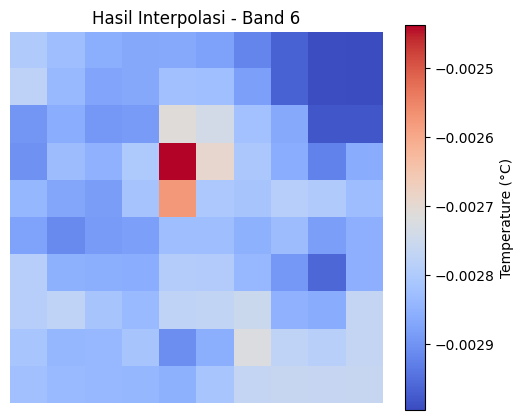

📊 Statistik Band 6 setelah interpolasi:
- Min: -0.00
- Max: -0.00
- Mean: -0.00
- Std Dev: 0.00
----------------------------------------
🔄 Memproses band ke-7...


Band 7: 100%|██████████| 36/36 [00:00<00:00, 736.05it/s]


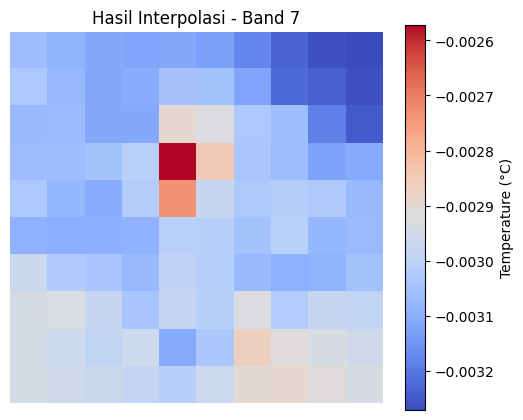

📊 Statistik Band 7 setelah interpolasi:
- Min: -0.00
- Max: -0.00
- Mean: -0.00
- Std Dev: 0.00
----------------------------------------
🔄 Memproses band ke-8...


Band 8: 100%|██████████| 36/36 [00:00<00:00, 629.67it/s]


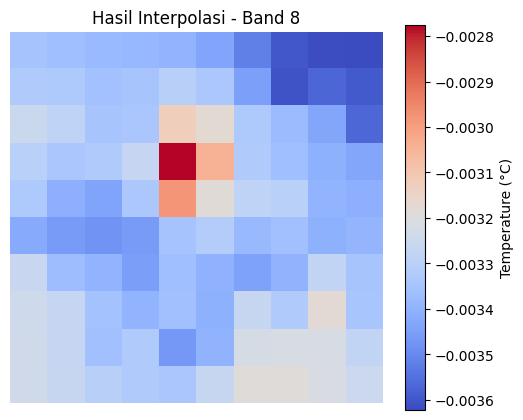

📊 Statistik Band 8 setelah interpolasi:
- Min: -0.00
- Max: -0.00
- Mean: -0.00
- Std Dev: 0.00
----------------------------------------
🔄 Memproses band ke-9...


Band 9: 100%|██████████| 36/36 [00:00<00:00, 677.15it/s]


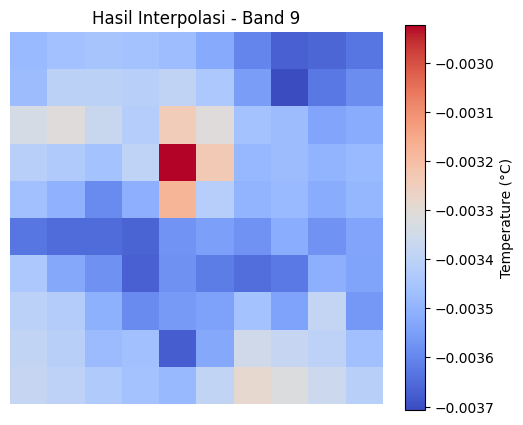

📊 Statistik Band 9 setelah interpolasi:
- Min: -0.00
- Max: -0.00
- Mean: -0.00
- Std Dev: 0.00
----------------------------------------
🔄 Memproses band ke-10...


Band 10: 100%|██████████| 36/36 [00:00<00:00, 558.12it/s]


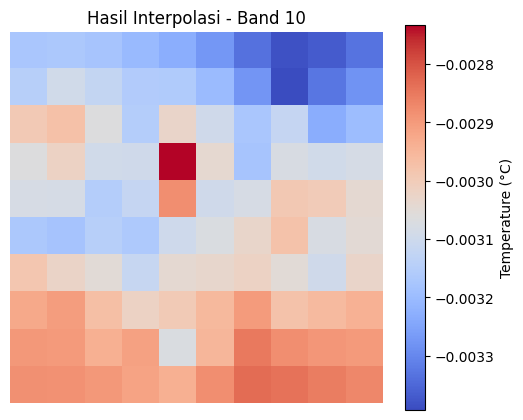

📊 Statistik Band 10 setelah interpolasi:
- Min: -0.00
- Max: -0.00
- Mean: -0.00
- Std Dev: 0.00
----------------------------------------
🔄 Memproses band ke-11...


Band 11: 100%|██████████| 36/36 [00:00<00:00, 508.99it/s]


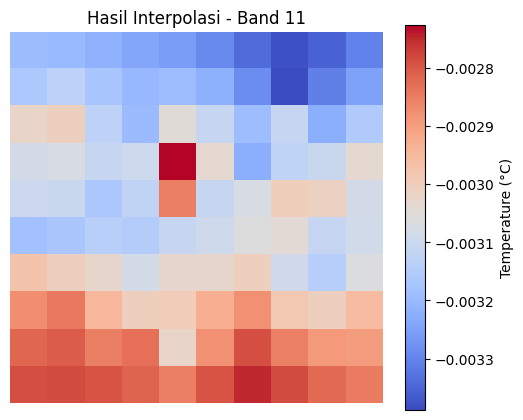

📊 Statistik Band 11 setelah interpolasi:
- Min: -0.00
- Max: -0.00
- Mean: -0.00
- Std Dev: 0.00
----------------------------------------
🔄 Memproses band ke-12...


Band 12: 100%|██████████| 36/36 [00:00<00:00, 608.94it/s]


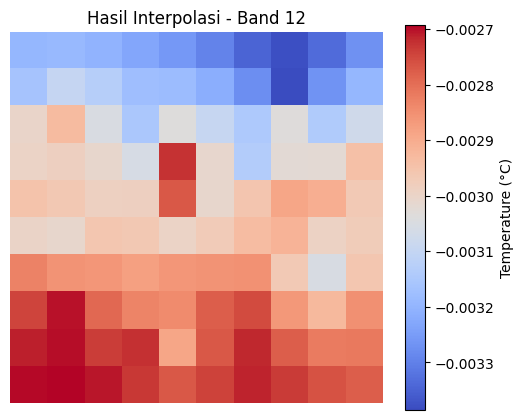

📊 Statistik Band 12 setelah interpolasi:
- Min: -0.00
- Max: -0.00
- Mean: -0.00
- Std Dev: 0.00
----------------------------------------
🔄 Memproses band ke-13...


Band 13: 100%|██████████| 36/36 [00:00<00:00, 485.97it/s]


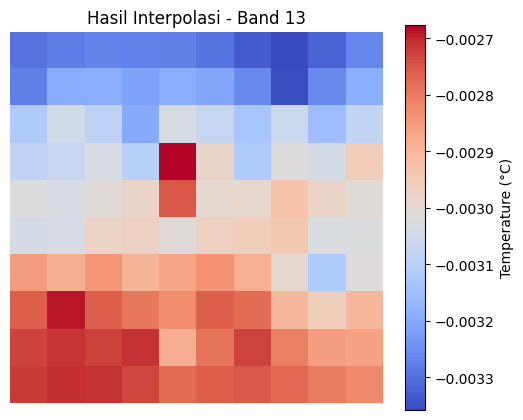

📊 Statistik Band 13 setelah interpolasi:
- Min: -0.00
- Max: -0.00
- Mean: -0.00
- Std Dev: 0.00
----------------------------------------
🔄 Memproses band ke-14...


Band 14: 100%|██████████| 36/36 [00:00<00:00, 570.10it/s]


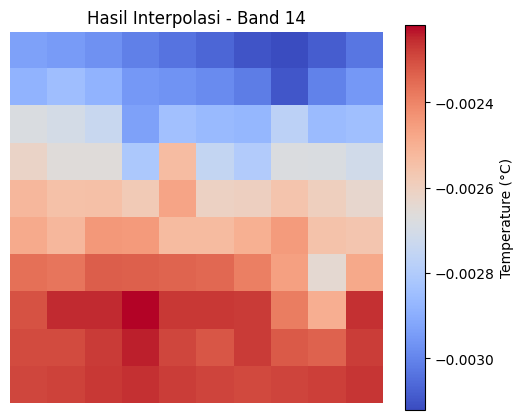

📊 Statistik Band 14 setelah interpolasi:
- Min: -0.00
- Max: -0.00
- Mean: -0.00
- Std Dev: 0.00
----------------------------------------
🔄 Memproses band ke-15...


Band 15: 100%|██████████| 36/36 [00:00<00:00, 489.17it/s]


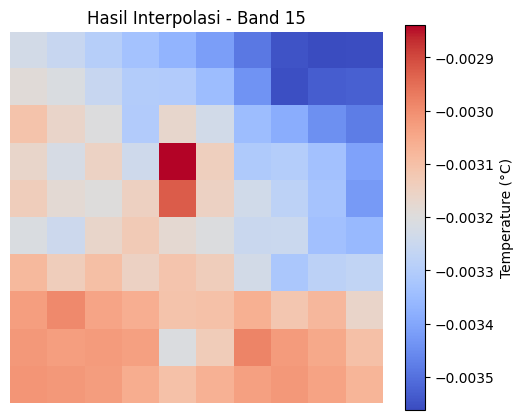

📊 Statistik Band 15 setelah interpolasi:
- Min: -0.00
- Max: -0.00
- Mean: -0.00
- Std Dev: 0.00
----------------------------------------
🔄 Memproses band ke-16...


Band 16: 100%|██████████| 36/36 [00:00<00:00, 458.82it/s]


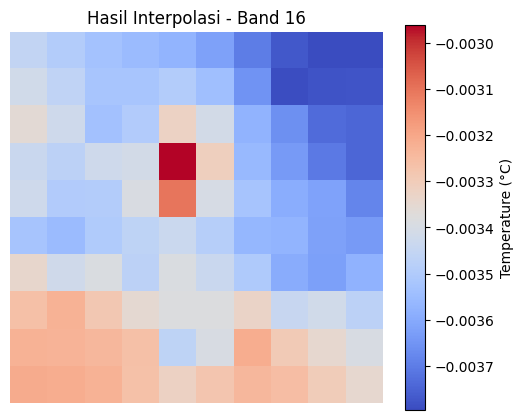

📊 Statistik Band 16 setelah interpolasi:
- Min: -0.00
- Max: -0.00
- Mean: -0.00
- Std Dev: 0.00
----------------------------------------
🔄 Memproses band ke-17...


Band 17: 100%|██████████| 36/36 [00:00<00:00, 527.15it/s]


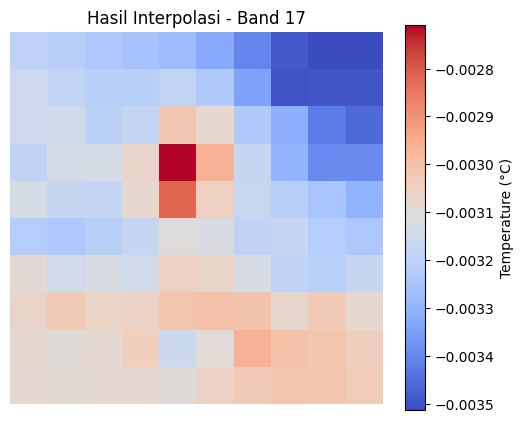

📊 Statistik Band 17 setelah interpolasi:
- Min: -0.00
- Max: -0.00
- Mean: -0.00
- Std Dev: 0.00
----------------------------------------
🔄 Memproses band ke-18...


Band 18: 100%|██████████| 36/36 [00:00<00:00, 477.95it/s]


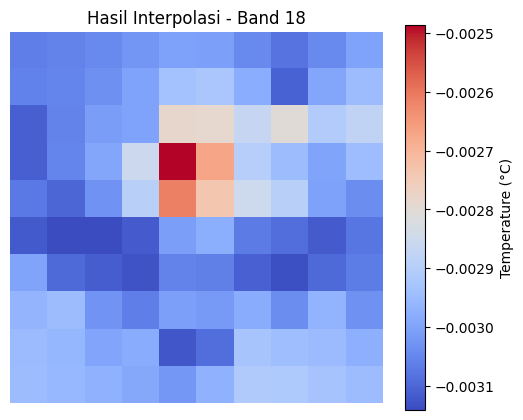

📊 Statistik Band 18 setelah interpolasi:
- Min: -0.00
- Max: -0.00
- Mean: -0.00
- Std Dev: 0.00
----------------------------------------
🔄 Memproses band ke-19...


Band 19: 100%|██████████| 36/36 [00:00<00:00, 452.63it/s]


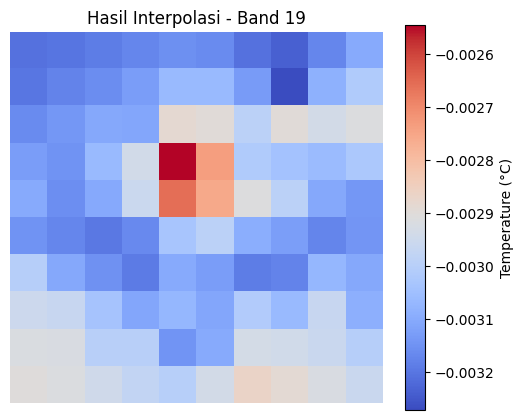

📊 Statistik Band 19 setelah interpolasi:
- Min: -0.00
- Max: -0.00
- Mean: -0.00
- Std Dev: 0.00
----------------------------------------
🔄 Memproses band ke-20...


Band 20: 100%|██████████| 36/36 [00:00<00:00, 414.47it/s]


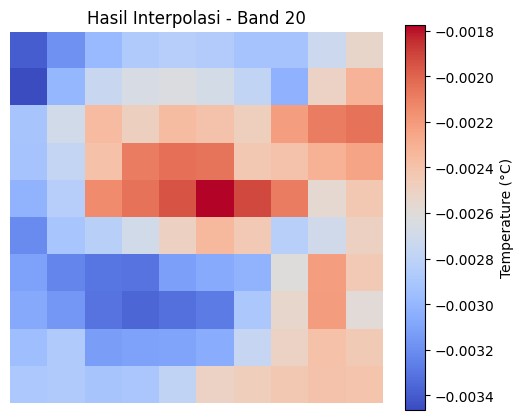

📊 Statistik Band 20 setelah interpolasi:
- Min: -0.00
- Max: -0.00
- Mean: -0.00
- Std Dev: 0.00
----------------------------------------
🔄 Memproses band ke-21...


Band 21: 100%|██████████| 36/36 [00:00<00:00, 427.87it/s]


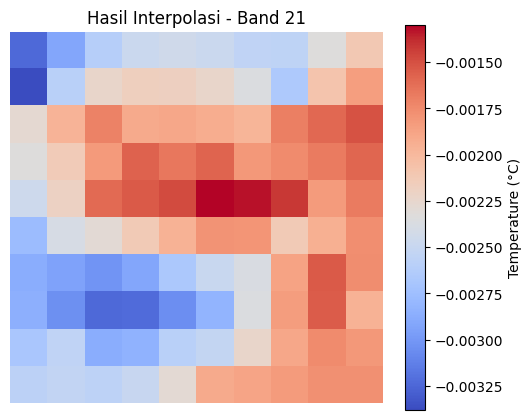

📊 Statistik Band 21 setelah interpolasi:
- Min: -0.00
- Max: -0.00
- Mean: -0.00
- Std Dev: 0.00
----------------------------------------
🔄 Memproses band ke-22...


Band 22: 100%|██████████| 36/36 [00:00<00:00, 457.03it/s]


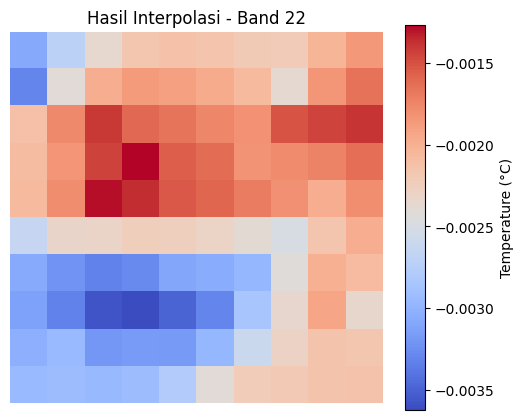

📊 Statistik Band 22 setelah interpolasi:
- Min: -0.00
- Max: -0.00
- Mean: -0.00
- Std Dev: 0.00
----------------------------------------
🔄 Memproses band ke-23...


Band 23: 100%|██████████| 36/36 [00:00<00:00, 442.42it/s]


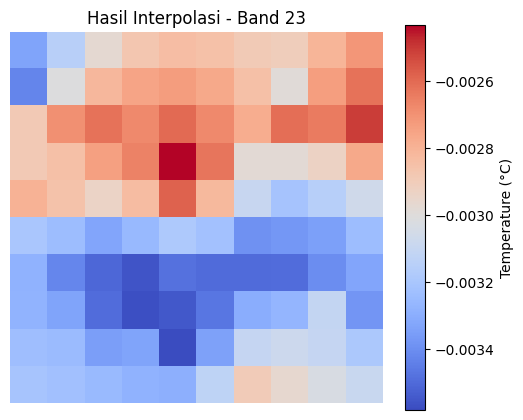

📊 Statistik Band 23 setelah interpolasi:
- Min: -0.00
- Max: -0.00
- Mean: -0.00
- Std Dev: 0.00
----------------------------------------
🔄 Memproses band ke-24...


Band 24: 100%|██████████| 36/36 [00:00<00:00, 387.76it/s]


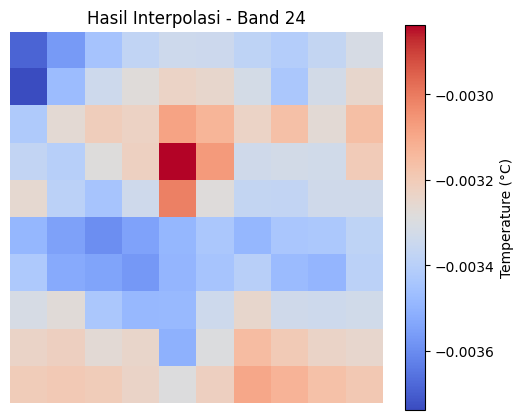

📊 Statistik Band 24 setelah interpolasi:
- Min: -0.00
- Max: -0.00
- Mean: -0.00
- Std Dev: 0.00
----------------------------------------
🔄 Memproses band ke-25...


Band 25: 100%|██████████| 36/36 [00:00<00:00, 475.16it/s]


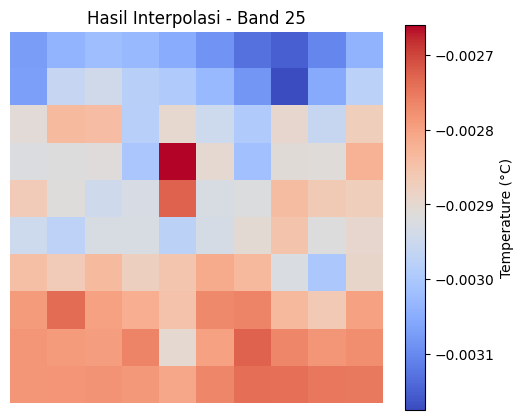

📊 Statistik Band 25 setelah interpolasi:
- Min: -0.00
- Max: -0.00
- Mean: -0.00
- Std Dev: 0.00
----------------------------------------
🔄 Memproses band ke-26...


Band 26: 100%|██████████| 36/36 [00:00<00:00, 418.97it/s]


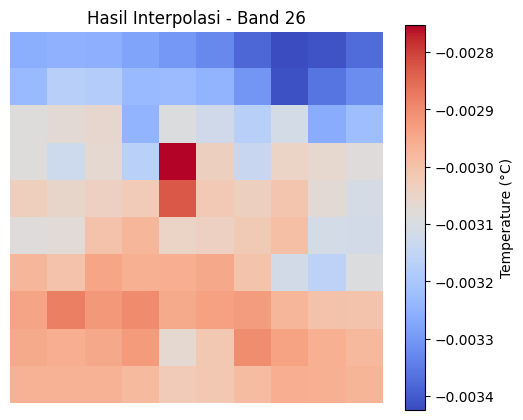

📊 Statistik Band 26 setelah interpolasi:
- Min: -0.00
- Max: -0.00
- Mean: -0.00
- Std Dev: 0.00
----------------------------------------
🔄 Memproses band ke-27...


Band 27: 100%|██████████| 36/36 [00:00<00:00, 373.86it/s]


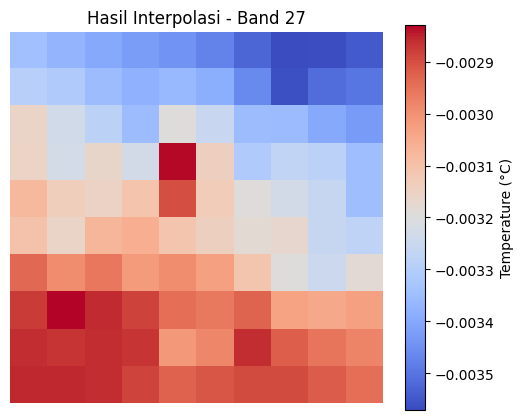

📊 Statistik Band 27 setelah interpolasi:
- Min: -0.00
- Max: -0.00
- Mean: -0.00
- Std Dev: 0.00
----------------------------------------
🔄 Memproses band ke-28...


Band 28: 100%|██████████| 36/36 [00:00<00:00, 449.59it/s]


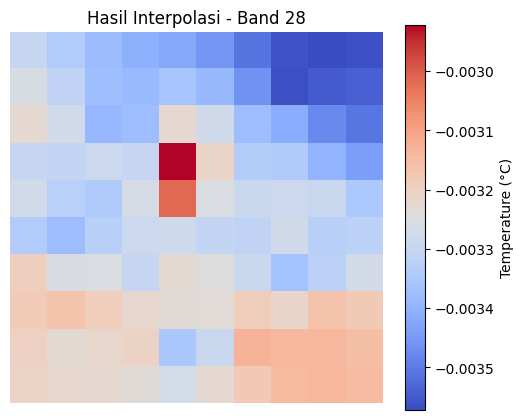

📊 Statistik Band 28 setelah interpolasi:
- Min: -0.00
- Max: -0.00
- Mean: -0.00
- Std Dev: 0.00
----------------------------------------
🔄 Memproses band ke-29...


Band 29: 100%|██████████| 36/36 [00:00<00:00, 409.14it/s]


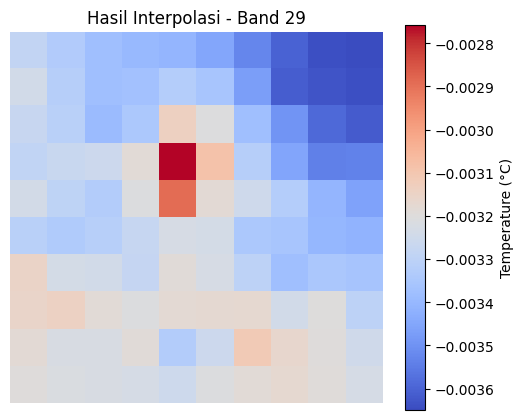

📊 Statistik Band 29 setelah interpolasi:
- Min: -0.00
- Max: -0.00
- Mean: -0.00
- Std Dev: 0.00
----------------------------------------
🔄 Memproses band ke-30...


Band 30: 100%|██████████| 36/36 [00:00<00:00, 341.53it/s]


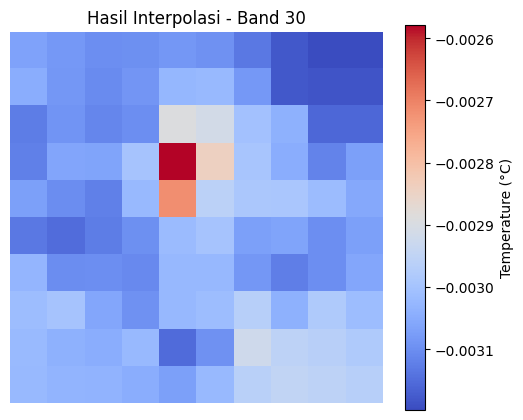

📊 Statistik Band 30 setelah interpolasi:
- Min: -0.00
- Max: -0.00
- Mean: -0.00
- Std Dev: 0.00
----------------------------------------
🔄 Memproses band ke-31...


Band 31: 100%|██████████| 36/36 [00:00<00:00, 322.75it/s]


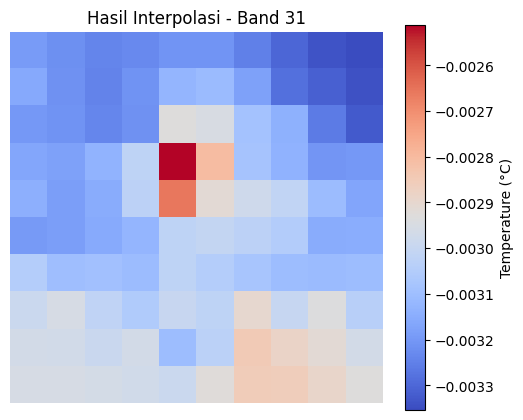

📊 Statistik Band 31 setelah interpolasi:
- Min: -0.00
- Max: -0.00
- Mean: -0.00
- Std Dev: 0.00
----------------------------------------
🔄 Memproses band ke-32...


Band 32: 100%|██████████| 36/36 [00:00<00:00, 360.28it/s]


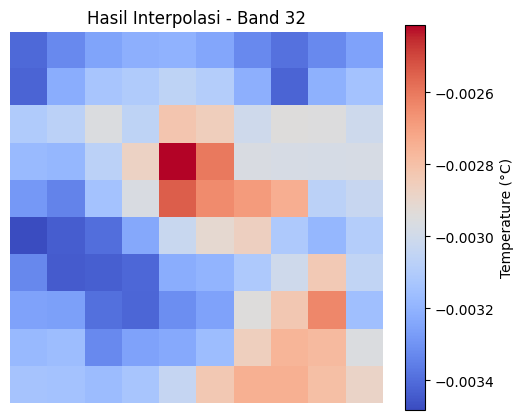

📊 Statistik Band 32 setelah interpolasi:
- Min: -0.00
- Max: -0.00
- Mean: -0.00
- Std Dev: 0.00
----------------------------------------
🔄 Memproses band ke-33...


Band 33: 100%|██████████| 36/36 [00:00<00:00, 388.78it/s]


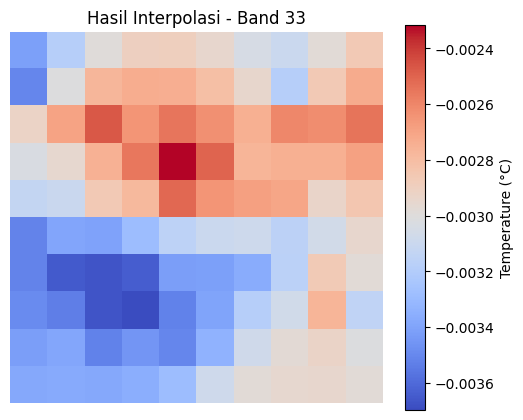

📊 Statistik Band 33 setelah interpolasi:
- Min: -0.00
- Max: -0.00
- Mean: -0.00
- Std Dev: 0.00
----------------------------------------
🔄 Memproses band ke-34...


Band 34: 100%|██████████| 36/36 [00:00<00:00, 402.89it/s]


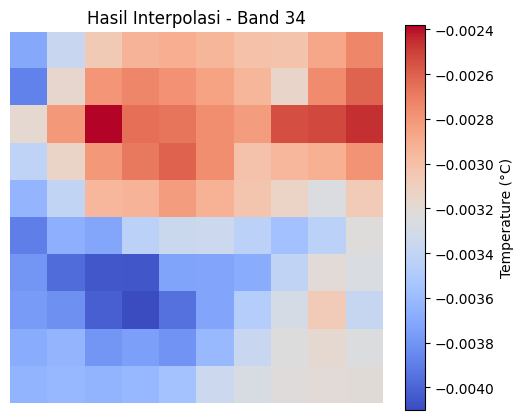

📊 Statistik Band 34 setelah interpolasi:
- Min: -0.00
- Max: -0.00
- Mean: -0.00
- Std Dev: 0.00
----------------------------------------
🔄 Memproses band ke-35...


Band 35: 100%|██████████| 36/36 [00:00<00:00, 404.69it/s]


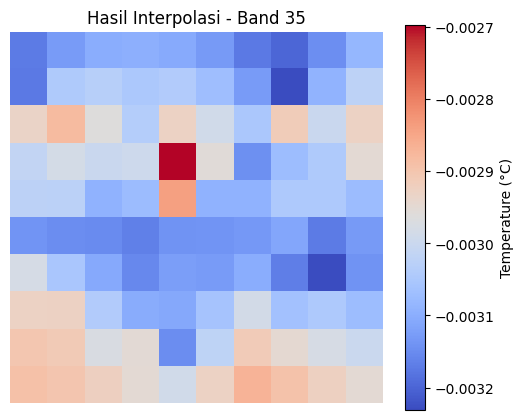

📊 Statistik Band 35 setelah interpolasi:
- Min: -0.00
- Max: -0.00
- Mean: -0.00
- Std Dev: 0.00
----------------------------------------
🔄 Memproses band ke-36...


Band 36: 100%|██████████| 36/36 [00:00<00:00, 238.15it/s]


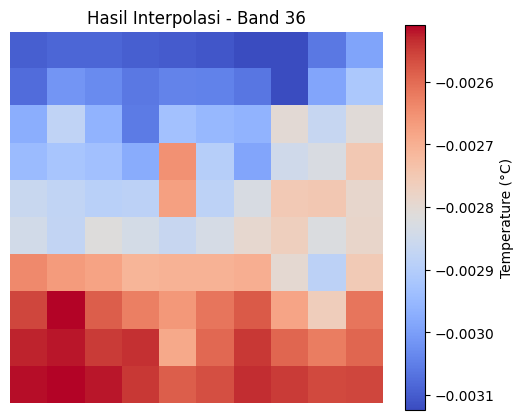

📊 Statistik Band 36 setelah interpolasi:
- Min: -0.00
- Max: -0.00
- Mean: -0.00
- Std Dev: 0.00
----------------------------------------
✅ Semua band berhasil diinterpolasi dan disimpan ke /content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/E_EXPORT/ERA5_e_Monthly_2022_2024_NaN_Interpolated.tif


In [ ]:
import numpy as np
import rasterio
from rasterio.plot import show
from pykrige.ok import OrdinaryKriging
from tqdm import tqdm


# ----------------------------------
# INTERPOLATE MISSING VALUE 36 BULAN
# -----------------------------------

file_path = '/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/E_EXPORT/ERA5_e_Monthly_2022_2024.tif'
with rasterio.open(file_path) as src:
    profile = src.profile
    transform = src.transform
    all_data = []

    for i in range(1, src.count + 1):  # Loop through 36 bands
        print(f"🔄 Memproses band ke-{i}...")
        data = src.read(i)
        rows, cols = np.where(~np.isnan(data))
        z = data[rows, cols]

        if len(z) == 0:
            print(f"⚠️ Band {i} tidak memiliki data valid. Lewat.")
            all_data.append(data)
            continue

        x_coords, y_coords = rasterio.transform.xy(transform, rows, cols)

        ok = OrdinaryKriging(
            x_coords, y_coords, z,
            variogram_model='linear',
            verbose=False,
            enable_plotting=False
        )

        nan_rows, nan_cols = np.where(np.isnan(data))
        x_nan, y_nan = rasterio.transform.xy(transform, nan_rows, nan_cols)

        z_nan = []
        for x, y in tqdm(zip(x_nan, y_nan), total=len(x_nan), desc=f'Band {i}'):
            z_, _ = ok.execute('points', x, y)
            z_nan.append(z_[0])

        z_nan = np.array(z_nan)
        data[nan_rows, nan_cols] = z_nan


        # Tampilkan visualisasi hasil interpolasi
        plt.figure(figsize=(6, 5))
        plt.imshow(data, cmap='coolwarm')
        plt.colorbar(label='Temperature (°C)')
        plt.title(f'Hasil Interpolasi - Band {i}')
        plt.axis('off')
        plt.show()

        # Statistik dasar
        print(f"📊 Statistik Band {i} setelah interpolasi:")
        print(f"- Min: {np.nanmin(data):.2f}")
        print(f"- Max: {np.nanmax(data):.2f}")
        print(f"- Mean: {np.nanmean(data):.2f}")
        print(f"- Std Dev: {np.nanstd(data):.2f}")
        print("-" * 40)

        all_data.append(data) # Fixed indentation

# Simpan semua band
output_path = file_path.replace('.tif', '_NaN_Interpolated.tif')
profile.update(count=36)

with rasterio.open(output_path, 'w', **profile) as dst:
    for i, band_data in enumerate(all_data, start=1):
        dst.write(band_data, i)

print(f"✅ Semua band berhasil diinterpolasi dan disimpan ke {output_path}")

✅ ERA5_e_Monthly_2022_2024_NaN_Interpolated.tif - Resampled dengan NoData: nan


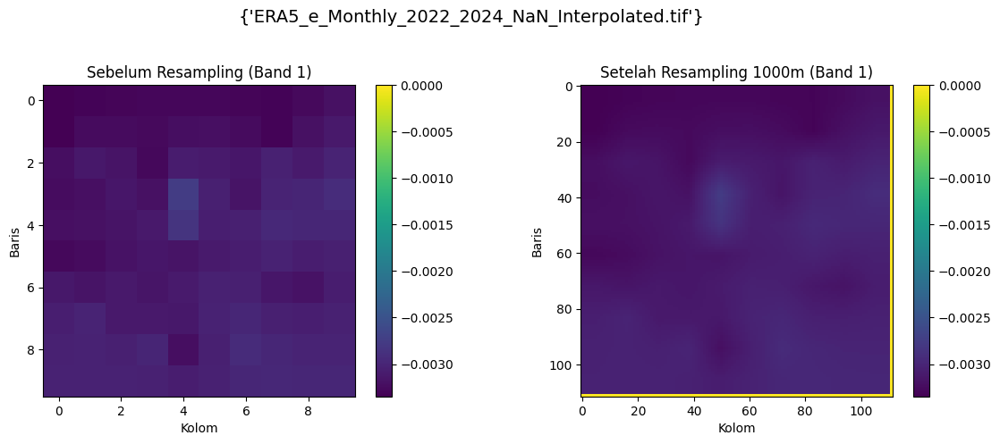

📊 Hasil evaluasi 36 band disimpan di: /content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/E_EXPORT/DOWNSCALED/eval_all_bands.csv


In [ ]:
#-------------------
# Downscaling Multi-Band (36 Band)
#-------------------

import rasterio
from rasterio.enums import Resampling
from rasterio.warp import calculate_default_transform, reproject
import matplotlib.pyplot as plt
import numpy as np
import os
from glob import glob
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from skimage.transform import resize
import pandas as pd

# Visualisasi sebelum dan sesudah resampling untuk band pertama
def visualize_comparison(before_array, after_array, title):
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))
    cmap = 'viridis'

    # Ambil band pertama untuk visualisasi
    before_band = np.ma.masked_invalid(before_array[0])
    after_band = np.ma.masked_invalid(after_array[0])

    vmin = min(np.nanmin(before_band), np.nanmin(after_band))
    vmax = max(np.nanmax(before_band), np.nanmax(after_band))

    im1 = axs[0].imshow(before_band, cmap=cmap, vmin=vmin, vmax=vmax)
    axs[0].set_title("Sebelum Resampling (Band 1)")
    axs[0].set_xlabel("Kolom")
    axs[0].set_ylabel("Baris")
    plt.colorbar(im1, ax=axs[0], orientation="vertical", fraction=0.05)

    im2 = axs[1].imshow(after_band, cmap=cmap, vmin=vmin, vmax=vmax)
    axs[1].set_title("Setelah Resampling 1000m (Band 1)")
    axs[1].set_xlabel("Kolom")
    axs[1].set_ylabel("Baris")
    plt.colorbar(im2, ax=axs[1], orientation="vertical", fraction=0.05)

    plt.suptitle(title, fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Evaluasi statistik untuk semua band
def evaluate_stats_all_bands(before, after, filename):
    results = []
    for band_idx in range(before.shape[0]):
        before_band = before[band_idx]
        after_band = after[band_idx]

        # Resize untuk matching shape
        after_resized = resize(after_band, before_band.shape,
                             order=1, preserve_range=True,
                             anti_aliasing=False)

        mask = ~np.isnan(before_band) & ~np.isnan(after_resized)

        if np.count_nonzero(mask) == 0:
            print(f"⚠️ {filename} Band {band_idx+1} tidak dapat dievaluasi")
            continue

        y_true = before_band[mask]
        y_pred = after_resized[mask]

        mse = mean_squared_error(y_true, y_pred)
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(y_true, y_pred)
        r2 = r2_score(y_true, y_pred)

        results.append({
            "Filename": filename,
            "Band": band_idx+1,
            "RMSE": rmse,
            "MSE": mse,
            "MAE": mae,
            "R2": r2
        })

    return results

# Fungsi resampling untuk semua band
def resample_raster_to_1km_all_bands(input_path, output_path, visualize=True):
    with rasterio.open(input_path) as src:
        # Baca semua band
        src_nodata = src.nodata if src.nodata is not None else np.nan
        src_array = src.read()  # Shape: (bands, rows, cols)
        src_array = np.where(src_array == src_nodata, np.nan, src_array)
        src_transform = src.transform
        src_crs = src.crs
        src_bounds = src.bounds

        # Hitung transformasi output
        dst_transform, width, height = calculate_default_transform(
            src_crs, src_crs,
            src.width, src.height,
            *src_bounds,
            resolution=1000
        )

        # Siapkan array output
        dst_array = np.full((src.count, height, width), np.nan, dtype=src.dtypes[0])

        # Update metadata
        kwargs = src.meta.copy()
        kwargs.update({
            'driver': 'GTiff',
            'count': src.count,
            'crs': src_crs,
            'transform': dst_transform,
            'width': width,
            'height': height,
            'nodata': src_nodata
        })

        # Proses resampling per band
        with rasterio.open(output_path, 'w', **kwargs) as dst:
            dst_array = np.empty((src.count, height, width), dtype=src.dtypes[0])

            for band in range(src.count):
                reproject(
                    source=src_array[band],
                    destination=dst_array[band],
                    src_transform=src_transform,
                    src_crs=src_crs,
                    dst_transform=dst_transform,
                    dst_crs=src_crs,
                    resampling=Resampling.bilinear
                )
                dst.write(dst_array[band], band+1)

    print(f"✅ {os.path.basename(input_path)} - Resampled dengan NoData: {src_nodata}")

    if visualize:
        visualize_comparison(src_array, dst_array,
                           {os.path.basename(input_path)})

    return src_array, dst_array

# Batch Processing untuk semua file
input_folder = "/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/E_EXPORT/NAN"
output_folder = "/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/E_EXPORT/DOWNSCALED"
os.makedirs(output_folder, exist_ok=True)

raster_files = glob(os.path.join(input_folder, "*.tif"))
all_results = []

for raster_file in raster_files:
    filename = os.path.basename(raster_file)
    output_path = os.path.join(output_folder, f"{os.path.splitext(filename)[0]}_1km.tif")

    # Proses resampling
    before, after = resample_raster_to_1km_all_bands(raster_file, output_path)

    # Evaluasi
    stats = evaluate_stats_all_bands(before, after, filename)
    all_results.extend(stats)

# Simpan hasil evaluasi
df = pd.DataFrame(all_results)
csv_path = os.path.join(output_folder, "eval_all_bands.csv")
df.to_csv(csv_path, index=False)
print(f"📊 Hasil evaluasi 36 band disimpan di: {csv_path}")

In [ ]:
#-------------------------
# INFORMASI NAN 1KM
#-------------------------

import rasterio
import numpy as np
import pandas as pd

# 1. Buka file TIFF
tif_path = '/content/drive/MyDrive/E_EXPORT/ERA5_e_Monthly_2022_2024_1KM/ERA5_e_Monthly_2022_2024_NaN_resampled.tif'
with rasterio.open(tif_path) as src:
    data = src.read()  # (bands, height, width)
    profile = src.profile

# 2. Siapkan list bulan (label)
start_year = 2022
start_month = 1
labels = []
for i in range(36):
    year = start_year + (start_month + i - 1) // 12
    month = (start_month + i - 1) % 12 + 1
    labels.append(f"{year:04d}-{month:02d}")

# 3. Hitung valid_ratio dan missing_ratio
valid_ratios = []
missing_ratios_percent = []

for i in range(data.shape[0]):  # untuk tiap band
    band = data[i, :, :]
    total_pixels = band.size
    valid_pixels = np.count_nonzero(~np.isnan(band))
    valid_ratio = valid_pixels / total_pixels
    missing_ratio = 1.0 - valid_ratio

    valid_ratios.append(valid_ratio)
    missing_ratios_percent.append(missing_ratio * 100)

# 4. Buat dataframe ringkasan
summary_df = pd.DataFrame({
    'label': labels,
    'valid_ratio': valid_ratios,
    'missing_ratio_percent': missing_ratios_percent
})

# 5. Tampilkan
print(summary_df)

      label  valid_ratio  missing_ratio_percent
0   2022-01          1.0                    0.0
1   2022-02          1.0                    0.0
2   2022-03          1.0                    0.0
3   2022-04          1.0                    0.0
4   2022-05          1.0                    0.0
5   2022-06          1.0                    0.0
6   2022-07          1.0                    0.0
7   2022-08          1.0                    0.0
8   2022-09          1.0                    0.0
9   2022-10          1.0                    0.0
10  2022-11          1.0                    0.0
11  2022-12          1.0                    0.0
12  2023-01          1.0                    0.0
13  2023-02          1.0                    0.0
14  2023-03          1.0                    0.0
15  2023-04          1.0                    0.0
16  2023-05          1.0                    0.0
17  2023-06          1.0                    0.0
18  2023-07          1.0                    0.0
19  2023-08          1.0                

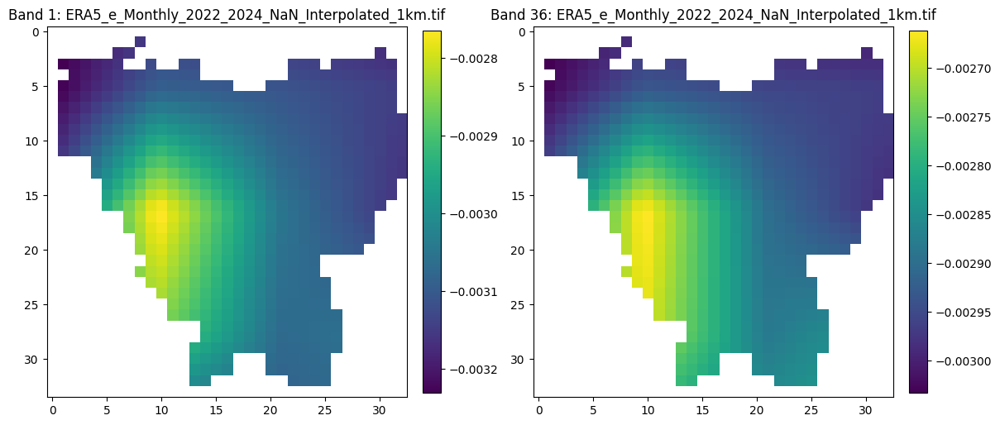

✅ Processed multiband: ERA5_e_Monthly_2022_2024_NaN_Interpolated_1km.tif


In [ ]:
#-------------------------
# CLIP DOWNSCALED (MULTIBAND)
#-------------------------
import rasterio
from rasterio.mask import mask
import geopandas as gpd
import numpy as np
import os
from glob import glob
import matplotlib.pyplot as plt

# === 1. BACA SHAPEFILE BATAS ADMINISTRASI ===
shapefile_path = '/content/drive/MyDrive/PENGOLAHAN/DKI Jakarta/DKI Jakarta.shp'
gdf = gpd.read_file(shapefile_path)

# === 2. DAFTAR SEMUA FILE RASTER YANG MAU DIOLAH ===
input_folder = '/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/E_EXPORT/DOWNSCALED'  # folder berisi hasil resampling
output_folder = '/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/E_EXPORT/CLIP'
os.makedirs(output_folder, exist_ok=True)
raster_files = sorted(glob(os.path.join(input_folder, '*.tif')))

# === 3. LOOP UNTUK SETIAP FILE RASTER ===
for raster_path in raster_files:
    with rasterio.open(raster_path) as src:
        raster_data = src.read()  # ⬅️ Ambil semua band (multiband)
        raster_meta = src.meta.copy()

        # Cek dan samakan CRS shapefile
        if gdf.crs != src.crs:
            gdf = gdf.to_crs(src.crs)

        # Gunakan nilai nodata asli
        nodata_value = src.nodata

        # Crop dan mask semua band
        out_image, out_transform = mask(
            src,
            gdf.geometry,
            crop=True,
            nodata=nodata_value
        )

        # Update metadata
        out_meta = raster_meta.copy()
        out_meta.update({
            "driver": "GTiff",
            "height": out_image.shape[1],
            "width": out_image.shape[2],
            "count": out_image.shape[0],  # ⬅️ Total band
            "transform": out_transform,
            "nodata": nodata_value
        })

        # Nama file output
        filename = os.path.basename(raster_path)
        output_path = os.path.join(output_folder, f"Jakarta_{filename}")

        # Simpan hasil raster clipped
        with rasterio.open(output_path, "w", **out_meta) as dest:
            dest.write(out_image)

        # === VISUALISASI: Band 1 & terakhir ===
        fig, ax = plt.subplots(1, 2, figsize=(12, 6))
        im1 = ax[0].imshow(out_image[0], cmap='viridis')
        ax[0].set_title(f"Band 1: {filename}")
        plt.colorbar(im1, ax=ax[0], fraction=0.046, pad=0.04)

        im2 = ax[1].imshow(out_image[-1], cmap='viridis')
        ax[1].set_title(f"Band {out_image.shape[0]}: {filename}")
        plt.colorbar(im2, ax=ax[1], fraction=0.046, pad=0.04)

        plt.tight_layout()
        plt.show()

    print(f"✅ Processed multiband: {filename}")


In [ ]:
#-------------------------
# INFORMASI NAN clip
#-------------------------

import rasterio
import numpy as np
import pandas as pd

# 1. Buka file TIFF
tif_path = '/content/drive/MyDrive/E_EXPORT/e_monthly_clip/Jakarta_ERA5_e_Monthly_2022_2024_NaN_resampled.tif'
with rasterio.open(tif_path) as src:
    data = src.read()  # (bands, height, width)
    profile = src.profile

# 2. Siapkan list bulan (label)
start_year = 2022
start_month = 1
labels = []
for i in range(36):
    year = start_year + (start_month + i - 1) // 12
    month = (start_month + i - 1) % 12 + 1
    labels.append(f"{year:04d}-{month:02d}")

# 3. Hitung valid_ratio dan missing_ratio
valid_ratios = []
missing_ratios_percent = []

for i in range(data.shape[0]):  # untuk tiap band
    band = data[i, :, :]
    total_pixels = band.size
    valid_pixels = np.count_nonzero(~np.isnan(band))
    valid_ratio = valid_pixels / total_pixels
    missing_ratio = 1.0 - valid_ratio

    valid_ratios.append(valid_ratio)
    missing_ratios_percent.append(missing_ratio * 100)

# 4. Buat dataframe ringkasan
summary_df = pd.DataFrame({
    'label': labels,
    'valid_ratio': valid_ratios,
    'missing_ratio_percent': missing_ratios_percent
})

# 5. Tampilkan
print(summary_df)

      label  valid_ratio  missing_ratio_percent
0   2022-01          1.0                    0.0
1   2022-02          1.0                    0.0
2   2022-03          1.0                    0.0
3   2022-04          1.0                    0.0
4   2022-05          1.0                    0.0
5   2022-06          1.0                    0.0
6   2022-07          1.0                    0.0
7   2022-08          1.0                    0.0
8   2022-09          1.0                    0.0
9   2022-10          1.0                    0.0
10  2022-11          1.0                    0.0
11  2022-12          1.0                    0.0
12  2023-01          1.0                    0.0
13  2023-02          1.0                    0.0
14  2023-03          1.0                    0.0
15  2023-04          1.0                    0.0
16  2023-05          1.0                    0.0
17  2023-06          1.0                    0.0
18  2023-07          1.0                    0.0
19  2023-08          1.0                

# GEE Version Surface Pressure

In [ ]:
#-------------------
# PENGUNDUHAN
#-------------------

import ee
import geemap

# Inisialisasi Earth Engine
ee.Authenticate()
ee.Initialize(project='ee-sidangapril2024')

# Definisikan Area of Interest (AOI)
AOI = ee.FeatureCollection("projects/ee-sidangapril2024/assets/JABODETABEK")

# Koleksi ERA5-Land hourly
era5_collection = ee.ImageCollection('ECMWF/ERA5_LAND/HOURLY')

# Rentang waktu: Januari 2022 - Desember 2024 (sesuaikan jika perlu)
start_date = ee.Date('2022-01-01')
end_date = ee.Date('2024-12-31')

# Buat list bulan
months = ee.List.sequence(0, end_date.difference(start_date, 'month'))

# Fungsi untuk menghitung rata-rata bulanan
def calculate_monthly_mean(month_offset):
    start = start_date.advance(month_offset, 'month')
    end = start.advance(1, 'month')
    year_month = start.format('YYYY-MM')
    filtered_collection = era5_collection.filterDate(start, end)
    surface_pressure = filtered_collection.select('surface_pressure') \
        .mean() \
        .clip(AOI) \
        .rename([year_month]) \
        .set('system:time_start', start.millis())
    return surface_pressure

# Hitung rata-rata bulanan untuk setiap bulan
monthly_means = months.map(calculate_monthly_mean)
multi_band_image = ee.ImageCollection(monthly_means).toBands()

# Gabungkan menjadi ImageCollection
monthly_collection = ee.ImageCollection(monthly_means)

# Visualisasi (contoh untuk bulan pertama)
first_month_mean = monthly_collection.first()
vis_params = {
    'min': 95000,  # minimum surface pressure dalam Pa
    'max': 105000,
    'palette': ['blue', 'green', 'yellow', 'red']
}

Map = geemap.Map()
Map.centerObject(AOI, 8)
Map.addLayer(first_month_mean, vis_params, 'surface Pressure (Pa)')
Map.addLayer(AOI, {}, 'AOI')
Map

Map(center=[-6.375912206265441, 106.80576119247223], controls=(WidgetControl(options=['position', 'transparent…

In [ ]:
#-------------------
# PENYIMPANAN
#-------------------

# Export ke Google Drive
task = ee.batch.Export.image.toDrive(
    image=multi_band_image,
    description='monthly_surface_pressure',
    folder='SP_EXPORT',
    fileNamePrefix='ERA5_SP_Monthly_2022_2024',
    region=AOI.geometry(),
    scale=11132,  # Resolusi native ERA5
    crs='EPSG:32748',
    maxPixels=1e13
)
task.start()


In [ ]:
#-------------------------
# INFORMASI NAN Awal
#-------------------------

import rasterio
import numpy as np
import pandas as pd

# 1. Buka file TIFF
tif_path = '/content/drive/MyDrive/SP_EXPORT/ERA5_SP_Monthly_2022_2024.tif'
with rasterio.open(tif_path) as src:
    data = src.read()  # (bands, height, width)
    profile = src.profile

# 2. Siapkan list bulan (label)
start_year = 2022
start_month = 1
labels = []
for i in range(36):
    year = start_year + (start_month + i - 1) // 12
    month = (start_month + i - 1) % 12 + 1
    labels.append(f"{year:04d}-{month:02d}")

# 3. Hitung valid_ratio dan missing_ratio
valid_ratios = []
missing_ratios_percent = []

for i in range(data.shape[0]):  # untuk tiap band
    band = data[i, :, :]
    total_pixels = band.size
    valid_pixels = np.count_nonzero(~np.isnan(band))
    valid_ratio = valid_pixels / total_pixels
    missing_ratio = 1.0 - valid_ratio

    valid_ratios.append(valid_ratio)
    missing_ratios_percent.append(missing_ratio * 100)

# 4. Buat dataframe ringkasan
summary_df = pd.DataFrame({
    'label': labels,
    'valid_ratio': valid_ratios,
    'missing_ratio_percent': missing_ratios_percent
})

# 5. Tampilkan
print(summary_df)

      label  valid_ratio  missing_ratio_percent
0   2022-01         0.64                   36.0
1   2022-02         0.64                   36.0
2   2022-03         0.64                   36.0
3   2022-04         0.64                   36.0
4   2022-05         0.64                   36.0
5   2022-06         0.64                   36.0
6   2022-07         0.64                   36.0
7   2022-08         0.64                   36.0
8   2022-09         0.64                   36.0
9   2022-10         0.64                   36.0
10  2022-11         0.64                   36.0
11  2022-12         0.64                   36.0
12  2023-01         0.64                   36.0
13  2023-02         0.64                   36.0
14  2023-03         0.64                   36.0
15  2023-04         0.64                   36.0
16  2023-05         0.64                   36.0
17  2023-06         0.64                   36.0
18  2023-07         0.64                   36.0
19  2023-08         0.64                

In [ ]:
#-------------------
# INFORMASI MISSING
#-------------------

# Step 1: Tambahkan label (YYYY-MM) dan valid_ratio ke setiap image

def add_valid_ratio(image):
    band_name = 'sp'  # Ganti dengan nama band yang sesuai

    # Mask menunjukkan piksel valid
    mask = image.mask().gt(0)

    # Hitung luas area valid (m²)
    valid_area_image = mask.multiply(ee.Image.pixelArea())
    area_stats = valid_area_image.reduceRegion(
        reducer=ee.Reducer.sum(),
        geometry=AOI.geometry(),  # jika AOI berupa FeatureCollection
        scale=11132,
        maxPixels=1e13
    )

    # Luas valid & total AOI
    valid_area = ee.Number(area_stats.get(band_name))
    total_area = AOI.geometry().area()

    # Rasio valid dan missing
    valid_ratio = valid_area.divide(total_area)
    missing_ratio = ee.Number(1.0).subtract(valid_ratio)

    # Tambahkan ke metadata image
    image = image.set('valid_ratio', valid_ratio)
    image = image.set('missing_ratio', missing_ratio)  # missing ratio as a number (0-1)
    image = image.set('missing_ratio_percent', missing_ratio.multiply(100))  # missing ratio as percentage
    return image


def calculate_monthly_mean_with_ratio(month_offset):
    start = start_date.advance(month_offset, 'month')
    end = start.advance(1, 'month')
    label = start.format('YYYY-MM')

    filtered = era5_collection.filterDate(start, end)
    monthly_mean = filtered.select('surface_pressure') \
        .mean() \
        .clip(AOI) \
        .rename('sp') \
        .set('label', label)

    # Tambahkan valid_ratio dan missing_ratio
    return add_valid_ratio(monthly_mean)

# Step 2: Buat koleksi dengan rasio valid
monthly_collection = ee.ImageCollection(months.map(calculate_monthly_mean_with_ratio))

# Step 3: Konversi ke FeatureCollection untuk ringkasan
def image_to_feature(image):
    return ee.Feature(None, {
        'label': image.get('label'),
        'valid_ratio': image.get('valid_ratio'),
        'missing_ratio_percent': image.get('missing_ratio'),
    })

missing_ratio_fc = monthly_collection.map(image_to_feature)

# Step 4: Cetak hasil
print(missing_ratio_fc.aggregate_array('label').getInfo())
print(missing_ratio_fc.aggregate_array('missing_ratio_percent').getInfo())


['2022-01', '2022-02', '2022-03', '2022-04', '2022-05', '2022-06', '2022-07', '2022-08', '2022-09', '2022-10', '2022-11', '2022-12', '2023-01', '2023-02', '2023-03', '2023-04', '2023-05', '2023-06', '2023-07', '2023-08', '2023-09', '2023-10', '2023-11', '2023-12', '2024-01', '2024-02', '2024-03', '2024-04', '2024-05', '2024-06', '2024-07', '2024-08', '2024-09', '2024-10', '2024-11', '2024-12']
[0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.110107799419

🔄 Memproses band ke-1...


Band 1: 100%|██████████| 36/36 [00:00<00:00, 291.46it/s]


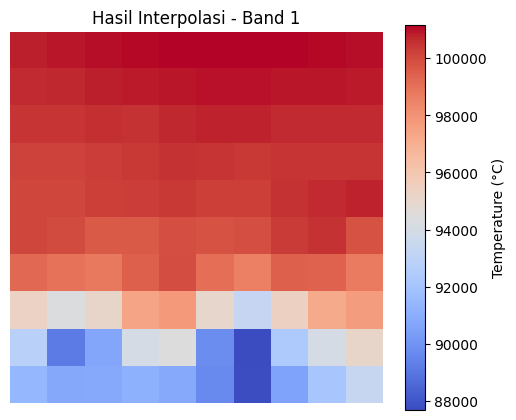

📊 Statistik Band 1 setelah interpolasi:
- Min: 87687.21
- Max: 101156.56
- Mean: 98102.22
- Std Dev: 3777.08
----------------------------------------
🔄 Memproses band ke-2...


Band 2: 100%|██████████| 36/36 [00:00<00:00, 46.40it/s]


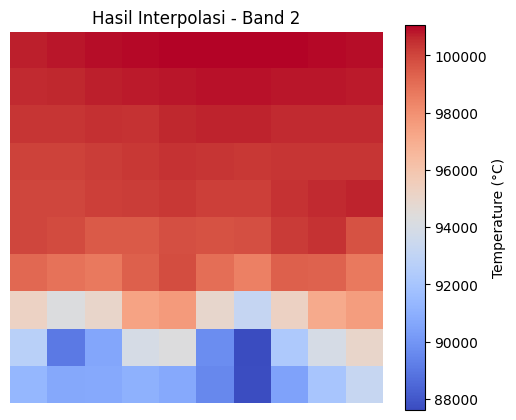

📊 Statistik Band 2 setelah interpolasi:
- Min: 87606.68
- Max: 101063.75
- Mean: 98012.29
- Std Dev: 3774.35
----------------------------------------
🔄 Memproses band ke-3...


Band 3: 100%|██████████| 36/36 [00:00<00:00, 161.90it/s]


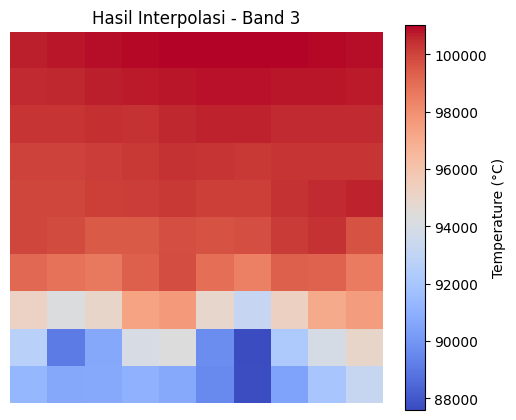

📊 Statistik Band 3 setelah interpolasi:
- Min: 87597.06
- Max: 101025.83
- Mean: 97982.53
- Std Dev: 3764.47
----------------------------------------
🔄 Memproses band ke-4...


Band 4: 100%|██████████| 36/36 [00:00<00:00, 60.29it/s]


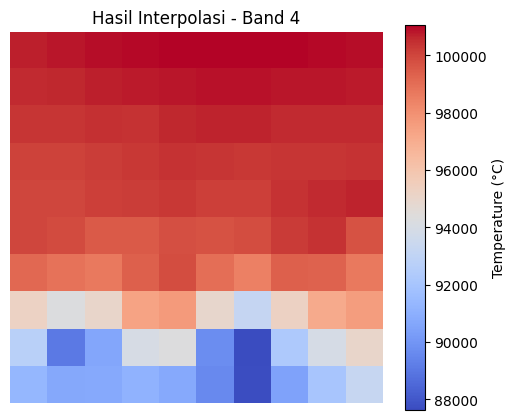

📊 Statistik Band 4 setelah interpolasi:
- Min: 87633.67
- Max: 101063.02
- Mean: 98020.15
- Std Dev: 3765.28
----------------------------------------
🔄 Memproses band ke-5...


Band 5: 100%|██████████| 36/36 [00:02<00:00, 15.15it/s]


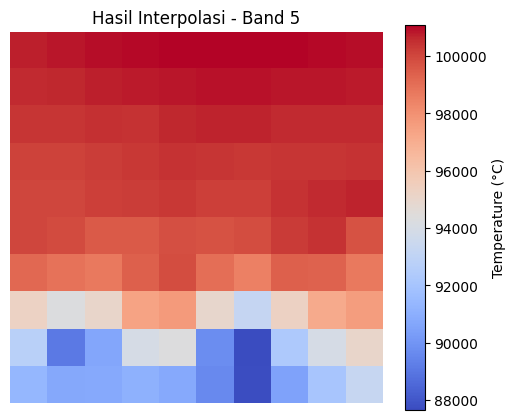

📊 Statistik Band 5 setelah interpolasi:
- Min: 87656.58
- Max: 101072.42
- Mean: 98031.25
- Std Dev: 3762.55
----------------------------------------
🔄 Memproses band ke-6...


Band 6: 100%|██████████| 36/36 [00:00<00:00, 55.73it/s]


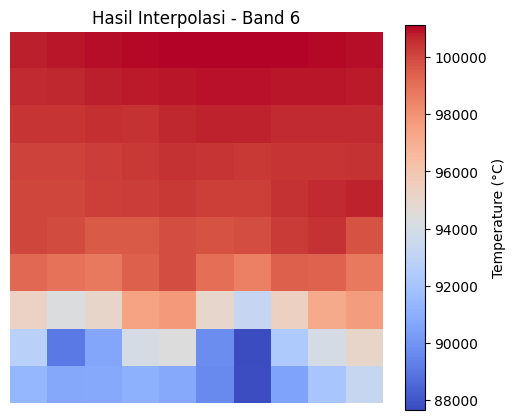

📊 Statistik Band 6 setelah interpolasi:
- Min: 87652.81
- Max: 101116.79
- Mean: 98066.15
- Std Dev: 3775.53
----------------------------------------
🔄 Memproses band ke-7...


Band 7: 100%|██████████| 36/36 [00:00<00:00, 283.31it/s]


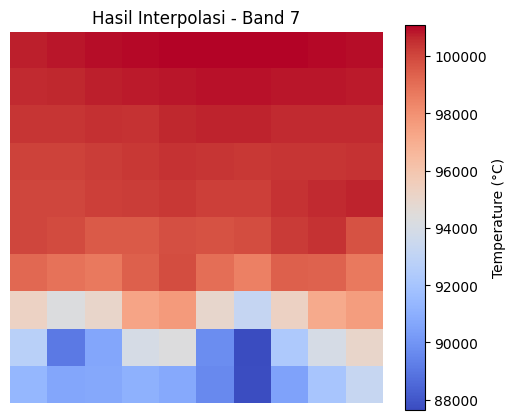

📊 Statistik Band 7 setelah interpolasi:
- Min: 87642.40
- Max: 101085.41
- Mean: 98036.92
- Std Dev: 3771.23
----------------------------------------
🔄 Memproses band ke-8...


Band 8: 100%|██████████| 36/36 [00:00<00:00, 434.80it/s]


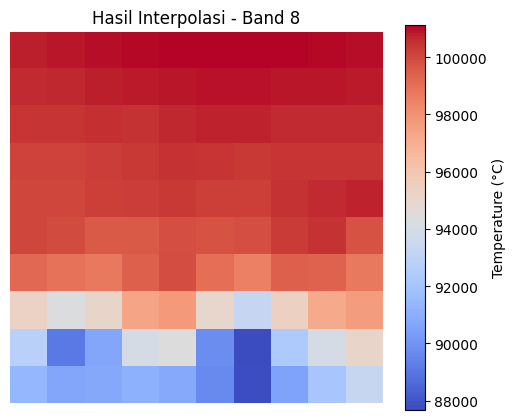

📊 Statistik Band 8 setelah interpolasi:
- Min: 87676.97
- Max: 101125.82
- Mean: 98076.03
- Std Dev: 3772.84
----------------------------------------
🔄 Memproses band ke-9...


Band 9: 100%|██████████| 36/36 [00:00<00:00, 156.23it/s]


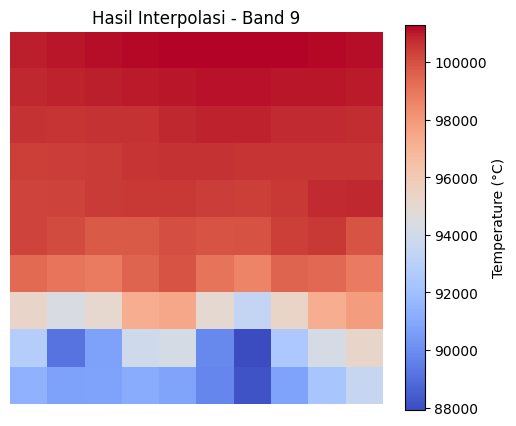

📊 Statistik Band 9 setelah interpolasi:
- Min: 87911.32
- Max: 101290.25
- Mean: 98207.50
- Std Dev: 3803.89
----------------------------------------
🔄 Memproses band ke-10...


Band 10: 100%|██████████| 36/36 [00:00<00:00, 194.88it/s]


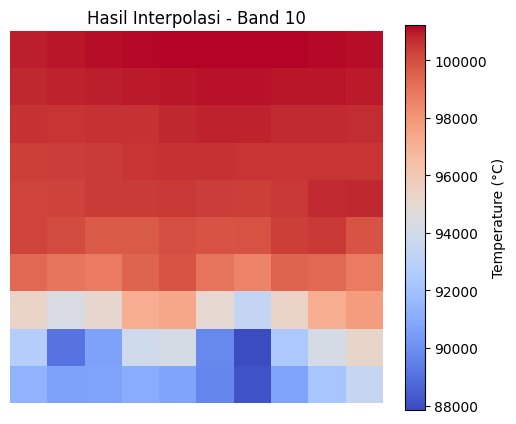

📊 Statistik Band 10 setelah interpolasi:
- Min: 87846.58
- Max: 101225.32
- Mean: 98143.39
- Std Dev: 3802.43
----------------------------------------
🔄 Memproses band ke-11...


Band 11: 100%|██████████| 36/36 [00:00<00:00, 391.53it/s]


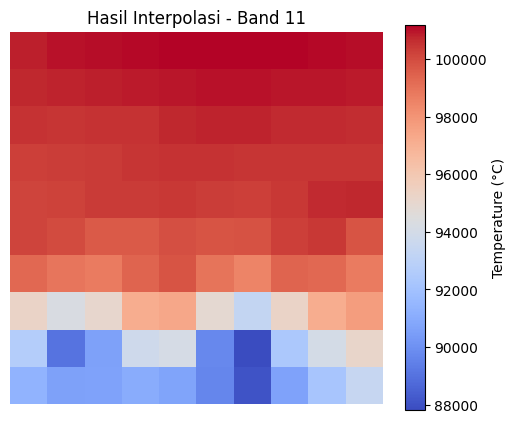

📊 Statistik Band 11 setelah interpolasi:
- Min: 87805.81
- Max: 101175.47
- Mean: 98095.54
- Std Dev: 3799.80
----------------------------------------
🔄 Memproses band ke-12...


Band 12: 100%|██████████| 36/36 [00:00<00:00, 115.43it/s]


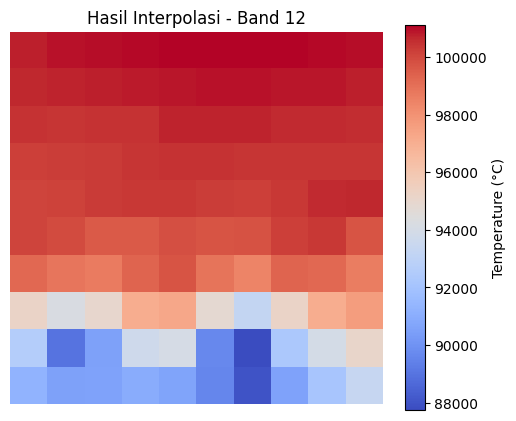

📊 Statistik Band 12 setelah interpolasi:
- Min: 87738.58
- Max: 101111.64
- Mean: 98030.62
- Std Dev: 3800.61
----------------------------------------
🔄 Memproses band ke-13...


Band 13: 100%|██████████| 36/36 [00:00<00:00, 377.23it/s]


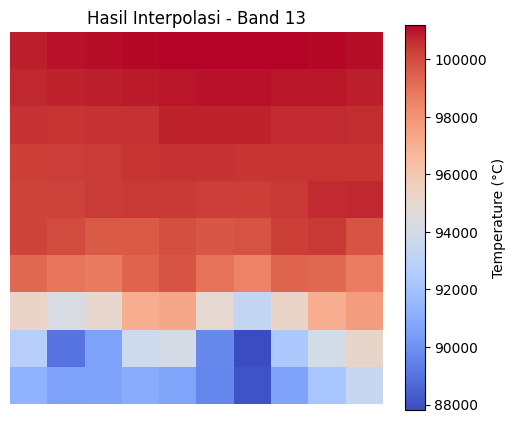

📊 Statistik Band 13 setelah interpolasi:
- Min: 87795.74
- Max: 101183.38
- Mean: 98098.86
- Std Dev: 3803.98
----------------------------------------
🔄 Memproses band ke-14...


Band 14: 100%|██████████| 36/36 [00:00<00:00, 232.13it/s]


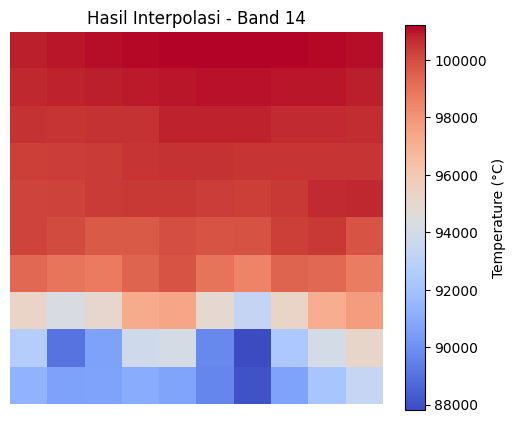

📊 Statistik Band 14 setelah interpolasi:
- Min: 87794.87
- Max: 101199.28
- Mean: 98111.64
- Std Dev: 3809.45
----------------------------------------
🔄 Memproses band ke-15...


Band 15: 100%|██████████| 36/36 [00:00<00:00, 383.07it/s]


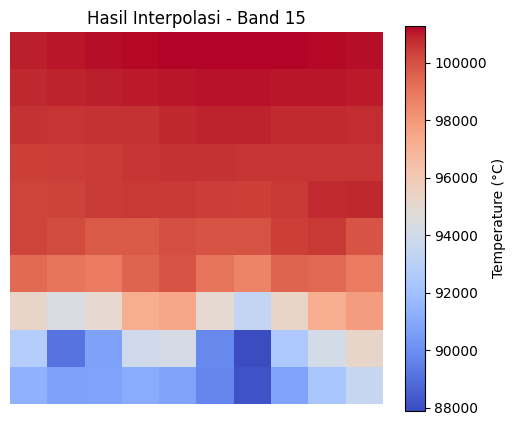

📊 Statistik Band 15 setelah interpolasi:
- Min: 87888.51
- Max: 101280.24
- Mean: 98193.55
- Std Dev: 3807.19
----------------------------------------
🔄 Memproses band ke-16...


Band 16: 100%|██████████| 36/36 [00:00<00:00, 57.85it/s]


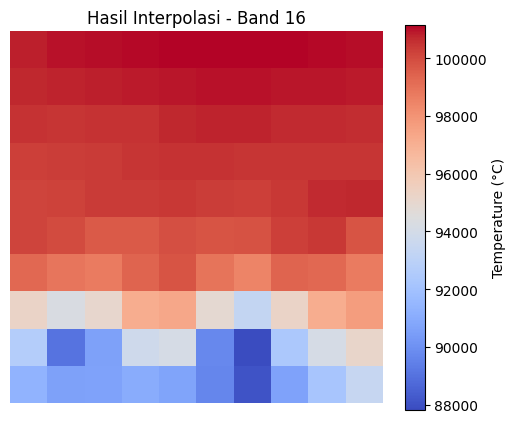

📊 Statistik Band 16 setelah interpolasi:
- Min: 87814.65
- Max: 101158.38
- Mean: 98084.65
- Std Dev: 3792.11
----------------------------------------
🔄 Memproses band ke-17...


Band 17: 100%|██████████| 36/36 [00:00<00:00, 274.67it/s]


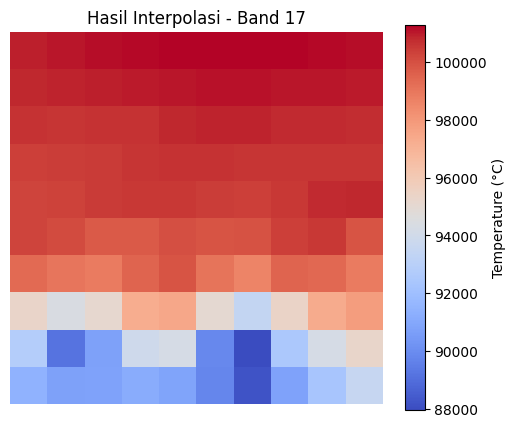

📊 Statistik Band 17 setelah interpolasi:
- Min: 87941.59
- Max: 101287.14
- Mean: 98212.40
- Std Dev: 3794.62
----------------------------------------
🔄 Memproses band ke-18...


Band 18: 100%|██████████| 36/36 [00:00<00:00, 142.11it/s]


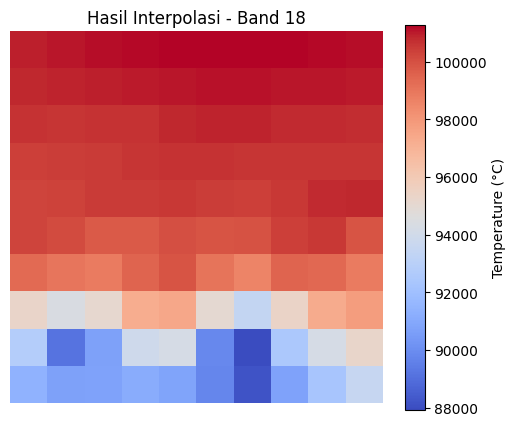

📊 Statistik Band 18 setelah interpolasi:
- Min: 87918.55
- Max: 101273.53
- Mean: 98195.89
- Std Dev: 3797.38
----------------------------------------
🔄 Memproses band ke-19...


Band 19: 100%|██████████| 36/36 [00:00<00:00, 134.08it/s]


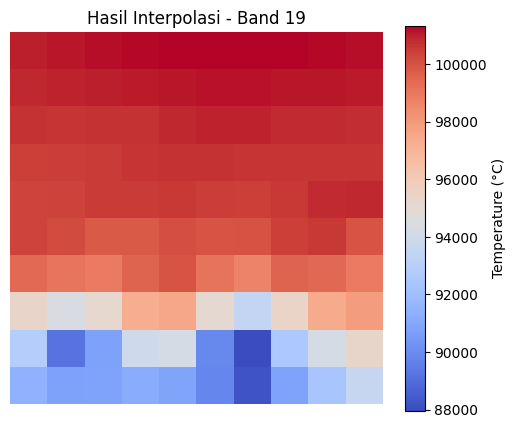

📊 Statistik Band 19 setelah interpolasi:
- Min: 87959.99
- Max: 101339.30
- Mean: 98255.74
- Std Dev: 3804.04
----------------------------------------
🔄 Memproses band ke-20...


Band 20: 100%|██████████| 36/36 [00:00<00:00, 150.56it/s]


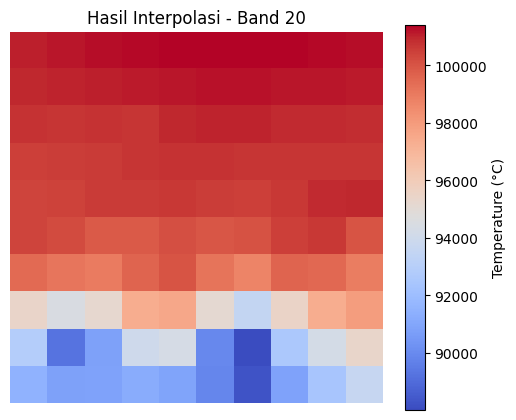

📊 Statistik Band 20 setelah interpolasi:
- Min: 88015.21
- Max: 101399.52
- Mean: 98311.01
- Std Dev: 3805.74
----------------------------------------
🔄 Memproses band ke-21...


Band 21: 100%|██████████| 36/36 [00:00<00:00, 79.55it/s]


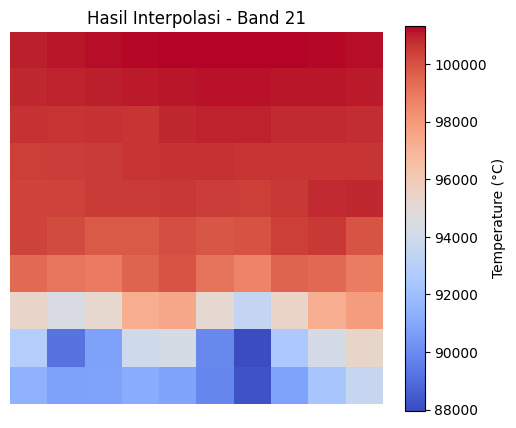

📊 Statistik Band 21 setelah interpolasi:
- Min: 87964.93
- Max: 101333.04
- Mean: 98247.86
- Std Dev: 3800.56
----------------------------------------
🔄 Memproses band ke-22...


Band 22: 100%|██████████| 36/36 [00:02<00:00, 13.24it/s]


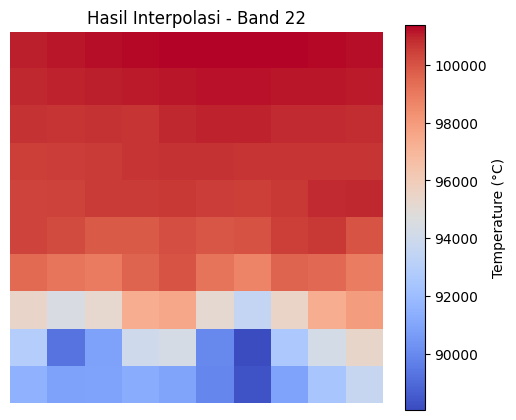

📊 Statistik Band 22 setelah interpolasi:
- Min: 88045.91
- Max: 101380.89
- Mean: 98304.42
- Std Dev: 3790.96
----------------------------------------
🔄 Memproses band ke-23...


Band 23: 100%|██████████| 36/36 [00:01<00:00, 22.96it/s]


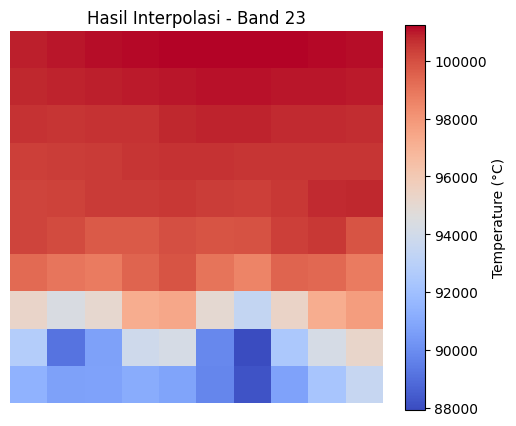

📊 Statistik Band 23 setelah interpolasi:
- Min: 87917.38
- Max: 101241.74
- Mean: 98170.19
- Std Dev: 3788.37
----------------------------------------
🔄 Memproses band ke-24...


Band 24: 100%|██████████| 36/36 [00:00<00:00, 73.33it/s]


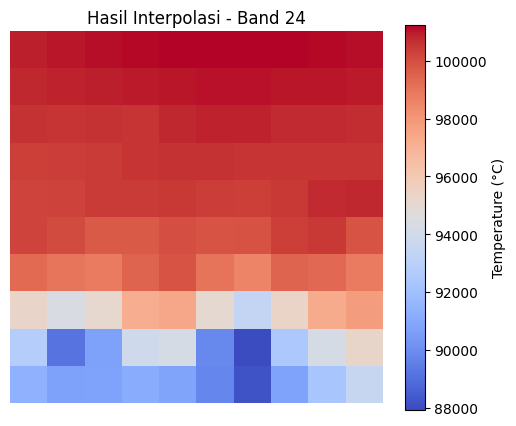

📊 Statistik Band 24 setelah interpolasi:
- Min: 87916.17
- Max: 101246.80
- Mean: 98174.78
- Std Dev: 3788.79
----------------------------------------
🔄 Memproses band ke-25...


Band 25: 100%|██████████| 36/36 [00:01<00:00, 31.24it/s]


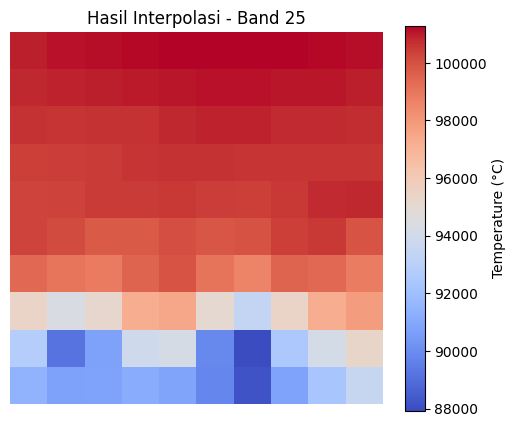

📊 Statistik Band 25 setelah interpolasi:
- Min: 87928.72
- Max: 101291.00
- Mean: 98211.30
- Std Dev: 3797.47
----------------------------------------
🔄 Memproses band ke-26...


Band 26: 100%|██████████| 36/36 [00:00<00:00, 65.43it/s]


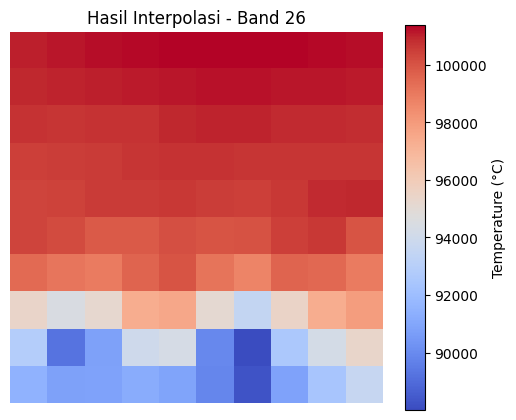

📊 Statistik Band 26 setelah interpolasi:
- Min: 88007.30
- Max: 101378.96
- Mean: 98296.53
- Std Dev: 3801.55
----------------------------------------
🔄 Memproses band ke-27...


Band 27: 100%|██████████| 36/36 [00:00<00:00, 64.31it/s]


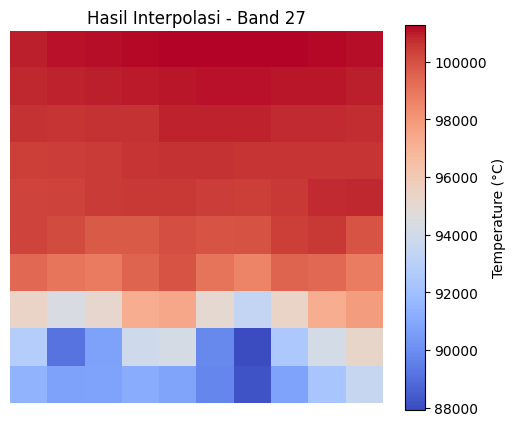

📊 Statistik Band 27 setelah interpolasi:
- Min: 87918.51
- Max: 101271.93
- Mean: 98195.32
- Std Dev: 3795.54
----------------------------------------
🔄 Memproses band ke-28...


Band 28: 100%|██████████| 36/36 [00:00<00:00, 44.49it/s]


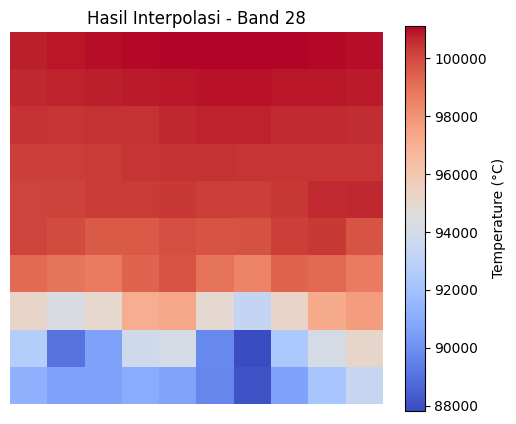

📊 Statistik Band 28 setelah interpolasi:
- Min: 87823.00
- Max: 101126.18
- Mean: 98060.78
- Std Dev: 3782.61
----------------------------------------
🔄 Memproses band ke-29...


Band 29: 100%|██████████| 36/36 [00:00<00:00, 156.18it/s]


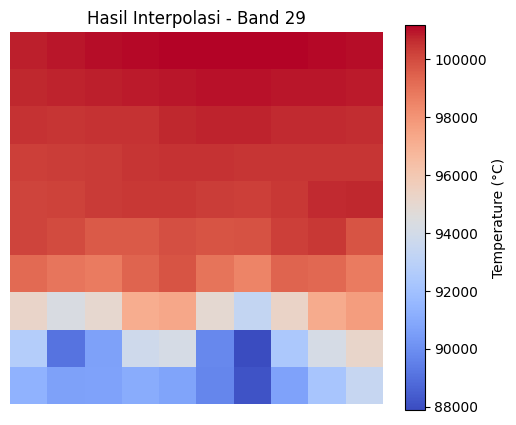

📊 Statistik Band 29 setelah interpolasi:
- Min: 87862.57
- Max: 101161.19
- Mean: 98097.87
- Std Dev: 3781.10
----------------------------------------
🔄 Memproses band ke-30...


Band 30: 100%|██████████| 36/36 [00:00<00:00, 174.37it/s]


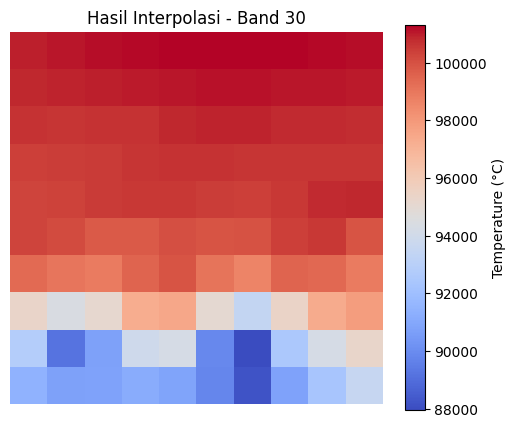

📊 Statistik Band 30 setelah interpolasi:
- Min: 87945.74
- Max: 101298.81
- Mean: 98221.86
- Std Dev: 3797.02
----------------------------------------
🔄 Memproses band ke-31...


Band 31: 100%|██████████| 36/36 [00:00<00:00, 92.58it/s]


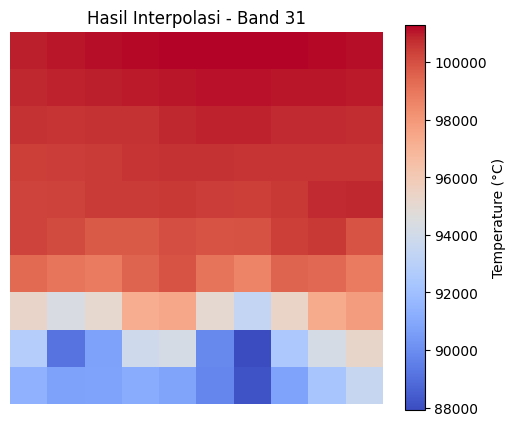

📊 Statistik Band 31 setelah interpolasi:
- Min: 87909.06
- Max: 101288.47
- Mean: 98205.46
- Std Dev: 3804.10
----------------------------------------
🔄 Memproses band ke-32...


Band 32: 100%|██████████| 36/36 [00:01<00:00, 29.42it/s]


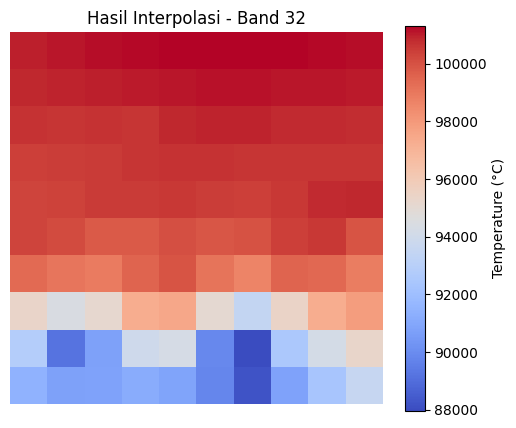

📊 Statistik Band 32 setelah interpolasi:
- Min: 87959.40
- Max: 101320.06
- Mean: 98237.60
- Std Dev: 3799.42
----------------------------------------
🔄 Memproses band ke-33...


Band 33: 100%|██████████| 36/36 [00:00<00:00, 68.45it/s]


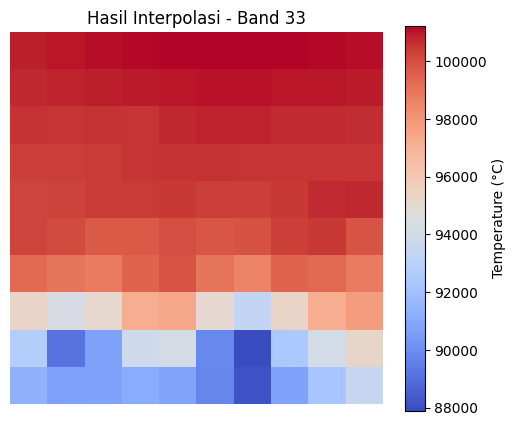

📊 Statistik Band 33 setelah interpolasi:
- Min: 87894.28
- Max: 101232.54
- Mean: 98156.64
- Std Dev: 3791.87
----------------------------------------
🔄 Memproses band ke-34...


Band 34: 100%|██████████| 36/36 [00:01<00:00, 21.83it/s]


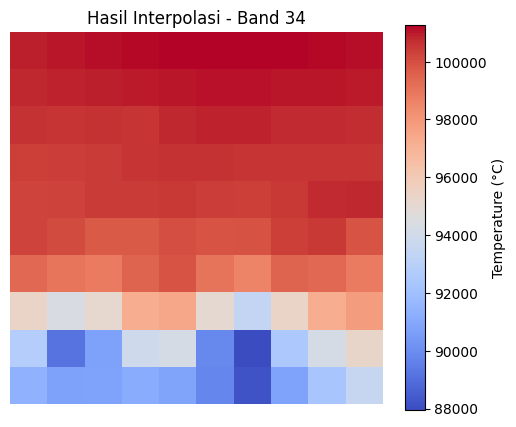

📊 Statistik Band 34 setelah interpolasi:
- Min: 87935.97
- Max: 101255.45
- Mean: 98185.76
- Std Dev: 3785.58
----------------------------------------
🔄 Memproses band ke-35...


Band 35: 100%|██████████| 36/36 [00:01<00:00, 32.28it/s]


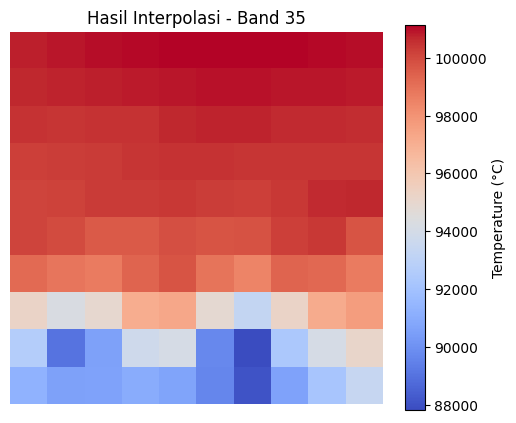

📊 Statistik Band 35 setelah interpolasi:
- Min: 87800.97
- Max: 101127.21
- Mean: 98056.70
- Std Dev: 3788.24
----------------------------------------
🔄 Memproses band ke-36...


Band 36: 100%|██████████| 36/36 [00:00<00:00, 62.97it/s]


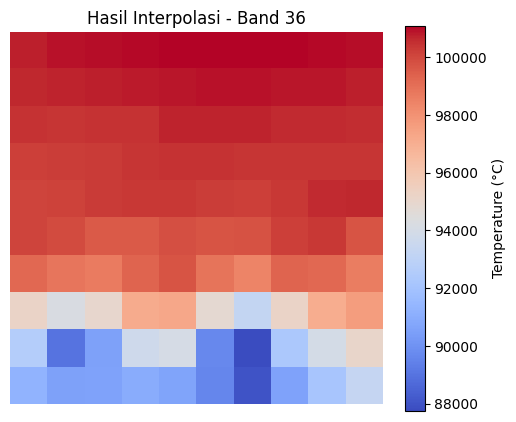

📊 Statistik Band 36 setelah interpolasi:
- Min: 87755.30
- Max: 101096.89
- Mean: 98022.60
- Std Dev: 3791.45
----------------------------------------
✅ Semua band berhasil diinterpolasi dan disimpan ke /content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/SP_EXPORT/ERA5_SP_Monthly_2022_2024_NaN_Interpolated.tif


In [ ]:
import numpy as np
import rasterio
from rasterio.plot import show
from pykrige.ok import OrdinaryKriging
from tqdm import tqdm


# ----------------------------------
# INTERPOLATE MISSING VALUE 36 BULAN
# -----------------------------------

file_path = '/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/SP_EXPORT/ERA5_SP_Monthly_2022_2024.tif'
with rasterio.open(file_path) as src:
    profile = src.profile
    transform = src.transform
    all_data = []

    for i in range(1, src.count + 1):  # Loop through 36 bands
        print(f"🔄 Memproses band ke-{i}...")
        data = src.read(i)
        rows, cols = np.where(~np.isnan(data))
        z = data[rows, cols]

        if len(z) == 0:
            print(f"⚠️ Band {i} tidak memiliki data valid. Lewat.")
            all_data.append(data)
            continue

        x_coords, y_coords = rasterio.transform.xy(transform, rows, cols)

        ok = OrdinaryKriging(
            x_coords, y_coords, z,
            variogram_model='linear',
            verbose=False,
            enable_plotting=False
        )

        nan_rows, nan_cols = np.where(np.isnan(data))
        x_nan, y_nan = rasterio.transform.xy(transform, nan_rows, nan_cols)

        z_nan = []
        for x, y in tqdm(zip(x_nan, y_nan), total=len(x_nan), desc=f'Band {i}'):
            z_, _ = ok.execute('points', x, y)
            z_nan.append(z_[0])

        z_nan = np.array(z_nan)
        data[nan_rows, nan_cols] = z_nan


        # Tampilkan visualisasi hasil interpolasi
        plt.figure(figsize=(6, 5))
        plt.imshow(data, cmap='coolwarm')
        plt.colorbar(label='Temperature (°C)')
        plt.title(f'Hasil Interpolasi - Band {i}')
        plt.axis('off')
        plt.show()

        # Statistik dasar
        print(f"📊 Statistik Band {i} setelah interpolasi:")
        print(f"- Min: {np.nanmin(data):.2f}")
        print(f"- Max: {np.nanmax(data):.2f}")
        print(f"- Mean: {np.nanmean(data):.2f}")
        print(f"- Std Dev: {np.nanstd(data):.2f}")
        print("-" * 40)

        all_data.append(data) # Fixed indentation

# Simpan semua band
output_path = file_path.replace('.tif', '_NaN_Interpolated.tif')
profile.update(count=36)

with rasterio.open(output_path, 'w', **profile) as dst:
    for i, band_data in enumerate(all_data, start=1):
        dst.write(band_data, i)

print(f"✅ Semua band berhasil diinterpolasi dan disimpan ke {output_path}")

In [ ]:
#-------------------------
# INFORMASI NAN Interpolate
#-------------------------

import rasterio
import numpy as np
import pandas as pd

# 1. Buka file TIFF
tif_path = '/content/drive/MyDrive/SP_EXPORT/ERA5_SP_Monthly_2022_2024_NaN.tif'
with rasterio.open(tif_path) as src:
    data = src.read()  # (bands, height, width)
    profile = src.profile

# 2. Siapkan list bulan (label)
start_year = 2022
start_month = 1
labels = []
for i in range(36):
    year = start_year + (start_month + i - 1) // 12
    month = (start_month + i - 1) % 12 + 1
    labels.append(f"{year:04d}-{month:02d}")

# 3. Hitung valid_ratio dan missing_ratio
valid_ratios = []
missing_ratios_percent = []

for i in range(data.shape[0]):  # untuk tiap band
    band = data[i, :, :]
    total_pixels = band.size
    valid_pixels = np.count_nonzero(~np.isnan(band))
    valid_ratio = valid_pixels / total_pixels
    missing_ratio = 1.0 - valid_ratio

    valid_ratios.append(valid_ratio)
    missing_ratios_percent.append(missing_ratio * 100)

# 4. Buat dataframe ringkasan
summary_df = pd.DataFrame({
    'label': labels,
    'valid_ratio': valid_ratios,
    'missing_ratio_percent': missing_ratios_percent
})

# 5. Tampilkan
print(summary_df)

      label  valid_ratio  missing_ratio_percent
0   2022-01          1.0                    0.0
1   2022-02          1.0                    0.0
2   2022-03          1.0                    0.0
3   2022-04          1.0                    0.0
4   2022-05          1.0                    0.0
5   2022-06          1.0                    0.0
6   2022-07          1.0                    0.0
7   2022-08          1.0                    0.0
8   2022-09          1.0                    0.0
9   2022-10          1.0                    0.0
10  2022-11          1.0                    0.0
11  2022-12          1.0                    0.0
12  2023-01          1.0                    0.0
13  2023-02          1.0                    0.0
14  2023-03          1.0                    0.0
15  2023-04          1.0                    0.0
16  2023-05          1.0                    0.0
17  2023-06          1.0                    0.0
18  2023-07          1.0                    0.0
19  2023-08          1.0                

✅ ERA5_SP_Monthly_2022_2024_NaN_Interpolated.tif - Resampled dengan NoData: nan


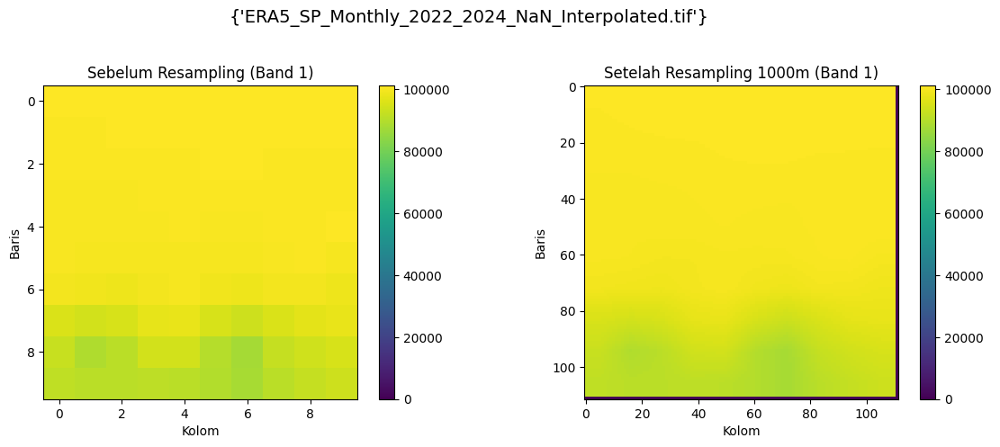

📊 Hasil evaluasi 36 band disimpan di: /content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/SP_EXPORT/DOWNSCALED/eval_all_bands.csv


In [ ]:
#-------------------
# Downscaling Multi-Band (36 Band)
#-------------------

import rasterio
from rasterio.enums import Resampling
from rasterio.warp import calculate_default_transform, reproject
import matplotlib.pyplot as plt
import numpy as np
import os
from glob import glob
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from skimage.transform import resize
import pandas as pd

# Visualisasi sebelum dan sesudah resampling untuk band pertama
def visualize_comparison(before_array, after_array, title):
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))
    cmap = 'viridis'

    # Ambil band pertama untuk visualisasi
    before_band = np.ma.masked_invalid(before_array[0])
    after_band = np.ma.masked_invalid(after_array[0])

    vmin = min(np.nanmin(before_band), np.nanmin(after_band))
    vmax = max(np.nanmax(before_band), np.nanmax(after_band))

    im1 = axs[0].imshow(before_band, cmap=cmap, vmin=vmin, vmax=vmax)
    axs[0].set_title("Sebelum Resampling (Band 1)")
    axs[0].set_xlabel("Kolom")
    axs[0].set_ylabel("Baris")
    plt.colorbar(im1, ax=axs[0], orientation="vertical", fraction=0.05)

    im2 = axs[1].imshow(after_band, cmap=cmap, vmin=vmin, vmax=vmax)
    axs[1].set_title("Setelah Resampling 1000m (Band 1)")
    axs[1].set_xlabel("Kolom")
    axs[1].set_ylabel("Baris")
    plt.colorbar(im2, ax=axs[1], orientation="vertical", fraction=0.05)

    plt.suptitle(title, fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Evaluasi statistik untuk semua band
def evaluate_stats_all_bands(before, after, filename):
    results = []
    for band_idx in range(before.shape[0]):
        before_band = before[band_idx]
        after_band = after[band_idx]

        # Resize untuk matching shape
        after_resized = resize(after_band, before_band.shape,
                             order=1, preserve_range=True,
                             anti_aliasing=False)

        mask = ~np.isnan(before_band) & ~np.isnan(after_resized)

        if np.count_nonzero(mask) == 0:
            print(f"⚠️ {filename} Band {band_idx+1} tidak dapat dievaluasi")
            continue

        y_true = before_band[mask]
        y_pred = after_resized[mask]

        mse = mean_squared_error(y_true, y_pred)
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(y_true, y_pred)
        r2 = r2_score(y_true, y_pred)

        results.append({
            "Filename": filename,
            "Band": band_idx+1,
            "RMSE": rmse,
            "MSE": mse,
            "MAE": mae,
            "R2": r2
        })

    return results

# Fungsi resampling untuk semua band
def resample_raster_to_1km_all_bands(input_path, output_path, visualize=True):
    with rasterio.open(input_path) as src:
        # Baca semua band
        src_nodata = src.nodata if src.nodata is not None else np.nan
        src_array = src.read()  # Shape: (bands, rows, cols)
        src_array = np.where(src_array == src_nodata, np.nan, src_array)
        src_transform = src.transform
        src_crs = src.crs
        src_bounds = src.bounds

        # Hitung transformasi output
        dst_transform, width, height = calculate_default_transform(
            src_crs, src_crs,
            src.width, src.height,
            *src_bounds,
            resolution=1000
        )

        # Siapkan array output
        dst_array = np.full((src.count, height, width), np.nan, dtype=src.dtypes[0])

        # Update metadata
        kwargs = src.meta.copy()
        kwargs.update({
            'driver': 'GTiff',
            'count': src.count,
            'crs': src_crs,
            'transform': dst_transform,
            'width': width,
            'height': height,
            'nodata': src_nodata
        })

        # Proses resampling per band
        with rasterio.open(output_path, 'w', **kwargs) as dst:
            dst_array = np.empty((src.count, height, width), dtype=src.dtypes[0])

            for band in range(src.count):
                reproject(
                    source=src_array[band],
                    destination=dst_array[band],
                    src_transform=src_transform,
                    src_crs=src_crs,
                    dst_transform=dst_transform,
                    dst_crs=src_crs,
                    resampling=Resampling.bilinear
                )
                dst.write(dst_array[band], band+1)

    print(f"✅ {os.path.basename(input_path)} - Resampled dengan NoData: {src_nodata}")

    if visualize:
        visualize_comparison(src_array, dst_array,
                           {os.path.basename(input_path)})

    return src_array, dst_array

# Batch Processing untuk semua file
input_folder = "/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/SP_EXPORT/NAN"
output_folder = "/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/SP_EXPORT/DOWNSCALED"
os.makedirs(output_folder, exist_ok=True)

raster_files = glob(os.path.join(input_folder, "*.tif"))
all_results = []

for raster_file in raster_files:
    filename = os.path.basename(raster_file)
    output_path = os.path.join(output_folder, f"{os.path.splitext(filename)[0]}_1km.tif")

    # Proses resampling
    before, after = resample_raster_to_1km_all_bands(raster_file, output_path)

    # Evaluasi
    stats = evaluate_stats_all_bands(before, after, filename)
    all_results.extend(stats)

# Simpan hasil evaluasi
df = pd.DataFrame(all_results)
csv_path = os.path.join(output_folder, "eval_all_bands.csv")
df.to_csv(csv_path, index=False)
print(f"📊 Hasil evaluasi 36 band disimpan di: {csv_path}")

In [ ]:
#-------------------------
# INFORMASI NAN Downscale
#-------------------------

import rasterio
import numpy as np
import pandas as pd

# 1. Buka file TIFF
tif_path = '/content/drive/MyDrive/SP_EXPORT/ERA5_SP_Monthly_2022_2024_1KM/ERA5_SP_Monthly_2022_2024_NaN_resampled.tif'
with rasterio.open(tif_path) as src:
    data = src.read()  # (bands, height, width)
    profile = src.profile

# 2. Siapkan list bulan (label)
start_year = 2022
start_month = 1
labels = []
for i in range(36):
    year = start_year + (start_month + i - 1) // 12
    month = (start_month + i - 1) % 12 + 1
    labels.append(f"{year:04d}-{month:02d}")

# 3. Hitung valid_ratio dan missing_ratio
valid_ratios = []
missing_ratios_percent = []

for i in range(data.shape[0]):  # untuk tiap band
    band = data[i, :, :]
    total_pixels = band.size
    valid_pixels = np.count_nonzero(~np.isnan(band))
    valid_ratio = valid_pixels / total_pixels
    missing_ratio = 1.0 - valid_ratio

    valid_ratios.append(valid_ratio)
    missing_ratios_percent.append(missing_ratio * 100)

# 4. Buat dataframe ringkasan
summary_df = pd.DataFrame({
    'label': labels,
    'valid_ratio': valid_ratios,
    'missing_ratio_percent': missing_ratios_percent
})

# 5. Tampilkan
print(summary_df)

      label  valid_ratio  missing_ratio_percent
0   2022-01          1.0                    0.0
1   2022-02          1.0                    0.0
2   2022-03          1.0                    0.0
3   2022-04          1.0                    0.0
4   2022-05          1.0                    0.0
5   2022-06          1.0                    0.0
6   2022-07          1.0                    0.0
7   2022-08          1.0                    0.0
8   2022-09          1.0                    0.0
9   2022-10          1.0                    0.0
10  2022-11          1.0                    0.0
11  2022-12          1.0                    0.0
12  2023-01          1.0                    0.0
13  2023-02          1.0                    0.0
14  2023-03          1.0                    0.0
15  2023-04          1.0                    0.0
16  2023-05          1.0                    0.0
17  2023-06          1.0                    0.0
18  2023-07          1.0                    0.0
19  2023-08          1.0                

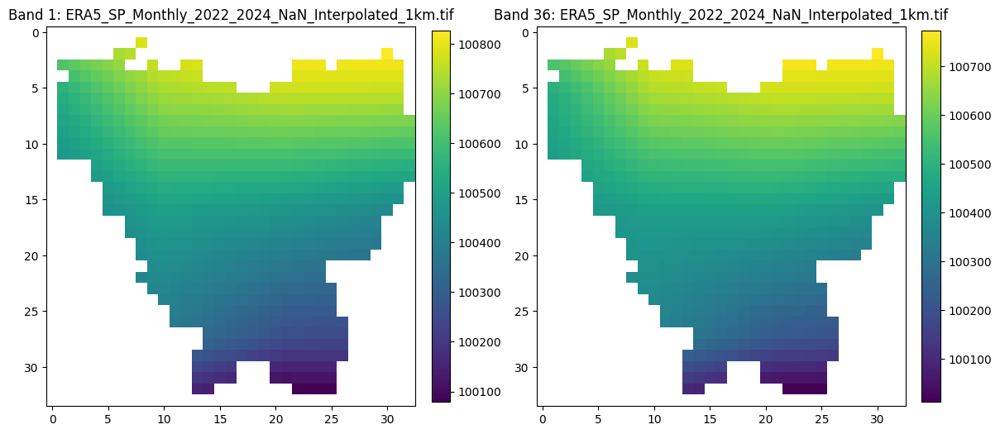

✅ Processed multiband: ERA5_SP_Monthly_2022_2024_NaN_Interpolated_1km.tif


In [ ]:
#-------------------------
# CLIP DOWNSCALED (MULTIBAND)
#-------------------------
import rasterio
from rasterio.mask import mask
import geopandas as gpd
import numpy as np
import os
from glob import glob
import matplotlib.pyplot as plt

# === 1. BACA SHAPEFILE BATAS ADMINISTRASI ===
shapefile_path = '/content/drive/MyDrive/PENGOLAHAN/DKI Jakarta/DKI Jakarta.shp'
gdf = gpd.read_file(shapefile_path)

# === 2. DAFTAR SEMUA FILE RASTER YANG MAU DIOLAH ===
input_folder = '/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/SP_EXPORT/DOWNSCALED'  # folder berisi hasil resampling
output_folder = '/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/SP_EXPORT/CLIP'
os.makedirs(output_folder, exist_ok=True)
raster_files = sorted(glob(os.path.join(input_folder, '*.tif')))

# === 3. LOOP UNTUK SETIAP FILE RASTER ===
for raster_path in raster_files:
    with rasterio.open(raster_path) as src:
        raster_data = src.read()  # ⬅️ Ambil semua band (multiband)
        raster_meta = src.meta.copy()

        # Cek dan samakan CRS shapefile
        if gdf.crs != src.crs:
            gdf = gdf.to_crs(src.crs)

        # Gunakan nilai nodata asli
        nodata_value = src.nodata

        # Crop dan mask semua band
        out_image, out_transform = mask(
            src,
            gdf.geometry,
            crop=True,
            nodata=nodata_value
        )

        # Update metadata
        out_meta = raster_meta.copy()
        out_meta.update({
            "driver": "GTiff",
            "height": out_image.shape[1],
            "width": out_image.shape[2],
            "count": out_image.shape[0],  # ⬅️ Total band
            "transform": out_transform,
            "nodata": nodata_value
        })

        # Nama file output
        filename = os.path.basename(raster_path)
        output_path = os.path.join(output_folder, f"Jakarta_{filename}")

        # Simpan hasil raster clipped
        with rasterio.open(output_path, "w", **out_meta) as dest:
            dest.write(out_image)

        # === VISUALISASI: Band 1 & terakhir ===
        fig, ax = plt.subplots(1, 2, figsize=(12, 6))
        im1 = ax[0].imshow(out_image[0], cmap='viridis')
        ax[0].set_title(f"Band 1: {filename}")
        plt.colorbar(im1, ax=ax[0], fraction=0.046, pad=0.04)

        im2 = ax[1].imshow(out_image[-1], cmap='viridis')
        ax[1].set_title(f"Band {out_image.shape[0]}: {filename}")
        plt.colorbar(im2, ax=ax[1], fraction=0.046, pad=0.04)

        plt.tight_layout()
        plt.show()

    print(f"✅ Processed multiband: {filename}")


In [ ]:
#-------------------------
# INFORMASI NAN CLIP
#-------------------------

import rasterio
import numpy as np
import pandas as pd

# 1. Buka file TIFF
tif_path = '/content/drive/MyDrive/SP_EXPORT/sp_monthly_clip/Jakarta_ERA5_SP_Monthly_2022_2024_NaN_resampled.tif'
with rasterio.open(tif_path) as src:
    data = src.read()  # (bands, height, width)
    profile = src.profile

# 2. Siapkan list bulan (label)
start_year = 2022
start_month = 1
labels = []
for i in range(36):
    year = start_year + (start_month + i - 1) // 12
    month = (start_month + i - 1) % 12 + 1
    labels.append(f"{year:04d}-{month:02d}")

# 3. Hitung valid_ratio dan missing_ratio
valid_ratios = []
missing_ratios_percent = []

for i in range(data.shape[0]):  # untuk tiap band
    band = data[i, :, :]
    total_pixels = band.size
    valid_pixels = np.count_nonzero(~np.isnan(band))
    valid_ratio = valid_pixels / total_pixels
    missing_ratio = 1.0 - valid_ratio

    valid_ratios.append(valid_ratio)
    missing_ratios_percent.append(missing_ratio * 100)

# 4. Buat dataframe ringkasan
summary_df = pd.DataFrame({
    'label': labels,
    'valid_ratio': valid_ratios,
    'missing_ratio_percent': missing_ratios_percent
})

# 5. Tampilkan
print(summary_df)

      label  valid_ratio  missing_ratio_percent
0   2022-01          1.0                    0.0
1   2022-02          1.0                    0.0
2   2022-03          1.0                    0.0
3   2022-04          1.0                    0.0
4   2022-05          1.0                    0.0
5   2022-06          1.0                    0.0
6   2022-07          1.0                    0.0
7   2022-08          1.0                    0.0
8   2022-09          1.0                    0.0
9   2022-10          1.0                    0.0
10  2022-11          1.0                    0.0
11  2022-12          1.0                    0.0
12  2023-01          1.0                    0.0
13  2023-02          1.0                    0.0
14  2023-03          1.0                    0.0
15  2023-04          1.0                    0.0
16  2023-05          1.0                    0.0
17  2023-06          1.0                    0.0
18  2023-07          1.0                    0.0
19  2023-08          1.0                

# GEE Version Surface Net Solar Radiation

In [ ]:
#-------------------
# PENGUNDUHAN
#-------------------

import ee
import geemap

# Inisialisasi Earth Engine
ee.Authenticate()
ee.Initialize(project='ee-sidangapril2024')

# Definisikan Area of Interest (AOI)
AOI = ee.FeatureCollection("projects/ee-sidangapril2024/assets/JABODETABEK")

# Koleksi ERA5-Land hourly
era5_collection = ee.ImageCollection('ECMWF/ERA5_LAND/HOURLY')

# Rentang waktu: Januari 2022 - Desember 2024 (sesuaikan jika perlu)
start_date = ee.Date('2022-01-01')
end_date = ee.Date('2025-01-01')

# Buat list bulan
months = ee.List.sequence(0, end_date.difference(start_date, 'month'))

# Fungsi untuk menghitung rata-rata bulanan
def calculate_monthly_mean(month_offset):
    start = start_date.advance(month_offset, 'month')
    end = start.advance(1, 'month')
    year_month = start.format('YYYY-MM')
    filtered_collection = era5_collection.filterDate(start, end)
    surface_net_solar_radiation = filtered_collection.select('surface_net_solar_radiation') \
        .mean() \
        .clip(AOI) \
        .rename([year_month]) \
        .set('system:time_start', start.millis())
    return surface_net_solar_radiation

# Hitung rata-rata bulanan untuk setiap bulan
monthly_means = months.map(calculate_monthly_mean)
multi_band_image = ee.ImageCollection(monthly_means).toBands()

# Gabungkan menjadi ImageCollection
monthly_collection = ee.ImageCollection(monthly_means)

# Visualisasi (contoh untuk bulan pertama)
first_month_mean = monthly_collection.first()
vis_params = {
    'min': 95000,  # minimum surface pressure dalam Pa
    'max': 105000,
    'palette': ['blue', 'green', 'yellow', 'red']
}

Map = geemap.Map()
Map.centerObject(AOI, 8)
Map.addLayer(first_month_mean, vis_params, 'surface net solar radiation')
Map.addLayer(AOI, {}, 'AOI')
Map

Map(center=[-6.375912206265441, 106.80576119247223], controls=(WidgetControl(options=['position', 'transparent…

In [ ]:
#-------------------------
# PENGUNDUHAN (AKUMULASI)
#-------------------------

import ee
import geemap

# Inisialisasi Earth Engine
ee.Authenticate()
ee.Initialize(project='ee-sidangapril2024')

# Definisikan Area of Interest (AOI)
AOI = ee.FeatureCollection("projects/ee-sidangapril2024/assets/JABODETABEK")

# Koleksi ERA5-Land hourly
era5_collection = ee.ImageCollection('ECMWF/ERA5_LAND/HOURLY')

# Rentang waktu: Januari 2022 - Desember 2024
start_date = ee.Date('2022-01-01')
end_date = ee.Date('2025-01-01')

# === 1. Fungsi untuk akumulasi harian ===
def daily_accumulation(day_offset):
    date = start_date.advance(day_offset, 'day')
    next_date = date.advance(1, 'day')
    daily_sum = era5_collection.filterDate(date, next_date) \
        .select('surface_net_solar_radiation') \
        .sum() \
        .clip(AOI) \
        .set('system:time_start', date.millis()) \
        .set('date_str', date.format('YYYY-MM-dd'))
    return daily_sum

# === 2. Buat koleksi data harian ===
n_days = end_date.difference(start_date, 'day')
day_indices = ee.List.sequence(0, n_days.subtract(1))
daily_collection = ee.ImageCollection(day_indices.map(daily_accumulation))

# === 3. Fungsi untuk akumulasi bulanan dari data harian ===
def monthly_from_daily(month_offset):
    month_start = start_date.advance(month_offset, 'month')
    month_end = month_start.advance(1, 'month')
    label = month_start.format('YYYY-MM')
    monthly_sum = daily_collection.filterDate(month_start, month_end) \
        .sum() \
        .clip(AOI) \
        .rename([label]) \
        .set('system:time_start', month_start.millis())
    return monthly_sum

# === 4. Buat koleksi bulanan dari hasil akumulasi harian ===
n_months = end_date.difference(start_date, 'month')
month_indices = ee.List.sequence(0, n_months.subtract(1))
monthly_collection = ee.ImageCollection(month_indices.map(monthly_from_daily))

# === 5. Visualisasi contoh (bulan pertama)
first_month = monthly_collection.first()
vis_params = {
    'min': 0.0,
    'max': 0.5,  # sesuaikan sesuai sebaran nilainya
    'palette': ['white', 'blue', 'green', 'yellow', 'red']
}

Map = geemap.Map()
Map.centerObject(AOI, 8)
Map.addLayer(first_month, vis_params, 'Monthly SSR')
Map.addLayer(AOI, {}, 'AOI')
Map

# Buat ImageCollection bulanan
multi_band_image = monthly_collection.toBands()


# -------------------
# PENYIMPANAN
# -------------------

# Export ke Google Drive
task = ee.batch.Export.image.toDrive(
    image=multi_band_image,
    description='monthly_ssr',
    folder='ssr_EXPORT',
    fileNamePrefix='ERA5_ssr_Monthly_2022_2024',
    region=AOI.geometry(),
    scale=11132,
    crs='EPSG:32748',
    maxPixels=1e13
)
task.start()


In [ ]:
# Buat ImageCollection bulanan
multi_band_image = monthly_collection.toBands()


# -------------------
# PENYIMPANAN
# -------------------

# Export ke Google Drive
task = ee.batch.Export.image.toDrive(
    image=multi_band_image,
    description='monthly_ssr',
    folder='ssr_EXPORT',
    fileNamePrefix='ERA5_ssr_Monthly_2022_2024',
    region=AOI.geometry(),
    scale=11132,
    crs='EPSG:32748',
    maxPixels=1e13
)
task.start()


In [ ]:
#-------------------------
# INFORMASI NAN Awal
#-------------------------

import rasterio
import numpy as np
import pandas as pd

# 1. Buka file TIFF
tif_path = '/content/drive/MyDrive/SSR_EXPORT/ERA5_SSR_Monthly_2022_2024.tif'
with rasterio.open(tif_path) as src:
    data = src.read()  # (bands, height, width)
    profile = src.profile

# 2. Siapkan list bulan (label)
start_year = 2022
start_month = 1
labels = []
for i in range(36):
    year = start_year + (start_month + i - 1) // 12
    month = (start_month + i - 1) % 12 + 1
    labels.append(f"{year:04d}-{month:02d}")

# 3. Hitung valid_ratio dan missing_ratio
valid_ratios = []
missing_ratios_percent = []

for i in range(data.shape[0]):  # untuk tiap band
    band = data[i, :, :]
    total_pixels = band.size
    valid_pixels = np.count_nonzero(~np.isnan(band))
    valid_ratio = valid_pixels / total_pixels
    missing_ratio = 1.0 - valid_ratio

    valid_ratios.append(valid_ratio)
    missing_ratios_percent.append(missing_ratio * 100)

# 4. Buat dataframe ringkasan
summary_df = pd.DataFrame({
    'label': labels,
    'valid_ratio': valid_ratios,
    'missing_ratio_percent': missing_ratios_percent
})

# 5. Tampilkan
print(summary_df)

      label  valid_ratio  missing_ratio_percent
0   2022-01         0.64                   36.0
1   2022-02         0.64                   36.0
2   2022-03         0.74                   26.0
3   2022-04         0.64                   36.0
4   2022-05         0.64                   36.0
5   2022-06         0.64                   36.0
6   2022-07         0.64                   36.0
7   2022-08         0.64                   36.0
8   2022-09         0.74                   26.0
9   2022-10         0.74                   26.0
10  2022-11         0.64                   36.0
11  2022-12         0.64                   36.0
12  2023-01         0.64                   36.0
13  2023-02         0.64                   36.0
14  2023-03         0.74                   26.0
15  2023-04         0.64                   36.0
16  2023-05         0.64                   36.0
17  2023-06         0.64                   36.0
18  2023-07         0.64                   36.0
19  2023-08         0.64                

In [ ]:
#-------------------
# INFORMASI MISSING
#-------------------

# Step 1: Tambahkan label (YYYY-MM) dan valid_ratio ke setiap image

def add_valid_ratio(image):
    band_name = 'ssr'  # Ganti dengan nama band yang sesuai

    # Mask menunjukkan piksel valid
    mask = image.mask().gt(0)

    # Hitung luas area valid (m²)
    valid_area_image = mask.multiply(ee.Image.pixelArea())
    area_stats = valid_area_image.reduceRegion(
        reducer=ee.Reducer.sum(),
        geometry=AOI.geometry(),  # jika AOI berupa FeatureCollection
        scale=11132,
        maxPixels=1e13
    )

    # Luas valid & total AOI
    valid_area = ee.Number(area_stats.get(band_name))
    total_area = AOI.geometry().area()

    # Rasio valid dan missing
    valid_ratio = valid_area.divide(total_area)
    missing_ratio = ee.Number(1.0).subtract(valid_ratio)

    # Tambahkan ke metadata image
    image = image.set('valid_ratio', valid_ratio)
    image = image.set('missing_ratio', missing_ratio)  # missing ratio as a number (0-1)
    image = image.set('missing_ratio_percent', missing_ratio.multiply(100))  # missing ratio as percentage
    return image


def calculate_monthly_mean_with_ratio(month_offset):
    start = start_date.advance(month_offset, 'month')
    end = start.advance(1, 'month')
    label = start.format('YYYY-MM')

    filtered = era5_collection.filterDate(start, end)
    monthly_mean = filtered.select('surface_net_solar_radiation') \
        .mean() \
        .clip(AOI) \
        .rename('ssr') \
        .set('label', label)

    # Tambahkan valid_ratio dan missing_ratio
    return add_valid_ratio(monthly_mean)

# Step 2: Buat koleksi dengan rasio valid
monthly_collection = ee.ImageCollection(months.map(calculate_monthly_mean_with_ratio))

# Step 3: Konversi ke FeatureCollection untuk ringkasan
def image_to_feature(image):
    return ee.Feature(None, {
        'label': image.get('label'),
        'valid_ratio': image.get('valid_ratio'),
        'missing_ratio_percent': image.get('missing_ratio'),
    })

missing_ratio_fc = monthly_collection.map(image_to_feature)

# Step 4: Cetak hasil
print(missing_ratio_fc.aggregate_array('label').getInfo())
print(missing_ratio_fc.aggregate_array('missing_ratio_percent').getInfo())


['2022-01', '2022-02', '2022-03', '2022-04', '2022-05', '2022-06', '2022-07', '2022-08', '2022-09', '2022-10', '2022-11', '2022-12', '2023-01', '2023-02', '2023-03', '2023-04', '2023-05', '2023-06', '2023-07', '2023-08', '2023-09', '2023-10', '2023-11', '2023-12', '2024-01', '2024-02', '2024-03', '2024-04', '2024-05', '2024-06', '2024-07', '2024-08', '2024-09', '2024-10', '2024-11', '2024-12']
[0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.11010779941985649, 0.110107799419

🔄 Memproses band ke-1...


Band 1: 100%|██████████| 36/36 [00:00<00:00, 986.86it/s]


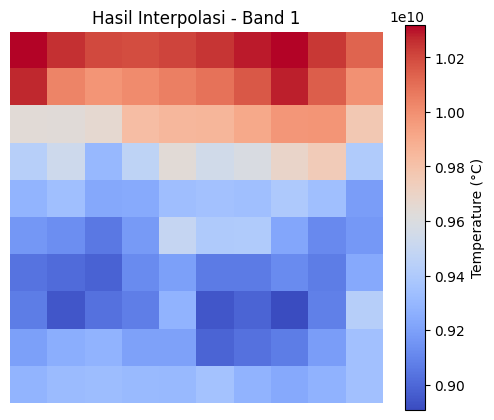

📊 Statistik Band 1 setelah interpolasi:
- Min: 8907365780.00
- Max: 10317881263.33
- Mean: 9485993875.42
- Std Dev: 414089893.62
----------------------------------------
🔄 Memproses band ke-2...


Band 2: 100%|██████████| 36/36 [00:00<00:00, 1084.03it/s]


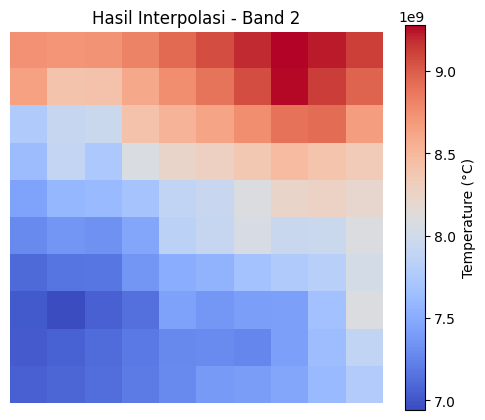

📊 Statistik Band 2 setelah interpolasi:
- Min: 6941957656.75
- Max: 9280302961.29
- Mean: 7953917451.09
- Std Dev: 656976536.96
----------------------------------------
🔄 Memproses band ke-3...


Band 3: 100%|██████████| 26/26 [00:00<00:00, 826.58it/s]


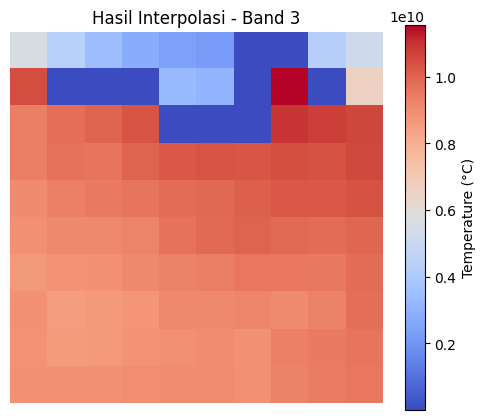

📊 Statistik Band 3 setelah interpolasi:
- Min: 1479852.00
- Max: 11546000181.85
- Mean: 7947278907.28
- Std Dev: 3247403281.62
----------------------------------------
🔄 Memproses band ke-4...


Band 4: 100%|██████████| 36/36 [00:00<00:00, 727.39it/s]


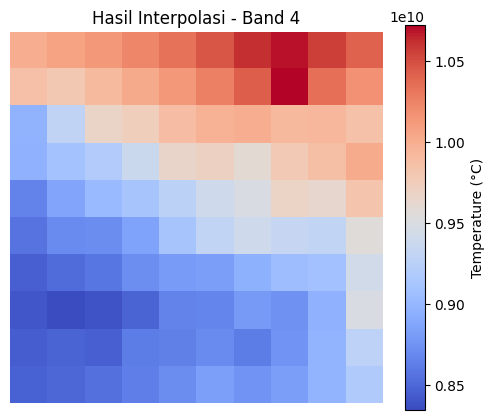

📊 Statistik Band 4 setelah interpolasi:
- Min: 8345002550.75
- Max: 10722666305.75
- Mean: 9312538713.55
- Std Dev: 651781120.18
----------------------------------------
🔄 Memproses band ke-5...


Band 5: 100%|██████████| 36/36 [00:00<00:00, 1036.84it/s]


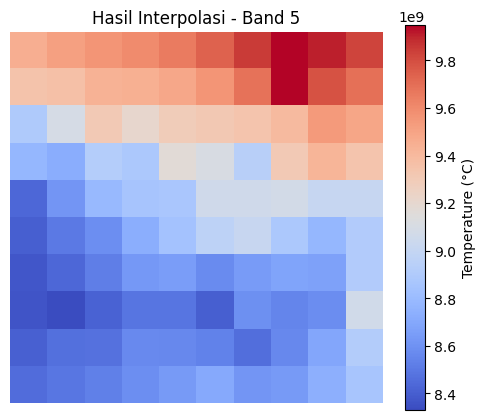

📊 Statistik Band 5 setelah interpolasi:
- Min: 8330058216.75
- Max: 9949230485.76
- Mean: 8959532949.81
- Std Dev: 446679673.92
----------------------------------------
🔄 Memproses band ke-6...


Band 6: 100%|██████████| 36/36 [00:00<00:00, 41.83it/s]


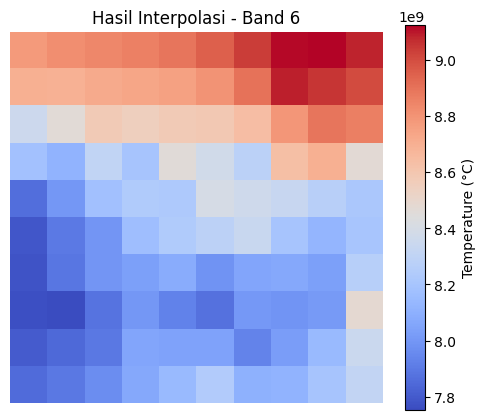

📊 Statistik Band 6 setelah interpolasi:
- Min: 7753079458.75
- Max: 9123859738.39
- Mean: 8322115203.55
- Std Dev: 377530476.68
----------------------------------------
🔄 Memproses band ke-7...


Band 7: 100%|██████████| 36/36 [00:00<00:00, 913.11it/s]


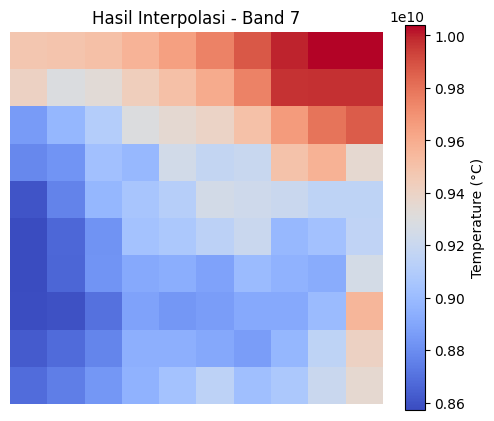

📊 Statistik Band 7 setelah interpolasi:
- Min: 8571368977.25
- Max: 10039040255.83
- Mean: 9163192906.27
- Std Dev: 376643070.61
----------------------------------------
🔄 Memproses band ke-8...


Band 8: 100%|██████████| 36/36 [00:00<00:00, 877.97it/s]


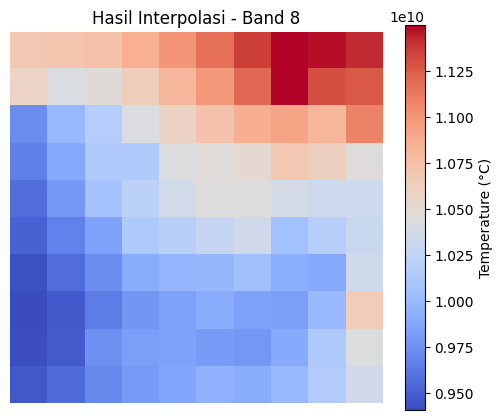

📊 Statistik Band 8 setelah interpolasi:
- Min: 9406640824.80
- Max: 11499185510.00
- Mean: 10252410388.13
- Std Dev: 533345992.98
----------------------------------------
🔄 Memproses band ke-9...


Band 9: 100%|██████████| 26/26 [00:00<00:00, 789.28it/s]


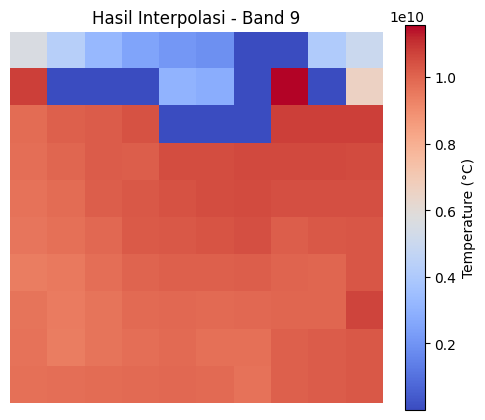

📊 Statistik Band 9 setelah interpolasi:
- Min: 789921.00
- Max: 11560088873.11
- Mean: 8394217587.13
- Std Dev: 3476509161.12
----------------------------------------
🔄 Memproses band ke-10...


Band 10: 100%|██████████| 26/26 [00:00<00:00, 826.86it/s]


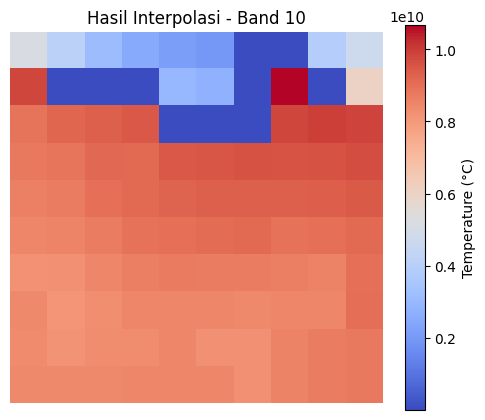

📊 Statistik Band 10 setelah interpolasi:
- Min: 609939.00
- Max: 10672524984.68
- Mean: 7392729816.14
- Std Dev: 3020900317.51
----------------------------------------
🔄 Memproses band ke-11...


Band 11: 100%|██████████| 36/36 [00:00<00:00, 941.77it/s]


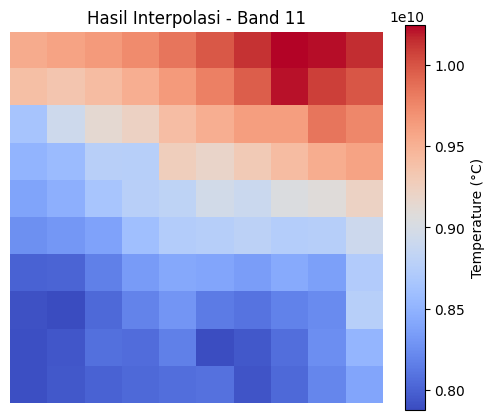

📊 Statistik Band 11 setelah interpolasi:
- Min: 7875485834.25
- Max: 10244942795.65
- Mean: 8818164334.38
- Std Dev: 701487400.05
----------------------------------------
🔄 Memproses band ke-12...


Band 12: 100%|██████████| 36/36 [00:00<00:00, 896.79it/s]


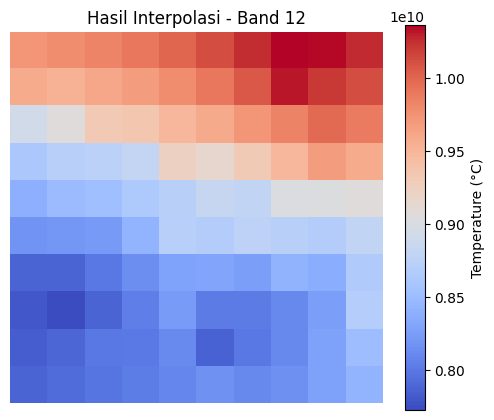

📊 Statistik Band 12 setelah interpolasi:
- Min: 7725558020.25
- Max: 10361831798.02
- Mean: 8832284994.40
- Std Dev: 774010492.78
----------------------------------------
🔄 Memproses band ke-13...


Band 13: 100%|██████████| 36/36 [00:00<00:00, 861.91it/s]


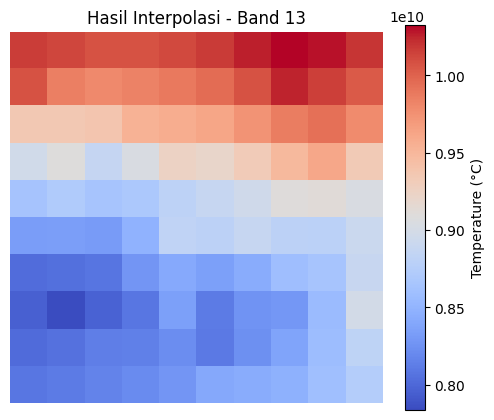

📊 Statistik Band 13 setelah interpolasi:
- Min: 7835418374.25
- Max: 10324921800.55
- Mean: 8973778152.46
- Std Dev: 730656052.76
----------------------------------------
🔄 Memproses band ke-14...


Band 14: 100%|██████████| 36/36 [00:00<00:00, 719.84it/s]


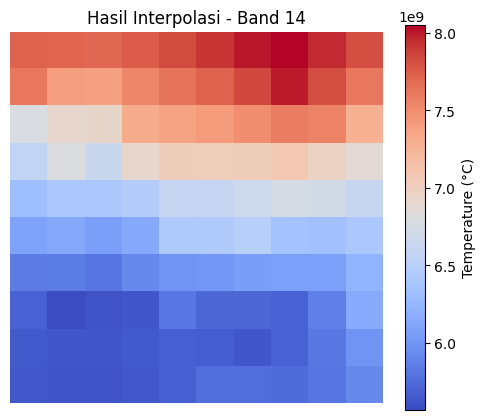

📊 Statistik Band 14 setelah interpolasi:
- Min: 5566203211.25
- Max: 8051549052.24
- Mean: 6566928596.86
- Std Dev: 788307419.81
----------------------------------------
🔄 Memproses band ke-15...


Band 15: 100%|██████████| 26/26 [00:00<00:00, 719.51it/s]


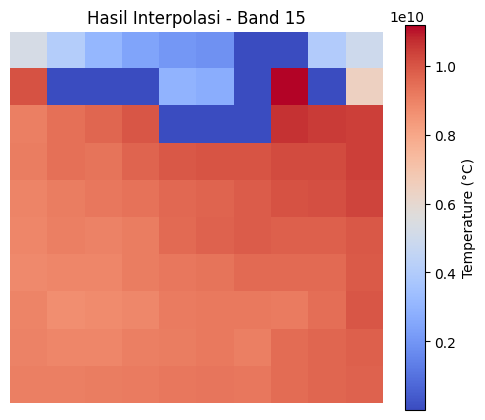

📊 Statistik Band 15 setelah interpolasi:
- Min: 1409859.00
- Max: 11191513349.61
- Mean: 7897329641.05
- Std Dev: 3265473017.75
----------------------------------------
🔄 Memproses band ke-16...


Band 16: 100%|██████████| 36/36 [00:00<00:00, 849.93it/s]


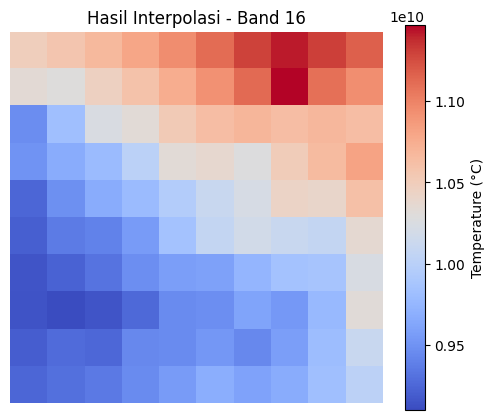

📊 Statistik Band 16 setelah interpolasi:
- Min: 9099498049.25
- Max: 11467173245.25
- Mean: 10029371836.72
- Std Dev: 620893053.40
----------------------------------------
🔄 Memproses band ke-17...


Band 17: 100%|██████████| 36/36 [00:00<00:00, 803.11it/s]


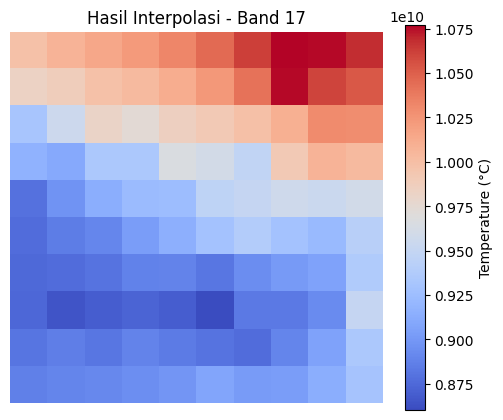

📊 Statistik Band 17 setelah interpolasi:
- Min: 8601751062.75
- Max: 10770856289.04
- Mean: 9420849716.27
- Std Dev: 600821151.90
----------------------------------------
🔄 Memproses band ke-18...


Band 18: 100%|██████████| 36/36 [00:00<00:00, 764.69it/s]


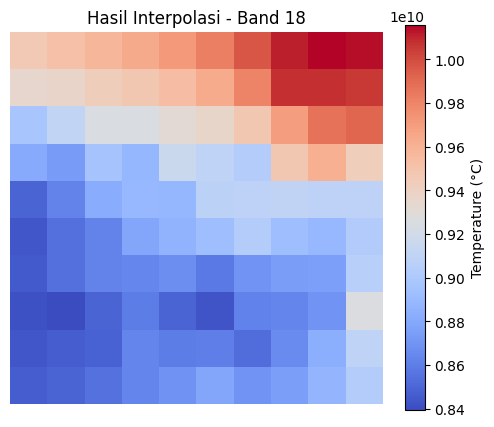

📊 Statistik Band 18 setelah interpolasi:
- Min: 8392775033.00
- Max: 10157784388.91
- Mean: 9035676545.23
- Std Dev: 487330876.33
----------------------------------------
🔄 Memproses band ke-19...


Band 19: 100%|██████████| 36/36 [00:00<00:00, 742.14it/s]


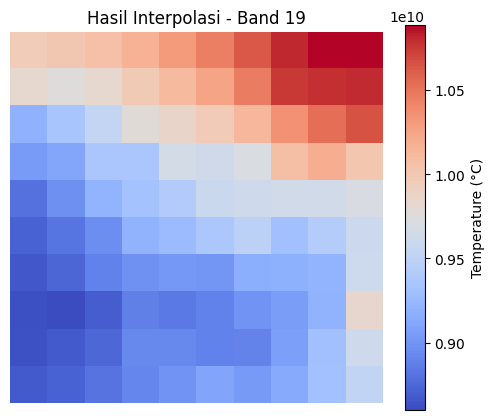

📊 Statistik Band 19 setelah interpolasi:
- Min: 8600056914.50
- Max: 10885764638.96
- Mean: 9483477738.30
- Std Dev: 618962484.99
----------------------------------------
🔄 Memproses band ke-20...


Band 20: 100%|██████████| 36/36 [00:00<00:00, 744.39it/s]


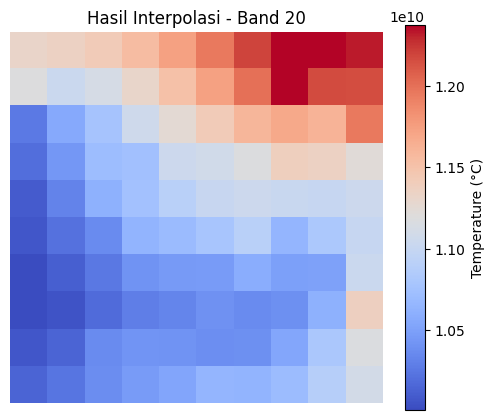

📊 Statistik Band 20 setelah interpolasi:
- Min: 10009990635.25
- Max: 12371384143.77
- Mean: 10893941581.17
- Std Dev: 616393849.13
----------------------------------------
🔄 Memproses band ke-21...


Band 21: 100%|██████████| 26/26 [00:00<00:00, 658.85it/s]


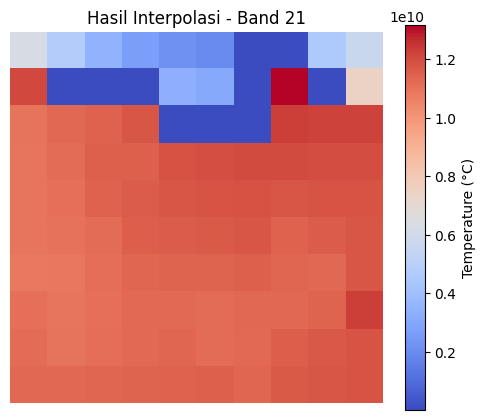

📊 Statistik Band 21 setelah interpolasi:
- Min: 739926.00
- Max: 13164340718.70
- Mean: 9534277713.60
- Std Dev: 3972810531.21
----------------------------------------
🔄 Memproses band ke-22...


Band 22: 100%|██████████| 26/26 [00:00<00:00, 485.19it/s]


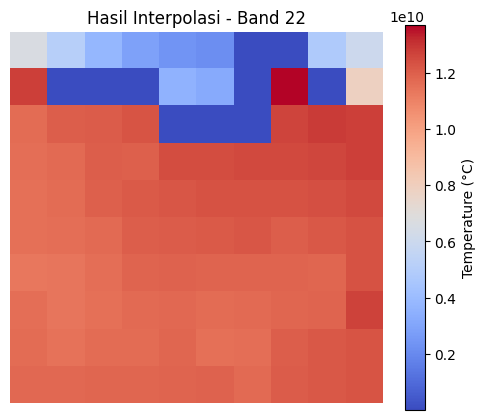

📊 Statistik Band 22 setelah interpolasi:
- Min: 689931.00
- Max: 13690170275.47
- Mean: 9964162289.39
- Std Dev: 4135258079.31
----------------------------------------
🔄 Memproses band ke-23...


Band 23: 100%|██████████| 36/36 [00:00<00:00, 726.40it/s]


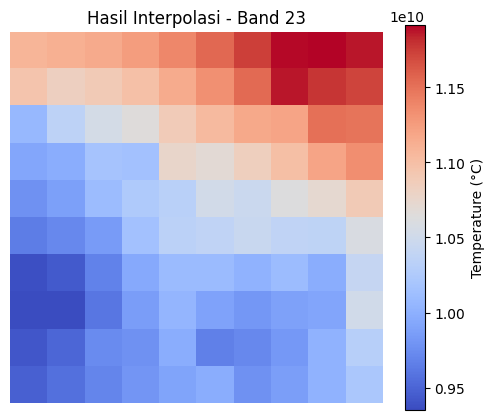

📊 Statistik Band 23 setelah interpolasi:
- Min: 9351152956.48
- Max: 11915238904.65
- Mean: 10420499014.92
- Std Dev: 693131907.15
----------------------------------------
🔄 Memproses band ke-24...


Band 24: 100%|██████████| 36/36 [00:00<00:00, 707.47it/s]


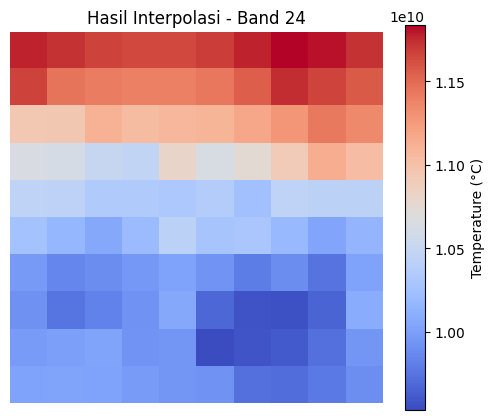

📊 Statistik Band 24 setelah interpolasi:
- Min: 9532951787.50
- Max: 11838164199.28
- Mean: 10518981413.50
- Std Dev: 704867389.00
----------------------------------------
🔄 Memproses band ke-25...


Band 25: 100%|██████████| 36/36 [00:00<00:00, 728.27it/s]


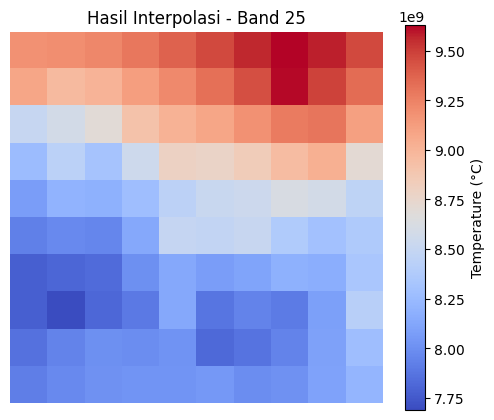

📊 Statistik Band 25 setelah interpolasi:
- Min: 7688412439.75
- Max: 9629684726.70
- Mean: 8493696283.46
- Std Dev: 554458964.07
----------------------------------------
🔄 Memproses band ke-26...


Band 26: 100%|██████████| 36/36 [00:00<00:00, 651.40it/s]


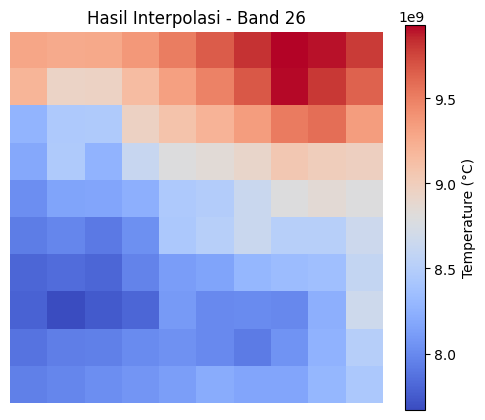

📊 Statistik Band 26 setelah interpolasi:
- Min: 7667969076.00
- Max: 9931357686.01
- Mean: 8582248251.59
- Std Dev: 618094726.16
----------------------------------------
🔄 Memproses band ke-27...


Band 27: 100%|██████████| 26/26 [00:00<00:00, 647.61it/s]


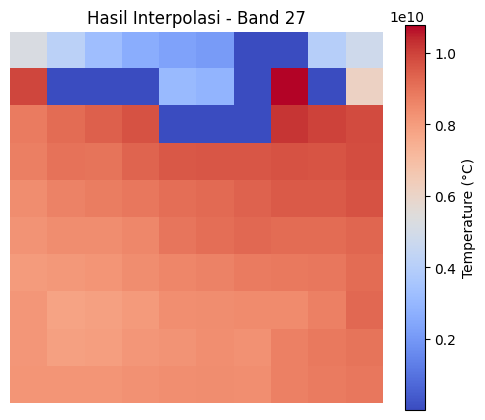

📊 Statistik Band 27 setelah interpolasi:
- Min: 1419858.00
- Max: 10783281728.86
- Mean: 7395066536.07
- Std Dev: 3019422708.59
----------------------------------------
🔄 Memproses band ke-28...


Band 28: 100%|██████████| 36/36 [00:00<00:00, 719.17it/s]


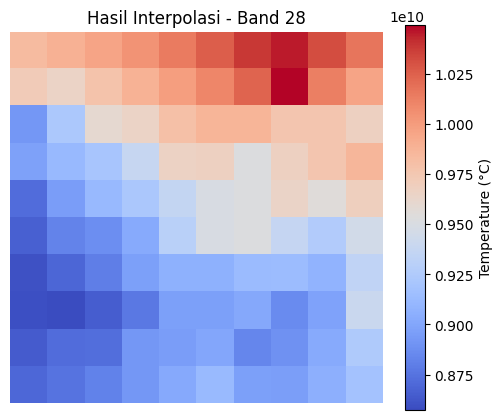

📊 Statistik Band 28 setelah interpolasi:
- Min: 8573930993.25
- Max: 10491948788.25
- Mean: 9344806284.90
- Std Dev: 496261396.62
----------------------------------------
🔄 Memproses band ke-29...


Band 29: 100%|██████████| 36/36 [00:00<00:00, 700.53it/s]


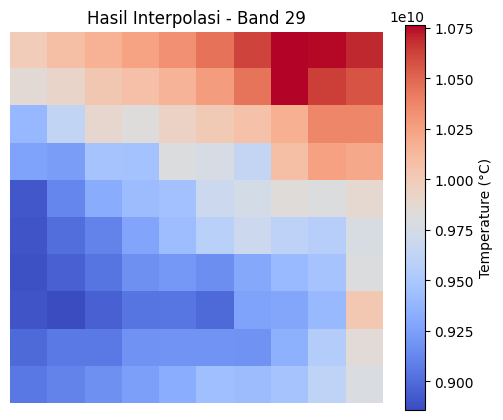

📊 Statistik Band 29 setelah interpolasi:
- Min: 8858651823.50
- Max: 10763700788.50
- Mean: 9631219311.43
- Std Dev: 510393254.40
----------------------------------------
🔄 Memproses band ke-30...


Band 30: 100%|██████████| 36/36 [00:00<00:00, 681.31it/s]


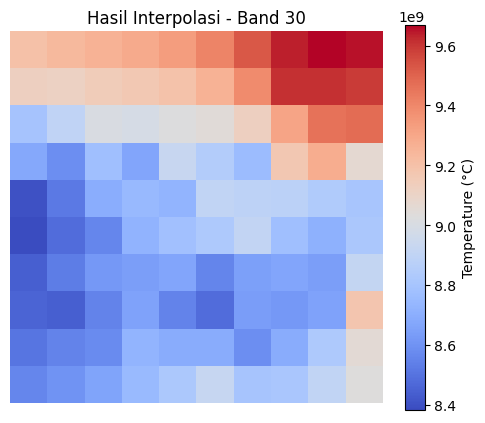

📊 Statistik Band 30 setelah interpolasi:
- Min: 8382164598.25
- Max: 9669570357.28
- Mean: 8889938829.84
- Std Dev: 328436473.19
----------------------------------------
🔄 Memproses band ke-31...


Band 31: 100%|██████████| 36/36 [00:00<00:00, 692.96it/s]


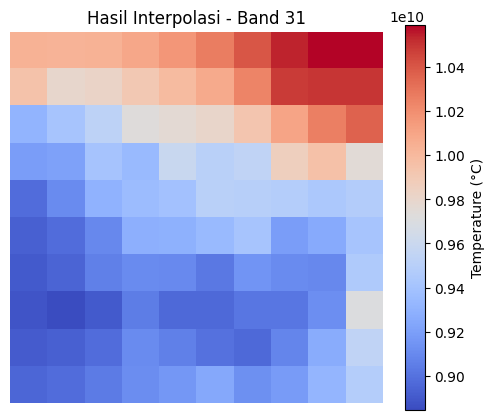

📊 Statistik Band 31 setelah interpolasi:
- Min: 8845801011.50
- Max: 10589551452.75
- Mean: 9471481427.93
- Std Dev: 481472627.83
----------------------------------------
🔄 Memproses band ke-32...


Band 32: 100%|██████████| 36/36 [00:00<00:00, 671.27it/s]


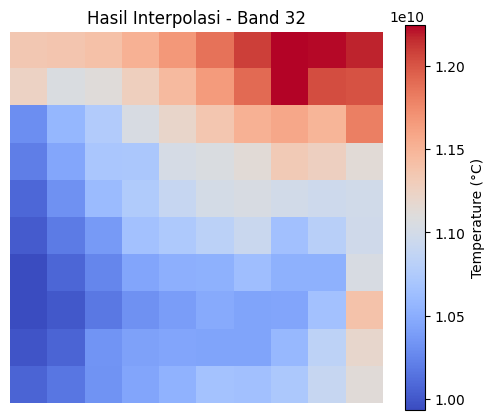

📊 Statistik Band 32 setelah interpolasi:
- Min: 9932575186.25
- Max: 12246119800.05
- Mean: 10873700038.22
- Std Dev: 586144514.78
----------------------------------------
🔄 Memproses band ke-33...


Band 33: 100%|██████████| 26/26 [00:00<00:00, 511.61it/s]


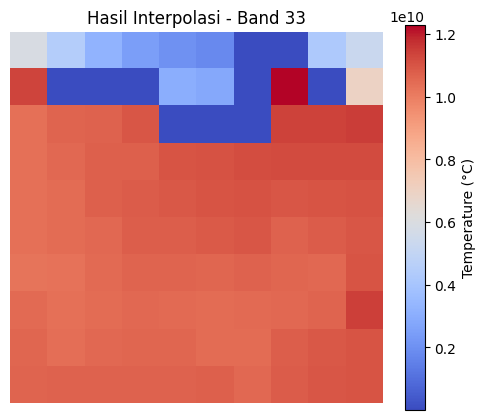

📊 Statistik Band 33 setelah interpolasi:
- Min: 779922.00
- Max: 12282407896.60
- Mean: 8923531765.85
- Std Dev: 3719957047.28
----------------------------------------
🔄 Memproses band ke-34...


Band 34: 100%|██████████| 26/26 [00:00<00:00, 526.94it/s]


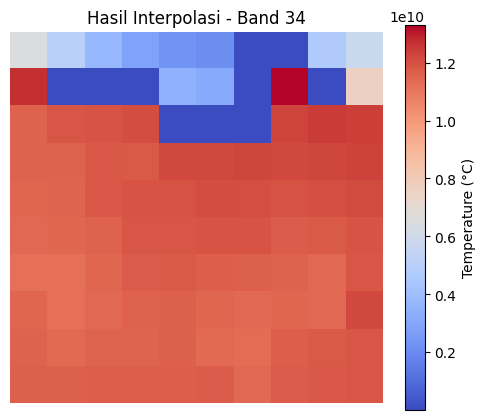

📊 Statistik Band 34 setelah interpolasi:
- Min: 599940.00
- Max: 13302337456.90
- Mean: 9773938858.55
- Std Dev: 4053027081.58
----------------------------------------
🔄 Memproses band ke-35...


Band 35: 100%|██████████| 36/36 [00:00<00:00, 244.35it/s]


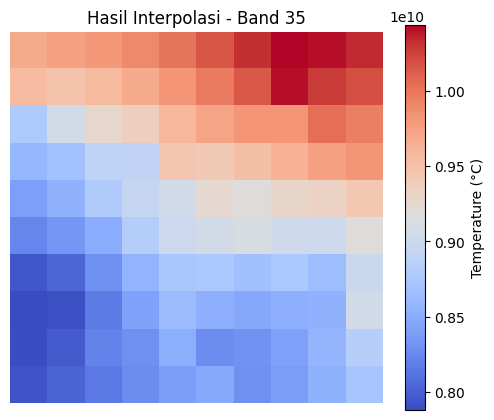

📊 Statistik Band 35 setelah interpolasi:
- Min: 7879465751.41
- Max: 10437923850.24
- Mean: 9024004144.42
- Std Dev: 702015712.48
----------------------------------------
🔄 Memproses band ke-36...


Band 36: 100%|██████████| 36/36 [00:00<00:00, 61.47it/s]


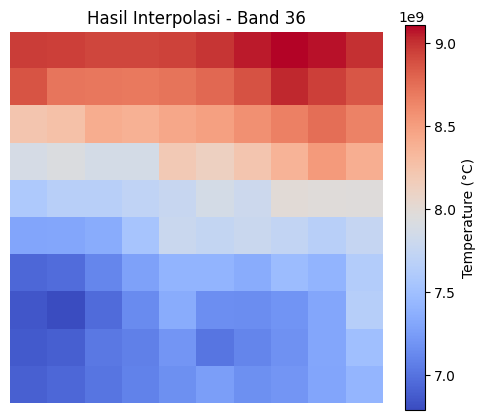

📊 Statistik Band 36 setelah interpolasi:
- Min: 6786299882.25
- Max: 9105966910.90
- Mean: 7851911570.95
- Std Dev: 702722171.61
----------------------------------------
✅ Semua band berhasil diinterpolasi dan disimpan ke /content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/SSR_EXPORT/ERA5_SSR_Monthly_2022_2024_NaN_Interpolated.tif


In [ ]:
#----------------------------------
# INTERPOLATE MISSING VALUE 36 BULAN
# -----------------------------------

file_path = '/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/SSR_EXPORT/ERA5_SSR_Monthly_2022_2024.tif'
with rasterio.open(file_path) as src:
    profile = src.profile
    transform = src.transform
    all_data = []

    for i in range(1, src.count + 1):  # Loop through 36 bands
        print(f"🔄 Memproses band ke-{i}...")
        data = src.read(i)
        rows, cols = np.where(~np.isnan(data))
        z = data[rows, cols]

        if len(z) == 0:
            print(f"⚠️ Band {i} tidak memiliki data valid. Lewat.")
            all_data.append(data)
            continue

        x_coords, y_coords = rasterio.transform.xy(transform, rows, cols)

        ok = OrdinaryKriging(
            x_coords, y_coords, z,
            variogram_model='linear',
            verbose=False,
            enable_plotting=False
        )

        nan_rows, nan_cols = np.where(np.isnan(data))
        x_nan, y_nan = rasterio.transform.xy(transform, nan_rows, nan_cols)

        z_nan = []
        for x, y in tqdm(zip(x_nan, y_nan), total=len(x_nan), desc=f'Band {i}'):
            z_, _ = ok.execute('points', x, y)
            z_nan.append(z_[0])

        z_nan = np.array(z_nan)
        data[nan_rows, nan_cols] = z_nan


        # Tampilkan visualisasi hasil interpolasi
        plt.figure(figsize=(6, 5))
        plt.imshow(data, cmap='coolwarm')
        plt.colorbar(label='Temperature (°C)')
        plt.title(f'Hasil Interpolasi - Band {i}')
        plt.axis('off')
        plt.show()

        # Statistik dasar
        print(f"📊 Statistik Band {i} setelah interpolasi:")
        print(f"- Min: {np.nanmin(data):.2f}")
        print(f"- Max: {np.nanmax(data):.2f}")
        print(f"- Mean: {np.nanmean(data):.2f}")
        print(f"- Std Dev: {np.nanstd(data):.2f}")
        print("-" * 40)

        all_data.append(data) # Fixed indentation

# Simpan semua band
output_path = file_path.replace('.tif', '_NaN_Interpolated.tif')
profile.update(count=36)

with rasterio.open(output_path, 'w', **profile) as dst:
    for i, band_data in enumerate(all_data, start=1):
        dst.write(band_data, i)

print(f"✅ Semua band berhasil diinterpolasi dan disimpan ke {output_path}")


✅ ERA5_SSR_Monthly_2022_2024_NaN_Interpolated.tif - Resampled dengan NoData: nan


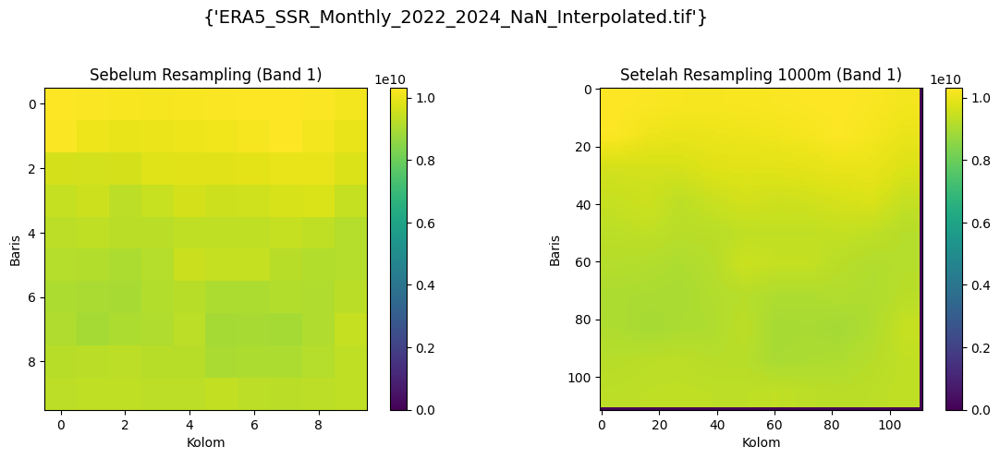

📊 Hasil evaluasi 36 band disimpan di: /content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/SSR_EXPORT/DOWNSCALED/eval_all_bands.csv


In [ ]:
#-------------------
# Downscaling Multi-Band (36 Band)
#-------------------

import rasterio
from rasterio.enums import Resampling
from rasterio.warp import calculate_default_transform, reproject
import matplotlib.pyplot as plt
import numpy as np
import os
from glob import glob
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from skimage.transform import resize
import pandas as pd

# Visualisasi sebelum dan sesudah resampling untuk band pertama
def visualize_comparison(before_array, after_array, title):
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))
    cmap = 'viridis'

    # Ambil band pertama untuk visualisasi
    before_band = np.ma.masked_invalid(before_array[0])
    after_band = np.ma.masked_invalid(after_array[0])

    vmin = min(np.nanmin(before_band), np.nanmin(after_band))
    vmax = max(np.nanmax(before_band), np.nanmax(after_band))

    im1 = axs[0].imshow(before_band, cmap=cmap, vmin=vmin, vmax=vmax)
    axs[0].set_title("Sebelum Resampling (Band 1)")
    axs[0].set_xlabel("Kolom")
    axs[0].set_ylabel("Baris")
    plt.colorbar(im1, ax=axs[0], orientation="vertical", fraction=0.05)

    im2 = axs[1].imshow(after_band, cmap=cmap, vmin=vmin, vmax=vmax)
    axs[1].set_title("Setelah Resampling 1000m (Band 1)")
    axs[1].set_xlabel("Kolom")
    axs[1].set_ylabel("Baris")
    plt.colorbar(im2, ax=axs[1], orientation="vertical", fraction=0.05)

    plt.suptitle(title, fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Evaluasi statistik untuk semua band
def evaluate_stats_all_bands(before, after, filename):
    results = []
    for band_idx in range(before.shape[0]):
        before_band = before[band_idx]
        after_band = after[band_idx]

        # Resize untuk matching shape
        after_resized = resize(after_band, before_band.shape,
                             order=1, preserve_range=True,
                             anti_aliasing=False)

        mask = ~np.isnan(before_band) & ~np.isnan(after_resized)

        if np.count_nonzero(mask) == 0:
            print(f"⚠️ {filename} Band {band_idx+1} tidak dapat dievaluasi")
            continue

        y_true = before_band[mask]
        y_pred = after_resized[mask]

        mse = mean_squared_error(y_true, y_pred)
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(y_true, y_pred)
        r2 = r2_score(y_true, y_pred)

        results.append({
            "Filename": filename,
            "Band": band_idx+1,
            "RMSE": rmse,
            "MSE": mse,
            "MAE": mae,
            "R2": r2
        })

    return results

# Fungsi resampling untuk semua band
def resample_raster_to_1km_all_bands(input_path, output_path, visualize=True):
    with rasterio.open(input_path) as src:
        # Baca semua band
        src_nodata = src.nodata if src.nodata is not None else np.nan
        src_array = src.read()  # Shape: (bands, rows, cols)
        src_array = np.where(src_array == src_nodata, np.nan, src_array)
        src_transform = src.transform
        src_crs = src.crs
        src_bounds = src.bounds

        # Hitung transformasi output
        dst_transform, width, height = calculate_default_transform(
            src_crs, src_crs,
            src.width, src.height,
            *src_bounds,
            resolution=1000
        )

        # Siapkan array output
        dst_array = np.full((src.count, height, width), np.nan, dtype=src.dtypes[0])

        # Update metadata
        kwargs = src.meta.copy()
        kwargs.update({
            'driver': 'GTiff',
            'count': src.count,
            'crs': src_crs,
            'transform': dst_transform,
            'width': width,
            'height': height,
            'nodata': src_nodata
        })

        # Proses resampling per band
        with rasterio.open(output_path, 'w', **kwargs) as dst:
            dst_array = np.empty((src.count, height, width), dtype=src.dtypes[0])

            for band in range(src.count):
                reproject(
                    source=src_array[band],
                    destination=dst_array[band],
                    src_transform=src_transform,
                    src_crs=src_crs,
                    dst_transform=dst_transform,
                    dst_crs=src_crs,
                    resampling=Resampling.bilinear
                )
                dst.write(dst_array[band], band+1)

    print(f"✅ {os.path.basename(input_path)} - Resampled dengan NoData: {src_nodata}")

    if visualize:
        visualize_comparison(src_array, dst_array,
                           {os.path.basename(input_path)})

    return src_array, dst_array

# Batch Processing untuk semua file
input_folder = "/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/SSR_EXPORT/NAN"
output_folder = "/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/SSR_EXPORT/DOWNSCALED"
os.makedirs(output_folder, exist_ok=True)

raster_files = glob(os.path.join(input_folder, "*.tif"))
all_results = []

for raster_file in raster_files:
    filename = os.path.basename(raster_file)
    output_path = os.path.join(output_folder, f"{os.path.splitext(filename)[0]}_1km.tif")

    # Proses resampling
    before, after = resample_raster_to_1km_all_bands(raster_file, output_path)

    # Evaluasi
    stats = evaluate_stats_all_bands(before, after, filename)
    all_results.extend(stats)

# Simpan hasil evaluasi
df = pd.DataFrame(all_results)
csv_path = os.path.join(output_folder, "eval_all_bands.csv")
df.to_csv(csv_path, index=False)
print(f"📊 Hasil evaluasi 36 band disimpan di: {csv_path}")


In [ ]:
#-------------------------
# INFORMASI NAN Downscale
#-------------------------

import rasterio
import numpy as np
import pandas as pd

# 1. Buka file TIFF
tif_path = '/content/drive/MyDrive/SSR_EXPORT/ERA5_ssr_Monthly_2022_2024_1KM/ERA5_ssr_Monthly_2022_2024_NaN_resampled.tif'
with rasterio.open(tif_path) as src:
    data = src.read()  # (bands, height, width)
    profile = src.profile

# 2. Siapkan list bulan (label)
start_year = 2022
start_month = 1
labels = []
for i in range(36):
    year = start_year + (start_month + i - 1) // 12
    month = (start_month + i - 1) % 12 + 1
    labels.append(f"{year:04d}-{month:02d}")

# 3. Hitung valid_ratio dan missing_ratio
valid_ratios = []
missing_ratios_percent = []

for i in range(data.shape[0]):  # untuk tiap band
    band = data[i, :, :]
    total_pixels = band.size
    valid_pixels = np.count_nonzero(~np.isnan(band))
    valid_ratio = valid_pixels / total_pixels
    missing_ratio = 1.0 - valid_ratio

    valid_ratios.append(valid_ratio)
    missing_ratios_percent.append(missing_ratio * 100)

# 4. Buat dataframe ringkasan
summary_df = pd.DataFrame({
    'label': labels,
    'valid_ratio': valid_ratios,
    'missing_ratio_percent': missing_ratios_percent
})

# 5. Tampilkan
print(summary_df)

      label  valid_ratio  missing_ratio_percent
0   2022-01          1.0                    0.0
1   2022-02          1.0                    0.0
2   2022-03          1.0                    0.0
3   2022-04          1.0                    0.0
4   2022-05          1.0                    0.0
5   2022-06          1.0                    0.0
6   2022-07          1.0                    0.0
7   2022-08          1.0                    0.0
8   2022-09          1.0                    0.0
9   2022-10          1.0                    0.0
10  2022-11          1.0                    0.0
11  2022-12          1.0                    0.0
12  2023-01          1.0                    0.0
13  2023-02          1.0                    0.0
14  2023-03          1.0                    0.0
15  2023-04          1.0                    0.0
16  2023-05          1.0                    0.0
17  2023-06          1.0                    0.0
18  2023-07          1.0                    0.0
19  2023-08          1.0                

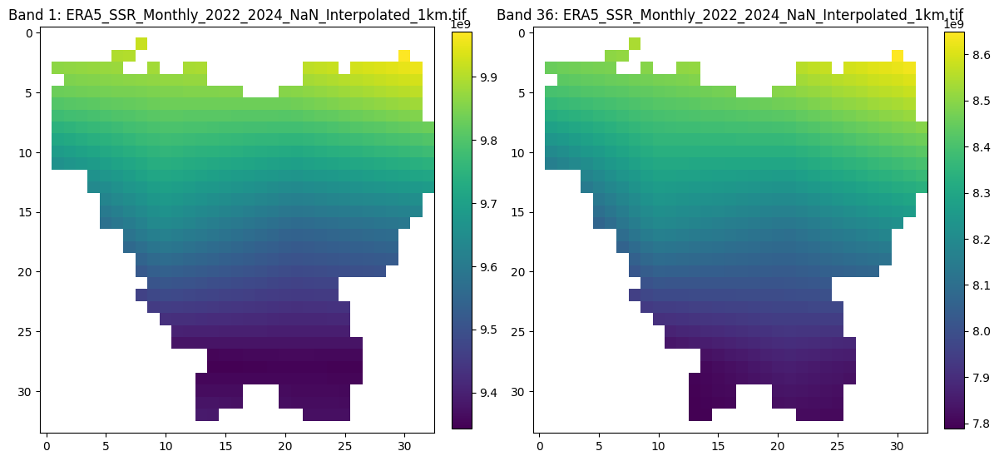

✅ Processed multiband: ERA5_SSR_Monthly_2022_2024_NaN_Interpolated_1km.tif


In [ ]:
#-------------------------
# CLIP DOWNSCALED (MULTIBAND)
#-------------------------
import rasterio
from rasterio.mask import mask
import geopandas as gpd
import numpy as np
import os
from glob import glob
import matplotlib.pyplot as plt

# === 1. BACA SHAPEFILE BATAS ADMINISTRASI ===
shapefile_path = '/content/drive/MyDrive/PENGOLAHAN/DKI Jakarta/DKI Jakarta.shp'
gdf = gpd.read_file(shapefile_path)

# === 2. DAFTAR SEMUA FILE RASTER YANG MAU DIOLAH ===
input_folder = '/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/SSR_EXPORT/DOWNSCALED'  # folder berisi hasil resampling
output_folder = '/content/drive/MyDrive/PENGOLAHAN/DATA/Meteorologi-ERA5_22&24/SSR_EXPORT/CLIP'
os.makedirs(output_folder, exist_ok=True)
raster_files = sorted(glob(os.path.join(input_folder, '*.tif')))

# === 3. LOOP UNTUK SETIAP FILE RASTER ===
for raster_path in raster_files:
    with rasterio.open(raster_path) as src:
        raster_data = src.read()  # ⬅️ Ambil semua band (multiband)
        raster_meta = src.meta.copy()

        # Cek dan samakan CRS shapefile
        if gdf.crs != src.crs:
            gdf = gdf.to_crs(src.crs)

        # Gunakan nilai nodata asli
        nodata_value = src.nodata

        # Crop dan mask semua band
        out_image, out_transform = mask(
            src,
            gdf.geometry,
            crop=True,
            nodata=nodata_value
        )

        # Update metadata
        out_meta = raster_meta.copy()
        out_meta.update({
            "driver": "GTiff",
            "height": out_image.shape[1],
            "width": out_image.shape[2],
            "count": out_image.shape[0],  # ⬅️ Total band
            "transform": out_transform,
            "nodata": nodata_value
        })

        # Nama file output
        filename = os.path.basename(raster_path)
        output_path = os.path.join(output_folder, f"Jakarta_{filename}")

        # Simpan hasil raster clipped
        with rasterio.open(output_path, "w", **out_meta) as dest:
            dest.write(out_image)

        # === VISUALISASI: Band 1 & terakhir ===
        fig, ax = plt.subplots(1, 2, figsize=(12, 6))
        im1 = ax[0].imshow(out_image[0], cmap='viridis')
        ax[0].set_title(f"Band 1: {filename}")
        plt.colorbar(im1, ax=ax[0], fraction=0.046, pad=0.04)

        im2 = ax[1].imshow(out_image[-1], cmap='viridis')
        ax[1].set_title(f"Band {out_image.shape[0]}: {filename}")
        plt.colorbar(im2, ax=ax[1], fraction=0.046, pad=0.04)

        plt.tight_layout()
        plt.show()

    print(f"✅ Processed multiband: {filename}")


In [ ]:
#-------------------------
# INFORMASI NAN CLIP
#-------------------------

import rasterio
import numpy as np
import pandas as pd

# 1. Buka file TIFF
tif_path = '/content/drive/MyDrive/SSR_EXPORT/ssr_monthly_clip/Jakarta_ERA5_ssr_Monthly_2022_2024_NaN_resampled.tif'
with rasterio.open(tif_path) as src:
    data = src.read()  # (bands, height, width)
    profile = src.profile

# 2. Siapkan list bulan (label)
start_year = 2022
start_month = 1
labels = []
for i in range(36):
    year = start_year + (start_month + i - 1) // 12
    month = (start_month + i - 1) % 12 + 1
    labels.append(f"{year:04d}-{month:02d}")

# 3. Hitung valid_ratio dan missing_ratio
valid_ratios = []
missing_ratios_percent = []

for i in range(data.shape[0]):  # untuk tiap band
    band = data[i, :, :]
    total_pixels = band.size
    valid_pixels = np.count_nonzero(~np.isnan(band))
    valid_ratio = valid_pixels / total_pixels
    missing_ratio = 1.0 - valid_ratio

    valid_ratios.append(valid_ratio)
    missing_ratios_percent.append(missing_ratio * 100)

# 4. Buat dataframe ringkasan
summary_df = pd.DataFrame({
    'label': labels,
    'valid_ratio': valid_ratios,
    'missing_ratio_percent': missing_ratios_percent
})

# 5. Tampilkan
print(summary_df)

      label  valid_ratio  missing_ratio_percent
0   2022-01          1.0                    0.0
1   2022-02          1.0                    0.0
2   2022-03          1.0                    0.0
3   2022-04          1.0                    0.0
4   2022-05          1.0                    0.0
5   2022-06          1.0                    0.0
6   2022-07          1.0                    0.0
7   2022-08          1.0                    0.0
8   2022-09          1.0                    0.0
9   2022-10          1.0                    0.0
10  2022-11          1.0                    0.0
11  2022-12          1.0                    0.0
12  2023-01          1.0                    0.0
13  2023-02          1.0                    0.0
14  2023-03          1.0                    0.0
15  2023-04          1.0                    0.0
16  2023-05          1.0                    0.0
17  2023-06          1.0                    0.0
18  2023-07          1.0                    0.0
19  2023-08          1.0                

# Cleaning Data

In [ ]:
# prompt: aku mempunyai data csv, berikan kode untuk mengecekan outliernya untuk semua variabel

import pandas as pd

def detect_outliers_iqr(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data < lower_bound) | (data > upper_bound)]
    return outliers

# Load your CSV file into a pandas DataFrame
# Replace 'your_file.csv' with the actual path to your file
try:
  df = pd.read_csv('/content/drive/MyDrive/PENGOLAHAN/DATA/EKTRAKSI PIKSEL/Hasil Ekstraksi/Ekstraksi Stasiun/Data_Fix.csv')
except FileNotFoundError:
  print("Error: 'your_file.csv' not found. Please upload your CSV file or provide the correct path.")
  exit()


# Iterate through each column in the DataFrame
for col in df.select_dtypes(include=['number']): #only numerical columns
    outliers = detect_outliers_iqr(df[col])
    print(f"Outliers for {col}:")
    print(outliers)
    print("-" * 20)


Outliers for Station_ID:
Series([], Name: Station_ID, dtype: int64)
--------------------
Outliers for NO2:
25    1.046979
29    1.066060
84    1.075632
95    1.031402
99    1.156241
Name: NO2, dtype: float64
--------------------
Outliers for HCHO:
Series([], Name: HCHO, dtype: float64)
--------------------
Outliers for CO:
105    134.521713
107    138.756485
108    139.747391
109    141.601578
110    138.338226
111    134.978180
114    151.082489
165    136.525620
166    133.896469
169    135.118301
Name: CO, dtype: float64
--------------------
Outliers for SO2:
22     3.836419
25     2.647695
28     5.301227
162    2.611879
173    4.976531
Name: SO2, dtype: float64
--------------------
Outliers for TropomiO3:
Series([], Name: TropomiO3, dtype: float64)
--------------------
Outliers for U10:
Series([], Name: U10, dtype: float64)
--------------------
Outliers for V10:
100   -0.943115
101   -0.922294
103   -0.777186
104   -0.878311
105   -0.787334
106   -0.803079
109   -0.720616
Name: V1

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Fungsi deteksi outlier dengan IQR
def detect_outliers_iqr(series):
    Q1 = series.quantile(0.25)
    Q3 = series.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = series[(series < lower_bound) | (series > upper_bound)]
    return outliers

# Load data
try:
    df = pd.read_csv('/content/drive/MyDrive/PENGOLAHAN/DATA/EKTRAKSI PIKSEL/Hasil Ekstraksi/Ekstraksi Stasiun/Data_Fix_Clean.csv')
    print("✅ File berhasil dimuat.")
except FileNotFoundError:
    print("❌ File tidak ditemukan.")
    exit()

# Konversi kolom objek ke numerik jika memungkinkan
for col in df.columns:
    if df[col].dtype == 'object':
        try:
            df[col] = pd.to_numeric(df[col])
        except:
            continue

# Plot boxplot untuk setiap kolom numerik
numeric_cols = df.select_dtypes(include=['number']).columns

for col in numeric_cols:
    outliers = detect_outliers_iqr(df[col])
    print(f"🔍 Kolom '{col}': {len(outliers)} outlier")

    plt.figure(figsize=(8, 4))
    sns.boxplot(x=df[col], color='skyblue')
    plt.title(f"Boxplot - {col}")
    plt.xlabel(col)
    plt.grid(True, axis='x', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()


✅ File berhasil dimuat.


In [ ]:
# VERSI CLEAN2

import pandas as pd

def detect_outliers_iqr(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data < lower_bound) | (data > upper_bound)]
    return outliers


try:
  df = pd.read_csv('/content/drive/MyDrive/PENGOLAHAN/DATA/CLEANORMALIZE/Data_Fix_Clean2.csv', sep=';')
except FileNotFoundError:
  print("Error: 'your_file.csv' not found. Please upload your CSV file or provide the correct path.")
  exit()


# Iterate through each column in the DataFrame
for col in df.select_dtypes(include=['number']): #only numerical columns
    outliers = detect_outliers_iqr(df[col])
    print(f"Outliers for {col}:")
    print(outliers)
    print("-" * 20)


Outliers for Station_ID:
Series([], Name: Station_ID, dtype: int64)
--------------------
Outliers for NO2:
81    0.994135
Name: NO2, dtype: float64
--------------------
Outliers for HCHO:
Series([], Name: HCHO, dtype: float64)
--------------------
Outliers for CO:
62    119.895210
95    119.024109
Name: CO, dtype: float64
--------------------
Outliers for SO2:
Series([], Name: SO2, dtype: float64)
--------------------
Outliers for TropomiO3:
Series([], Name: TropomiO3, dtype: float64)
--------------------
Outliers for U10:
Series([], Name: U10, dtype: float64)
--------------------
Outliers for V10:
0    -0.320505
67   -0.430638
70   -0.355498
92   -0.327972
93   -0.415438
94   -0.421657
95   -0.414068
Name: V10, dtype: float64
--------------------
Outliers for SP:
Series([], Name: SP, dtype: float64)
--------------------
Outliers for TP:
Series([], Name: TP, dtype: float64)
--------------------
Outliers for E:
Series([], Name: E, dtype: float64)
--------------------
Outliers for T2M:
S

In [ ]:
# VERSI CLEAN3

import pandas as pd

def detect_outliers_iqr(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data < lower_bound) | (data > upper_bound)]
    return outliers


try:
  df = pd.read_csv('/content/drive/MyDrive/PENGOLAHAN/DATA/CLEANORMALIZE/Data_Fix_Clean3.csv', sep=';')
except FileNotFoundError:
  print("Error: 'your_file.csv' not found. Please upload your CSV file or provide the correct path.")
  exit()


# Iterate through each column in the DataFrame
for col in df.select_dtypes(include=['number']): #only numerical columns
    outliers = detect_outliers_iqr(df[col])
    print(f"Outliers for {col}:")
    print(outliers)
    print("-" * 20)


Outliers for Station_ID:
Series([], Name: Station_ID, dtype: int64)
--------------------
Outliers for NO2:
82    0.929489
Name: NO2, dtype: float64
--------------------
Outliers for HCHO:
Series([], Name: HCHO, dtype: float64)
--------------------
Outliers for CO:
Series([], Name: CO, dtype: float64)
--------------------
Outliers for SO2:
Series([], Name: SO2, dtype: float64)
--------------------
Outliers for TropomiO3:
Series([], Name: TropomiO3, dtype: float64)
--------------------
Outliers for U10:
Series([], Name: U10, dtype: float64)
--------------------
Outliers for V10:
Series([], Name: V10, dtype: float64)
--------------------
Outliers for SP:
Series([], Name: SP, dtype: float64)
--------------------
Outliers for TP:
Series([], Name: TP, dtype: float64)
--------------------
Outliers for E:
Series([], Name: E, dtype: float64)
--------------------
Outliers for T2M:
72    28.051385
Name: T2M, dtype: float64
--------------------
Outliers for SSR:
89    7792703835
Name: SSR, dtype: 

In [ ]:
# VERSI CLEAN4

import pandas as pd

def detect_outliers_iqr(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data < lower_bound) | (data > upper_bound)]
    return outliers


try:
  df = pd.read_csv('/content/drive/MyDrive/PENGOLAHAN/DATA/CLEANORMALIZE/Data_Fix_Clean4.csv', sep=';')
except FileNotFoundError:
  print("Error: 'your_file.csv' not found. Please upload your CSV file or provide the correct path.")
  exit()


# Iterate through each column in the DataFrame
for col in df.select_dtypes(include=['number']): #only numerical columns
    outliers = detect_outliers_iqr(df[col])
    print(f"Outliers for {col}:")
    print(outliers)
    print("-" * 20)


Outliers for Station_ID:
14    1
26    1
34    1
47    1
56    1
72    1
76    1
80    1
Name: Station_ID, dtype: int64
--------------------
Outliers for NO2:
72    0.914488
Name: NO2, dtype: float64
--------------------
Outliers for HCHO:
Series([], Name: HCHO, dtype: float64)
--------------------
Outliers for CO:
78    117.51281
Name: CO, dtype: float64
--------------------
Outliers for SO2:
Series([], Name: SO2, dtype: float64)
--------------------
Outliers for TropomiO3:
Series([], Name: TropomiO3, dtype: float64)
--------------------
Outliers for U10:
Series([], Name: U10, dtype: float64)
--------------------
Outliers for V10:
Series([], Name: V10, dtype: float64)
--------------------
Outliers for SP:
Series([], Name: SP, dtype: float64)
--------------------
Outliers for TP:
Series([], Name: TP, dtype: float64)
--------------------
Outliers for E:
Series([], Name: E, dtype: float64)
--------------------
Outliers for T2M:
Series([], Name: T2M, dtype: float64)
--------------------
O

In [ ]:
# VERSI CLEAN5

import pandas as pd

def detect_outliers_iqr(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data < lower_bound) | (data > upper_bound)]
    return outliers


try:
  df = pd.read_csv('/content/drive/MyDrive/PENGOLAHAN/DATA/CLEANORMALIZE/Data_Fix_Clean5.csv', sep=';')
except FileNotFoundError:
  print("Error: 'your_file.csv' not found. Please upload your CSV file or provide the correct path.")
  exit()


# Iterate through each column in the DataFrame
for col in df.select_dtypes(include=['number']): #only numerical columns
    outliers = detect_outliers_iqr(df[col])
    print(f"Outliers for {col}:")
    print(outliers)
    print("-" * 20)


Outliers for Station_ID:
14    1
26    1
34    1
47    1
56    1
75    1
78    1
Name: Station_ID, dtype: int64
--------------------
Outliers for NO2:
Series([], Name: NO2, dtype: float64)
--------------------
Outliers for HCHO:
Series([], Name: HCHO, dtype: float64)
--------------------
Outliers for CO:
Series([], Name: CO, dtype: float64)
--------------------
Outliers for SO2:
Series([], Name: SO2, dtype: float64)
--------------------
Outliers for TropomiO3:
Series([], Name: TropomiO3, dtype: float64)
--------------------
Outliers for U10:
Series([], Name: U10, dtype: float64)
--------------------
Outliers for V10:
Series([], Name: V10, dtype: float64)
--------------------
Outliers for SP:
Series([], Name: SP, dtype: float64)
--------------------
Outliers for TP:
Series([], Name: TP, dtype: float64)
--------------------
Outliers for E:
42   -0.003434
Name: E, dtype: float64
--------------------
Outliers for T2M:
Series([], Name: T2M, dtype: float64)
--------------------
Outliers for 

In [ ]:
# prompt: aku mempunyai file csv yang masih memiliki outlier, berikan kode menghapus outlier dengan IQR

import pandas as pd

def remove_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df_filtered = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
    return df_filtered

# Load your CSV file into a pandas DataFrame
# Replace 'your_file.csv' with the actual path to your file
try:
    df = pd.read_csv('/content/drive/MyDrive/PENGOLAHAN/DATA/EKTRAKSI PIKSEL/Hasil Ekstraksi/Ekstraksi Stasiun/Data_Fix_Clean2.csv')
except FileNotFoundError:
    print("Error: 'Data_Fix_Clean2.csv' not found. Please upload your CSV file or provide the correct path.")
    exit()

# Specify the columns to remove outliers from
columns_to_filter = ['u_component_10m'] # Example, replace with your actual column names

# Remove outliers from specified columns
for col in columns_to_filter:
    if col in df.columns:  # Check if column exists in DataFrame
      df = remove_outliers_iqr(df, col)
    else:
      print(f"Warning: Column '{col}' not found in DataFrame. Skipping outlier removal for this column.")

# Save the filtered data to a new CSV file
df.to_csv('/content/drive/MyDrive/PENGOLAHAN/DATA/EKTRAKSI PIKSEL/Hasil Ekstraksi/Ekstraksi Stasiun/Data_NoOutlier.csv', index=False)
print(f"Data without outliers saved to '/content/drive/MyDrive/PENGOLAHAN/DATA/EKTRAKSI PIKSEL/Hasil Ekstraksi/Ekstraksi Stasiun/Data_NoOutlier.csv'")


IQR

In [ ]:
# Fungsi untuk hapus outlier berdasarkan IQR
df = pd.read_csv('/content/drive/MyDrive/PENGOLAHAN/DATA/EKTRAKSI PIKSEL/Hasil Ekstraksi/Ekstraksi Stasiun/Data_Fix.csv')
def remove_outliers_iqr(df, columns):
    for col in columns:
        # Check if the column is numeric
        if pd.api.types.is_numeric_dtype(df[col]):
            Q1 = df[col].quantile(0.25)
            Q3 = df[col].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR
            # Hapus data yang outlier
            df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]
        else:
            print(f"Skipping outlier removal for column '{col}' as it is not numeric.")
    return df

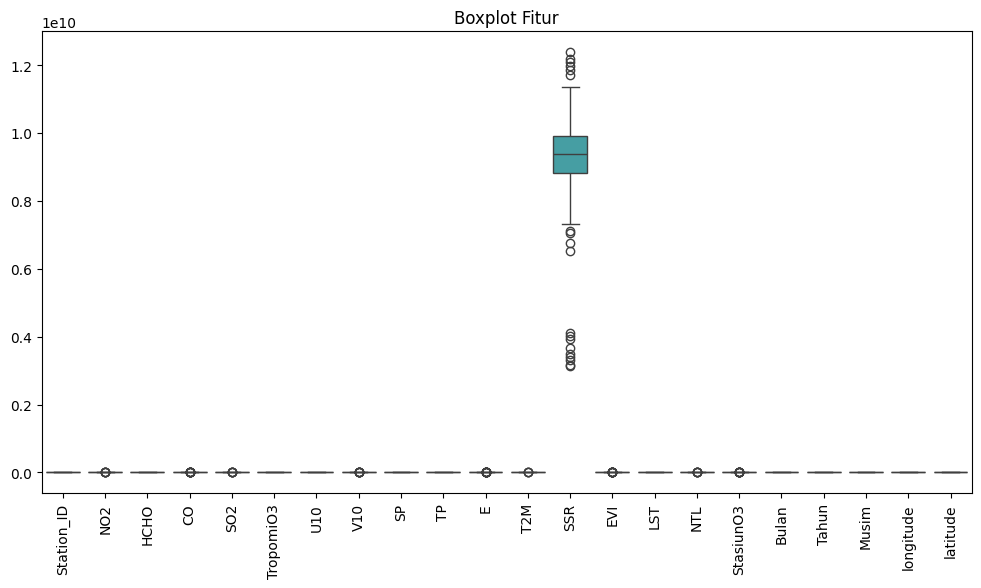

In [ ]:
# Deteksi Outlier
plt.figure(figsize=(12, 6))
sns.boxplot(data=df)
plt.xticks(rotation=90)
plt.title("Boxplot Fitur")
plt.show()

In [ ]:
# Pilih kolom numerik yang mau dibersihkan
numeric_cols = ['NO2', 'HCHO', 'CO', 'SO2', 'TropomiO3', 'U10', 'V10', 'SP', 'TP', 'E', 'T2M', 'SSR', 'EVI', 'LST', 'NTL', 'StasiunO3']

In [ ]:
df_clean = df.copy()

In [ ]:
# Hapus outlier
df_clean = remove_outliers_iqr(df_clean, numeric_cols)

print(f"Jumlah data setelah menghapus outlier: {len(df_clean)} baris")

Jumlah data setelah menghapus outlier: 121 baris


In [ ]:
# Save the filtered data to a new CSV file
df_clean.to_csv('/content/drive/MyDrive/PENGOLAHAN/DATA/EKTRAKSI PIKSEL/Hasil Ekstraksi/Ekstraksi Stasiun/Data_clean.csv', index=False)
print(f"Data without outliers saved to '/content/drive/MyDrive/PENGOLAHAN/DATA/EKTRAKSI PIKSEL/Hasil Ekstraksi/Ekstraksi Stasiun/Data_clean.csv'")


Data without outliers saved to '/content/drive/MyDrive/PENGOLAHAN/DATA/EKTRAKSI PIKSEL/Hasil Ekstraksi/Ekstraksi Stasiun/Data_clean.csv'


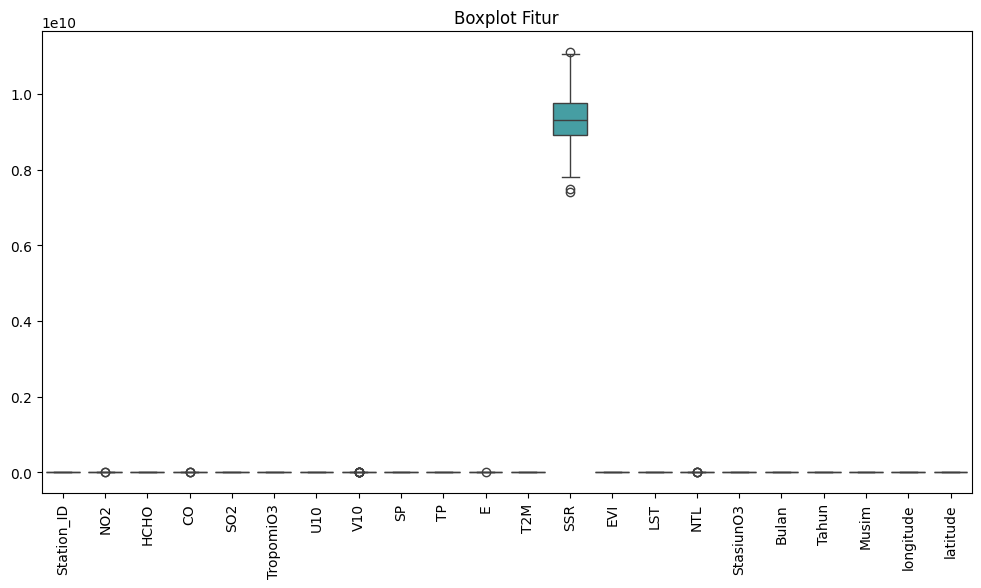

In [ ]:
# Deteksi Outlier
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_clean)
plt.xticks(rotation=90)
plt.title("Boxplot Fitur")
plt.show()

In [ ]:
# Fungsi untuk hapus outlier berdasarkan IQR
df = pd.read_csv('/content/drive/MyDrive/PENGOLAHAN/DATA/EKTRAKSI PIKSEL/Hasil Ekstraksi/Ekstraksi Stasiun/Data_clean.csv')
def remove_outliers_iqr(df, columns):
    for col in columns:
        # Check if the column is numeric
        if pd.api.types.is_numeric_dtype(df[col]):
            Q1 = df[col].quantile(0.25)
            Q3 = df[col].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR
            # Hapus data yang outlier
            df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]
        else:
            print(f"Skipping outlier removal for column '{col}' as it is not numeric.")
    return df

Jumlah data setelah menghapus outlier: 100 baris


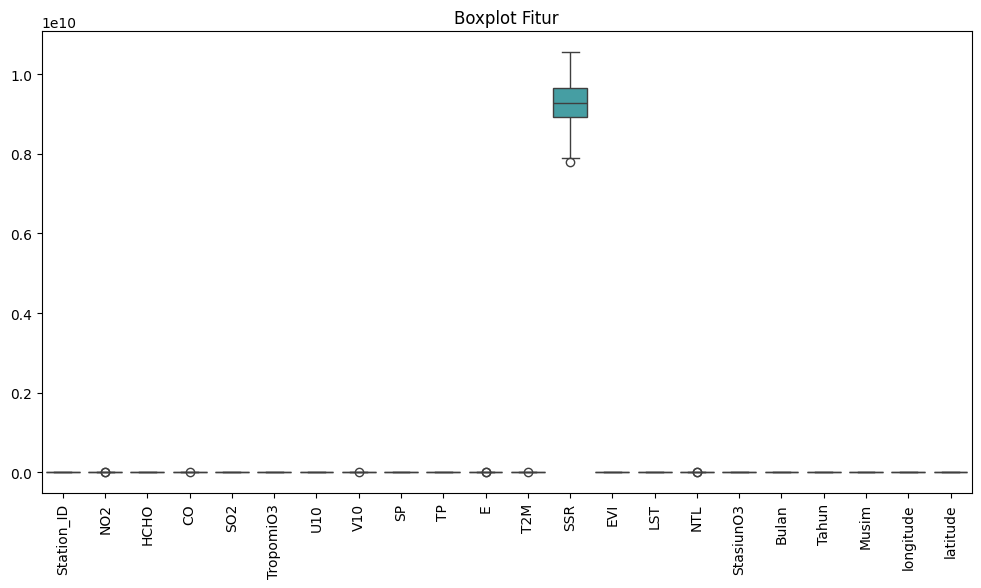

Data without outliers saved to '/content/drive/MyDrive/PENGOLAHAN/DATA/EKTRAKSI PIKSEL/Hasil Ekstraksi/Ekstraksi Stasiun/Data_clean2.csv'


In [ ]:
# Pilih kolom numerik yang mau dibersihkan
numeric_cols = ['NO2', 'HCHO', 'CO', 'SO2', 'TropomiO3', 'U10', 'V10', 'SP', 'TP', 'E', 'T2M', 'SSR', 'EVI', 'LST', 'NTL', 'StasiunO3']

df_clean = df.copy()

# Hapus outlier
df_clean = remove_outliers_iqr(df_clean, numeric_cols)

print(f"Jumlah data setelah menghapus outlier: {len(df_clean)} baris")

# Deteksi Outlier
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_clean)
plt.xticks(rotation=90)
plt.title("Boxplot Fitur")
plt.show()

# Save the filtered data to a new CSV file
df_clean.to_csv('/content/drive/MyDrive/PENGOLAHAN/DATA/EKTRAKSI PIKSEL/Hasil Ekstraksi/Ekstraksi Stasiun/Data_clean2.csv', index=False)
print(f"Data without outliers saved to '/content/drive/MyDrive/PENGOLAHAN/DATA/EKTRAKSI PIKSEL/Hasil Ekstraksi/Ekstraksi Stasiun/Data_clean2.csv'")


In [ ]:
# Cek fitur kategorikal
categorical_columns = X.select_dtypes(include='object').columns
if len(categorical_columns) > 0:
    print("\nFitur kategorikal ditemukan:", categorical_columns)
    X = pd.get_dummies(X, columns=categorical_columns)

In [ ]:
file_path = '/content/drive/MyDrive/PENGOLAHAN/DATA/EKTRAKSI PIKSEL/Hasil Ekstraksi/Ekstraksi Stasiun/Data_clean.csv'  # Ganti dengan path file CSV kamu
numerical_columns = ['NO2', 'HCHO', 'CO', 'SO2', 'TropomiO3', 'U10', 'V10', 'SP', 'TP', 'E', 'T2M', 'SSR', 'EVI', 'LST', 'NTL', 'StasiunO3']

df = pd.read_csv(file_path)
desc_stats = df.describe()

print("Statistik Deskriptif:")
print(df.describe())

Statistik Deskriptif:
       Station_ID         NO2        HCHO          CO         SO2   TropomiO3  \
count  121.000000  121.000000  121.000000  121.000000  121.000000  121.000000   
mean     3.099174    0.485193    0.870340   95.119567    0.801896  554.292483   
std      1.410703    0.193865    0.217058   11.023574    0.623224   16.198326   
min      1.000000    0.132907    0.371623   71.721161    0.048195  524.475708   
25%      2.000000    0.349943    0.712073   87.530754    0.268560  540.667419   
50%      3.000000    0.475117    0.895976   93.563789    0.690857  552.988464   
75%      4.000000    0.588294    1.036597  100.822838    1.220404  567.334168   
max      5.000000    0.994135    1.290965  131.110855    2.611879  582.986145   

              U10         V10             SP          TP  ...           SSR  \
count  121.000000  121.000000     121.000000  121.000000  ...  1.210000e+02   
mean     0.361165    0.042524  100454.749636    2.408990  ...  9.376682e+09   
std      1.